In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# Đồ án cuối kỳ: Trích xuất thông tin hô hấp từ tín hiệu Quang thể tích đồ (PPG) bằng mô hình Corr-encoder

## Mục tiêu
Xây dựng và đánh giá một mô hình học sâu để trích xuất thông tin hô hấp từ tín hiệu quang thể tích đồ (PPG), sử dụng kiến trúc corr-encoder dựa trên bộ tự mã hóa tích chập (convolutional autoencoder).


## Kiến thức nền tảng
Đồ án yêu cầu kiến thức về:
- Xử lý tín hiệu y sinh học
- Mạng nơ-ron tích chập (CNN)
- Kiến trúc autoencoder
- Ngôn ngữ lập trình Python và các thư viện (PyTorch, NumPy, SciPy, Matplotlib)

### Phần 1: Nghiên cứu lý thuyết (20%)
#### 1.1 Tìm hiểu về quang thể tích đồ (PPG) và ý nghĩa y sinh học
**Nguyên lý hoạt động của PPG**
Photoplethysmography (PPG) là một phương pháp đo lường không xâm lấn, sử dụng ánh sáng để phát hiện sự thay đổi thể tích máu trong mô ngoại vi, thường là ở đầu ngón tay hoặc dái tai. Tín hiệu PPG bao gồm hai thành phần chính:​

+ Thành phần AC: Biến thiên theo nhịp tim, phản ánh sự thay đổi thể tích máu do hoạt động co bóp của tim.

+ Thành phần DC: Phản ánh các yếu tố chậm hơn như trương lực mạch máu và lưu lượng máu nền.​

Sóng PPG nhạy cảm với các thay đổi sinh lý, bao gồm cả nhịp thở, do đó có thể được sử dụng để ước tính nhịp thở.

**Cơ chế mã hóa thông tin hô hấp trong tín hiệu PPG**
Bài báo của Meredith et al. trình bày ba cơ chế chính mà qua đó thông tin hô hấp được mã hóa trong tín hiệu PPG:​

+ Biến đổi cường độ (Baseline Wander): Sự thay đổi áp suất trong lồng ngực khi hít vào và thở ra ảnh hưởng đến hồi lưu tĩnh mạch và thể tích máu, dẫn đến dao động chậm trong đường cơ sở của tín hiệu PPG.​

+ Biến đổi biên độ xung (Amplitude Modulation - AM): Hô hấp gây ra thay đổi trong thể tích tâm thu và áp lực mạch, dẫn đến biến thiên biên độ của các đỉnh sóng PPG.​

+ Biến đổi khoảng xung (Frequency Modulation - FM): Hiện tượng loạn nhịp xoang hô hấp (RSA) làm thay đổi khoảng cách giữa các đỉnh sóng PPG, phản ánh sự thay đổi nhịp tim theo chu kỳ hô hấp.​

Các cơ chế này cho phép trích xuất thông tin về nhịp thở từ tín hiệu PPG.

**Hạn chế và thách thức của PPG trong đo lường hô hấp**
Mặc dù PPG là một công cụ hữu ích để ước tính nhịp thở, nhưng nó cũng gặp phải một số hạn chế:​

+ Độ nhạy với chuyển động: Tín hiệu PPG dễ bị nhiễu do chuyển động của bệnh nhân, đặc biệt trong môi trường lâm sàng.

+ Chất lượng tín hiệu: Tín hiệu PPG có thể bị suy giảm do tư thế, nhiệt độ da, hoặc lưu lượng máu ngoại vi kém.

+ Phụ thuộc vào vị trí đo: Khả năng phát hiện thông tin hô hấp từ PPG có thể thay đổi tùy thuộc vào vị trí cảm biến (ngón tay, tai, trán, v.v.).​

Do đó, cần có các phương pháp xử lý tín hiệu và thuật toán mạnh mẽ để đảm bảo độ chính xác trong ước tính nhịp thở.

#### 1.2 Tìm hiểu về Capnography và vai trò làm tiêu chuẩn vàng
​Capnography là phương pháp theo dõi nồng độ hoặc áp suất riêng phần của carbon dioxide (CO₂) trong khí thở ra, cung cấp thông tin quan trọng về tình trạng hô hấp của bệnh nhân. Dưới đây là tổng quan chi tiết về nguyên lý hoạt động, đặc điểm của dạng sóng capnogram và lý do capnography được coi là tiêu chuẩn vàng trong theo dõi hô hấp.

**Nguyên lý đo lường nồng độ CO₂ theo thời gian trong hơi thở**

Capnography hoạt động dựa trên nguyên lý hấp thụ tia hồng ngoại của khí CO₂. Khi bệnh nhân thở ra, khí CO₂ trong hơi thở hấp thụ tia hồng ngoại, và thiết bị đo sẽ ghi nhận mức độ hấp thụ này để xác định nồng độ CO₂ theo thời gian. Có hai phương pháp lấy mẫu chính:​

+ Mainstream: Cảm biến được đặt trực tiếp trên đường thở của bệnh nhân.

+ Sidestream: Một lượng nhỏ khí thở ra được hút vào thiết bị để phân tích.​

Phương pháp này cho phép theo dõi liên tục và không xâm lấn nồng độ CO₂ trong khí thở ra, đặc biệt hữu ích trong các tình huống lâm sàng như gây mê, hồi sức và cấp cứu.​

**Đặc điểm của dạng sóng capnogram và ý nghĩa y học**
Dạng sóng capnogram điển hình gồm bốn pha:​

+ Pha I (Đường cơ sở): Đại diện cho khí hít vào, nồng độ CO₂ gần như bằng 0.

+ Pha II (Dốc lên): Bắt đầu thở ra, khí CO₂ từ phế nang bắt đầu xuất hiện.

+ Pha III (Plateau): Giai đoạn thở ra ổn định, nồng độ CO₂ đạt mức cao nhất.

+ Pha 0 (Dốc xuống): Bắt đầu hít vào, nồng độ CO₂ giảm về 0.

Một số đặc điểm quan trọng:​

+ ETCO₂ (End-Tidal CO₂): Nồng độ CO₂ tại cuối kỳ thở ra, bình thường khoảng 35–45 mmHg.

+ Góc alpha: Góc giữa pha II và III, phản ánh tốc độ thở ra.

+ Góc beta: Góc giữa pha III và 0, liên quan đến sự bắt đầu của hít vào.​

Dạng sóng capnogram cung cấp thông tin về hiệu quả thông khí, tuần hoàn và chuyển hóa của bệnh nhân. Ví dụ, dạng sóng "vây cá mập" với pha III dốc lên có thể chỉ ra tình trạng tắc nghẽn đường thở như trong bệnh phổi tắc nghẽn mạn tính (COPD) hoặc hen suyễn. ​

**Lý do capnography được sử dụng làm tham chiếu tiêu chuẩn vàng**

+ Tín hiệu CO₂ rõ ràng và đặc hiệu:
Capnography đo trực tiếp nồng độ khí CO₂ – một chất chỉ hiện diện trong khí thở ra. Điều này giúp phân biệt tín hiệu hô hấp một cách rõ ràng, ít bị lẫn với nhiễu từ các yếu tố môi trường hoặc chuyển động.

+ Ít bị ảnh hưởng bởi chuyển động cơ thể:
Vì cảm biến thường được tích hợp trực tiếp trong hệ thống hô hấp (ống nội khí quản, mặt nạ), capnography ít bị nhiễu từ cử động của bệnh nhân – điều mà các phương pháp như PPG rất nhạy cảm.

+ Đặc trưng dạng sóng rõ ràng:
Dạng sóng capnogram có hình dạng gần như vuông với các pha rõ rệt, dễ nhận diện các bất thường, và dễ lọc nhiễu trong phân tích tín hiệu.

+ Hạn chế can thiệp môi trường:
Không phụ thuộc vào ánh sáng ngoài, mạch máu ngoại vi hay màu da, do đó ít bị nhiễu hơn so với các công nghệ như photoplethysmography (PPG).




#### 1.3 Nghiên cứu về kiến trúc autoencoder và ứng dụng của nó cho tín hiệu sinh học

**Nguyên lý hoạt động của Autoencoder**

Autoencoder là một kiến trúc học sâu không giám sát, hoạt động qua hai bước:

+ Encoder: Nén đầu vào thành một không gian tiềm ẩn (latent space), giữ lại các đặc trưng quan trọng.
+ Decoder: Tái tạo đầu ra từ không gian tiềm ẩn, với mục tiêu là giống với đầu vào ban đầu.


### Phần 2: Xử lý và phân tích dữ liệu (15%)


#### 2.1 Tìm hiểu về bộ dữ liệu Capnobase và BIDMC

**CapnoBase Dataset**

Số lượng đối tượng: 42 người, gồm 29 trẻ em và 13 người lớn

Thời gian ghi: Mỗi đối tượng có một đoạn ghi kéo dài 8 phút
Tín hiệu thu thập:
- PPG (Photoplethysmogram)
- ECG (Electrocardiogram)
- Capnography (CO₂) – dùng làm tín hiệu hô hấp tham chiếu

Phạm vi tần số hô hấp: Từ dưới 10 đến trên 40 nhịp/phút
Tần số lấy mẫu : 300HZ
Bối cảnh thu thập: Trong môi trường phẫu thuật chọn lọc và gây mê định kỳ, với chất lượng tín hiệu cao và ít nhiễu ​

**BIDMC Dataset**

Số lượng đối tượng: 53 bệnh nhân người lớn (tuổi từ 19 đến trên 90)

Thời gian ghi: Mỗi bản ghi kéo dài 8 phút

Tín hiệu thu thập:

- PPG

- ECG

- RESP – tín hiệu hô hấp từ phế phong kế trở kháng (impedance pneumography)

Tần số lấy mẫu: 125 Hz

Phạm vi tần số hô hấp: Từ 5 đến 25 nhịp/phút

Bối cảnh thu thập: Tại các khoa hồi sức tích cực (ICU) của Bệnh viện Beth Israel Deaconess Medical Center, với bệnh nhân nặng và tín hiệu thường xuyên bị nhiễu





#### 2.2 Xử lý dữ liệu PPG Bộ Capnobase

- Trực quan hóa dữ liệu

In [ ]:
import pandas as pd
import glob
import os
import numpy as np
from scipy.signal import resample
import matplotlib.pyplot as plt

In [ ]:
folder_path = "/content/drive/MyDrive/dataIOT/CapnoBase IEEE TBME Respiratory Rate Benchmark/dataverse_files/data/csv"
csv_files = glob.glob(os.path.join(folder_path, "*_8min_signal.csv"))
df_list = []

for file in csv_files:
    df = pd.read_csv(file)
    df['file_name'] = os.path.basename(file)
    df_list.append(df)

print(f" Số bản ghi : {len(df_list)}")

 Số bản ghi : 42


In [ ]:
ppg_record = np.array([item['pleth_y'].values for item in df_list])
capno_record = np.array([item['co2_y'].values for item in df_list])

In [ ]:
print(len(ppg_record))
print(len(capno_record))

42
42


In [ ]:
def resample_signal(signal,original_fs = 300,target_fs = 30):

  num_samples = int(len(signal) * target_fs / original_fs)
  resampled_signal = resample(signal, num_samples)
  return resampled_signal

In [ ]:
ppg_record_resample = np.array([resample_signal(item) for item in ppg_record])
capno_record_resample = np.array([resample_signal(item) for item in capno_record])

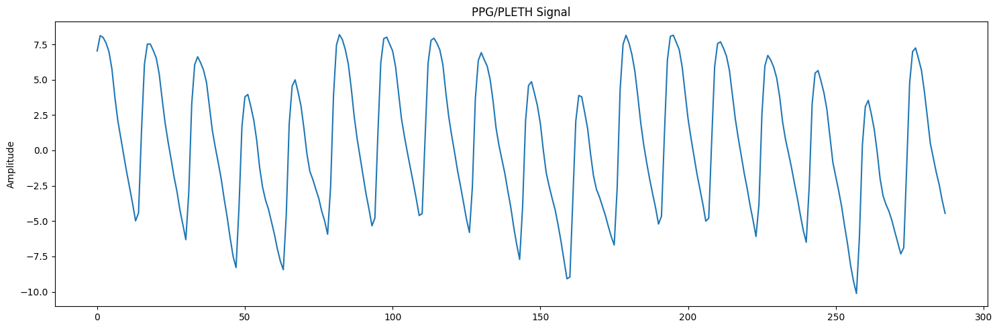

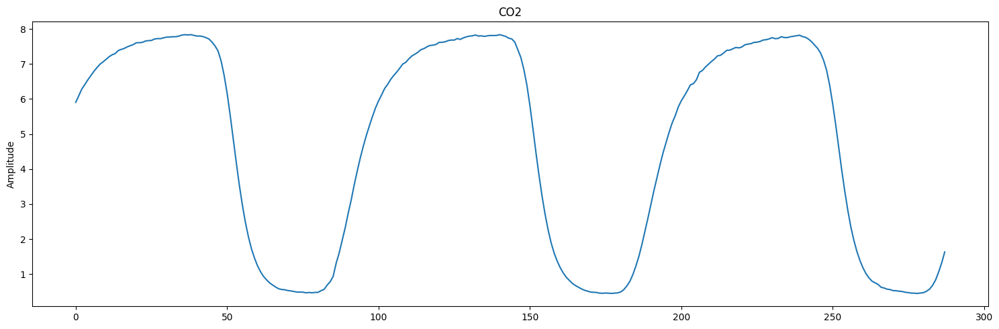

In [ ]:
sample = int(30*9.6)
plt.figure(figsize=(15,5))
plt.plot(ppg_record_resample[0][:sample])
plt.title('PPG/PLETH Signal')
plt.ylabel('Amplitude')
plt.tight_layout()

plt.figure(figsize=(15,5))
plt.plot(capno_record_resample[0][:sample])
plt.title('CO2')
plt.ylabel('Amplitude')

plt.tight_layout()
plt.show()


* Tiền xử lý

In [ ]:
output_base_path = 'drive/MyDrive/KQCK'
preprocess = os.path.join(output_base_path, 'preprocessing')
# Tạo thư mục nếu chưa tồn tại
os.makedirs(preprocess, exist_ok=True)

In [ ]:
#Định nghĩa các hàm
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import butter, filtfilt

# Hàm lọc thông cao Butterworth
def butter_highpass(cutoff, fs, order=5):
    nyq = 0.5 * fs
    normal_cutoff = cutoff / nyq
    b, a = butter(order, normal_cutoff, btype='high', analog=False)
    return b, a

def highpass_filter(data, cutoff, fs, order=5):
    b, a = butter_highpass(cutoff, fs, order=order)
    y = filtfilt(b, a, data)
    return y
def normalize_signal(signal, min_val=-1, max_val=1):
    signal_min = np.min(signal)
    signal_max = np.max(signal)
    normalized = min_val + (signal - signal_min) * (max_val - min_val) / (signal_max - signal_min)
    return normalized

In [ ]:
fs = 30
cutoff = 0.1
ppg_filtered = np.array([highpass_filter(item,cutoff,fs) for item in ppg_record_resample])

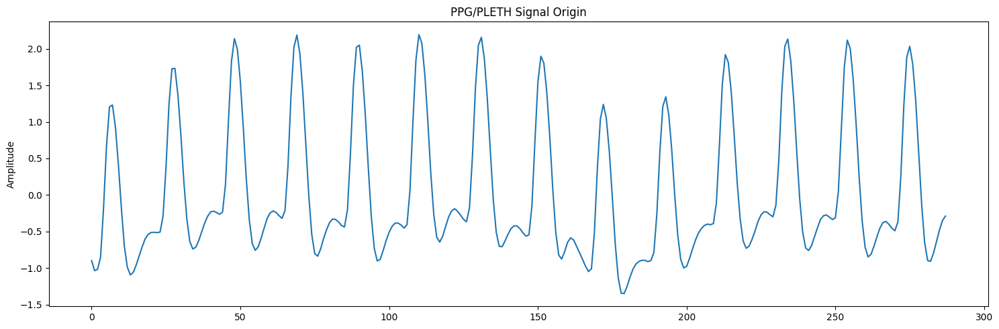

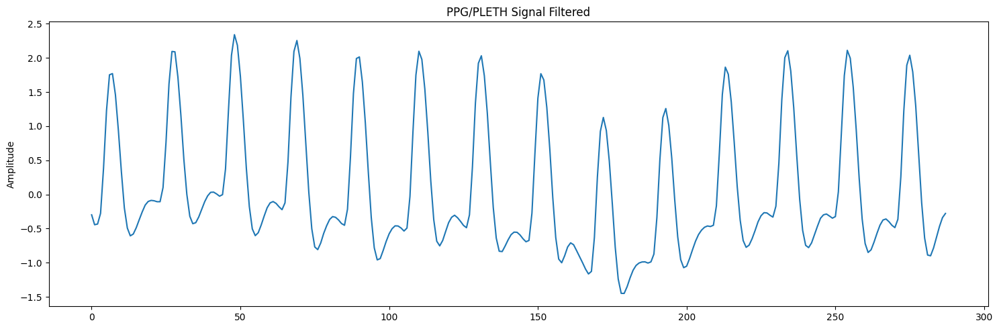

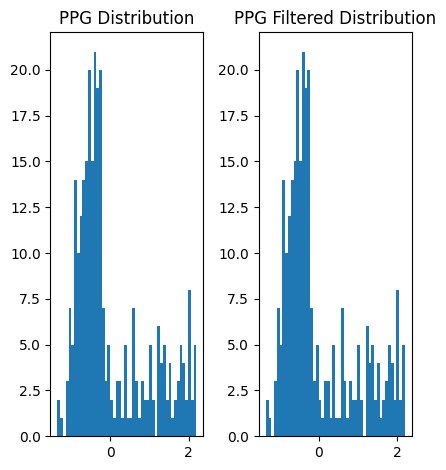

In [ ]:
sample = int(30*9.6)
plt.figure(figsize=(15,5))
plt.plot(ppg_record_resample[2][:sample])
plt.title('PPG/PLETH Signal Origin')
plt.ylabel('Amplitude')
plt.tight_layout()

plt.figure(figsize=(15,5))
plt.plot(ppg_filtered[2][:sample])
plt.title('PPG/PLETH Signal Filtered')
plt.ylabel('Amplitude')

plt.tight_layout()
plt.show()
plt.figure()

plt.subplot(131)
plt.hist(ppg_record_resample[2][:sample], bins=50)
plt.title('PPG Distribution')

plt.subplot(132)
plt.hist(ppg_record_resample[2][:sample], bins=50)
plt.title('PPG Filtered Distribution')

plt.tight_layout()
plt.show()


In [ ]:
window_size = int(fs*9.6)

In [ ]:
ppg_record_resample.shape

(42, 14400)

In [ ]:
capno_record_resample.shape

(42, 14400)

In [ ]:
precoss = []
for i in range(len(ppg_record_resample)):
  ppg_segments = []
  capno_segments = []
  for j in range(0, len(ppg_filtered[i]) - window_size + 1, window_size):
    ppg_segments.append(normalize_signal(ppg_filtered[i][j:j+window_size],-1,1))
    capno_segments.append(normalize_signal(capno_record_resample[i][j:j+window_size],0,1))
  subject_data = {
        'id': i,
        'ppg_segments': np.array(ppg_segments),     # ✅ chuyển thành np.ndarray
        'capno_segments': np.array(capno_segments)  # ✅
    }
  precoss.append(subject_data)

In [ ]:
ids = [subject['id'] for subject in precoss]
print(ids)

[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41]


In [ ]:
ppgs = [subject['ppg_segments'].shape for subject in precoss]
print(ppgs)
print(len(ppgs))

[(50, 288), (50, 288), (50, 288), (50, 288), (50, 288), (50, 288), (50, 288), (50, 288), (50, 288), (50, 288), (50, 288), (50, 288), (50, 288), (50, 288), (50, 288), (50, 288), (50, 288), (50, 288), (50, 288), (50, 288), (50, 288), (50, 288), (50, 288), (50, 288), (50, 288), (50, 288), (50, 288), (50, 288), (50, 288), (50, 288), (50, 288), (50, 288), (50, 288), (50, 288), (50, 288), (50, 288), (50, 288), (50, 288), (50, 288), (50, 288), (50, 288), (50, 288)]
42


In [ ]:
co2s = [subject['capno_segments'].shape for subject in precoss]
print(co2s)
print(len(co2s))

[(50, 288), (50, 288), (50, 288), (50, 288), (50, 288), (50, 288), (50, 288), (50, 288), (50, 288), (50, 288), (50, 288), (50, 288), (50, 288), (50, 288), (50, 288), (50, 288), (50, 288), (50, 288), (50, 288), (50, 288), (50, 288), (50, 288), (50, 288), (50, 288), (50, 288), (50, 288), (50, 288), (50, 288), (50, 288), (50, 288), (50, 288), (50, 288), (50, 288), (50, 288), (50, 288), (50, 288), (50, 288), (50, 288), (50, 288), (50, 288), (50, 288), (50, 288)]
42


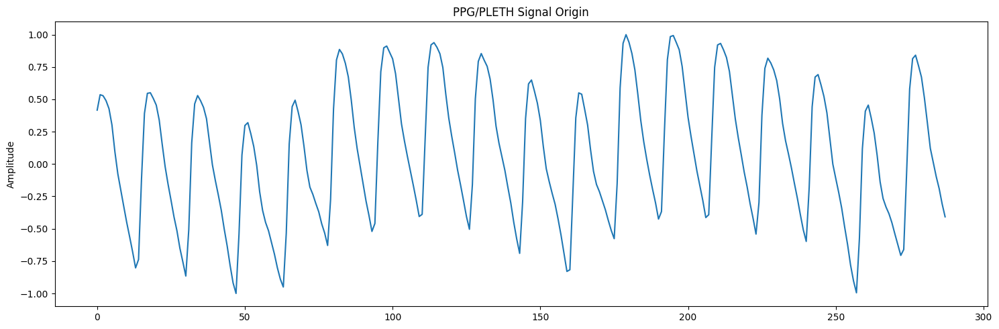

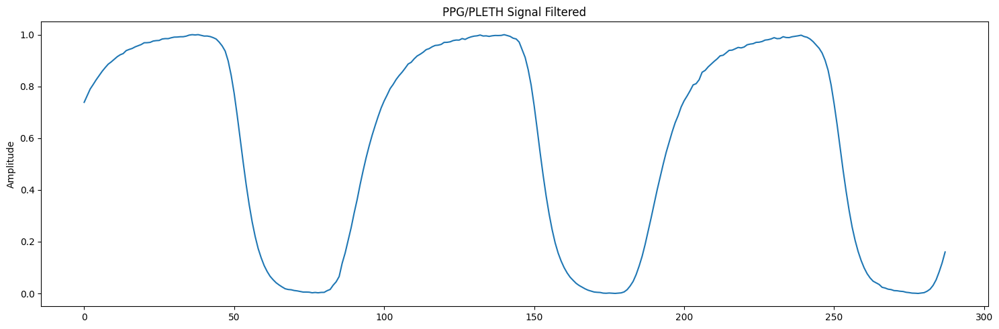

In [ ]:
sub = precoss[0]
plt.figure(figsize=(15,5))
plt.plot(sub["ppg_segments"][0])
plt.title('PPG/PLETH Signal Origin')
plt.ylabel('Amplitude')
plt.tight_layout()

plt.figure(figsize=(15,5))
plt.plot(sub["capno_segments"][0])
plt.title('PPG/PLETH Signal Filtered')
plt.ylabel('Amplitude')

plt.tight_layout()
plt.show()

In [ ]:
import pickle
# Lưu
with open(f'{preprocess}/precoss_9_6.pkl', 'wb') as f:
    pickle.dump(precoss, f)
    print(f'Save success! {preprocess}/precoss_9_6.pkl')

Save success! drive/MyDrive/KQCK/preprocessing/precoss_9_6.pkl


#### 2.3 Xử lý dữ liệu PPG Bộ BIDMC

- Trực quan hóa dữ liệu

In [ ]:
import pandas as pd
import glob
import os
import numpy as np
from scipy.signal import resample
import matplotlib.pyplot as plt

In [ ]:
folder_path = "drive/MyDrive/dataIOT/BIDMC_data/bidmc-ppg-and-respiration-dataset-1.0.0/bidmc_csv"
csv_files = glob.glob(os.path.join(folder_path, "*Signals.csv"))
df_list = []

for file in csv_files:
    df = pd.read_csv(file)
    df['file_name'] = os.path.basename(file)
    df_list.append(df)

print(f" Số bản ghi : {len(df_list)}")

 Số bản ghi : 53


In [ ]:
df_list[0].head()

,Time [s],RESP,II,V,AVR,PLETH,file_name
0,0.000,0.54034,-0.12500,0.75098,0.98047,0.59531,bidmc_51_Signals.csv
1,0.008,0.54523,-0.11914,0.74118,0.96875,0.57967,bidmc_51_Signals.csv
2,0.016,0.55012,-0.11523,0.75098,0.97461,0.56403,bidmc_51_Signals.csv
3,0.024,0.55501,-0.10938,0.75098,0.96875,0.54839,bidmc_51_Signals.csv
4,0.032,0.55990,-0.11523,0.75098,0.96875,0.53568,bidmc_51_Signals.csv


In [ ]:
df_list[0].columns

Index(['Time [s]', ' RESP', ' II', ' V', ' AVR', ' PLETH', 'file_name'], dtype='object')

In [ ]:
ppg_record = np.array([item[' PLETH'].values for item in df_list])
capno_record = np.array([item[' RESP'].values for item in df_list])

In [ ]:
print(len(ppg_record))
print(len(capno_record))

53
53


In [ ]:
def resample_signal(signal,original_fs = 125,target_fs = 30):
  num_samples = int(len(signal) * target_fs / original_fs)
  resampled_signal = resample(signal, num_samples)
  return resampled_signal

In [ ]:
ppg_record_resample = np.array([resample_signal(item,125,30) for item in ppg_record])
capno_record_resample = np.array([resample_signal(item,125,30) for item in capno_record])

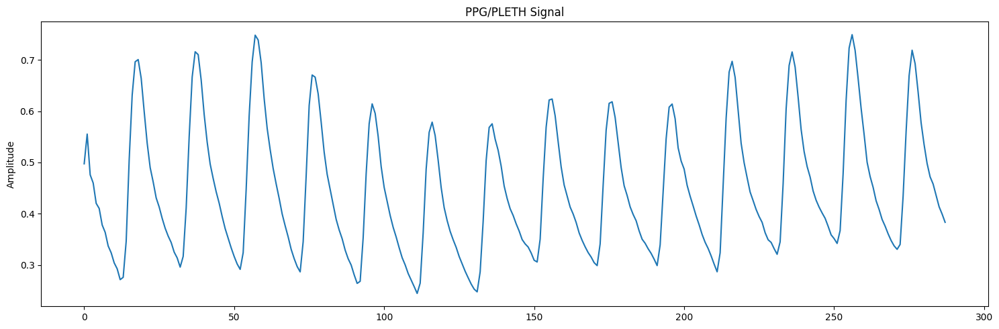

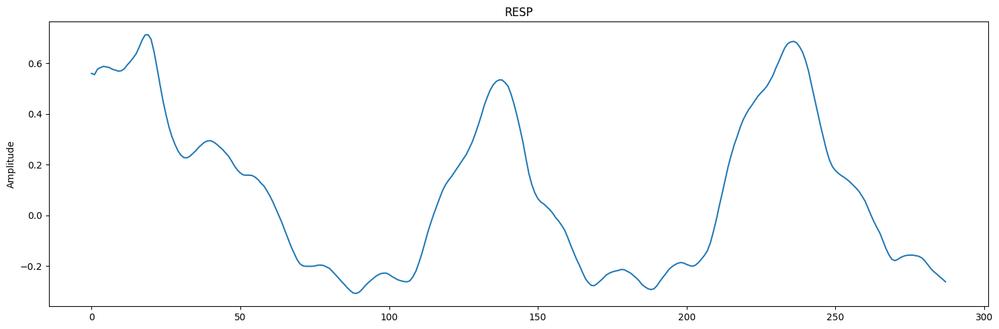

In [ ]:
sample = int(30*9.6)
plt.figure(figsize=(15,5))
plt.plot(ppg_record_resample[0][:sample])
plt.title('PPG/PLETH Signal')
plt.ylabel('Amplitude')
plt.tight_layout()

plt.figure(figsize=(15,5))
plt.plot(capno_record_resample[0][:sample])
plt.title('RESP')
plt.ylabel('Amplitude')

plt.tight_layout()
plt.show()


* Tiền xử lý

In [ ]:
output_base_path = 'drive/MyDrive/KQCK'
preprocess = os.path.join(output_base_path, 'preprocessing')
# Tạo thư mục nếu chưa tồn tại
os.makedirs(preprocess, exist_ok=True)

In [ ]:
#Định nghĩa các hàm
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import butter, filtfilt

# Hàm lọc thông cao Butterworth
def butter_highpass(cutoff, fs, order=5):
    nyq = 0.5 * fs
    normal_cutoff = cutoff / nyq
    b, a = butter(order, normal_cutoff, btype='high', analog=False)
    return b, a

def highpass_filter(data, cutoff, fs, order=5):
    b, a = butter_highpass(cutoff, fs, order=order)
    y = filtfilt(b, a, data)
    return y
def normalize_signal(signal, min_val=-1, max_val=1):
    signal_min = np.min(signal)
    signal_max = np.max(signal)
    normalized = min_val + (signal - signal_min) * (max_val - min_val) / (signal_max - signal_min)
    return normalized

In [ ]:
fs = 30
cutoff = 0.1
ppg_filtered = np.array([highpass_filter(item,cutoff,fs) for item in ppg_record_resample])

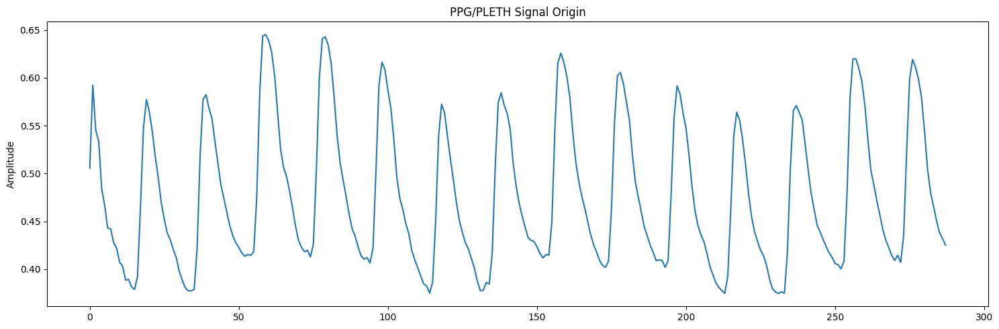

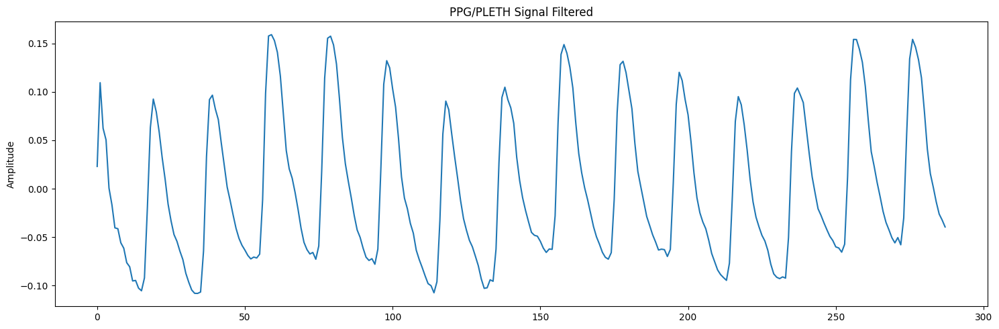

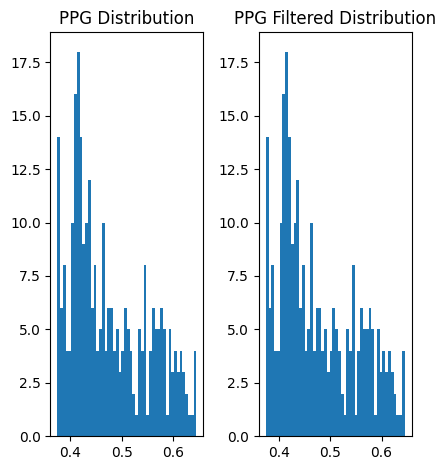

In [ ]:
sample = int(30*9.6)
plt.figure(figsize=(15,5))
plt.plot(ppg_record_resample[2][:sample])
plt.title('PPG/PLETH Signal Origin')
plt.ylabel('Amplitude')
plt.tight_layout()

plt.figure(figsize=(15,5))
plt.plot(ppg_filtered[2][:sample])
plt.title('PPG/PLETH Signal Filtered')
plt.ylabel('Amplitude')

plt.tight_layout()
plt.show()
plt.figure()

plt.subplot(131)
plt.hist(ppg_record_resample[2][:sample], bins=50)
plt.title('PPG Distribution')

plt.subplot(132)
plt.hist(ppg_record_resample[2][:sample], bins=50)
plt.title('PPG Filtered Distribution')

plt.tight_layout()
plt.show()

In [ ]:
window_size = int(fs*9.6)

In [ ]:
ppg_record_resample.shape

(53, 14400)

In [ ]:
capno_record_resample.shape

(53, 14400)

In [ ]:
precoss = []
for i in range(len(ppg_record_resample)):
  ppg_segments = []
  capno_segments = []
  for j in range(0, len(ppg_filtered[i]) - window_size + 1, window_size):
    ppg_segments.append(normalize_signal(ppg_filtered[i][j:j+window_size],-1,1))
    capno_segments.append(normalize_signal(capno_record_resample[i][j:j+window_size],0,1))
  subject_data = {
        'id': i,
        'ppg_segments': np.array(ppg_segments),     # ✅ chuyển thành np.ndarray
        'capno_segments': np.array(capno_segments)  # ✅
    }
  precoss.append(subject_data)

In [ ]:
ids = [subject['id'] for subject in precoss]
print(ids)

[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52]


In [ ]:
ppgs = [subject['ppg_segments'].shape for subject in precoss]
print(ppgs)
print(len(ppgs))

[(50, 288), (50, 288), (50, 288), (50, 288), (50, 288), (50, 288), (50, 288), (50, 288), (50, 288), (50, 288), (50, 288), (50, 288), (50, 288), (50, 288), (50, 288), (50, 288), (50, 288), (50, 288), (50, 288), (50, 288), (50, 288), (50, 288), (50, 288), (50, 288), (50, 288), (50, 288), (50, 288), (50, 288), (50, 288), (50, 288), (50, 288), (50, 288), (50, 288), (50, 288), (50, 288), (50, 288), (50, 288), (50, 288), (50, 288), (50, 288), (50, 288), (50, 288), (50, 288), (50, 288), (50, 288), (50, 288), (50, 288), (50, 288), (50, 288), (50, 288), (50, 288), (50, 288), (50, 288)]
53


In [ ]:
co2s = [subject['capno_segments'].shape for subject in precoss]
print(co2s)
print(len(co2s))

[(50, 288), (50, 288), (50, 288), (50, 288), (50, 288), (50, 288), (50, 288), (50, 288), (50, 288), (50, 288), (50, 288), (50, 288), (50, 288), (50, 288), (50, 288), (50, 288), (50, 288), (50, 288), (50, 288), (50, 288), (50, 288), (50, 288), (50, 288), (50, 288), (50, 288), (50, 288), (50, 288), (50, 288), (50, 288), (50, 288), (50, 288), (50, 288), (50, 288), (50, 288), (50, 288), (50, 288), (50, 288), (50, 288), (50, 288), (50, 288), (50, 288), (50, 288), (50, 288), (50, 288), (50, 288), (50, 288), (50, 288), (50, 288), (50, 288), (50, 288), (50, 288), (50, 288), (50, 288)]
53


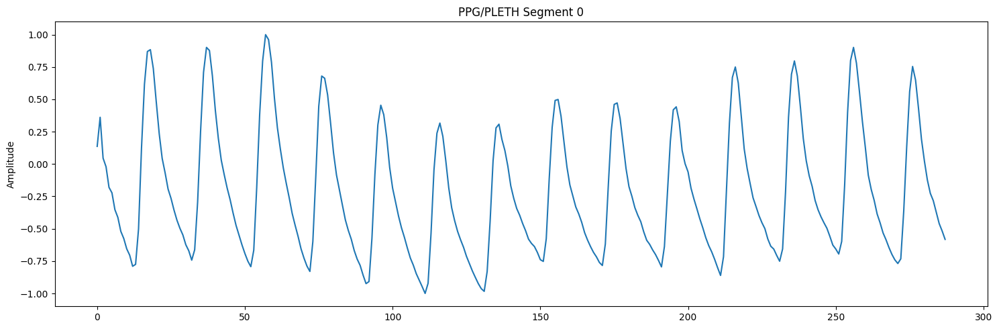

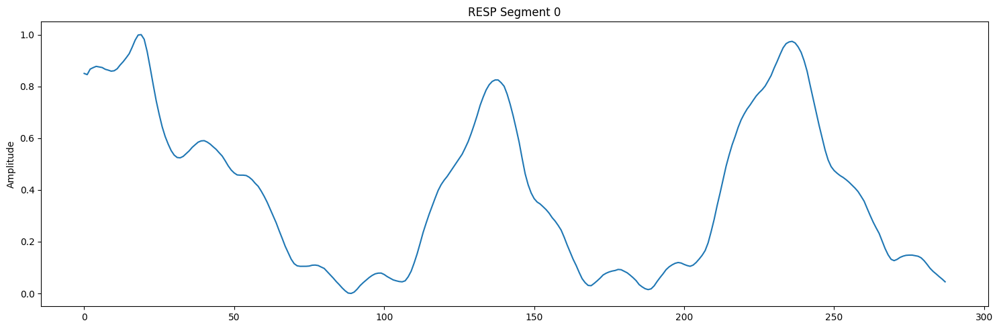

In [ ]:
sub = precoss[0]
plt.figure(figsize=(15,5))
plt.plot(sub["ppg_segments"][0])
plt.title('PPG/PLETH Segment 0')
plt.ylabel('Amplitude')
plt.tight_layout()

plt.figure(figsize=(15,5))
plt.plot(sub["capno_segments"][0])
plt.title('RESP Segment 0')
plt.ylabel('Amplitude')

plt.tight_layout()
plt.show()

In [ ]:
import pickle
# Lưu
with open(f'{preprocess}/precoss_bidmc.pkl', 'wb') as f:
    pickle.dump(precoss, f)
    print(f'Save success! {preprocess}/precoss_bidmc.pkl')

Save success! drive/MyDrive/KQCK/preprocessing/precoss_bidmc.pkl


#### 2.4 Phân chia dữ liệu theo phương pháp leave-one-subject-out

In [ ]:
# Thiết lập hàm chia dữ liệu cho Leave-One-Subject-Out Cross-Validation
def leave_one_subject_out(subjects_data, test_subject_idx):
    train_ppg = []
    train_capno = []
    test_ppg = []
    test_capno = []
    for i, subject in enumerate(subjects_data):
        if i == test_subject_idx:
            # Dữ liệu kiểm tra
            test_ppg.extend(subject['ppg_segments'])
            test_capno.extend(subject['capno_segments'])
        else:
            # Dữ liệu huấn luyện
            train_ppg.extend(subject['ppg_segments'])
            train_capno.extend(subject['capno_segments'])

    return np.array(train_ppg), np.array(train_capno), np.array(test_ppg), np.array(test_capno)

In [ ]:
# Sử dụng cho lần thực hiện đầu tiên (kiểm tra trên đối tượng 0)
train_ppg, train_capno, test_ppg, test_capno = leave_one_subject_out(precoss, 0)

In [ ]:
print(test_ppg.shape)
print(test_capno.shape)

(50, 288)
(50, 288)


In [ ]:
print(train_ppg.shape)
print(train_capno.shape)

(2600, 288)
(2600, 288)


### Phần 3: Thiết kế và xây dựng mô hình corr-encoder (25%)

In [ ]:
output_base_path = 'drive/MyDrive/KQCK'
model_path = os.path.join(output_base_path, 'model')
# Tạo thư mục nếu chưa tồn tại
os.makedirs(model_path, exist_ok=True)

#### 3.1 Xây dựng kiến trúc mạng nơ-ron

In [ ]:
import torch
import torch.nn as nn

class CorrEncoder(nn.Module):
    def __init__(self):
        super(CorrEncoder, self).__init__()

        self.encoder = nn.Sequential(
            # Lớp 1: Conv1d với 8 nhân kích thước 150
            nn.Conv1d(in_channels=1, out_channels=8, kernel_size=150, padding=20),
            nn.ReLU(),
            nn.Dropout(0.5),

            # Lớp 2: Conv1d với 8 nhân kích thước 75
            nn.Conv1d(in_channels=8, out_channels=8, kernel_size=75, padding=10),
            nn.ReLU(),
            nn.Dropout(0.5),

            # Lớp 3: Conv1d với 8 nhân kích thước 50
            nn.Conv1d(in_channels=8, out_channels=8, kernel_size=50, padding=0),
            nn.Sigmoid(),
            nn.Dropout(0.5)
        )

        # Bộ giải mã (Decoder)
        self.decoder = nn.Sequential(
            # Lớp 1: ConvTranspose1d với 8 nhân kích thước 50
            nn.ConvTranspose1d(in_channels=8, out_channels=8, kernel_size=50, padding=0),
            nn.Sigmoid(),

            # Lớp 2: ConvTranspose1d với 8 nhân kích thước 75
            nn.ConvTranspose1d(in_channels=8, out_channels=8, kernel_size=75, padding=10),
            nn.ReLU(),

            # Lớp 3: ConvTranspose1d với 8 nhân kích thước 150
            nn.ConvTranspose1d(in_channels=8, out_channels=1, kernel_size=150, padding=20),
            nn.ReLU()
        )

    def forward(self, x):
        # Reshape đầu vào để phù hợp với Conv1d (batch_size, channels, length)
        x = x.view(x.size(0), 1, -1)
        # Áp dụng encoder
        latent = self.encoder(x)
        # Áp dụng decoder
        output = self.decoder(latent)
        # Reshape lại kết quả
        output = output.view(output.size(0), -1)
        return output

In [ ]:
! pip install torchview

In [ ]:
model = CorrEncoder()
print(model)

CorrEncoder(
  (encoder): Sequential(
    (0): Conv1d(1, 8, kernel_size=(150,), stride=(1,), padding=(20,))
    (1): ReLU()
    (2): Dropout(p=0.5, inplace=False)
    (3): Conv1d(8, 8, kernel_size=(75,), stride=(1,), padding=(10,))
    (4): ReLU()
    (5): Dropout(p=0.5, inplace=False)
    (6): Conv1d(8, 8, kernel_size=(50,), stride=(1,))
    (7): Sigmoid()
    (8): Dropout(p=0.5, inplace=False)
  )
  (decoder): Sequential(
    (0): ConvTranspose1d(8, 8, kernel_size=(50,), stride=(1,))
    (1): Sigmoid()
    (2): ConvTranspose1d(8, 8, kernel_size=(75,), stride=(1,), padding=(10,))
    (3): ReLU()
    (4): ConvTranspose1d(8, 1, kernel_size=(150,), stride=(1,), padding=(20,))
    (5): ReLU()
  )
)


In [ ]:
! pip install torchinfo


In [ ]:
from torchinfo  import summary

model = CorrEncoder().cuda()
summary(model, input_size=(1, 1, 288))

Layer (type:depth-idx)                   Output Shape              Param #
CorrEncoder                              [1, 288]                  --
├─Sequential: 1-1                        [1, 8, 76]                --
│    └─Conv1d: 2-1                       [1, 8, 179]               1,208
│    └─ReLU: 2-2                         [1, 8, 179]               --
│    └─Dropout: 2-3                      [1, 8, 179]               --
│    └─Conv1d: 2-4                       [1, 8, 125]               4,808
│    └─ReLU: 2-5                         [1, 8, 125]               --
│    └─Dropout: 2-6                      [1, 8, 125]               --
│    └─Conv1d: 2-7                       [1, 8, 76]                3,208
│    └─Sigmoid: 2-8                      [1, 8, 76]                --
│    └─Dropout: 2-9                      [1, 8, 76]                --
├─Sequential: 1-2                        [1, 1, 288]               --
│    └─ConvTranspose1d: 2-10             [1, 8, 125]               3,208
│  

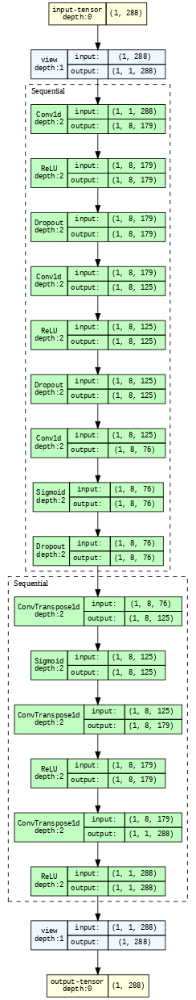

In [ ]:
from torchview import draw_graph
from IPython.display import Image
# Vẽ mô hình
graph = draw_graph(model, input_size=(1, int(9.6*30)), expand_nested=True)
graph.visual_graph.render("corr_encoder", format="png")
Image(filename="corr_encoder.png")

#### 3.2 Cài đặt hàm mất mát và thuật toán tối ưu

In [ ]:
class EarlyStopping:
    def __init__(self, patience=10, min_delta=0, verbose=False):
        self.patience = patience
        self.min_delta = min_delta
        self.verbose = verbose
        self.counter = 0
        self.best_loss = None
        self.early_stop = False

    def __call__(self, val_loss):
        if self.best_loss is None:
            self.best_loss = val_loss
        elif val_loss > self.best_loss - self.min_delta:
            self.counter += 1
            if self.verbose:
                print(f'EarlyStopping counter: {self.counter} out of {self.patience}')
            if self.counter >= self.patience:
                self.early_stop = True
        else:
            self.best_loss = val_loss
            self.counter = 0

early_stopping = EarlyStopping(patience=10, verbose=True)

#### 3.3 Huấn luyện và đánh giá mô hình

In [ ]:
#load data
import pickle

with open(f'{preprocess}/precoss_9_6.pkl', 'rb') as f:
    precoss = pickle.load(f)
    print('Load success!')

Load success!


In [ ]:
from torch.utils.data import TensorDataset, DataLoader
# Chuyển đổi dữ liệu thành tensor PyTorch
def numpy_to_torch(array):
    return torch.from_numpy(array).float()
def create_dataloader(train_ppg,test_ppg,train_capno,test_capno):
  train_ppg_torch = numpy_to_torch(train_ppg)
  train_capno_torch = numpy_to_torch(train_capno)
  train_dataset = TensorDataset(train_ppg_torch, train_capno_torch)
  train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)

  # Chuyển đổi dữ liệu kiểm tra
  test_ppg_torch = numpy_to_torch(test_ppg)
  test_capno_torch = numpy_to_torch(test_capno)
  test_dataset = TensorDataset(test_ppg_torch, test_capno_torch)
  test_loader = DataLoader(test_dataset, batch_size=32, shuffle=False)
  return train_loader,test_loader

In [ ]:
def train_model(model, train_loader, test_loader, criterion, optimizer,early_stopping ,num_epochs=80):
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    model.to(device)

    train_losses = []
    test_losses = []
    best_test_loss = float('inf')
    best_model_state = None

    for epoch in range(num_epochs):
        # Training
        model.train()
        train_loss = 0.0
        for ppg_batch, capno_batch in train_loader:
            ppg_batch, capno_batch = ppg_batch.to(device), capno_batch.to(device)

            # Forward pass
            outputs = model(ppg_batch)
            loss = criterion(outputs, capno_batch)

            # Backward pass và tối ưu hóa
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

            train_loss += loss.item() * ppg_batch.size(0)

        train_loss = train_loss / len(train_loader.dataset)
        train_losses.append(train_loss)

        # Testing
        model.eval()
        test_loss = 0.0
        with torch.no_grad():
            for ppg_batch, capno_batch in test_loader:
                ppg_batch, capno_batch = ppg_batch.to(device), capno_batch.to(device)

                # Forward pass
                outputs = model(ppg_batch)
                loss = criterion(outputs, capno_batch)

                test_loss += loss.item() * ppg_batch.size(0)

            test_loss = test_loss / len(test_loader.dataset)
            test_losses.append(test_loss)

        # Lưu mô hình tốt nhất
        if test_loss < best_test_loss:
            best_test_loss = test_loss
            best_model_state = model.state_dict().copy()

        # Kiểm tra early stopping
        early_stopping(test_loss)
        if early_stopping.early_stop:
            print(f"Early stopping at epoch {epoch+1}")
            break

        print(f'Epoch {epoch+1}/{num_epochs} - Train Loss: {train_loss:.4f}, Test Loss: {test_loss:.4f}')

    # Tải lại trạng thái tốt nhất của mô hình
    model.load_state_dict(best_model_state)

    return model, train_losses, test_losses

In [ ]:
def train_loso(subjects_data, model, criterion,optimizer,  num_epochs=80, batch_size=32):
    for test_idx in range(len(subjects_data)):
        print(f"\n🔁 LOSO Fold {test_idx + 1}/{len(subjects_data)}: Đang huấn luyện trên {len(subjects_data)} người, kiểm tra trên người thứ {test_idx+1}")

        # Chia dữ liệu
        train_ppg, train_capno, test_ppg, test_capno = leave_one_subject_out(subjects_data, test_idx)
        train_loader, test_loader = create_dataloader(train_ppg, test_ppg, train_capno, test_capno)

        early_stopping = EarlyStopping(patience=10, verbose=True)

        # Huấn luyện
        model, train_losses, val_losses = train_model(
            model, train_loader, test_loader, criterion, optimizer,early_stopping,
            num_epochs=num_epochs
        )
        plt.figure(figsize=(10, 5))
        plt.plot(train_losses, label='Training Loss', marker='o')
        plt.plot(val_losses, label='Validation Loss', marker='x')
        plt.xlabel('Epoch')
        plt.ylabel('Loss')
        plt.legend()
        plt.title(f'Fold {test_idx+1}/{len(subjects_data)}: Training and Validation Loss')
        plt.grid(True)
        plt.tight_layout()
        plt.show()

    return model

In [ ]:
model = CorrEncoder()
criterion = nn.MSELoss()
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)


🔁 LOSO Fold 1/42: Đang huấn luyện trên 42 người, kiểm tra trên người thứ 1
Epoch 1/80 - Train Loss: 0.1958, Test Loss: 0.1652
EarlyStopping counter: 1 out of 10
Epoch 2/80 - Train Loss: 0.1731, Test Loss: 0.1791
EarlyStopping counter: 2 out of 10
Epoch 3/80 - Train Loss: 0.1716, Test Loss: 0.1783
EarlyStopping counter: 3 out of 10
Epoch 4/80 - Train Loss: 0.1677, Test Loss: 0.1687
EarlyStopping counter: 4 out of 10
Epoch 5/80 - Train Loss: 0.1633, Test Loss: 0.1674
Epoch 6/80 - Train Loss: 0.1549, Test Loss: 0.1616
EarlyStopping counter: 1 out of 10
Epoch 7/80 - Train Loss: 0.1451, Test Loss: 0.1721
EarlyStopping counter: 2 out of 10
Epoch 8/80 - Train Loss: 0.1423, Test Loss: 0.1851
EarlyStopping counter: 3 out of 10
Epoch 9/80 - Train Loss: 0.1398, Test Loss: 0.1653
EarlyStopping counter: 4 out of 10
Epoch 10/80 - Train Loss: 0.1324, Test Loss: 0.1742
Epoch 11/80 - Train Loss: 0.1266, Test Loss: 0.1581
Epoch 12/80 - Train Loss: 0.1235, Test Loss: 0.1531
Epoch 13/80 - Train Loss: 0.1

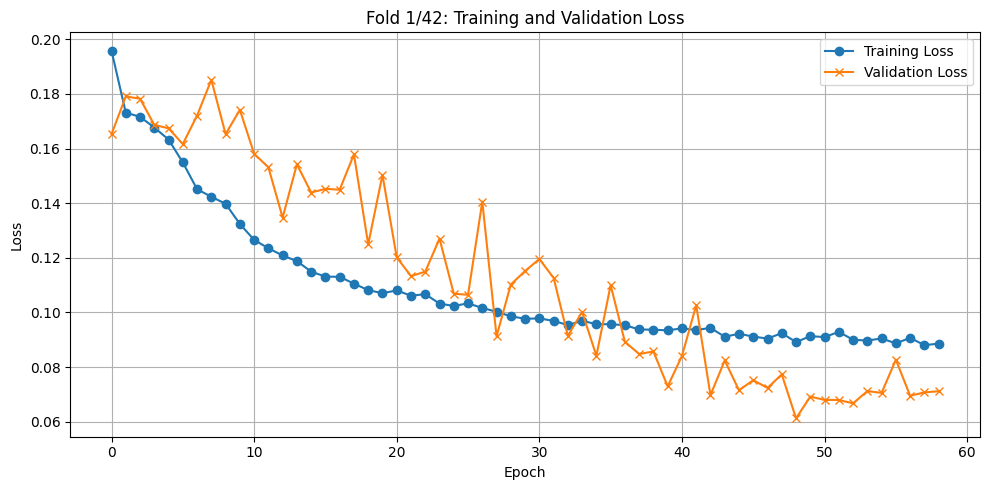


🔁 LOSO Fold 2/42: Đang huấn luyện trên 42 người, kiểm tra trên người thứ 2
Epoch 1/80 - Train Loss: 0.0864, Test Loss: 0.0854
EarlyStopping counter: 1 out of 10
Epoch 2/80 - Train Loss: 0.0869, Test Loss: 0.0914
Epoch 3/80 - Train Loss: 0.0882, Test Loss: 0.0769
EarlyStopping counter: 1 out of 10
Epoch 4/80 - Train Loss: 0.0851, Test Loss: 0.0989
EarlyStopping counter: 2 out of 10
Epoch 5/80 - Train Loss: 0.0858, Test Loss: 0.1037
EarlyStopping counter: 3 out of 10
Epoch 6/80 - Train Loss: 0.0853, Test Loss: 0.0983
EarlyStopping counter: 4 out of 10
Epoch 7/80 - Train Loss: 0.0905, Test Loss: 0.0921
EarlyStopping counter: 5 out of 10
Epoch 8/80 - Train Loss: 0.0851, Test Loss: 0.0975
EarlyStopping counter: 6 out of 10
Epoch 9/80 - Train Loss: 0.0853, Test Loss: 0.0951
EarlyStopping counter: 7 out of 10
Epoch 10/80 - Train Loss: 0.0858, Test Loss: 0.1188
EarlyStopping counter: 8 out of 10
Epoch 11/80 - Train Loss: 0.0841, Test Loss: 0.1101
EarlyStopping counter: 9 out of 10
Epoch 12/80

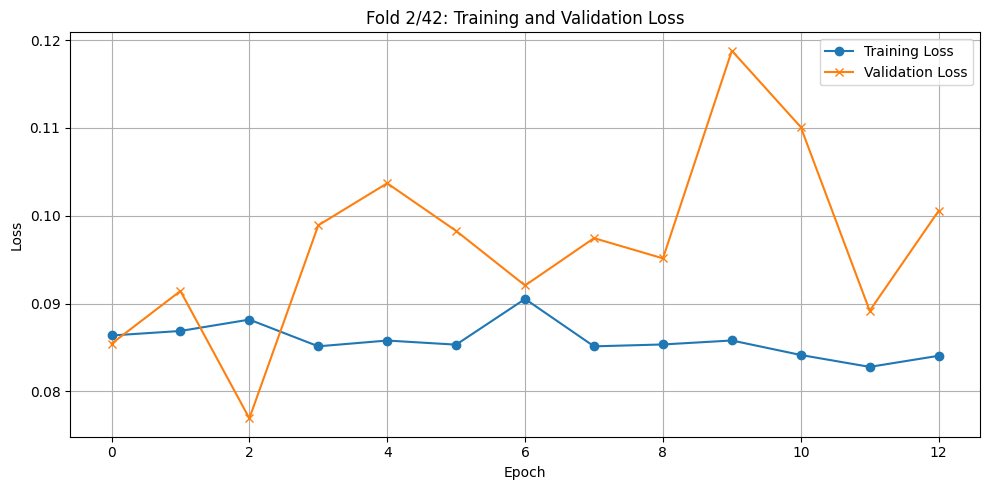


🔁 LOSO Fold 3/42: Đang huấn luyện trên 42 người, kiểm tra trên người thứ 3
Epoch 1/80 - Train Loss: 0.0862, Test Loss: 0.0223
EarlyStopping counter: 1 out of 10
Epoch 2/80 - Train Loss: 0.0863, Test Loss: 0.0246
EarlyStopping counter: 2 out of 10
Epoch 3/80 - Train Loss: 0.0853, Test Loss: 0.0273
EarlyStopping counter: 3 out of 10
Epoch 4/80 - Train Loss: 0.0857, Test Loss: 0.0276
EarlyStopping counter: 4 out of 10
Epoch 5/80 - Train Loss: 0.0858, Test Loss: 0.0258
EarlyStopping counter: 5 out of 10
Epoch 6/80 - Train Loss: 0.0853, Test Loss: 0.0293
EarlyStopping counter: 6 out of 10
Epoch 7/80 - Train Loss: 0.0860, Test Loss: 0.0233
Epoch 8/80 - Train Loss: 0.0851, Test Loss: 0.0215
EarlyStopping counter: 1 out of 10
Epoch 9/80 - Train Loss: 0.0850, Test Loss: 0.0268
EarlyStopping counter: 2 out of 10
Epoch 10/80 - Train Loss: 0.0845, Test Loss: 0.0260
EarlyStopping counter: 3 out of 10
Epoch 11/80 - Train Loss: 0.0849, Test Loss: 0.0359
EarlyStopping counter: 4 out of 10
Epoch 12/80

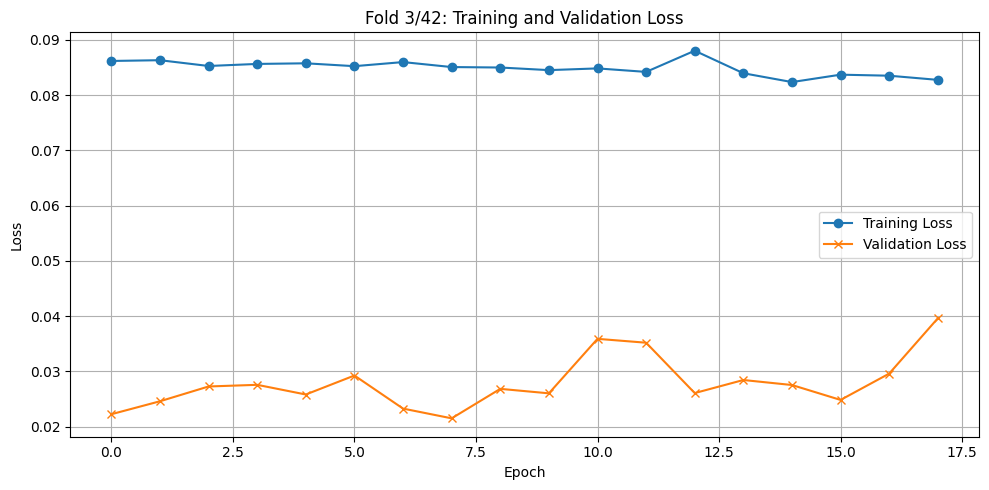


🔁 LOSO Fold 4/42: Đang huấn luyện trên 42 người, kiểm tra trên người thứ 4
Epoch 1/80 - Train Loss: 0.0843, Test Loss: 0.0761
EarlyStopping counter: 1 out of 10
Epoch 2/80 - Train Loss: 0.0826, Test Loss: 0.0975
EarlyStopping counter: 2 out of 10
Epoch 3/80 - Train Loss: 0.0844, Test Loss: 0.0867
EarlyStopping counter: 3 out of 10
Epoch 4/80 - Train Loss: 0.0807, Test Loss: 0.1011
EarlyStopping counter: 4 out of 10
Epoch 5/80 - Train Loss: 0.0828, Test Loss: 0.0953
EarlyStopping counter: 5 out of 10
Epoch 6/80 - Train Loss: 0.0814, Test Loss: 0.0859
EarlyStopping counter: 6 out of 10
Epoch 7/80 - Train Loss: 0.0821, Test Loss: 0.0958
EarlyStopping counter: 7 out of 10
Epoch 8/80 - Train Loss: 0.0803, Test Loss: 0.1045
EarlyStopping counter: 8 out of 10
Epoch 9/80 - Train Loss: 0.0796, Test Loss: 0.1105
EarlyStopping counter: 9 out of 10
Epoch 10/80 - Train Loss: 0.0805, Test Loss: 0.0990
EarlyStopping counter: 10 out of 10
Early stopping at epoch 11


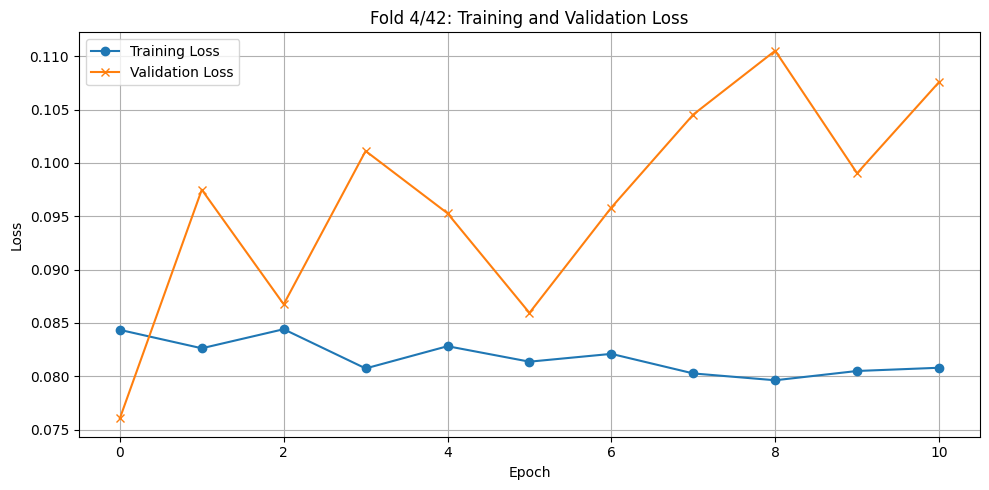


🔁 LOSO Fold 5/42: Đang huấn luyện trên 42 người, kiểm tra trên người thứ 5
Epoch 1/80 - Train Loss: 0.0823, Test Loss: 0.0863
EarlyStopping counter: 1 out of 10
Epoch 2/80 - Train Loss: 0.0806, Test Loss: 0.0926
EarlyStopping counter: 2 out of 10
Epoch 3/80 - Train Loss: 0.0823, Test Loss: 0.0965
EarlyStopping counter: 3 out of 10
Epoch 4/80 - Train Loss: 0.0803, Test Loss: 0.0954
EarlyStopping counter: 4 out of 10
Epoch 5/80 - Train Loss: 0.0795, Test Loss: 0.1026
EarlyStopping counter: 5 out of 10
Epoch 6/80 - Train Loss: 0.0800, Test Loss: 0.1045
EarlyStopping counter: 6 out of 10
Epoch 7/80 - Train Loss: 0.0790, Test Loss: 0.0953
EarlyStopping counter: 7 out of 10
Epoch 8/80 - Train Loss: 0.0841, Test Loss: 0.1067
EarlyStopping counter: 8 out of 10
Epoch 9/80 - Train Loss: 0.0819, Test Loss: 0.1101
EarlyStopping counter: 9 out of 10
Epoch 10/80 - Train Loss: 0.0797, Test Loss: 0.1027
EarlyStopping counter: 10 out of 10
Early stopping at epoch 11


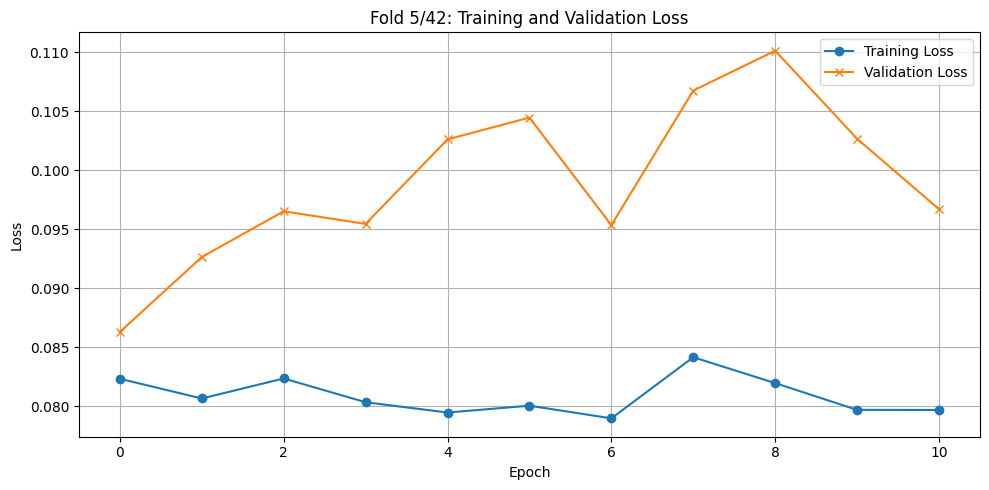


🔁 LOSO Fold 6/42: Đang huấn luyện trên 42 người, kiểm tra trên người thứ 6
Epoch 1/80 - Train Loss: 0.0791, Test Loss: 0.0488
Epoch 2/80 - Train Loss: 0.0805, Test Loss: 0.0456
Epoch 3/80 - Train Loss: 0.0800, Test Loss: 0.0435
EarlyStopping counter: 1 out of 10
Epoch 4/80 - Train Loss: 0.0794, Test Loss: 0.0508
EarlyStopping counter: 2 out of 10
Epoch 5/80 - Train Loss: 0.0794, Test Loss: 0.0502
EarlyStopping counter: 3 out of 10
Epoch 6/80 - Train Loss: 0.0806, Test Loss: 0.0533
EarlyStopping counter: 4 out of 10
Epoch 7/80 - Train Loss: 0.0799, Test Loss: 0.0452
EarlyStopping counter: 5 out of 10
Epoch 8/80 - Train Loss: 0.0791, Test Loss: 0.0504
EarlyStopping counter: 6 out of 10
Epoch 9/80 - Train Loss: 0.0841, Test Loss: 0.0591
EarlyStopping counter: 7 out of 10
Epoch 10/80 - Train Loss: 0.0799, Test Loss: 0.0627
EarlyStopping counter: 8 out of 10
Epoch 11/80 - Train Loss: 0.0805, Test Loss: 0.0620
EarlyStopping counter: 9 out of 10
Epoch 12/80 - Train Loss: 0.0802, Test Loss: 0

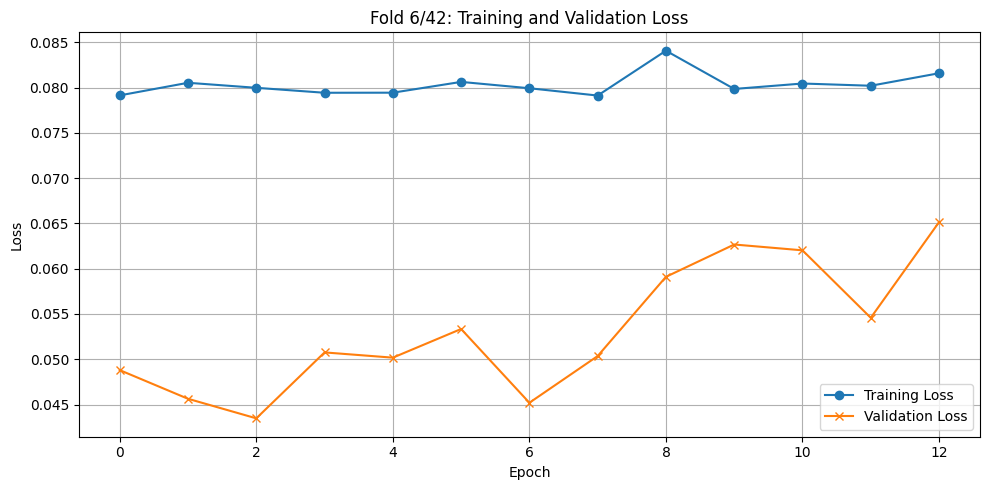


🔁 LOSO Fold 7/42: Đang huấn luyện trên 42 người, kiểm tra trên người thứ 7
Epoch 1/80 - Train Loss: 0.0806, Test Loss: 0.0765
EarlyStopping counter: 1 out of 10
Epoch 2/80 - Train Loss: 0.0787, Test Loss: 0.0823
EarlyStopping counter: 2 out of 10
Epoch 3/80 - Train Loss: 0.0801, Test Loss: 0.0988
EarlyStopping counter: 3 out of 10
Epoch 4/80 - Train Loss: 0.0789, Test Loss: 0.0874
EarlyStopping counter: 4 out of 10
Epoch 5/80 - Train Loss: 0.0791, Test Loss: 0.0911
EarlyStopping counter: 5 out of 10
Epoch 6/80 - Train Loss: 0.0818, Test Loss: 0.0939
EarlyStopping counter: 6 out of 10
Epoch 7/80 - Train Loss: 0.0785, Test Loss: 0.0903
EarlyStopping counter: 7 out of 10
Epoch 8/80 - Train Loss: 0.0783, Test Loss: 0.0980
EarlyStopping counter: 8 out of 10
Epoch 9/80 - Train Loss: 0.0785, Test Loss: 0.0888
EarlyStopping counter: 9 out of 10
Epoch 10/80 - Train Loss: 0.0780, Test Loss: 0.1017
EarlyStopping counter: 10 out of 10
Early stopping at epoch 11


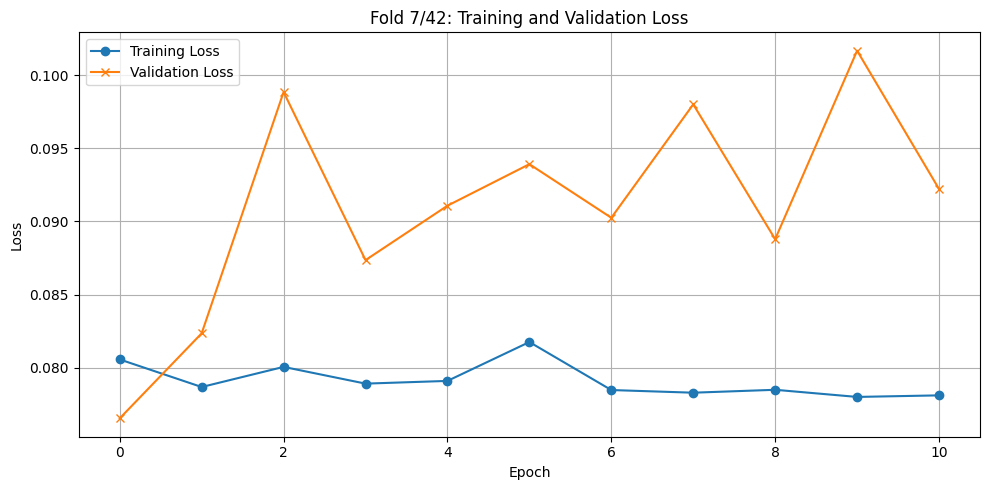


🔁 LOSO Fold 8/42: Đang huấn luyện trên 42 người, kiểm tra trên người thứ 8
Epoch 1/80 - Train Loss: 0.0792, Test Loss: 0.0417
Epoch 2/80 - Train Loss: 0.0785, Test Loss: 0.0375
Epoch 3/80 - Train Loss: 0.0788, Test Loss: 0.0371
Epoch 4/80 - Train Loss: 0.0797, Test Loss: 0.0366
EarlyStopping counter: 1 out of 10
Epoch 5/80 - Train Loss: 0.0812, Test Loss: 0.0398
Epoch 6/80 - Train Loss: 0.0794, Test Loss: 0.0363
EarlyStopping counter: 1 out of 10
Epoch 7/80 - Train Loss: 0.0793, Test Loss: 0.0394
EarlyStopping counter: 2 out of 10
Epoch 8/80 - Train Loss: 0.0784, Test Loss: 0.0385
Epoch 9/80 - Train Loss: 0.0798, Test Loss: 0.0332
EarlyStopping counter: 1 out of 10
Epoch 10/80 - Train Loss: 0.0783, Test Loss: 0.0428
EarlyStopping counter: 2 out of 10
Epoch 11/80 - Train Loss: 0.0782, Test Loss: 0.0392
EarlyStopping counter: 3 out of 10
Epoch 12/80 - Train Loss: 0.0790, Test Loss: 0.0452
EarlyStopping counter: 4 out of 10
Epoch 13/80 - Train Loss: 0.0785, Test Loss: 0.0410
EarlyStoppin

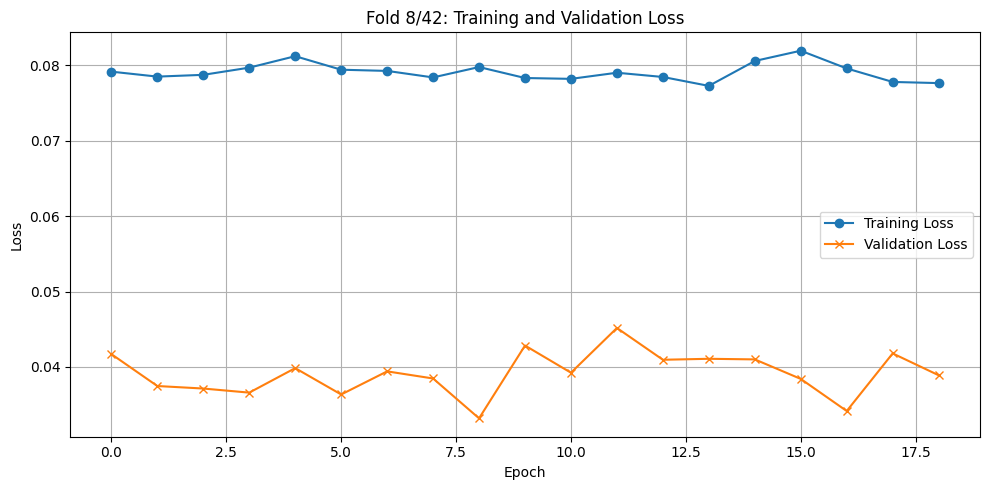


🔁 LOSO Fold 9/42: Đang huấn luyện trên 42 người, kiểm tra trên người thứ 9
Epoch 1/80 - Train Loss: 0.0814, Test Loss: 0.1049
EarlyStopping counter: 1 out of 10
Epoch 2/80 - Train Loss: 0.0776, Test Loss: 0.1079
Epoch 3/80 - Train Loss: 0.0761, Test Loss: 0.0965
EarlyStopping counter: 1 out of 10
Epoch 4/80 - Train Loss: 0.0753, Test Loss: 0.0991
EarlyStopping counter: 2 out of 10
Epoch 5/80 - Train Loss: 0.0745, Test Loss: 0.1113
EarlyStopping counter: 3 out of 10
Epoch 6/80 - Train Loss: 0.0756, Test Loss: 0.1025
EarlyStopping counter: 4 out of 10
Epoch 7/80 - Train Loss: 0.0758, Test Loss: 0.1070
EarlyStopping counter: 5 out of 10
Epoch 8/80 - Train Loss: 0.0751, Test Loss: 0.1096
EarlyStopping counter: 6 out of 10
Epoch 9/80 - Train Loss: 0.0755, Test Loss: 0.1199
EarlyStopping counter: 7 out of 10
Epoch 10/80 - Train Loss: 0.0759, Test Loss: 0.1103
EarlyStopping counter: 8 out of 10
Epoch 11/80 - Train Loss: 0.0754, Test Loss: 0.1113
EarlyStopping counter: 9 out of 10
Epoch 12/80

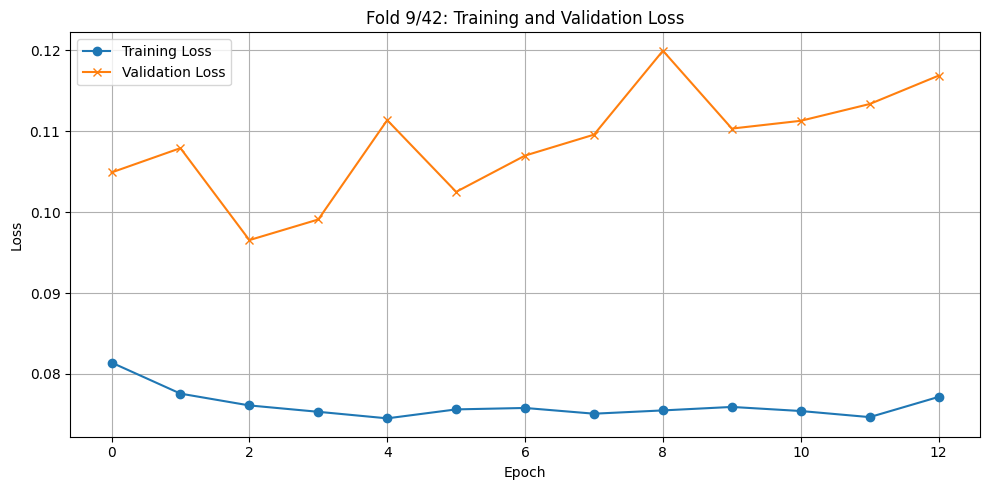


🔁 LOSO Fold 10/42: Đang huấn luyện trên 42 người, kiểm tra trên người thứ 10
Epoch 1/80 - Train Loss: 0.0748, Test Loss: 0.0800
EarlyStopping counter: 1 out of 10
Epoch 2/80 - Train Loss: 0.0762, Test Loss: 0.0834
EarlyStopping counter: 2 out of 10
Epoch 3/80 - Train Loss: 0.0748, Test Loss: 0.0800
EarlyStopping counter: 3 out of 10
Epoch 4/80 - Train Loss: 0.0742, Test Loss: 0.0866
EarlyStopping counter: 4 out of 10
Epoch 5/80 - Train Loss: 0.0751, Test Loss: 0.0866
EarlyStopping counter: 5 out of 10
Epoch 6/80 - Train Loss: 0.0753, Test Loss: 0.0931
EarlyStopping counter: 6 out of 10
Epoch 7/80 - Train Loss: 0.0760, Test Loss: 0.0921
EarlyStopping counter: 7 out of 10
Epoch 8/80 - Train Loss: 0.0767, Test Loss: 0.0869
EarlyStopping counter: 8 out of 10
Epoch 9/80 - Train Loss: 0.0747, Test Loss: 0.0937
EarlyStopping counter: 9 out of 10
Epoch 10/80 - Train Loss: 0.0752, Test Loss: 0.1034
EarlyStopping counter: 10 out of 10
Early stopping at epoch 11


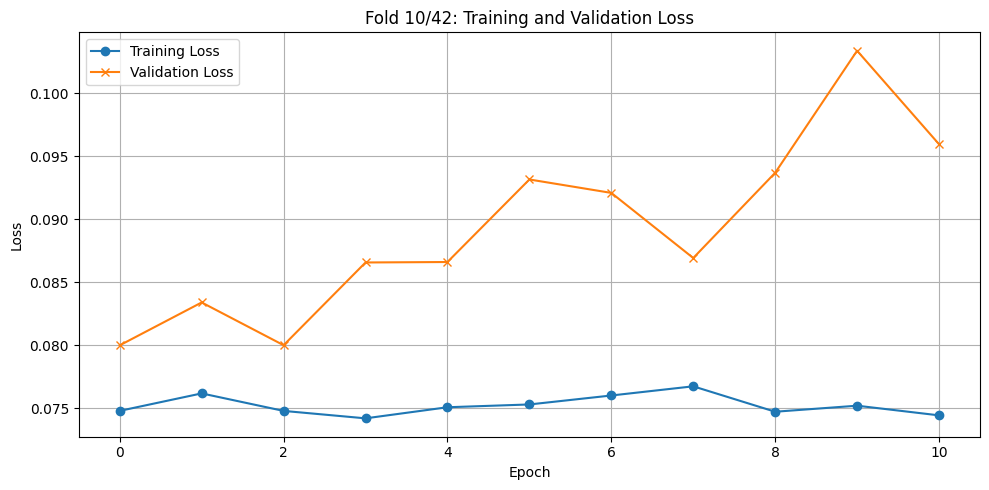


🔁 LOSO Fold 11/42: Đang huấn luyện trên 42 người, kiểm tra trên người thứ 11
Epoch 1/80 - Train Loss: 0.0768, Test Loss: 0.0501
Epoch 2/80 - Train Loss: 0.0746, Test Loss: 0.0455
EarlyStopping counter: 1 out of 10
Epoch 3/80 - Train Loss: 0.0752, Test Loss: 0.0570
EarlyStopping counter: 2 out of 10
Epoch 4/80 - Train Loss: 0.0766, Test Loss: 0.0578
EarlyStopping counter: 3 out of 10
Epoch 5/80 - Train Loss: 0.0756, Test Loss: 0.0561
EarlyStopping counter: 4 out of 10
Epoch 6/80 - Train Loss: 0.0760, Test Loss: 0.0552
EarlyStopping counter: 5 out of 10
Epoch 7/80 - Train Loss: 0.0760, Test Loss: 0.0645
EarlyStopping counter: 6 out of 10
Epoch 8/80 - Train Loss: 0.0749, Test Loss: 0.0555
EarlyStopping counter: 7 out of 10
Epoch 9/80 - Train Loss: 0.0759, Test Loss: 0.0530
EarlyStopping counter: 8 out of 10
Epoch 10/80 - Train Loss: 0.0742, Test Loss: 0.0656
EarlyStopping counter: 9 out of 10
Epoch 11/80 - Train Loss: 0.0754, Test Loss: 0.0562
EarlyStopping counter: 10 out of 10
Early st

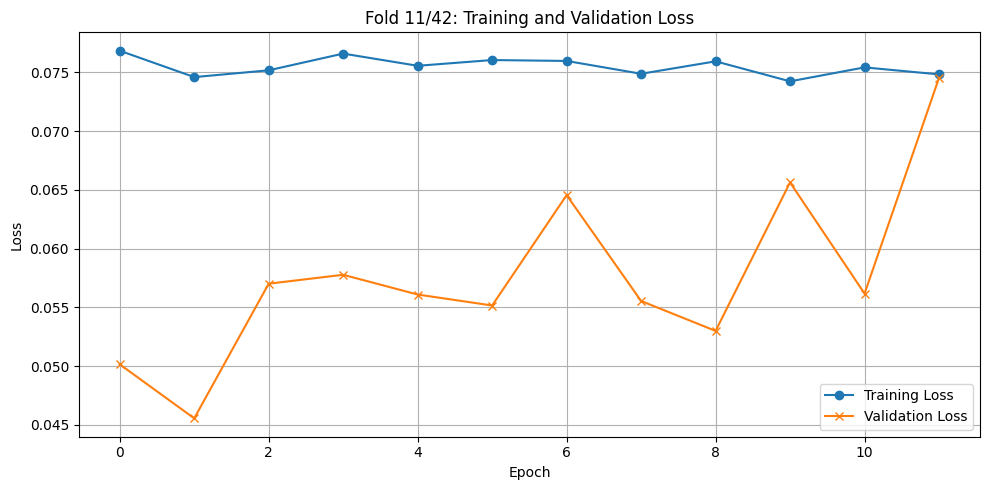


🔁 LOSO Fold 12/42: Đang huấn luyện trên 42 người, kiểm tra trên người thứ 12
Epoch 1/80 - Train Loss: 0.0756, Test Loss: 0.0642
Epoch 2/80 - Train Loss: 0.0757, Test Loss: 0.0633
EarlyStopping counter: 1 out of 10
Epoch 3/80 - Train Loss: 0.0759, Test Loss: 0.0642
Epoch 4/80 - Train Loss: 0.0733, Test Loss: 0.0626
EarlyStopping counter: 1 out of 10
Epoch 5/80 - Train Loss: 0.0746, Test Loss: 0.0724
EarlyStopping counter: 2 out of 10
Epoch 6/80 - Train Loss: 0.0743, Test Loss: 0.0671
EarlyStopping counter: 3 out of 10
Epoch 7/80 - Train Loss: 0.0739, Test Loss: 0.0712
EarlyStopping counter: 4 out of 10
Epoch 8/80 - Train Loss: 0.0758, Test Loss: 0.0767
EarlyStopping counter: 5 out of 10
Epoch 9/80 - Train Loss: 0.0752, Test Loss: 0.0691
EarlyStopping counter: 6 out of 10
Epoch 10/80 - Train Loss: 0.0751, Test Loss: 0.0676
EarlyStopping counter: 7 out of 10
Epoch 11/80 - Train Loss: 0.0742, Test Loss: 0.0683
EarlyStopping counter: 8 out of 10
Epoch 12/80 - Train Loss: 0.0741, Test Loss:

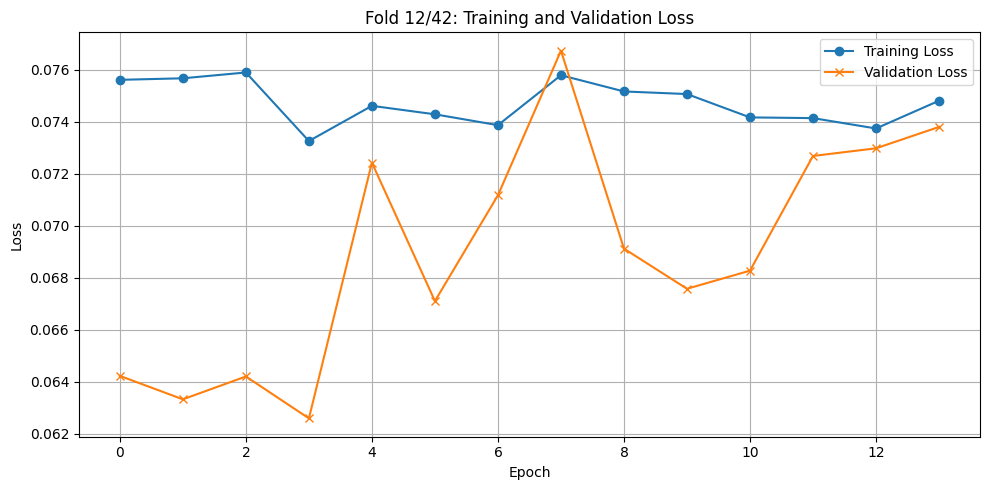


🔁 LOSO Fold 13/42: Đang huấn luyện trên 42 người, kiểm tra trên người thứ 13
Epoch 1/80 - Train Loss: 0.0753, Test Loss: 0.0557
EarlyStopping counter: 1 out of 10
Epoch 2/80 - Train Loss: 0.0754, Test Loss: 0.0617
EarlyStopping counter: 2 out of 10
Epoch 3/80 - Train Loss: 0.0757, Test Loss: 0.0873
EarlyStopping counter: 3 out of 10
Epoch 4/80 - Train Loss: 0.0745, Test Loss: 0.0609
EarlyStopping counter: 4 out of 10
Epoch 5/80 - Train Loss: 0.0751, Test Loss: 0.0632
EarlyStopping counter: 5 out of 10
Epoch 6/80 - Train Loss: 0.0745, Test Loss: 0.0591
EarlyStopping counter: 6 out of 10
Epoch 7/80 - Train Loss: 0.0748, Test Loss: 0.0627
EarlyStopping counter: 7 out of 10
Epoch 8/80 - Train Loss: 0.0744, Test Loss: 0.0635
EarlyStopping counter: 8 out of 10
Epoch 9/80 - Train Loss: 0.0733, Test Loss: 0.0663
EarlyStopping counter: 9 out of 10
Epoch 10/80 - Train Loss: 0.0748, Test Loss: 0.0631
EarlyStopping counter: 10 out of 10
Early stopping at epoch 11


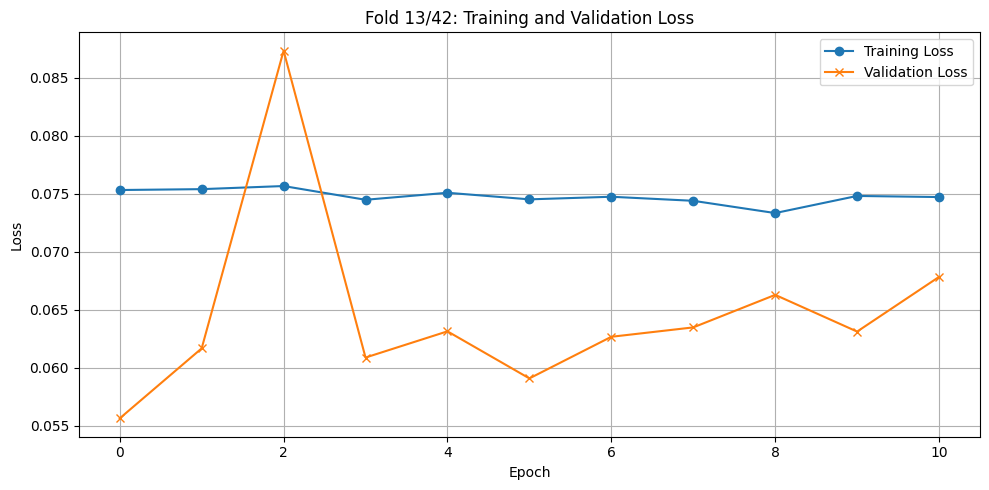


🔁 LOSO Fold 14/42: Đang huấn luyện trên 42 người, kiểm tra trên người thứ 14
Epoch 1/80 - Train Loss: 0.0725, Test Loss: 0.1357
EarlyStopping counter: 1 out of 10
Epoch 2/80 - Train Loss: 0.0743, Test Loss: 0.1443
EarlyStopping counter: 2 out of 10
Epoch 3/80 - Train Loss: 0.0730, Test Loss: 0.1444
EarlyStopping counter: 3 out of 10
Epoch 4/80 - Train Loss: 0.0722, Test Loss: 0.1463
EarlyStopping counter: 4 out of 10
Epoch 5/80 - Train Loss: 0.0719, Test Loss: 0.1398
EarlyStopping counter: 5 out of 10
Epoch 6/80 - Train Loss: 0.0728, Test Loss: 0.1553
EarlyStopping counter: 6 out of 10
Epoch 7/80 - Train Loss: 0.0719, Test Loss: 0.1551
EarlyStopping counter: 7 out of 10
Epoch 8/80 - Train Loss: 0.0715, Test Loss: 0.1514
EarlyStopping counter: 8 out of 10
Epoch 9/80 - Train Loss: 0.0719, Test Loss: 0.1470
EarlyStopping counter: 9 out of 10
Epoch 10/80 - Train Loss: 0.0704, Test Loss: 0.1486
EarlyStopping counter: 10 out of 10
Early stopping at epoch 11


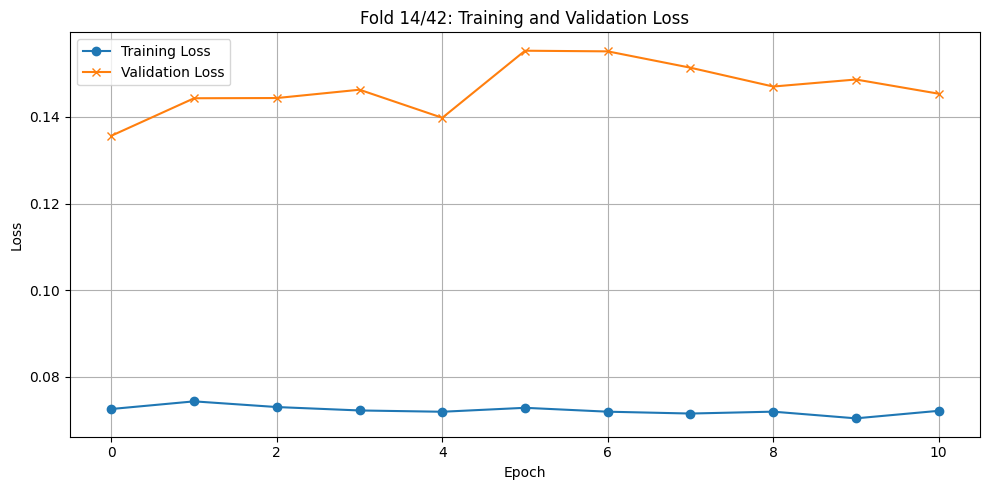


🔁 LOSO Fold 15/42: Đang huấn luyện trên 42 người, kiểm tra trên người thứ 15
Epoch 1/80 - Train Loss: 0.0753, Test Loss: 0.0608
EarlyStopping counter: 1 out of 10
Epoch 2/80 - Train Loss: 0.0742, Test Loss: 0.0850
EarlyStopping counter: 2 out of 10
Epoch 3/80 - Train Loss: 0.0734, Test Loss: 0.0771
EarlyStopping counter: 3 out of 10
Epoch 4/80 - Train Loss: 0.0744, Test Loss: 0.0716
EarlyStopping counter: 4 out of 10
Epoch 5/80 - Train Loss: 0.0736, Test Loss: 0.0810
EarlyStopping counter: 5 out of 10
Epoch 6/80 - Train Loss: 0.0726, Test Loss: 0.0747
EarlyStopping counter: 6 out of 10
Epoch 7/80 - Train Loss: 0.0731, Test Loss: 0.0715
EarlyStopping counter: 7 out of 10
Epoch 8/80 - Train Loss: 0.0735, Test Loss: 0.0691
EarlyStopping counter: 8 out of 10
Epoch 9/80 - Train Loss: 0.0732, Test Loss: 0.0752
EarlyStopping counter: 9 out of 10
Epoch 10/80 - Train Loss: 0.0740, Test Loss: 0.0812
EarlyStopping counter: 10 out of 10
Early stopping at epoch 11


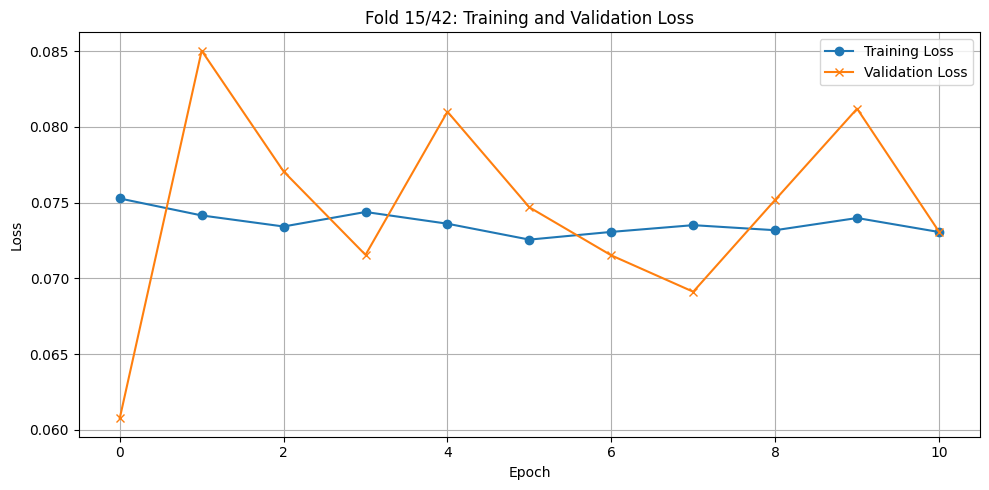


🔁 LOSO Fold 16/42: Đang huấn luyện trên 42 người, kiểm tra trên người thứ 16
Epoch 1/80 - Train Loss: 0.0744, Test Loss: 0.1033
EarlyStopping counter: 1 out of 10
Epoch 2/80 - Train Loss: 0.0725, Test Loss: 0.1033
EarlyStopping counter: 2 out of 10
Epoch 3/80 - Train Loss: 0.0731, Test Loss: 0.1100
Epoch 4/80 - Train Loss: 0.0714, Test Loss: 0.1023
EarlyStopping counter: 1 out of 10
Epoch 5/80 - Train Loss: 0.0718, Test Loss: 0.1120
EarlyStopping counter: 2 out of 10
Epoch 6/80 - Train Loss: 0.0718, Test Loss: 0.1191
EarlyStopping counter: 3 out of 10
Epoch 7/80 - Train Loss: 0.0728, Test Loss: 0.1212
EarlyStopping counter: 4 out of 10
Epoch 8/80 - Train Loss: 0.0707, Test Loss: 0.1164
EarlyStopping counter: 5 out of 10
Epoch 9/80 - Train Loss: 0.0716, Test Loss: 0.1105
EarlyStopping counter: 6 out of 10
Epoch 10/80 - Train Loss: 0.0735, Test Loss: 0.1126
EarlyStopping counter: 7 out of 10
Epoch 11/80 - Train Loss: 0.0732, Test Loss: 0.1161
EarlyStopping counter: 8 out of 10
Epoch 12/

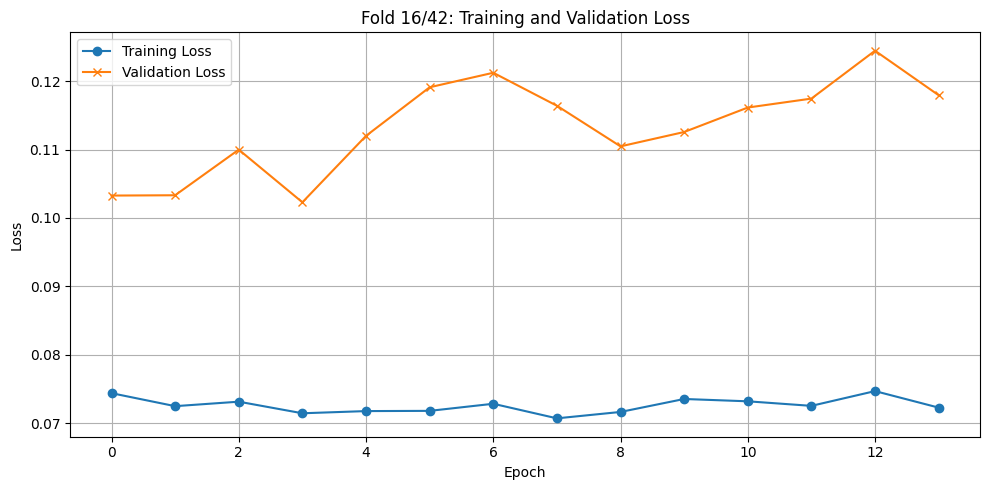


🔁 LOSO Fold 17/42: Đang huấn luyện trên 42 người, kiểm tra trên người thứ 17
Epoch 1/80 - Train Loss: 0.0702, Test Loss: 0.1608
Epoch 2/80 - Train Loss: 0.0712, Test Loss: 0.1603
Epoch 3/80 - Train Loss: 0.0695, Test Loss: 0.1603
Epoch 4/80 - Train Loss: 0.0705, Test Loss: 0.1590
EarlyStopping counter: 1 out of 10
Epoch 5/80 - Train Loss: 0.0749, Test Loss: 0.1642
EarlyStopping counter: 2 out of 10
Epoch 6/80 - Train Loss: 0.0708, Test Loss: 0.1598
EarlyStopping counter: 3 out of 10
Epoch 7/80 - Train Loss: 0.0701, Test Loss: 0.1623
EarlyStopping counter: 4 out of 10
Epoch 8/80 - Train Loss: 0.0723, Test Loss: 0.1614
EarlyStopping counter: 5 out of 10
Epoch 9/80 - Train Loss: 0.0726, Test Loss: 0.1682
EarlyStopping counter: 6 out of 10
Epoch 10/80 - Train Loss: 0.0716, Test Loss: 0.1635
EarlyStopping counter: 7 out of 10
Epoch 11/80 - Train Loss: 0.0700, Test Loss: 0.1698
EarlyStopping counter: 8 out of 10
Epoch 12/80 - Train Loss: 0.0705, Test Loss: 0.1696
EarlyStopping counter: 9 ou

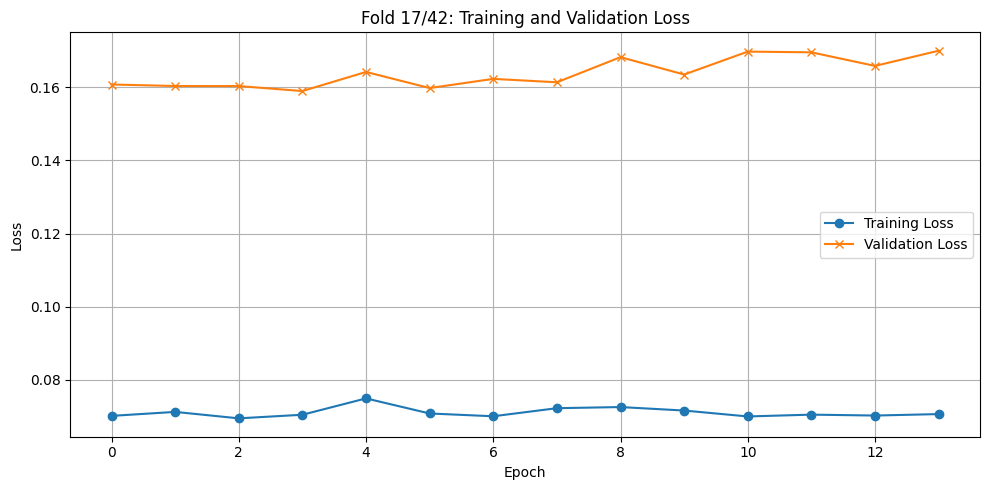


🔁 LOSO Fold 18/42: Đang huấn luyện trên 42 người, kiểm tra trên người thứ 18
Epoch 1/80 - Train Loss: 0.0737, Test Loss: 0.0537
Epoch 2/80 - Train Loss: 0.0732, Test Loss: 0.0532
EarlyStopping counter: 1 out of 10
Epoch 3/80 - Train Loss: 0.0732, Test Loss: 0.0614
EarlyStopping counter: 2 out of 10
Epoch 4/80 - Train Loss: 0.0725, Test Loss: 0.0730
EarlyStopping counter: 3 out of 10
Epoch 5/80 - Train Loss: 0.0732, Test Loss: 0.0710
EarlyStopping counter: 4 out of 10
Epoch 6/80 - Train Loss: 0.0720, Test Loss: 0.0595
EarlyStopping counter: 5 out of 10
Epoch 7/80 - Train Loss: 0.0712, Test Loss: 0.0686
EarlyStopping counter: 6 out of 10
Epoch 8/80 - Train Loss: 0.0736, Test Loss: 0.0735
EarlyStopping counter: 7 out of 10
Epoch 9/80 - Train Loss: 0.0740, Test Loss: 0.0666
EarlyStopping counter: 8 out of 10
Epoch 10/80 - Train Loss: 0.0726, Test Loss: 0.0640
EarlyStopping counter: 9 out of 10
Epoch 11/80 - Train Loss: 0.0723, Test Loss: 0.0694
EarlyStopping counter: 10 out of 10
Early st

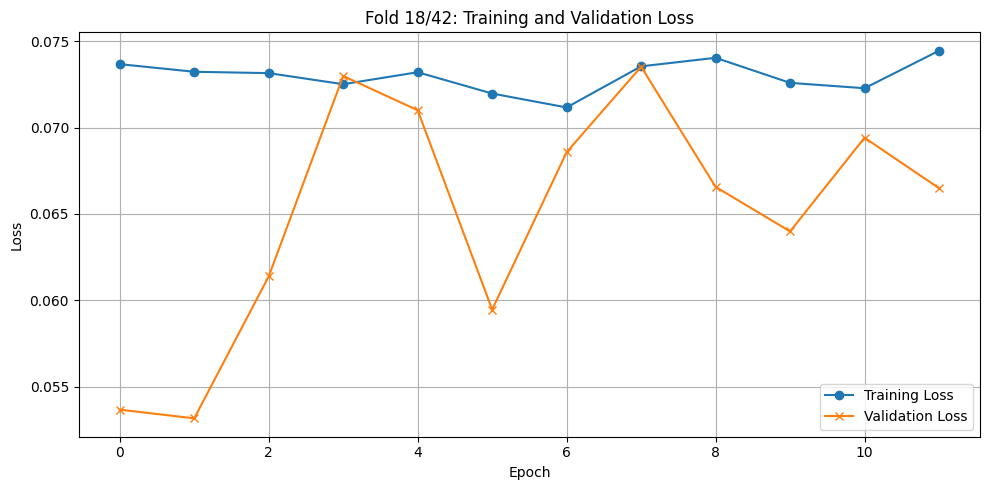


🔁 LOSO Fold 19/42: Đang huấn luyện trên 42 người, kiểm tra trên người thứ 19
Epoch 1/80 - Train Loss: 0.0733, Test Loss: 0.0848
EarlyStopping counter: 1 out of 10
Epoch 2/80 - Train Loss: 0.0722, Test Loss: 0.0881
EarlyStopping counter: 2 out of 10
Epoch 3/80 - Train Loss: 0.0716, Test Loss: 0.0966
EarlyStopping counter: 3 out of 10
Epoch 4/80 - Train Loss: 0.0721, Test Loss: 0.1032
EarlyStopping counter: 4 out of 10
Epoch 5/80 - Train Loss: 0.0715, Test Loss: 0.0976
EarlyStopping counter: 5 out of 10
Epoch 6/80 - Train Loss: 0.0711, Test Loss: 0.0973
EarlyStopping counter: 6 out of 10
Epoch 7/80 - Train Loss: 0.0716, Test Loss: 0.0901
EarlyStopping counter: 7 out of 10
Epoch 8/80 - Train Loss: 0.0721, Test Loss: 0.0943
EarlyStopping counter: 8 out of 10
Epoch 9/80 - Train Loss: 0.0715, Test Loss: 0.0989
EarlyStopping counter: 9 out of 10
Epoch 10/80 - Train Loss: 0.0704, Test Loss: 0.0945
EarlyStopping counter: 10 out of 10
Early stopping at epoch 11


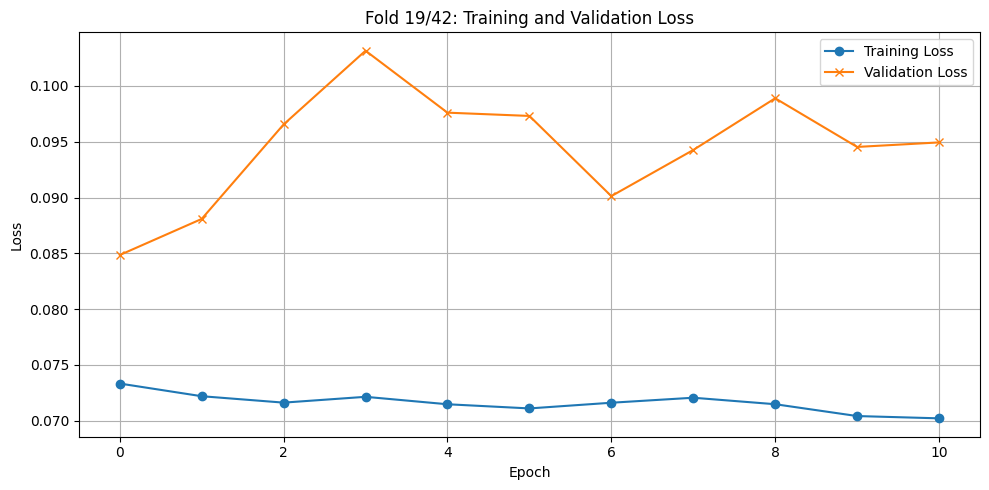


🔁 LOSO Fold 20/42: Đang huấn luyện trên 42 người, kiểm tra trên người thứ 20
Epoch 1/80 - Train Loss: 0.0688, Test Loss: 0.1676
Epoch 2/80 - Train Loss: 0.0699, Test Loss: 0.1497
EarlyStopping counter: 1 out of 10
Epoch 3/80 - Train Loss: 0.0701, Test Loss: 0.1533
EarlyStopping counter: 2 out of 10
Epoch 4/80 - Train Loss: 0.0702, Test Loss: 0.1699
EarlyStopping counter: 3 out of 10
Epoch 5/80 - Train Loss: 0.0701, Test Loss: 0.1738
EarlyStopping counter: 4 out of 10
Epoch 6/80 - Train Loss: 0.0684, Test Loss: 0.1574
EarlyStopping counter: 5 out of 10
Epoch 7/80 - Train Loss: 0.0696, Test Loss: 0.1549
EarlyStopping counter: 6 out of 10
Epoch 8/80 - Train Loss: 0.0703, Test Loss: 0.1668
Epoch 9/80 - Train Loss: 0.0687, Test Loss: 0.1458
EarlyStopping counter: 1 out of 10
Epoch 10/80 - Train Loss: 0.0706, Test Loss: 0.1600
EarlyStopping counter: 2 out of 10
Epoch 11/80 - Train Loss: 0.0716, Test Loss: 0.1581
EarlyStopping counter: 3 out of 10
Epoch 12/80 - Train Loss: 0.0696, Test Loss:

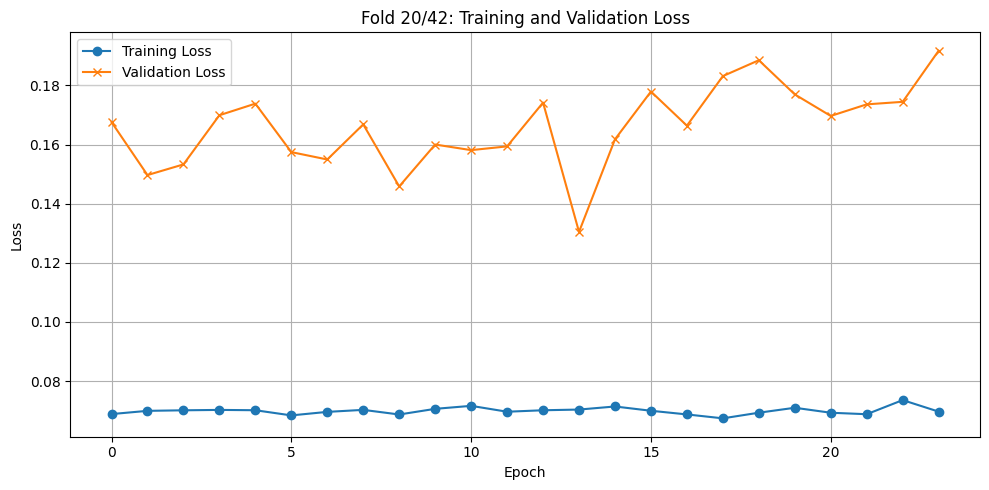


🔁 LOSO Fold 21/42: Đang huấn luyện trên 42 người, kiểm tra trên người thứ 21
Epoch 1/80 - Train Loss: 0.0728, Test Loss: 0.0485
Epoch 2/80 - Train Loss: 0.0727, Test Loss: 0.0484
EarlyStopping counter: 1 out of 10
Epoch 3/80 - Train Loss: 0.0723, Test Loss: 0.0490
EarlyStopping counter: 2 out of 10
Epoch 4/80 - Train Loss: 0.0711, Test Loss: 0.0510
EarlyStopping counter: 3 out of 10
Epoch 5/80 - Train Loss: 0.0744, Test Loss: 0.0596
EarlyStopping counter: 4 out of 10
Epoch 6/80 - Train Loss: 0.0729, Test Loss: 0.0610
EarlyStopping counter: 5 out of 10
Epoch 7/80 - Train Loss: 0.0724, Test Loss: 0.0540
EarlyStopping counter: 6 out of 10
Epoch 8/80 - Train Loss: 0.0732, Test Loss: 0.0585
EarlyStopping counter: 7 out of 10
Epoch 9/80 - Train Loss: 0.0761, Test Loss: 0.0601
EarlyStopping counter: 8 out of 10
Epoch 10/80 - Train Loss: 0.0727, Test Loss: 0.0728
EarlyStopping counter: 9 out of 10
Epoch 11/80 - Train Loss: 0.0790, Test Loss: 0.0600
EarlyStopping counter: 10 out of 10
Early st

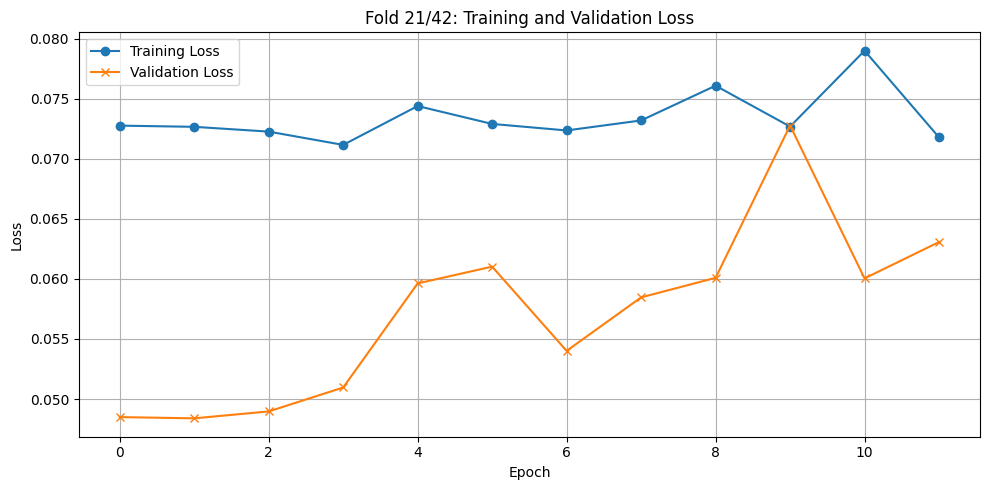


🔁 LOSO Fold 22/42: Đang huấn luyện trên 42 người, kiểm tra trên người thứ 22
Epoch 1/80 - Train Loss: 0.0725, Test Loss: 0.0503
Epoch 2/80 - Train Loss: 0.0713, Test Loss: 0.0492
EarlyStopping counter: 1 out of 10
Epoch 3/80 - Train Loss: 0.0707, Test Loss: 0.0546
EarlyStopping counter: 2 out of 10
Epoch 4/80 - Train Loss: 0.0719, Test Loss: 0.0558
EarlyStopping counter: 3 out of 10
Epoch 5/80 - Train Loss: 0.0708, Test Loss: 0.0590
EarlyStopping counter: 4 out of 10
Epoch 6/80 - Train Loss: 0.0729, Test Loss: 0.0736
EarlyStopping counter: 5 out of 10
Epoch 7/80 - Train Loss: 0.0736, Test Loss: 0.0640
EarlyStopping counter: 6 out of 10
Epoch 8/80 - Train Loss: 0.0725, Test Loss: 0.0550
EarlyStopping counter: 7 out of 10
Epoch 9/80 - Train Loss: 0.0714, Test Loss: 0.0665
EarlyStopping counter: 8 out of 10
Epoch 10/80 - Train Loss: 0.0733, Test Loss: 0.0679
EarlyStopping counter: 9 out of 10
Epoch 11/80 - Train Loss: 0.0704, Test Loss: 0.0721
EarlyStopping counter: 10 out of 10
Early st

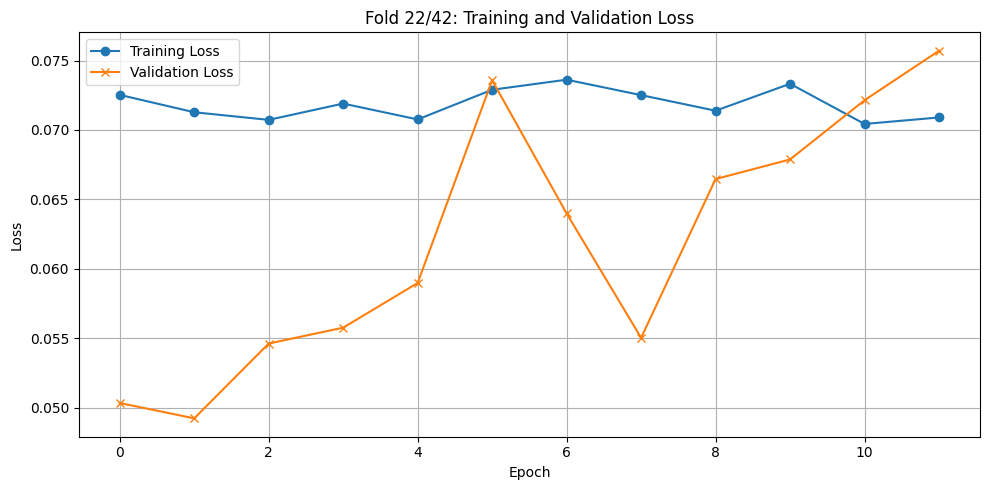


🔁 LOSO Fold 23/42: Đang huấn luyện trên 42 người, kiểm tra trên người thứ 23
Epoch 1/80 - Train Loss: 0.0706, Test Loss: 0.1199
EarlyStopping counter: 1 out of 10
Epoch 2/80 - Train Loss: 0.0691, Test Loss: 0.1259
EarlyStopping counter: 2 out of 10
Epoch 3/80 - Train Loss: 0.0710, Test Loss: 0.1232
EarlyStopping counter: 3 out of 10
Epoch 4/80 - Train Loss: 0.0691, Test Loss: 0.1206
EarlyStopping counter: 4 out of 10
Epoch 5/80 - Train Loss: 0.0685, Test Loss: 0.1235
EarlyStopping counter: 5 out of 10
Epoch 6/80 - Train Loss: 0.0685, Test Loss: 0.1251
EarlyStopping counter: 6 out of 10
Epoch 7/80 - Train Loss: 0.0702, Test Loss: 0.1272
EarlyStopping counter: 7 out of 10
Epoch 8/80 - Train Loss: 0.0687, Test Loss: 0.1290
EarlyStopping counter: 8 out of 10
Epoch 9/80 - Train Loss: 0.0689, Test Loss: 0.1320
EarlyStopping counter: 9 out of 10
Epoch 10/80 - Train Loss: 0.0697, Test Loss: 0.1303
EarlyStopping counter: 10 out of 10
Early stopping at epoch 11


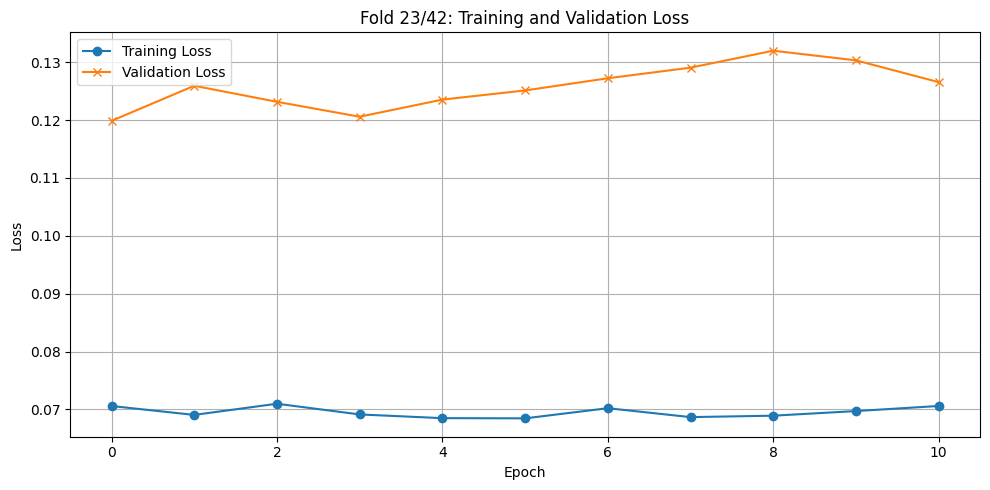


🔁 LOSO Fold 24/42: Đang huấn luyện trên 42 người, kiểm tra trên người thứ 24
Epoch 1/80 - Train Loss: 0.0772, Test Loss: 0.0192
EarlyStopping counter: 1 out of 10
Epoch 2/80 - Train Loss: 0.0721, Test Loss: 0.0217
EarlyStopping counter: 2 out of 10
Epoch 3/80 - Train Loss: 0.0732, Test Loss: 0.0211
EarlyStopping counter: 3 out of 10
Epoch 4/80 - Train Loss: 0.0727, Test Loss: 0.0231
EarlyStopping counter: 4 out of 10
Epoch 5/80 - Train Loss: 0.0713, Test Loss: 0.0231
EarlyStopping counter: 5 out of 10
Epoch 6/80 - Train Loss: 0.0719, Test Loss: 0.0236
EarlyStopping counter: 6 out of 10
Epoch 7/80 - Train Loss: 0.0730, Test Loss: 0.0210
EarlyStopping counter: 7 out of 10
Epoch 8/80 - Train Loss: 0.0721, Test Loss: 0.0240
EarlyStopping counter: 8 out of 10
Epoch 9/80 - Train Loss: 0.0719, Test Loss: 0.0248
EarlyStopping counter: 9 out of 10
Epoch 10/80 - Train Loss: 0.0725, Test Loss: 0.0248
EarlyStopping counter: 10 out of 10
Early stopping at epoch 11


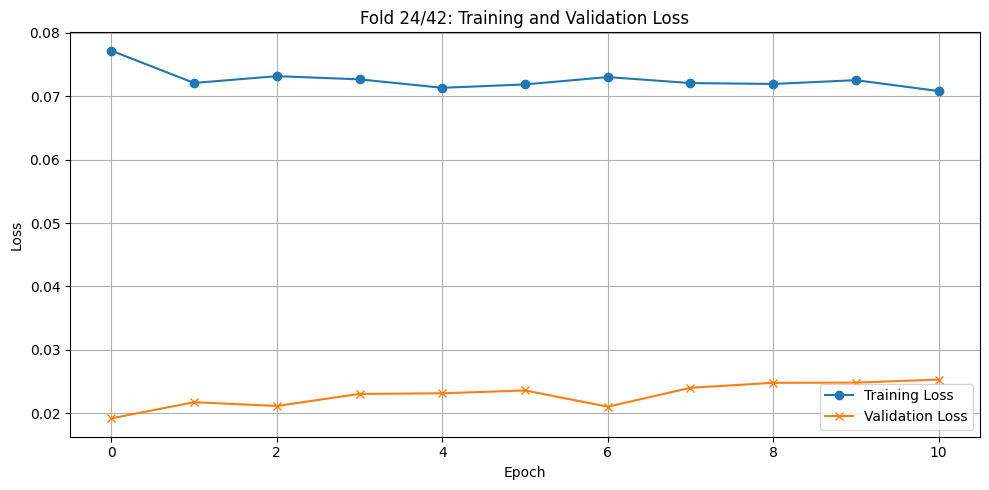


🔁 LOSO Fold 25/42: Đang huấn luyện trên 42 người, kiểm tra trên người thứ 25
Epoch 1/80 - Train Loss: 0.0705, Test Loss: 0.0947
EarlyStopping counter: 1 out of 10
Epoch 2/80 - Train Loss: 0.0717, Test Loss: 0.0979
EarlyStopping counter: 2 out of 10
Epoch 3/80 - Train Loss: 0.0699, Test Loss: 0.1038
EarlyStopping counter: 3 out of 10
Epoch 4/80 - Train Loss: 0.0702, Test Loss: 0.0976
EarlyStopping counter: 4 out of 10
Epoch 5/80 - Train Loss: 0.0684, Test Loss: 0.1034
EarlyStopping counter: 5 out of 10
Epoch 6/80 - Train Loss: 0.0698, Test Loss: 0.0989
EarlyStopping counter: 6 out of 10
Epoch 7/80 - Train Loss: 0.0711, Test Loss: 0.1098
EarlyStopping counter: 7 out of 10
Epoch 8/80 - Train Loss: 0.0691, Test Loss: 0.0987
EarlyStopping counter: 8 out of 10
Epoch 9/80 - Train Loss: 0.0685, Test Loss: 0.1031
EarlyStopping counter: 9 out of 10
Epoch 10/80 - Train Loss: 0.0692, Test Loss: 0.1014
EarlyStopping counter: 10 out of 10
Early stopping at epoch 11


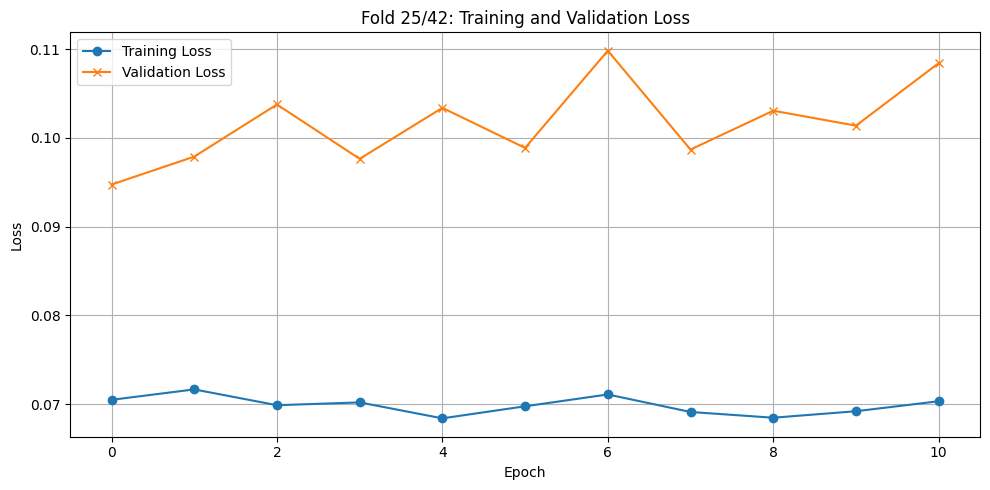


🔁 LOSO Fold 26/42: Đang huấn luyện trên 42 người, kiểm tra trên người thứ 26
Epoch 1/80 - Train Loss: 0.0692, Test Loss: 0.0486
EarlyStopping counter: 1 out of 10
Epoch 2/80 - Train Loss: 0.0719, Test Loss: 0.0726
EarlyStopping counter: 2 out of 10
Epoch 3/80 - Train Loss: 0.0714, Test Loss: 0.0592
EarlyStopping counter: 3 out of 10
Epoch 4/80 - Train Loss: 0.0693, Test Loss: 0.0693
EarlyStopping counter: 4 out of 10
Epoch 5/80 - Train Loss: 0.0697, Test Loss: 0.0642
EarlyStopping counter: 5 out of 10
Epoch 6/80 - Train Loss: 0.0708, Test Loss: 0.0608
EarlyStopping counter: 6 out of 10
Epoch 7/80 - Train Loss: 0.0684, Test Loss: 0.0705
EarlyStopping counter: 7 out of 10
Epoch 8/80 - Train Loss: 0.0701, Test Loss: 0.0940
EarlyStopping counter: 8 out of 10
Epoch 9/80 - Train Loss: 0.0695, Test Loss: 0.0903
EarlyStopping counter: 9 out of 10
Epoch 10/80 - Train Loss: 0.0689, Test Loss: 0.0671
EarlyStopping counter: 10 out of 10
Early stopping at epoch 11


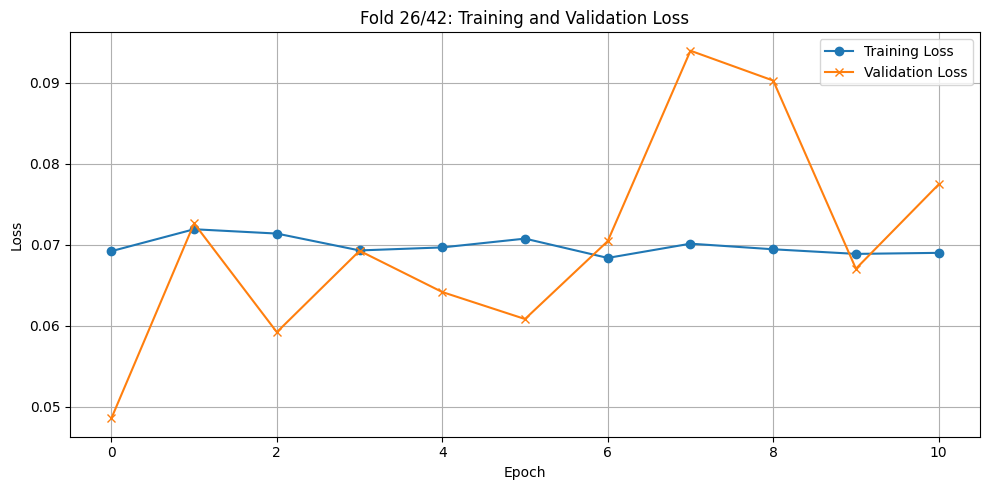


🔁 LOSO Fold 27/42: Đang huấn luyện trên 42 người, kiểm tra trên người thứ 27
Epoch 1/80 - Train Loss: 0.0695, Test Loss: 0.0619
Epoch 2/80 - Train Loss: 0.0705, Test Loss: 0.0610
Epoch 3/80 - Train Loss: 0.0697, Test Loss: 0.0561
EarlyStopping counter: 1 out of 10
Epoch 4/80 - Train Loss: 0.0706, Test Loss: 0.0624
EarlyStopping counter: 2 out of 10
Epoch 5/80 - Train Loss: 0.0692, Test Loss: 0.0748
EarlyStopping counter: 3 out of 10
Epoch 6/80 - Train Loss: 0.0694, Test Loss: 0.0664
EarlyStopping counter: 4 out of 10
Epoch 7/80 - Train Loss: 0.0698, Test Loss: 0.0654
EarlyStopping counter: 5 out of 10
Epoch 8/80 - Train Loss: 0.0693, Test Loss: 0.0682
EarlyStopping counter: 6 out of 10
Epoch 9/80 - Train Loss: 0.0701, Test Loss: 0.0635
EarlyStopping counter: 7 out of 10
Epoch 10/80 - Train Loss: 0.0709, Test Loss: 0.0718
EarlyStopping counter: 8 out of 10
Epoch 11/80 - Train Loss: 0.0729, Test Loss: 0.0663
EarlyStopping counter: 9 out of 10
Epoch 12/80 - Train Loss: 0.0711, Test Loss:

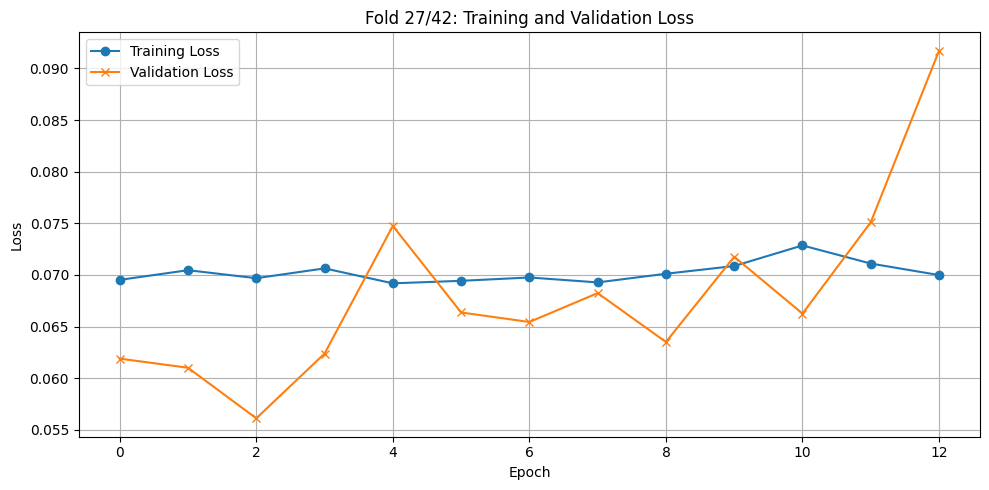


🔁 LOSO Fold 28/42: Đang huấn luyện trên 42 người, kiểm tra trên người thứ 28
Epoch 1/80 - Train Loss: 0.0704, Test Loss: 0.0497
Epoch 2/80 - Train Loss: 0.0700, Test Loss: 0.0493
Epoch 3/80 - Train Loss: 0.0696, Test Loss: 0.0417
EarlyStopping counter: 1 out of 10
Epoch 4/80 - Train Loss: 0.0695, Test Loss: 0.0510
EarlyStopping counter: 2 out of 10
Epoch 5/80 - Train Loss: 0.0696, Test Loss: 0.0481
EarlyStopping counter: 3 out of 10
Epoch 6/80 - Train Loss: 0.0707, Test Loss: 0.0488
EarlyStopping counter: 4 out of 10
Epoch 7/80 - Train Loss: 0.0701, Test Loss: 0.0586
EarlyStopping counter: 5 out of 10
Epoch 8/80 - Train Loss: 0.0705, Test Loss: 0.0463
EarlyStopping counter: 6 out of 10
Epoch 9/80 - Train Loss: 0.0694, Test Loss: 0.0528
EarlyStopping counter: 7 out of 10
Epoch 10/80 - Train Loss: 0.0697, Test Loss: 0.0494
EarlyStopping counter: 8 out of 10
Epoch 11/80 - Train Loss: 0.0703, Test Loss: 0.0642
EarlyStopping counter: 9 out of 10
Epoch 12/80 - Train Loss: 0.0708, Test Loss:

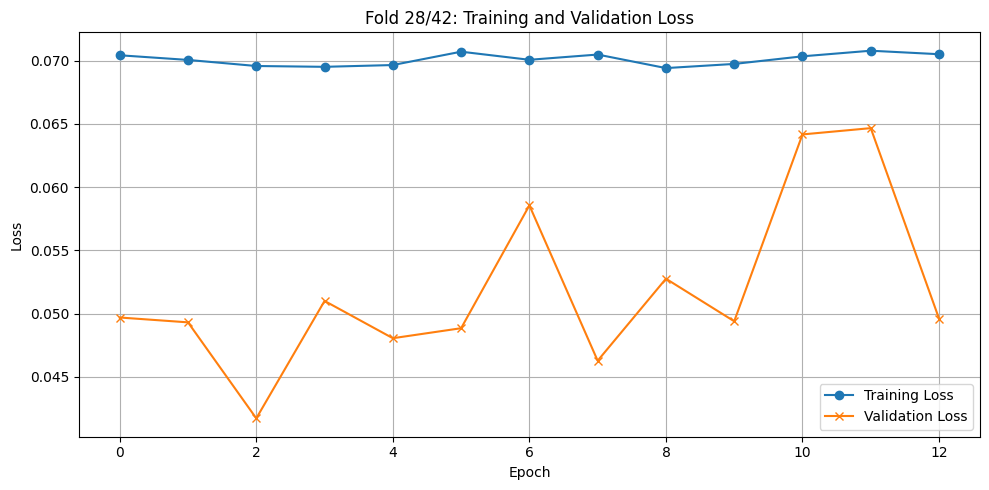


🔁 LOSO Fold 29/42: Đang huấn luyện trên 42 người, kiểm tra trên người thứ 29
Epoch 1/80 - Train Loss: 0.0713, Test Loss: 0.0336
EarlyStopping counter: 1 out of 10
Epoch 2/80 - Train Loss: 0.0697, Test Loss: 0.0357
Epoch 3/80 - Train Loss: 0.0733, Test Loss: 0.0321
EarlyStopping counter: 1 out of 10
Epoch 4/80 - Train Loss: 0.0703, Test Loss: 0.0360
EarlyStopping counter: 2 out of 10
Epoch 5/80 - Train Loss: 0.0703, Test Loss: 0.0603
Epoch 6/80 - Train Loss: 0.0710, Test Loss: 0.0306
EarlyStopping counter: 1 out of 10
Epoch 7/80 - Train Loss: 0.0705, Test Loss: 0.0398
EarlyStopping counter: 2 out of 10
Epoch 8/80 - Train Loss: 0.0705, Test Loss: 0.0356
EarlyStopping counter: 3 out of 10
Epoch 9/80 - Train Loss: 0.0698, Test Loss: 0.0355
EarlyStopping counter: 4 out of 10
Epoch 10/80 - Train Loss: 0.0695, Test Loss: 0.0391
EarlyStopping counter: 5 out of 10
Epoch 11/80 - Train Loss: 0.0705, Test Loss: 0.0380
EarlyStopping counter: 6 out of 10
Epoch 12/80 - Train Loss: 0.0693, Test Loss:

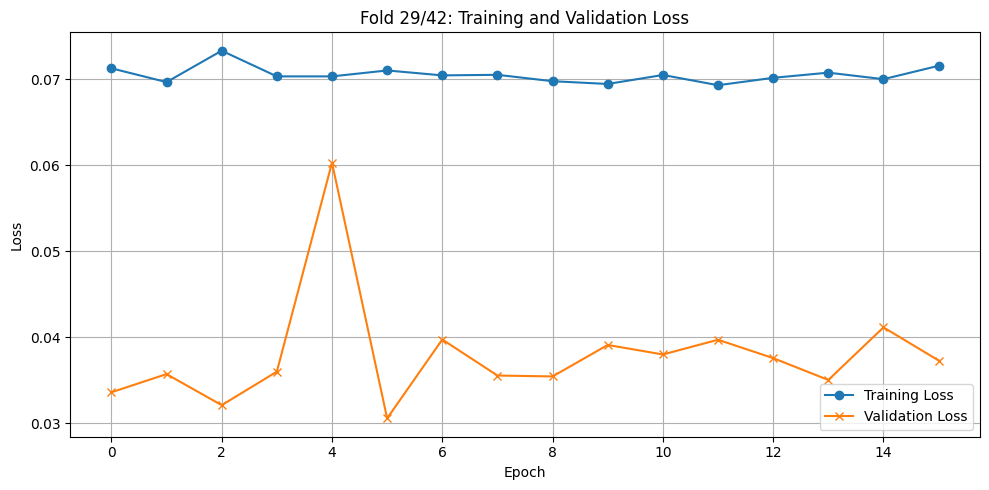


🔁 LOSO Fold 30/42: Đang huấn luyện trên 42 người, kiểm tra trên người thứ 30
Epoch 1/80 - Train Loss: 0.0704, Test Loss: 0.0367
EarlyStopping counter: 1 out of 10
Epoch 2/80 - Train Loss: 0.0699, Test Loss: 0.0371
EarlyStopping counter: 2 out of 10
Epoch 3/80 - Train Loss: 0.0703, Test Loss: 0.0466
EarlyStopping counter: 3 out of 10
Epoch 4/80 - Train Loss: 0.0699, Test Loss: 0.0441
EarlyStopping counter: 4 out of 10
Epoch 5/80 - Train Loss: 0.0689, Test Loss: 0.0889
EarlyStopping counter: 5 out of 10
Epoch 6/80 - Train Loss: 0.0750, Test Loss: 0.0467
EarlyStopping counter: 6 out of 10
Epoch 7/80 - Train Loss: 0.0692, Test Loss: 0.0424
EarlyStopping counter: 7 out of 10
Epoch 8/80 - Train Loss: 0.0689, Test Loss: 0.0471
EarlyStopping counter: 8 out of 10
Epoch 9/80 - Train Loss: 0.0715, Test Loss: 0.0396
EarlyStopping counter: 9 out of 10
Epoch 10/80 - Train Loss: 0.0698, Test Loss: 0.0459
EarlyStopping counter: 10 out of 10
Early stopping at epoch 11


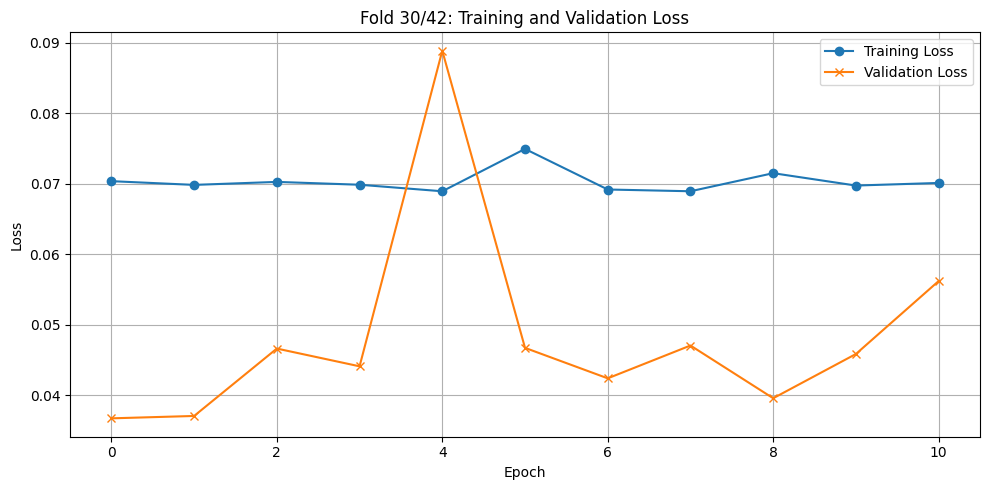


🔁 LOSO Fold 31/42: Đang huấn luyện trên 42 người, kiểm tra trên người thứ 31
Epoch 1/80 - Train Loss: 0.0685, Test Loss: 0.0960
EarlyStopping counter: 1 out of 10
Epoch 2/80 - Train Loss: 0.0691, Test Loss: 0.1252
EarlyStopping counter: 2 out of 10
Epoch 3/80 - Train Loss: 0.0975, Test Loss: 0.1168
EarlyStopping counter: 3 out of 10
Epoch 4/80 - Train Loss: 0.0785, Test Loss: 0.1096
EarlyStopping counter: 4 out of 10
Epoch 5/80 - Train Loss: 0.0696, Test Loss: 0.1415
EarlyStopping counter: 5 out of 10
Epoch 6/80 - Train Loss: 0.0726, Test Loss: 0.1010
EarlyStopping counter: 6 out of 10
Epoch 7/80 - Train Loss: 0.0708, Test Loss: 0.1096
EarlyStopping counter: 7 out of 10
Epoch 8/80 - Train Loss: 0.0676, Test Loss: 0.1037
EarlyStopping counter: 8 out of 10
Epoch 9/80 - Train Loss: 0.0671, Test Loss: 0.1100
EarlyStopping counter: 9 out of 10
Epoch 10/80 - Train Loss: 0.0674, Test Loss: 0.1038
Epoch 11/80 - Train Loss: 0.0678, Test Loss: 0.0960
EarlyStopping counter: 1 out of 10
Epoch 12/

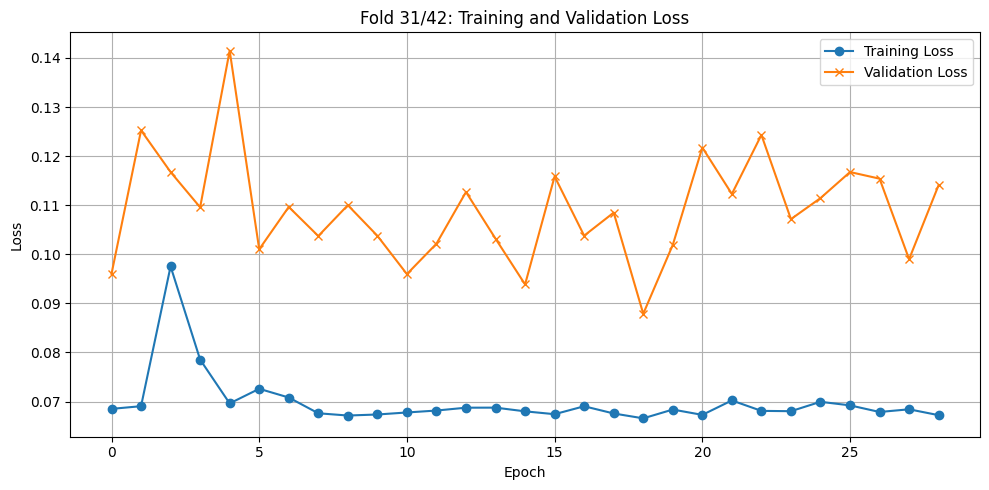


🔁 LOSO Fold 32/42: Đang huấn luyện trên 42 người, kiểm tra trên người thứ 32
Epoch 1/80 - Train Loss: 0.0702, Test Loss: 0.0408
EarlyStopping counter: 1 out of 10
Epoch 2/80 - Train Loss: 0.0692, Test Loss: 0.0431
EarlyStopping counter: 2 out of 10
Epoch 3/80 - Train Loss: 0.0704, Test Loss: 0.0414
EarlyStopping counter: 3 out of 10
Epoch 4/80 - Train Loss: 0.0704, Test Loss: 0.0449
EarlyStopping counter: 4 out of 10
Epoch 5/80 - Train Loss: 0.0689, Test Loss: 0.0525
EarlyStopping counter: 5 out of 10
Epoch 6/80 - Train Loss: 0.0692, Test Loss: 0.0468
EarlyStopping counter: 6 out of 10
Epoch 7/80 - Train Loss: 0.0690, Test Loss: 0.0504
EarlyStopping counter: 7 out of 10
Epoch 8/80 - Train Loss: 0.0693, Test Loss: 0.0524
EarlyStopping counter: 8 out of 10
Epoch 9/80 - Train Loss: 0.0693, Test Loss: 0.0543
EarlyStopping counter: 9 out of 10
Epoch 10/80 - Train Loss: 0.0707, Test Loss: 0.0523
EarlyStopping counter: 10 out of 10
Early stopping at epoch 11


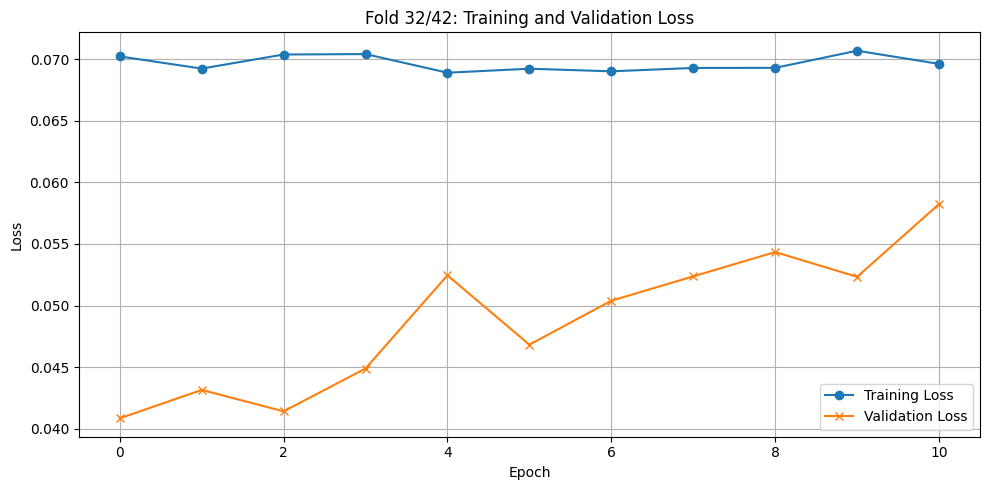


🔁 LOSO Fold 33/42: Đang huấn luyện trên 42 người, kiểm tra trên người thứ 33
Epoch 1/80 - Train Loss: 0.0698, Test Loss: 0.0235
Epoch 2/80 - Train Loss: 0.0687, Test Loss: 0.0235
EarlyStopping counter: 1 out of 10
Epoch 3/80 - Train Loss: 0.0692, Test Loss: 0.0255
EarlyStopping counter: 2 out of 10
Epoch 4/80 - Train Loss: 0.0690, Test Loss: 0.0340
Epoch 5/80 - Train Loss: 0.0703, Test Loss: 0.0234
EarlyStopping counter: 1 out of 10
Epoch 6/80 - Train Loss: 0.0713, Test Loss: 0.0340
EarlyStopping counter: 2 out of 10
Epoch 7/80 - Train Loss: 0.0688, Test Loss: 0.0279
EarlyStopping counter: 3 out of 10
Epoch 8/80 - Train Loss: 0.0709, Test Loss: 0.0420
EarlyStopping counter: 4 out of 10
Epoch 9/80 - Train Loss: 0.0693, Test Loss: 0.0249
EarlyStopping counter: 5 out of 10
Epoch 10/80 - Train Loss: 0.0701, Test Loss: 0.0275
EarlyStopping counter: 6 out of 10
Epoch 11/80 - Train Loss: 0.0706, Test Loss: 0.0247
EarlyStopping counter: 7 out of 10
Epoch 12/80 - Train Loss: 0.0703, Test Loss:

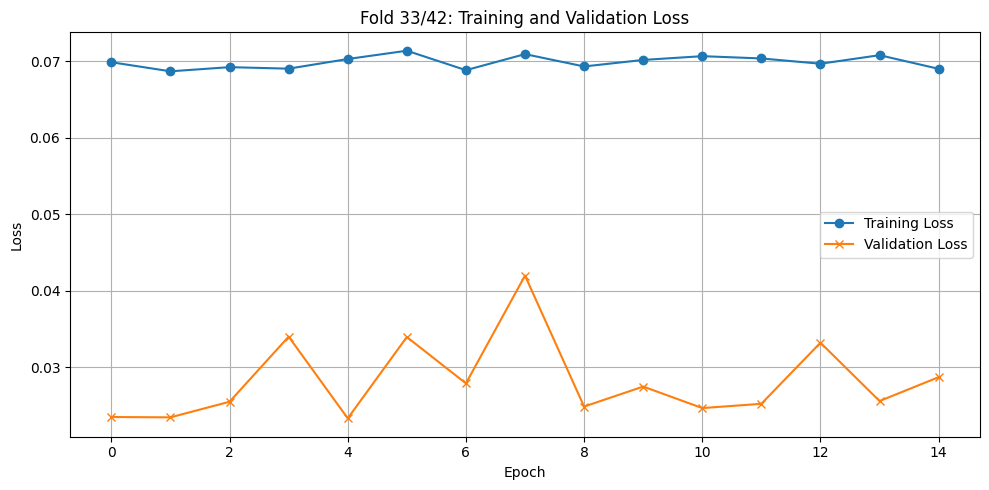


🔁 LOSO Fold 34/42: Đang huấn luyện trên 42 người, kiểm tra trên người thứ 34
Epoch 1/80 - Train Loss: 0.0701, Test Loss: 0.0832
Epoch 2/80 - Train Loss: 0.0688, Test Loss: 0.0509
EarlyStopping counter: 1 out of 10
Epoch 3/80 - Train Loss: 0.0697, Test Loss: 0.0683
EarlyStopping counter: 2 out of 10
Epoch 4/80 - Train Loss: 0.0685, Test Loss: 0.0568
EarlyStopping counter: 3 out of 10
Epoch 5/80 - Train Loss: 0.0676, Test Loss: 0.0581
EarlyStopping counter: 4 out of 10
Epoch 6/80 - Train Loss: 0.0697, Test Loss: 0.0654
EarlyStopping counter: 5 out of 10
Epoch 7/80 - Train Loss: 0.0698, Test Loss: 0.0618
EarlyStopping counter: 6 out of 10
Epoch 8/80 - Train Loss: 0.0687, Test Loss: 0.0983
EarlyStopping counter: 7 out of 10
Epoch 9/80 - Train Loss: 0.0693, Test Loss: 0.0864
EarlyStopping counter: 8 out of 10
Epoch 10/80 - Train Loss: 0.0680, Test Loss: 0.0986
EarlyStopping counter: 9 out of 10
Epoch 11/80 - Train Loss: 0.0685, Test Loss: 0.0886
EarlyStopping counter: 10 out of 10
Early st

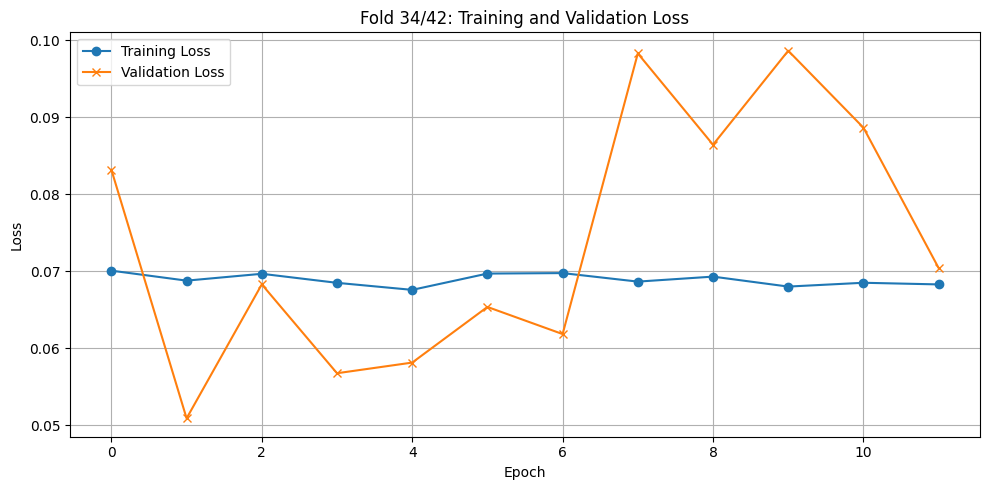


🔁 LOSO Fold 35/42: Đang huấn luyện trên 42 người, kiểm tra trên người thứ 35
Epoch 1/80 - Train Loss: 0.0691, Test Loss: 0.0557
EarlyStopping counter: 1 out of 10
Epoch 2/80 - Train Loss: 0.0689, Test Loss: 0.0633
EarlyStopping counter: 2 out of 10
Epoch 3/80 - Train Loss: 0.0684, Test Loss: 0.0574
EarlyStopping counter: 3 out of 10
Epoch 4/80 - Train Loss: 0.0685, Test Loss: 0.0801
EarlyStopping counter: 4 out of 10
Epoch 5/80 - Train Loss: 0.0685, Test Loss: 0.0604
EarlyStopping counter: 5 out of 10
Epoch 6/80 - Train Loss: 0.0680, Test Loss: 0.0583
EarlyStopping counter: 6 out of 10
Epoch 7/80 - Train Loss: 0.0683, Test Loss: 0.0606
EarlyStopping counter: 7 out of 10
Epoch 8/80 - Train Loss: 0.0686, Test Loss: 0.0642
EarlyStopping counter: 8 out of 10
Epoch 9/80 - Train Loss: 0.0689, Test Loss: 0.0609
EarlyStopping counter: 9 out of 10
Epoch 10/80 - Train Loss: 0.0687, Test Loss: 0.0653
EarlyStopping counter: 10 out of 10
Early stopping at epoch 11


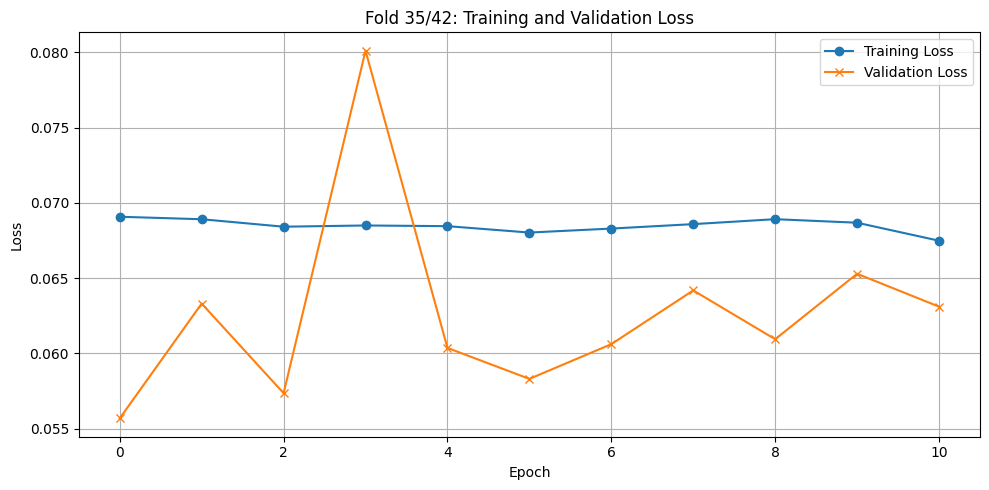


🔁 LOSO Fold 36/42: Đang huấn luyện trên 42 người, kiểm tra trên người thứ 36
Epoch 1/80 - Train Loss: 0.0688, Test Loss: 0.0587
Epoch 2/80 - Train Loss: 0.0688, Test Loss: 0.0537
Epoch 3/80 - Train Loss: 0.0679, Test Loss: 0.0526
EarlyStopping counter: 1 out of 10
Epoch 4/80 - Train Loss: 0.0693, Test Loss: 0.0589
EarlyStopping counter: 2 out of 10
Epoch 5/80 - Train Loss: 0.0685, Test Loss: 0.0539
EarlyStopping counter: 3 out of 10
Epoch 6/80 - Train Loss: 0.0694, Test Loss: 0.0533
EarlyStopping counter: 4 out of 10
Epoch 7/80 - Train Loss: 0.0684, Test Loss: 0.0584
EarlyStopping counter: 5 out of 10
Epoch 8/80 - Train Loss: 0.0678, Test Loss: 0.0538
Epoch 9/80 - Train Loss: 0.0698, Test Loss: 0.0513
EarlyStopping counter: 1 out of 10
Epoch 10/80 - Train Loss: 0.0690, Test Loss: 0.0520
EarlyStopping counter: 2 out of 10
Epoch 11/80 - Train Loss: 0.0674, Test Loss: 0.0583
EarlyStopping counter: 3 out of 10
Epoch 12/80 - Train Loss: 0.0695, Test Loss: 0.0670
EarlyStopping counter: 4 ou

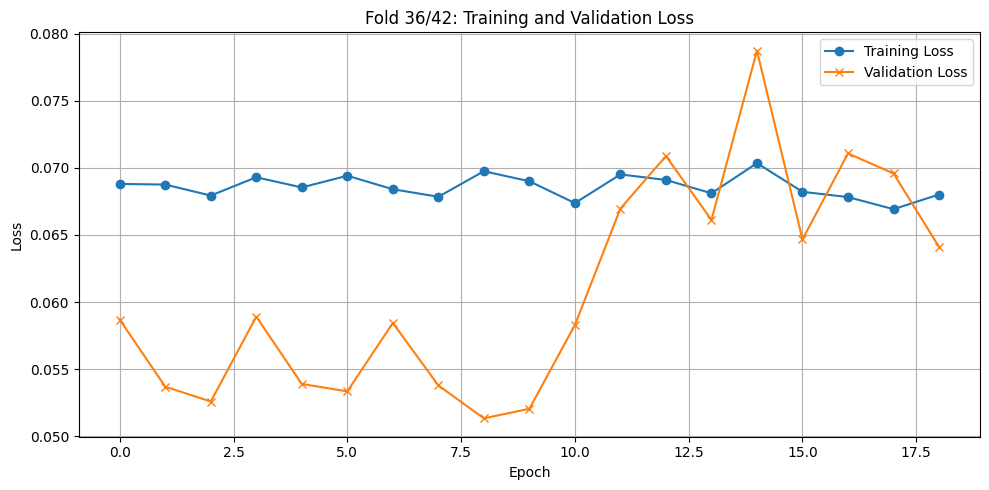


🔁 LOSO Fold 37/42: Đang huấn luyện trên 42 người, kiểm tra trên người thứ 37
Epoch 1/80 - Train Loss: 0.0723, Test Loss: 0.0416
EarlyStopping counter: 1 out of 10
Epoch 2/80 - Train Loss: 0.0712, Test Loss: 0.0534
EarlyStopping counter: 2 out of 10
Epoch 3/80 - Train Loss: 0.0693, Test Loss: 0.0454
EarlyStopping counter: 3 out of 10
Epoch 4/80 - Train Loss: 0.0680, Test Loss: 0.0486
EarlyStopping counter: 4 out of 10
Epoch 5/80 - Train Loss: 0.0677, Test Loss: 0.0571
EarlyStopping counter: 5 out of 10
Epoch 6/80 - Train Loss: 0.0782, Test Loss: 0.0546
EarlyStopping counter: 6 out of 10
Epoch 7/80 - Train Loss: 0.0711, Test Loss: 0.0535
EarlyStopping counter: 7 out of 10
Epoch 8/80 - Train Loss: 0.0696, Test Loss: 0.0549
EarlyStopping counter: 8 out of 10
Epoch 9/80 - Train Loss: 0.0683, Test Loss: 0.0644
EarlyStopping counter: 9 out of 10
Epoch 10/80 - Train Loss: 0.0674, Test Loss: 0.0625
EarlyStopping counter: 10 out of 10
Early stopping at epoch 11


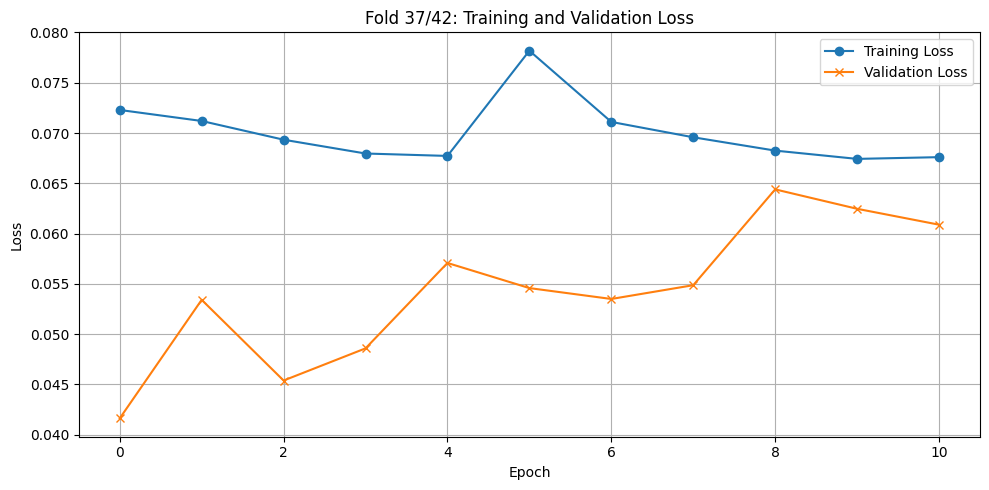


🔁 LOSO Fold 38/42: Đang huấn luyện trên 42 người, kiểm tra trên người thứ 38
Epoch 1/80 - Train Loss: 0.0688, Test Loss: 0.0433
EarlyStopping counter: 1 out of 10
Epoch 2/80 - Train Loss: 0.0681, Test Loss: 0.0469
EarlyStopping counter: 2 out of 10
Epoch 3/80 - Train Loss: 0.0689, Test Loss: 0.0466
EarlyStopping counter: 3 out of 10
Epoch 4/80 - Train Loss: 0.0685, Test Loss: 0.0469
EarlyStopping counter: 4 out of 10
Epoch 5/80 - Train Loss: 0.0687, Test Loss: 0.0494
EarlyStopping counter: 5 out of 10
Epoch 6/80 - Train Loss: 0.0679, Test Loss: 0.0474
EarlyStopping counter: 6 out of 10
Epoch 7/80 - Train Loss: 0.0687, Test Loss: 0.0537
EarlyStopping counter: 7 out of 10
Epoch 8/80 - Train Loss: 0.0674, Test Loss: 0.0539
EarlyStopping counter: 8 out of 10
Epoch 9/80 - Train Loss: 0.0679, Test Loss: 0.0571
EarlyStopping counter: 9 out of 10
Epoch 10/80 - Train Loss: 0.0676, Test Loss: 0.0558
EarlyStopping counter: 10 out of 10
Early stopping at epoch 11


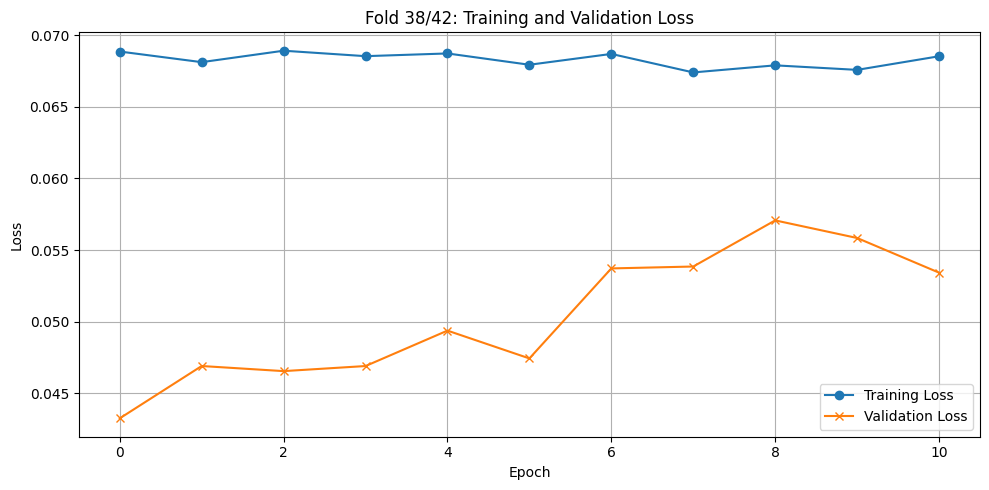


🔁 LOSO Fold 39/42: Đang huấn luyện trên 42 người, kiểm tra trên người thứ 39
Epoch 1/80 - Train Loss: 0.0681, Test Loss: 0.0351
Epoch 2/80 - Train Loss: 0.0676, Test Loss: 0.0349
EarlyStopping counter: 1 out of 10
Epoch 3/80 - Train Loss: 0.0677, Test Loss: 0.0412
EarlyStopping counter: 2 out of 10
Epoch 4/80 - Train Loss: 0.0690, Test Loss: 0.0391
EarlyStopping counter: 3 out of 10
Epoch 5/80 - Train Loss: 0.0691, Test Loss: 0.0404
EarlyStopping counter: 4 out of 10
Epoch 6/80 - Train Loss: 0.0692, Test Loss: 0.0430
EarlyStopping counter: 5 out of 10
Epoch 7/80 - Train Loss: 0.0689, Test Loss: 0.0381
EarlyStopping counter: 6 out of 10
Epoch 8/80 - Train Loss: 0.0680, Test Loss: 0.0437
EarlyStopping counter: 7 out of 10
Epoch 9/80 - Train Loss: 0.0708, Test Loss: 0.0415
EarlyStopping counter: 8 out of 10
Epoch 10/80 - Train Loss: 0.0680, Test Loss: 0.0388
EarlyStopping counter: 9 out of 10
Epoch 11/80 - Train Loss: 0.0682, Test Loss: 0.0410
EarlyStopping counter: 10 out of 10
Early st

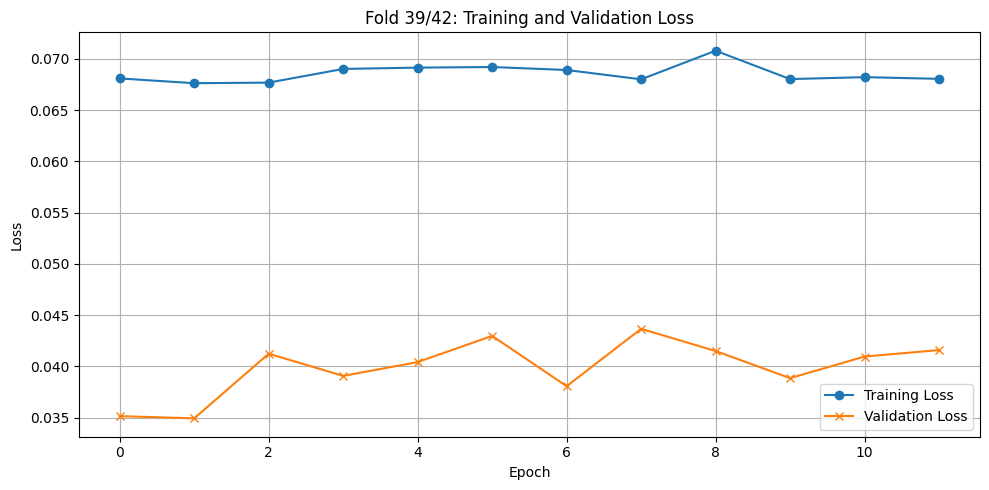


🔁 LOSO Fold 40/42: Đang huấn luyện trên 42 người, kiểm tra trên người thứ 40
Epoch 1/80 - Train Loss: 0.0679, Test Loss: 0.0259
EarlyStopping counter: 1 out of 10
Epoch 2/80 - Train Loss: 0.0685, Test Loss: 0.0334
EarlyStopping counter: 2 out of 10
Epoch 3/80 - Train Loss: 0.0685, Test Loss: 0.0360
EarlyStopping counter: 3 out of 10
Epoch 4/80 - Train Loss: 0.0686, Test Loss: 0.0436
EarlyStopping counter: 4 out of 10
Epoch 5/80 - Train Loss: 0.0686, Test Loss: 0.0453
EarlyStopping counter: 5 out of 10
Epoch 6/80 - Train Loss: 0.0691, Test Loss: 0.0437
EarlyStopping counter: 6 out of 10
Epoch 7/80 - Train Loss: 0.0681, Test Loss: 0.0582
EarlyStopping counter: 7 out of 10
Epoch 8/80 - Train Loss: 0.0695, Test Loss: 0.0567
EarlyStopping counter: 8 out of 10
Epoch 9/80 - Train Loss: 0.0687, Test Loss: 0.0623
EarlyStopping counter: 9 out of 10
Epoch 10/80 - Train Loss: 0.0679, Test Loss: 0.0653
EarlyStopping counter: 10 out of 10
Early stopping at epoch 11


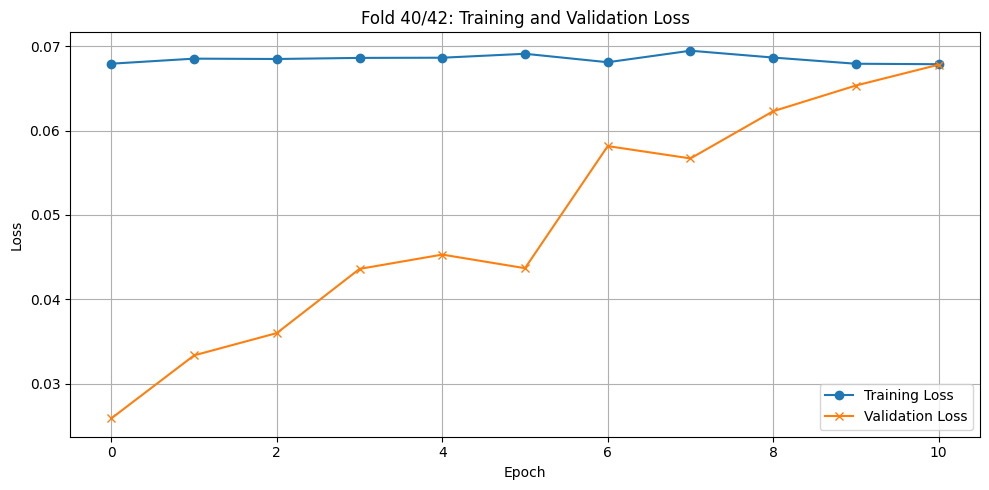


🔁 LOSO Fold 41/42: Đang huấn luyện trên 42 người, kiểm tra trên người thứ 41
Epoch 1/80 - Train Loss: 0.0694, Test Loss: 0.0382
Epoch 2/80 - Train Loss: 0.0692, Test Loss: 0.0351
Epoch 3/80 - Train Loss: 0.0676, Test Loss: 0.0305
EarlyStopping counter: 1 out of 10
Epoch 4/80 - Train Loss: 0.0675, Test Loss: 0.0329
EarlyStopping counter: 2 out of 10
Epoch 5/80 - Train Loss: 0.0688, Test Loss: 0.0345
EarlyStopping counter: 3 out of 10
Epoch 6/80 - Train Loss: 0.0685, Test Loss: 0.0391
EarlyStopping counter: 4 out of 10
Epoch 7/80 - Train Loss: 0.0692, Test Loss: 0.0397
EarlyStopping counter: 5 out of 10
Epoch 8/80 - Train Loss: 0.0700, Test Loss: 0.0348
EarlyStopping counter: 6 out of 10
Epoch 9/80 - Train Loss: 0.0697, Test Loss: 0.0332
EarlyStopping counter: 7 out of 10
Epoch 10/80 - Train Loss: 0.0694, Test Loss: 0.0427
EarlyStopping counter: 8 out of 10
Epoch 11/80 - Train Loss: 0.0686, Test Loss: 0.0374
EarlyStopping counter: 9 out of 10
Epoch 12/80 - Train Loss: 0.0683, Test Loss:

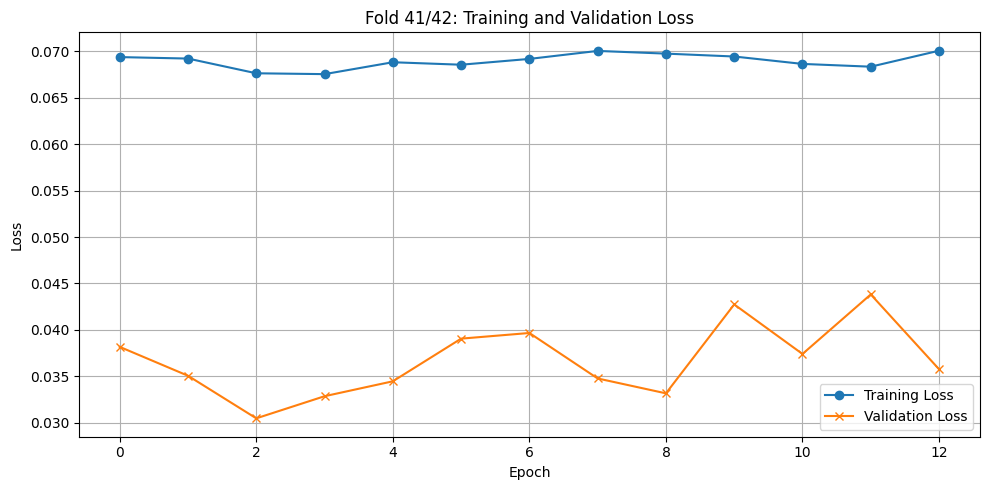


🔁 LOSO Fold 42/42: Đang huấn luyện trên 42 người, kiểm tra trên người thứ 42
Epoch 1/80 - Train Loss: 0.0685, Test Loss: 0.0525
EarlyStopping counter: 1 out of 10
Epoch 2/80 - Train Loss: 0.0679, Test Loss: 0.0576
EarlyStopping counter: 2 out of 10
Epoch 3/80 - Train Loss: 0.0677, Test Loss: 0.0567
EarlyStopping counter: 3 out of 10
Epoch 4/80 - Train Loss: 0.0695, Test Loss: 0.0561
EarlyStopping counter: 4 out of 10
Epoch 5/80 - Train Loss: 0.0683, Test Loss: 0.0624
EarlyStopping counter: 5 out of 10
Epoch 6/80 - Train Loss: 0.0678, Test Loss: 0.0564
Epoch 7/80 - Train Loss: 0.0674, Test Loss: 0.0501
EarlyStopping counter: 1 out of 10
Epoch 8/80 - Train Loss: 0.0674, Test Loss: 0.0632
EarlyStopping counter: 2 out of 10
Epoch 9/80 - Train Loss: 0.0672, Test Loss: 0.0568
EarlyStopping counter: 3 out of 10
Epoch 10/80 - Train Loss: 0.0672, Test Loss: 0.0640
EarlyStopping counter: 4 out of 10
Epoch 11/80 - Train Loss: 0.0662, Test Loss: 0.0629
EarlyStopping counter: 5 out of 10
Epoch 12/

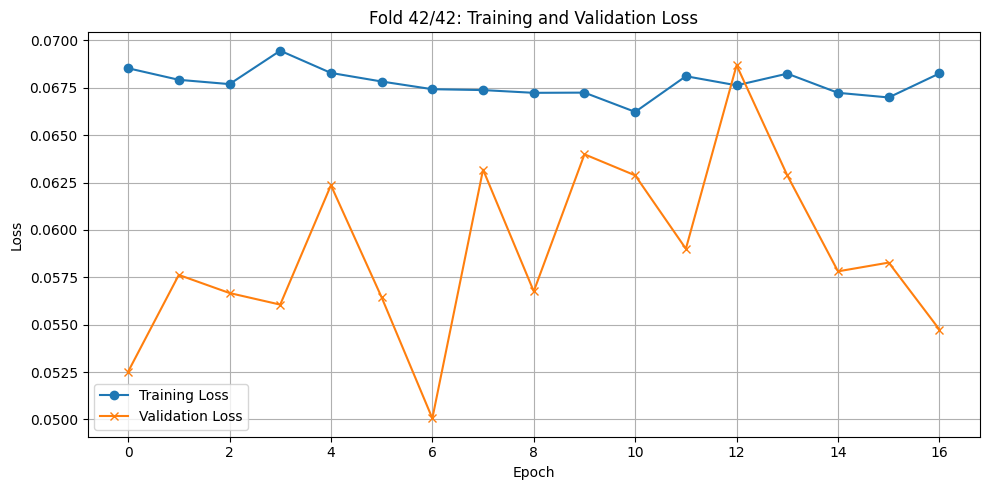

In [ ]:
models = train_loso(
    subjects_data=precoss,
    model=model,
    criterion=criterion,
    optimizer=optimizer)

In [ ]:
# Sử dụng cho lần thực hiện đầu tiên (kiểm tra trên đối tượng 0)
train_ppg, train_capno, test_ppg, test_capno = leave_one_subject_out(precoss, 0)
train_loader,test_loader = create_dataloader(train_ppg,test_ppg,train_capno,test_capno)

In [ ]:
import torch

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

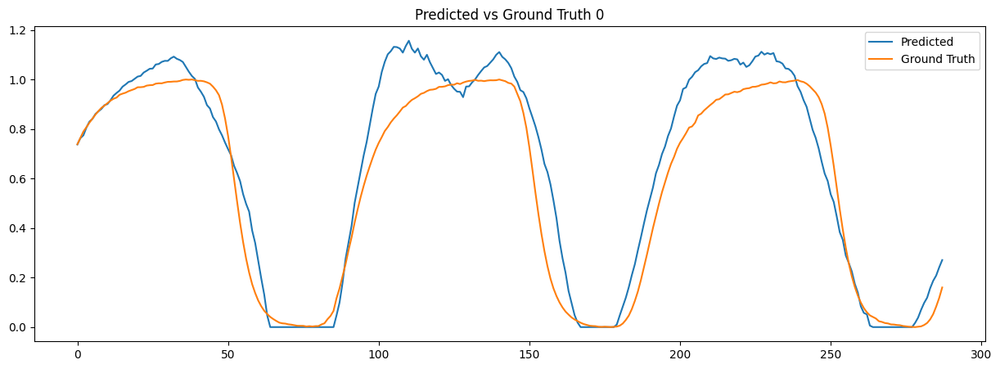

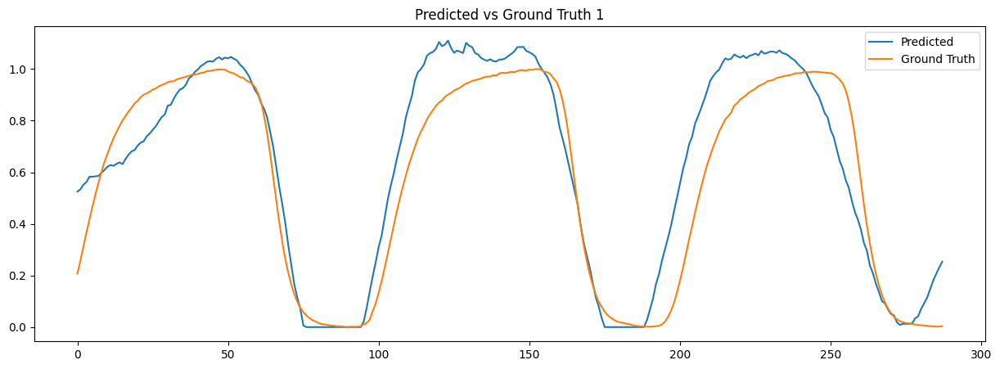

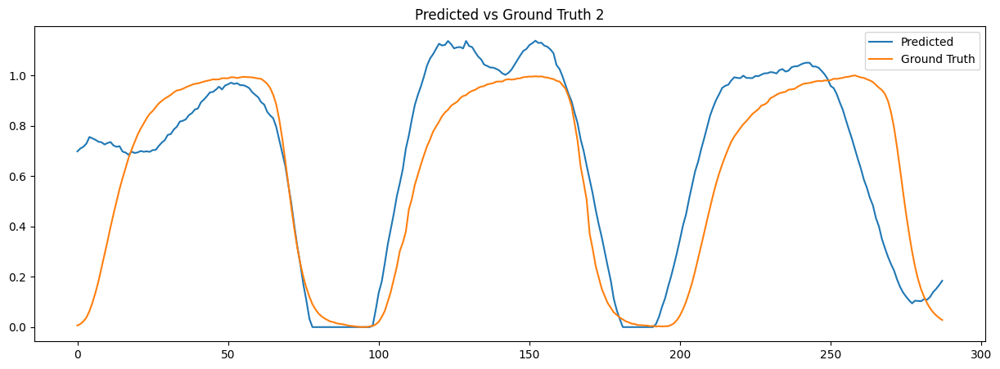

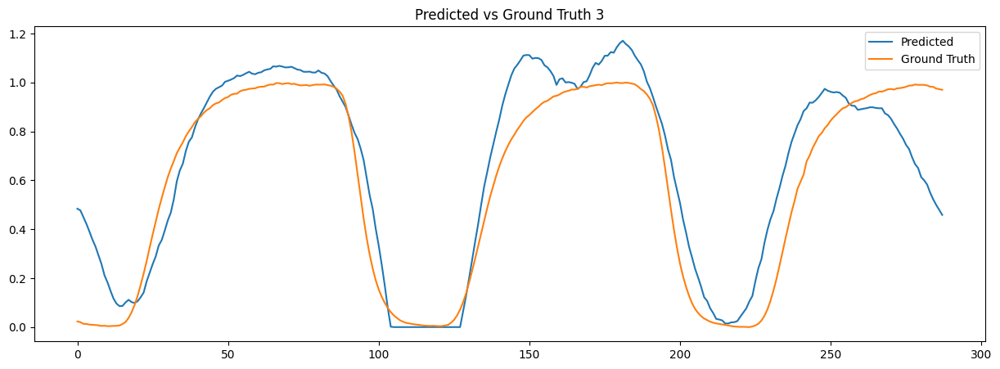

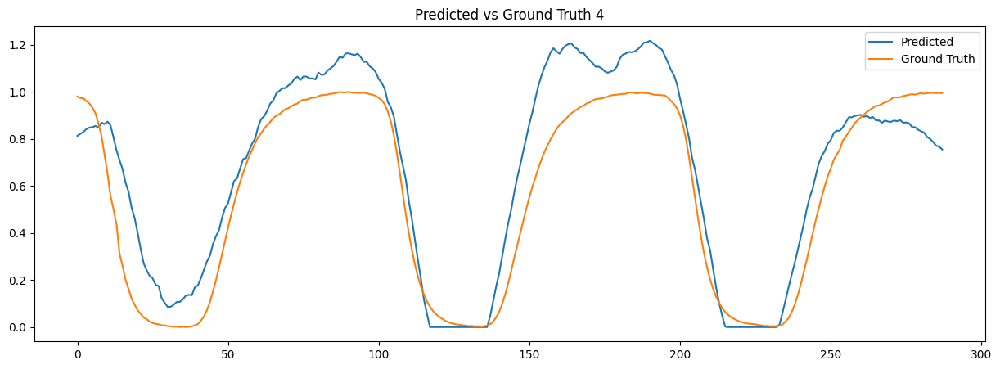

...

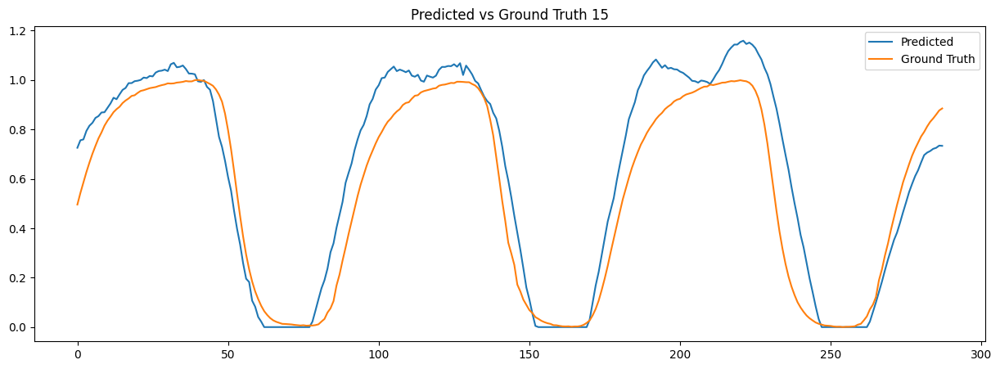

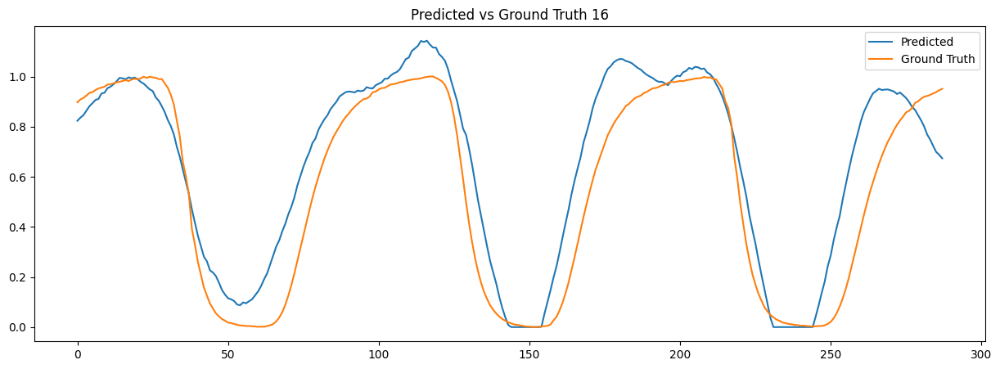

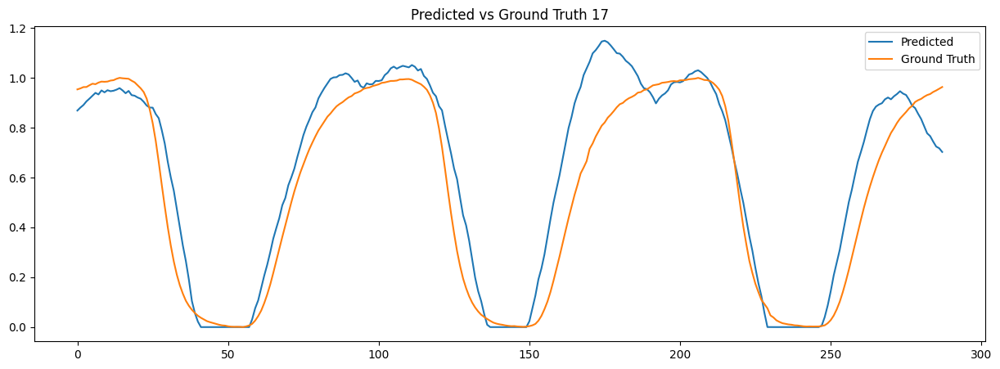

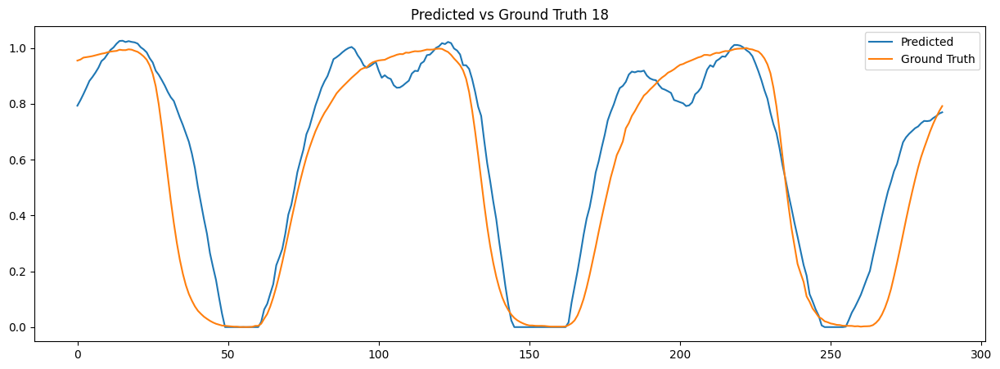

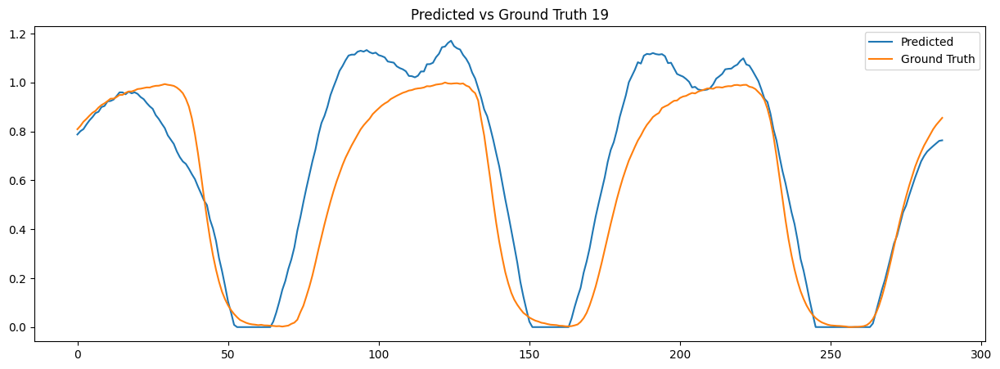

In [ ]:
models.eval()
ppg_batch, capno_batch = next(iter(test_loader))
with torch.no_grad():
  outputs = models(ppg_batch.to(device))
  for i in range(20):
    plt.figure(figsize=(15,5))
    plt.plot(outputs[i].cpu().numpy(), label='Predicted')
    plt.plot(capno_batch[i].numpy(), label='Ground Truth')
    plt.title(f"Predicted vs Ground Truth {i}")
    plt.legend()
  plt.show()

In [ ]:
model_path_9_6 = os.path.join(model_path, 'preprocessing')
# Tạo thư mục nếu chưa tồn tại
os.makedirs(model_path_9_6, exist_ok=True)

In [ ]:
torch.save(models.state_dict(), f"{model_path_9_6}/corr_encoder_model.pth")

### Phần 4: Đánh giá và so sánh hiệu suất (20%)

#### 4.1 Tính toán sai số tuyệt đối trung bình (MAE) cho dạng sóng

- Phương pháp Corr-encoder

In [ ]:
model = CorrEncoder()
model.load_state_dict(torch.load(f"{model_path_9_6}/corr_encoder_model.pth", map_location=torch.device('cpu')))
model.eval()

CorrEncoder(
  (encoder): Sequential(
    (0): Conv1d(1, 8, kernel_size=(150,), stride=(1,), padding=(20,))
    (1): ReLU()
    (2): Dropout(p=0.5, inplace=False)
    (3): Conv1d(8, 8, kernel_size=(75,), stride=(1,), padding=(10,))
    (4): ReLU()
    (5): Dropout(p=0.5, inplace=False)
    (6): Conv1d(8, 8, kernel_size=(50,), stride=(1,))
    (7): Sigmoid()
    (8): Dropout(p=0.5, inplace=False)
  )
  (decoder): Sequential(
    (0): ConvTranspose1d(8, 8, kernel_size=(50,), stride=(1,))
    (1): Sigmoid()
    (2): ConvTranspose1d(8, 8, kernel_size=(75,), stride=(1,), padding=(10,))
    (3): ReLU()
    (4): ConvTranspose1d(8, 1, kernel_size=(150,), stride=(1,), padding=(20,))
    (5): ReLU()
  )
)

In [ ]:
#load data
import pickle

with open(f'{preprocess}/precoss_9_6.pkl', 'rb') as f:
    precoss = pickle.load(f)
    print('Load success!')

Load success!


In [ ]:
# Sử dụng cho lần thực hiện đầu tiên (kiểm tra trên đối tượng 0)
train_ppg, train_capno, test_ppg, test_capno = leave_one_subject_out(precoss, 0)
train_loader,test_loader = create_dataloader(train_ppg,test_ppg,train_capno,test_capno)

In [ ]:
def calculate_waveform_mae(predicted, ground_truth):
    """Tính MAE giữa dạng sóng được dự đoán và tham chiếu tiêu chuẩn vàng"""
    return np.mean(np.abs(predicted - ground_truth))

In [ ]:
# Đánh giá mô hình trên dữ liệu kiểm tra
model = model.to(device)
model.eval()
maes = []
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

with torch.no_grad():
    for ppg_batch, capno_batch in test_loader:
        ppg_batch, capno_batch = ppg_batch.to(device), capno_batch.to(device)

        # Forward pass
        outputs = model(ppg_batch)

        # Chuyển về numpy để tính MAE
        outputs_np = outputs.cpu().numpy()
        capno_np = capno_batch.cpu().numpy()

        # Tính MAE cho từng mẫu trong batch
        for i in range(outputs_np.shape[0]):
            mae = calculate_waveform_mae(outputs_np[i], capno_np[i])
            maes.append(mae)

In [ ]:
median_mae = np.median(maes)
q1 = np.percentile(maes, 25)
q3 = np.percentile(maes, 75)

In [ ]:
print(f"Waveform MAE - Median: {median_mae:.4f}, Q1: {q1:.4f}, Q3: {q3:.4f}")

Waveform MAE - Median: 0.1268, Q1: 0.1106, Q3: 0.1593


- Phương pháp PLS

In [ ]:
from sklearn.cross_decomposition import PLSRegression

def evaluate_pls_loso(subjects_data, n_components=26):
    train_ppg, train_capno, test_ppg, test_capno = leave_one_subject_out(subjects_data, 0)
    pls = PLSRegression(n_components=n_components)
    pls.fit(train_ppg, train_capno)
    predicted_capno = pls.predict(test_ppg)
    return pls

In [ ]:
plsmodel = evaluate_pls_loso(precoss, n_components=26)

In [ ]:
pls_maes = []

for ppg_batch, capno_batch in test_loader:
    # Nếu dữ liệu là torch.Tensor, cần chuyển về numpy
    ppg_batch_np = ppg_batch.numpy()
    capno_batch_np = capno_batch.numpy()

    # Predict từ mô hình PLS
    outputs = plsmodel.predict(ppg_batch_np)  # đầu ra là numpy luôn

    for i in range(outputs.shape[0]):
        mae = calculate_waveform_mae(outputs[i], capno_batch_np[i])
        pls_maes.append(mae)

In [ ]:
median_mae = np.median(pls_maes)
q1 = np.percentile(pls_maes, 25)
q3 = np.percentile(pls_maes, 75)

In [ ]:
print(f"Waveform MAE - Median: {median_mae:.4f}, Q1: {q1:.4f}, Q3: {q3:.4f}")

Waveform MAE - Median: 0.2835, Q1: 0.2420, Q3: 0.3051


- So Sánh

<ipython-input-41-9fc4076e16a9>:2: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot([maes, pls_maes], labels=['Corr-Encoder', 'PLS'])


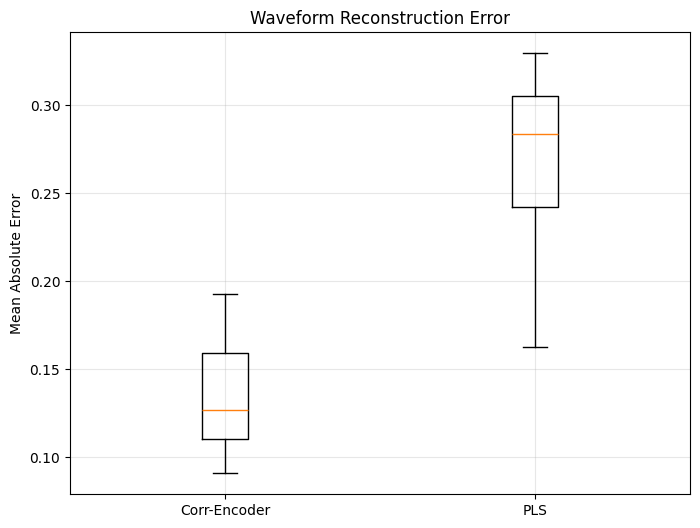

In [ ]:
plt.figure(figsize=(8, 6))
plt.boxplot([maes, pls_maes], labels=['Corr-Encoder', 'PLS'])
plt.ylabel('Mean Absolute Error')
plt.title('Waveform Reconstruction Error')
plt.grid(True, alpha=0.3)
plt.show()

#### 4.2 Ước tính tần số hô hấp (Respiratory Rate)

- Trên bộ capnobase

In [ ]:
#load data
import pickle

with open(f'{preprocess}/precoss_9_6.pkl', 'rb') as f:
    precoss = pickle.load(f)
    print('Load success!')

Load success!


In [ ]:
import numpy as np
from scipy.signal import find_peaks, butter, filtfilt

def estimate_respiratory_rate(waveform, fs=30):
    """
    Ước tính tần số hô hấp bằng FFT, với lọc tín hiệu và làm mịn để tăng độ nhạy.

    - waveform: Tín hiệu hô hấp (dạng sóng)
    - fs: Tần số lấy mẫu (Hz)

    Trả về:
    - respiratory_rate: Tần số hô hấp (nhịp/phút)
    """
    # === 1. BƯỚC TIỀN XỬ LÝ: LỌC BĂNG ===
    # Giữ lại dải tần hô hấp (0.05 - 1.0 Hz)
    lowcut, highcut = 0.05, 1.0
    nyq = 0.5 * fs
    b, a = butter(N=4, Wn=[lowcut / nyq, highcut / nyq], btype='band')
    filtered_waveform = filtfilt(b, a, waveform)

    # === 2. FFT VỚI ZERO-PADDING (LÀM MỊN) ===
    n = len(filtered_waveform)
    n_padded = 2**int(np.ceil(np.log2(n)) + 2)  # Zero-padding gấp 4 lần
    fft_result = np.fft.fft(filtered_waveform, n=n_padded)
    power = np.abs(fft_result)**2
    freqs = np.fft.fftfreq(n_padded, 1/fs)

    # === 3. CHỌN DẢI TẦN CÓ Ý NGHĨA ===
    idx = np.where((freqs > 0.05) & (freqs < 1))[0]
    valid_power = power[idx]
    valid_freqs = freqs[idx]

    # === 4. TÌM ĐỈNH KHÔNG DÙNG NGƯỠNG CỨNG ===
    peaks, _ = find_peaks(valid_power, distance=fs//2)  # Cách nhau tối thiểu 0.5s

    if len(peaks) == 0:
        dominant_freq = valid_freqs[np.argmax(valid_power)]
    else:
        dominant_freq = valid_freqs[peaks[np.argmax(valid_power[peaks])]]

    # === 5. ĐỔI TẦN SỐ THÀNH NHỊP/PHÚT ===
    respiratory_rate = dominant_freq * 60

    return respiratory_rate


In [ ]:
train_ppg, train_capno, test_ppg, test_capno = leave_one_subject_out(precoss, 0)
train_loader, test_loader0 = create_dataloader(train_ppg, test_ppg, train_capno, test_capno)

In [ ]:
from torch.utils.data import ConcatDataset, DataLoader

# Bước 1: Trích dataset từ mỗi test_loader
dataset0 = test_loader0.dataset
dataset1 = train_loader.dataset

# Bước 2: Kết hợp lại bằng ConcatDataset
combined_dataset = ConcatDataset([dataset0, dataset1])

# Bước 3: Tạo lại DataLoader
combined_test_loader = DataLoader(combined_dataset, batch_size=32, shuffle=False)


In [ ]:
model.eval()
predicted_rrs = []
reference_rrs = []

In [ ]:
with torch.no_grad():
    for ppg_batch, capno_batch in combined_test_loader:
        ppg_batch, capno_batch = ppg_batch.to(device), capno_batch.to(device)

        # Forward pass
        outputs = model(ppg_batch)

        # Chuyển về numpy
        outputs_np = outputs.cpu().numpy()
        capno_np = capno_batch.cpu().numpy()

        # Tính tần số hô hấp cho từng mẫu
        for i in range(outputs_np.shape[0]):
            # Tần số hô hấp từ dạng sóng dự đoán
            pred_rr = estimate_respiratory_rate(outputs_np[i])
            predicted_rrs.append(pred_rr)

            # Tần số hô hấp từ capnography tham chiếu
            ref_rr = estimate_respiratory_rate(capno_np[i])
            reference_rrs.append(ref_rr)

In [ ]:
reference_rrs

[np.float64(17.578125),
 np.float64(17.578125),
 np.float64(16.69921875),
 np.float64(16.69921875),
 np.float64(18.45703125),
 np.float64(17.578125),
 np.float64(16.69921875),
 np.float64(16.69921875),
 np.float64(15.8203125),
 np.float64(16.69921875),
 np.float64(16.69921875),
 np.float64(16.69921875),
 np.float64(17.578125),
 np.float64(18.45703125),
 np.float64(18.45703125),
 np.float64(19.3359375),
 np.float64(19.3359375),
 np.float64(18.45703125),
 np.float64(16.69921875),
 np.float64(18.45703125),
 np.float64(18.45703125),
 np.float64(19.3359375),
 np.float64(18.45703125),
 np.float64(16.69921875),
 np.float64(18.45703125),
 np.float64(17.578125),
 np.float64(16.69921875),
 np.float64(16.69921875),
 np.float64(16.69921875),
 np.float64(17.578125),
 np.float64(16.69921875),
 np.float64(17.578125),
 np.float64(17.578125),
 np.float64(16.69921875),
 np.float64(18.45703125),
 np.float64(16.69921875),
 np.float64(20.21484375),
 np.float64(23.73046875),
 np.float64(22.8515625),
 np.flo

In [ ]:
predicted_rrs

[np.float64(17.578125),
 np.float64(18.45703125),
 np.float64(18.45703125),
 np.float64(17.578125),
 np.float64(18.45703125),
 np.float64(18.45703125),
 np.float64(16.69921875),
 np.float64(18.45703125),
 np.float64(17.578125),
 np.float64(17.578125),
 np.float64(17.578125),
 np.float64(17.578125),
 np.float64(18.45703125),
 np.float64(19.3359375),
 np.float64(18.45703125),
 np.float64(18.45703125),
 np.float64(20.21484375),
 np.float64(19.3359375),
 np.float64(18.45703125),
 np.float64(17.578125),
 np.float64(18.45703125),
 np.float64(19.3359375),
 np.float64(18.45703125),
 np.float64(18.45703125),
 np.float64(18.45703125),
 np.float64(17.578125),
 np.float64(18.45703125),
 np.float64(18.45703125),
 np.float64(17.578125),
 np.float64(17.578125),
 np.float64(17.578125),
 np.float64(17.578125),
 np.float64(18.45703125),
 np.float64(17.578125),
 np.float64(19.3359375),
 np.float64(16.69921875),
 np.float64(21.97265625),
 np.float64(24.609375),
 np.float64(23.73046875),
 np.float64(23.730

In [ ]:
# Tính sai số tuyệt đối cho tần số hô hấp
rr_errors = np.abs(np.array(predicted_rrs) - np.array(reference_rrs))

# Tính mAE (median Absolute Error) - sai số tuyệt đối trung vị trên tất cả các cửa sổ
mae_rr = np.median(rr_errors)

In [ ]:
subject_mae = {}

In [ ]:
for i in range(len(precoss)):
  subject_id = precoss[i]["id"]
  with torch.no_grad():
    ppg_tensor = torch.tensor(precoss[i]["ppg_segments"], dtype=torch.float32).to(device)
    outputs = model(ppg_tensor)
    outputs_np = outputs.cpu().numpy()
    capno_np = precoss[i]["capno_segments"]
    reference_rrs1 = []
    predicted_rrs1 = []
    # Tính tần số hô hấp cho từng mẫu
    for j in range(outputs_np.shape[0]):
        pred_rr = estimate_respiratory_rate(outputs_np[j])  # Dùng j thay vì i
        predicted_rrs1.append(pred_rr)
        ref_rr = estimate_respiratory_rate(capno_np[j])
        reference_rrs1.append(ref_rr)
    # Tính sai số tuyệt đối
    rr_errors = np.abs(np.array(predicted_rrs1) - np.array(reference_rrs1))
    # Kiểm tra và khởi tạo subject_id trong subject_mae nếu chưa có
    if subject_id not in subject_mae:
        subject_mae[subject_id] = []
    # Thêm sai số cho từng mẫu
    subject_mae[subject_id].append(rr_errors)


In [ ]:
# Tính MAE trung bình cho mỗi đối tượng
subject_mean_mae = [np.mean(errors) for errors in subject_mae.values()]
# Tính trung vị của các MAE trung bình
mmae_rr = np.median(subject_mean_mae)

In [ ]:
print(f"Subject mean mae:")
for index,item in enumerate(subject_mean_mae):
  print(f"Subject {index} : {item}")

Subject mean mae:
Subject 0 : 0.791015625
Subject 1 : 2.6015625
Subject 2 : 0.826171875
Subject 3 : 0.9140625
Subject 4 : 2.513671875
Subject 5 : 1.283203125
Subject 6 : 1.0546875
Subject 7 : 0.720703125
Subject 8 : 1.1953125
Subject 9 : 3.65625
Subject 10 : 0.52734375
Subject 11 : 1.810546875
Subject 12 : 0.615234375
Subject 13 : 2.091796875
Subject 14 : 3.1640625
Subject 15 : 2.98828125
Subject 16 : 12.0234375
Subject 17 : 0.73828125
Subject 18 : 1.037109375
Subject 19 : 3.216796875
Subject 20 : 0.703125
Subject 21 : 1.08984375
Subject 22 : 5.6953125
Subject 23 : 0.650390625
Subject 24 : 3.638671875
Subject 25 : 1.01953125
Subject 26 : 0.755859375
Subject 27 : 0.826171875
Subject 28 : 0.59765625
Subject 29 : 2.56640625
Subject 30 : 2.021484375
Subject 31 : 0.685546875
Subject 32 : 0.66796875
Subject 33 : 0.984375
Subject 34 : 0.94921875
Subject 35 : 1.546875
Subject 36 : 0.59765625
Subject 37 : 0.966796875
Subject 38 : 0.685546875
Subject 39 : 0.2109375
Subject 40 : 0.66796875
Subjec

In [ ]:
print(f"Respiratory Rate Estimation Results:")
print(f"Median Absolute Error (mAE): {mae_rr:.2f} bpm")
print(f"Median Mean Absolute Error (mMAE): {mmae_rr:.2f} bpm")

Respiratory Rate Estimation Results:
Median Absolute Error (mAE): 0.88 bpm
Median Mean Absolute Error (mMAE): 1.00 bpm


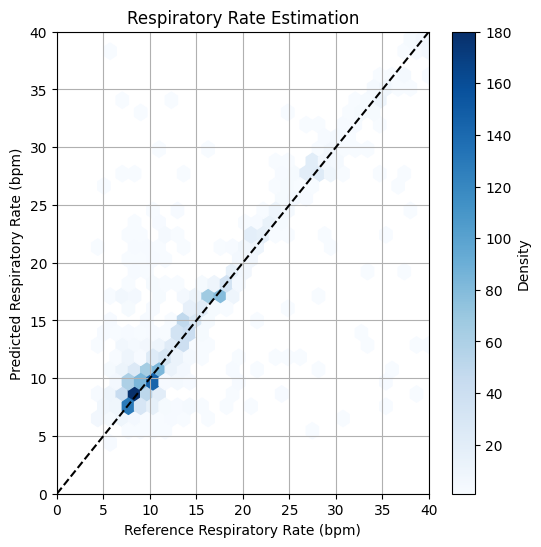

In [ ]:
plt.figure(figsize=(6, 6))

# Vẽ biểu đồ hexbin để thể hiện mật độ
plt.hexbin(reference_rrs, predicted_rrs, gridsize=30,  cmap='Blues', mincnt=1)

# Đường y = x
plt.plot([0, 40], [0, 40], 'k--')

plt.xlabel('Reference Respiratory Rate (bpm)')
plt.ylabel('Predicted Respiratory Rate (bpm)')
plt.grid(True)
plt.title('Respiratory Rate Estimation')
plt.colorbar(label='Density')
plt.xlim(0, 40)
plt.ylim(0, 40)
plt.show()


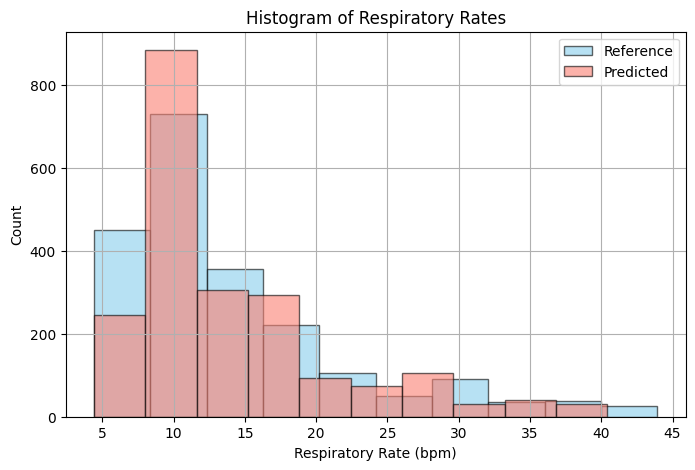

In [ ]:
plt.figure(figsize=(8, 5))

# Histogram của Reference và Predicted
plt.hist(reference_rrs, bins=10, alpha=0.6, label='Reference', color='skyblue', edgecolor='black')
plt.hist(predicted_rrs, bins=10, alpha=0.6, label='Predicted', color='salmon', edgecolor='black')

plt.xlabel('Respiratory Rate (bpm)')
plt.ylabel('Count')
plt.title('Histogram of Respiratory Rates')
plt.legend()
plt.grid(True)
plt.show()


#### 4.3 Đánh giá ảnh hưởng của kích thước cửa sổ đến độ chính xác

In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [ ]:
folder_path = "/content/drive/MyDrive/dataIOT/CapnoBase IEEE TBME Respiratory Rate Benchmark/dataverse_files/data/csv"
csv_files = glob.glob(os.path.join(folder_path, "*_8min_signal.csv"))
df_list = []

for file in csv_files:
    df = pd.read_csv(file)
    df['file_name'] = os.path.basename(file)
    df_list.append(df)

In [ ]:
ppg_record = np.array([item['pleth_y'].values for item in df_list])
capno_record = np.array([item['co2_y'].values for item in df_list])

In [ ]:
def resample_signal(signal,original_fs = 300,target_fs = 30):

  num_samples = int(len(signal) * target_fs / original_fs)
  resampled_signal = resample(signal, num_samples)
  return resampled_signal

In [ ]:
ppg_record_resample = np.array([resample_signal(item) for item in ppg_record])
capno_record_resample = np.array([resample_signal(item) for item in capno_record])

In [ ]:
fs = 30
cutoff = 0.1
ppg_filtered = np.array([highpass_filter(item,cutoff,fs) for item in ppg_record_resample])

In [ ]:
def taoObject(window_size):
  precoss = []
  for i in range(len(ppg_record_resample)):
    ppg_segments = []
    capno_segments = []
    for j in range(0, len(ppg_filtered[i]) - window_size + 1, window_size):
      ppg_segments.append(normalize_signal(ppg_filtered[i][j:j+window_size],-1,1))
      capno_segments.append(normalize_signal(capno_record_resample[i][j:j+window_size],0,1))
    subject_data = {
          'id': i,
          'ppg_segments': np.array(ppg_segments),     # ✅ chuyển thành np.ndarray
          'capno_segments': np.array(capno_segments)  # ✅
      }
    precoss.append(subject_data)
  return precoss

In [ ]:
wind = [10, 20, 30, 40, 50, 60, 80, 100, 120]

In [ ]:
window_sizes = [int(item*30) for item in wind]

In [ ]:
print(window_sizes)

[300, 600, 900, 1200, 1500, 1800, 2400, 3000, 3600]


In [ ]:
mae_results = []
mmae_results = []

In [ ]:
wind_mae = {}
for window_size in window_sizes:
    Obj = taoObject(window_size)
    wind_mae[window_size] = {}  # Khởi tạo từ điển một lần cho mỗi window_size
    for i in range(len(Obj)):
        subject_id = Obj[i]["id"]
        with torch.no_grad():
            ppg_tensor = torch.tensor(Obj[i]["ppg_segments"], dtype=torch.float32).to(device)
            outputs = model(ppg_tensor)
            outputs_np = outputs.cpu().numpy()
            capno_np = Obj[i]["capno_segments"]
            reference_rrs1 = []
            predicted_rrs1 = []
            # Tính tần số hô hấp cho từng mẫu
            for j in range(outputs_np.shape[0]):
                pred_rr = estimate_respiratory_rate(outputs_np[j])  # Dùng j thay vì i
                predicted_rrs1.append(pred_rr)
                ref_rr = estimate_respiratory_rate(capno_np[j])
                reference_rrs1.append(ref_rr)
            # Tính sai số tuyệt đối
            rr_errors = np.abs(np.array(predicted_rrs1) - np.array(reference_rrs1))
            # Kiểm tra và khởi tạo subject_id trong wind_mae nếu chưa có
            if subject_id not in wind_mae[window_size]:
                wind_mae[window_size][subject_id] = []
            # Thêm sai số cho từng mẫu
            wind_mae[window_size][subject_id].append(rr_errors)


In [ ]:
wind_mae[300]

{0: [array([ 0.        ,  0.87890625,  0.        ,  0.        ,  0.87890625,
          0.87890625,  1.7578125 ,  0.87890625,  0.87890625,  1.7578125 ,
          0.87890625,  0.        ,  0.        ,  0.87890625,  0.        ,
          0.        ,  0.87890625,  0.        ,  0.        ,  0.        ,
          0.        ,  0.        ,  0.87890625,  0.        ,  0.        ,
          1.7578125 ,  0.87890625,  0.87890625,  0.        ,  0.87890625,
          1.7578125 ,  1.7578125 ,  1.7578125 ,  0.        , 14.0625    ,
          1.7578125 ,  0.87890625,  0.87890625,  0.        ,  0.87890625,
          0.87890625,  0.        ,  0.        ,  0.87890625,  0.        ,
          0.        ,  0.87890625,  0.        ])],
 1: [array([ 0.87890625,  9.66796875,  1.7578125 ,  0.87890625,  7.91015625,
          0.        ,  0.        ,  0.87890625,  0.        ,  3.515625  ,
          0.        ,  0.87890625,  0.87890625,  0.        ,  2.63671875,
          0.        , 12.3046875 ,  2.63671875,  2.6367

In [ ]:
# Tính mAE và mMAE cho moi window
mmae_results = {}
for window_size in window_sizes:
  window_mean_mae = [np.mean(errors) for errors in wind_mae[window_size].values()]
  mmae = np.median(window_mean_mae)
  mmae_results[window_size] = mmae

In [ ]:
mmae_results

{300: np.float64(1.043701171875),
 600: np.float64(0.4852294921875),
 900: np.float64(0.23345947265625),
 1200: np.float64(0.146484375),
 1500: np.float64(0.10986328125),
 1800: np.float64(0.0823974609375),
 2400: np.float64(0.054931640625),
 3000: np.float64(0.0274658203125),
 3600: np.float64(0.0274658203125)}

In [ ]:
mae_Subject_results = {}
for window_size in window_sizes:
  window_mean_mae = [np.mean(errors) for errors in wind_mae[window_size].values()]
  mae = np.mean(window_mean_mae)
  mae_Subject_results[window_size] = mae

In [ ]:
mae_Subject_results

{300: np.float64(1.9326346261160714),
 600: np.float64(1.1875697544642858),
 900: np.float64(0.970458984375),
 1200: np.float64(0.9111676897321429),
 1500: np.float64(0.8742559523809523),
 1800: np.float64(0.6487165178571429),
 2400: np.float64(1.0659354073660714),
 3000: np.float64(0.7958548409598214),
 3600: np.float64(0.70953369140625)}

In [ ]:
#tinh q1,q3
q1_m_errors = {}
q3_m_errors = {}
for window_size in window_sizes:
  window_mean_mae = [np.mean(errors) for errors in wind_mae[window_size].values()]
  q1=  np.percentile(window_mean_mae, 25)
  q3=  np.percentile(window_mean_mae, 75)
  q1_m_errors[window_size] = q1
  q3_m_errors[window_size] = q3

In [ ]:
q1_m_errors

{300: np.float64(0.76446533203125),
 600: np.float64(0.27923583984375),
 900: np.float64(0.116729736328125),
 1200: np.float64(0.05950927734375),
 1500: np.float64(0.054931640625),
 1800: np.float64(0.054931640625),
 2400: np.float64(0.018310546875),
 3000: np.float64(0.0),
 3600: np.float64(0.0)}

In [ ]:
q3_m_errors

{300: np.float64(2.34375),
 600: np.float64(1.05743408203125),
 900: np.float64(0.762176513671875),
 1200: np.float64(0.48065185546875),
 1500: np.float64(0.518798828125),
 1800: np.float64(0.322723388671875),
 2400: np.float64(0.311279296875),
 3000: np.float64(0.432586669921875),
 3600: np.float64(0.226593017578125)}

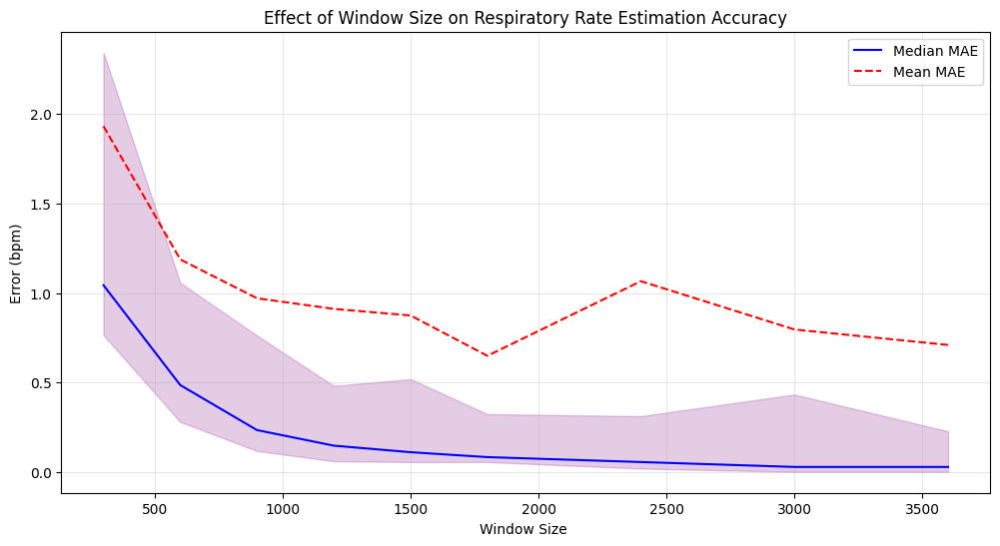

In [ ]:
plt.figure(figsize=(12, 6))
plt.plot(window_sizes, [mmae_results[ws] for ws in window_sizes], 'b-', label='Median MAE')
plt.plot(window_sizes, [mae_Subject_results[ws] for ws in window_sizes], 'r--', label='Mean MAE')
plt.fill_between(window_sizes, [q1_m_errors[ws] for ws in window_sizes], [q3_m_errors[ws] for ws in window_sizes], alpha=0.2, color='purple')

# Các cài đặt đồ thị
plt.xlabel('Window Size ')
plt.ylabel('Error (bpm)')
plt.legend()
plt.grid(True, alpha=0.3)
plt.title('Effect of Window Size on Respiratory Rate Estimation Accuracy')
plt.show()

#### 4.4 So sánh hiệu suất trên bộ dữ liệu BIDMC

##### 4.4.1 Phương pháp 1: Sử dụng mô hình đã huấn luyện trên Capnobase

In [ ]:
model = CorrEncoder()
model.load_state_dict(torch.load(f"{model_path_9_6}/corr_encoder_model.pth", map_location=torch.device('cpu')))
model.eval()

CorrEncoder(
  (encoder): Sequential(
    (0): Conv1d(1, 8, kernel_size=(150,), stride=(1,), padding=(20,))
    (1): ReLU()
    (2): Dropout(p=0.5, inplace=False)
    (3): Conv1d(8, 8, kernel_size=(75,), stride=(1,), padding=(10,))
    (4): ReLU()
    (5): Dropout(p=0.5, inplace=False)
    (6): Conv1d(8, 8, kernel_size=(50,), stride=(1,))
    (7): Sigmoid()
    (8): Dropout(p=0.5, inplace=False)
  )
  (decoder): Sequential(
    (0): ConvTranspose1d(8, 8, kernel_size=(50,), stride=(1,))
    (1): Sigmoid()
    (2): ConvTranspose1d(8, 8, kernel_size=(75,), stride=(1,), padding=(10,))
    (3): ReLU()
    (4): ConvTranspose1d(8, 1, kernel_size=(150,), stride=(1,), padding=(20,))
    (5): ReLU()
  )
)

In [ ]:
#load data
import pickle

with open(f'{preprocess}/precoss_bidmc.pkl', 'rb') as f:
    precoss = pickle.load(f)
    print('Load success!')

Load success!


In [ ]:
train_ppg, train_capno, test_ppg, test_capno = leave_one_subject_out(precoss, 0)
train_loader, test_loader0 = create_dataloader(train_ppg, test_ppg, train_capno, test_capno)

In [ ]:
from torch.utils.data import ConcatDataset, DataLoader

# Bước 1: Trích dataset từ mỗi test_loader
dataset0 = test_loader0.dataset
dataset1 = train_loader.dataset

# Bước 2: Kết hợp lại bằng ConcatDataset
combined_dataset = ConcatDataset([dataset0, dataset1])

# Bước 3: Tạo lại DataLoader
combined_test_loader = DataLoader(combined_dataset, batch_size=32, shuffle=False)

In [ ]:
model.eval()
model = model.to(device)
predicted_rrs = []
reference_rrs = []

In [ ]:
with torch.no_grad():
    for ppg_batch, capno_batch in combined_test_loader:
        ppg_batch, capno_batch = ppg_batch.to(device), capno_batch.to(device)

        # Forward pass
        outputs = model(ppg_batch)

        # Chuyển về numpy
        outputs_np = outputs.cpu().numpy()
        capno_np = capno_batch.cpu().numpy()

        # Tính tần số hô hấp cho từng mẫu
        for i in range(outputs_np.shape[0]):
            # Tần số hô hấp từ dạng sóng dự đoán
            pred_rr = estimate_respiratory_rate(outputs_np[i])
            predicted_rrs.append(pred_rr)

            # Tần số hô hấp từ capnography tham chiếu
            ref_rr = estimate_respiratory_rate(capno_np[i])
            reference_rrs.append(ref_rr)

In [ ]:
# Tính sai số tuyệt đối cho tần số hô hấp
rr_errors = np.abs(np.array(predicted_rrs) - np.array(reference_rrs))

# Tính mAE (median Absolute Error) - sai số tuyệt đối trung vị trên tất cả các cửa sổ
mae_rr = np.median(rr_errors)

In [ ]:
subject_mae = {}
for i in range(len(precoss)):
  subject_id = precoss[i]["id"]
  with torch.no_grad():
    ppg_tensor = torch.tensor(precoss[i]["ppg_segments"], dtype=torch.float32).to(device)
    outputs = model(ppg_tensor)
    outputs_np = outputs.cpu().numpy()
    capno_np = precoss[i]["capno_segments"]
    reference_rrs1 = []
    predicted_rrs1 = []
    # Tính tần số hô hấp cho từng mẫu
    for j in range(outputs_np.shape[0]):
        pred_rr = estimate_respiratory_rate(outputs_np[j])  # Dùng j thay vì i
        predicted_rrs1.append(pred_rr)
        ref_rr = estimate_respiratory_rate(capno_np[j])
        reference_rrs1.append(ref_rr)
    # Tính sai số tuyệt đối
    rr_errors = np.abs(np.array(predicted_rrs1) - np.array(reference_rrs1))
    # Kiểm tra và khởi tạo subject_id trong subject_mae nếu chưa có
    if subject_id not in subject_mae:
        subject_mae[subject_id] = []
    # Thêm sai số cho từng mẫu
    subject_mae[subject_id].append(rr_errors)


In [ ]:
# Tính MAE trung bình cho mỗi đối tượng
subject_mean_mae = [np.mean(errors) for errors in subject_mae.values()]
# Tính trung vị của các MAE trung bình
mmae_rr = np.median(subject_mean_mae)

In [ ]:
print(f"Subject mean mae:")
for index,item in enumerate(subject_mean_mae):
  print(f"Subject {index} : {item}")

Subject mean mae:
Subject 0 : 4.8515625
Subject 1 : 8.138671875
Subject 2 : 2.671875
Subject 3 : 5.888671875
Subject 4 : 4.623046875
Subject 5 : 6.36328125
Subject 6 : 4.46484375
Subject 7 : 7.13671875
Subject 8 : 4.201171875
Subject 9 : 4.587890625
Subject 10 : 4.39453125
Subject 11 : 3.83203125
Subject 12 : 7.83984375
Subject 13 : 3.26953125
Subject 14 : 7.734375
Subject 15 : 5.23828125
Subject 16 : 2.4609375
Subject 17 : 4.060546875
Subject 18 : 2.408203125
Subject 19 : 6.451171875
Subject 20 : 6.591796875
Subject 21 : 6.75
Subject 22 : 5.818359375
Subject 23 : 3.4453125
Subject 24 : 5.009765625
Subject 25 : 6.1875
Subject 26 : 2.337890625
Subject 27 : 4.81640625
Subject 28 : 6.662109375
Subject 29 : 6.9609375
Subject 30 : 3.427734375
Subject 31 : 11.63671875
Subject 32 : 4.201171875
Subject 33 : 7.06640625
Subject 34 : 6.046875
Subject 35 : 4.0078125
Subject 36 : 4.763671875
Subject 37 : 5.58984375
Subject 38 : 3.146484375
Subject 39 : 6.46875
Subject 40 : 4.166015625
Subject 41 : 

In [ ]:
print(f"Respiratory Rate Estimation Results:")
print(f"Median Absolute Error (mAE): {mae_rr:.2f} bpm")
print(f"Median Mean Absolute Error (mMAE): {mmae_rr:.2f} bpm")

Respiratory Rate Estimation Results:
Median Absolute Error (mAE): 3.52 bpm
Median Mean Absolute Error (mMAE): 5.06 bpm


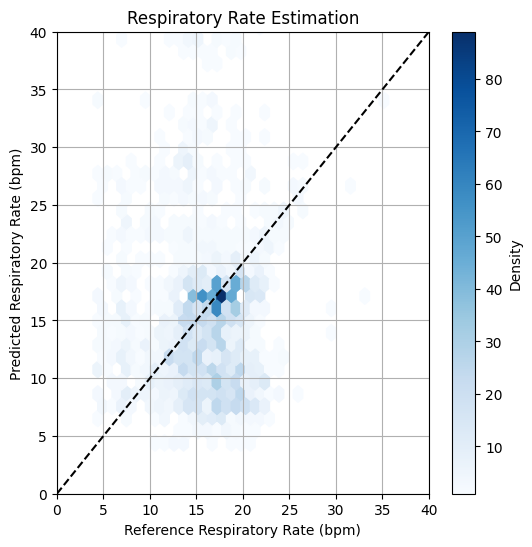

In [ ]:
plt.figure(figsize=(6, 6))

# Vẽ biểu đồ hexbin để thể hiện mật độ
plt.hexbin(reference_rrs, predicted_rrs, gridsize=30,  cmap='Blues', mincnt=1)

# Đường y = x
plt.plot([0, 40], [0, 40], 'k--')

plt.xlabel('Reference Respiratory Rate (bpm)')
plt.ylabel('Predicted Respiratory Rate (bpm)')
plt.grid(True)
plt.title('Respiratory Rate Estimation')
plt.colorbar(label='Density')
plt.xlim(0, 40)
plt.ylim(0, 40)
plt.show()


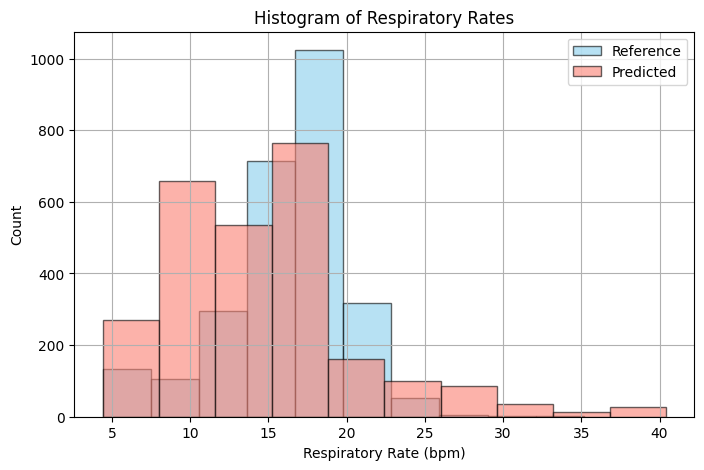

In [ ]:
plt.figure(figsize=(8, 5))

# Histogram của Reference và Predicted
plt.hist(reference_rrs, bins=10, alpha=0.6, label='Reference', color='skyblue', edgecolor='black')
plt.hist(predicted_rrs, bins=10, alpha=0.6, label='Predicted', color='salmon', edgecolor='black')

plt.xlabel('Respiratory Rate (bpm)')
plt.ylabel('Count')
plt.title('Histogram of Respiratory Rates')
plt.legend()
plt.grid(True)
plt.show()


##### 4.4.1 Phương pháp 2: Huấn luyện lại mô hình trên BIDMC

- Huấn luyện

In [ ]:
#load data
import pickle

with open(f'{preprocess}/precoss_bidmc.pkl', 'rb') as f:
    precoss = pickle.load(f)
    print('Load success!')

Load success!


In [ ]:
model = CorrEncoder()
criterion = nn.MSELoss()
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)


🔁 LOSO Fold 1/53: Đang huấn luyện trên 53 người, kiểm tra trên người thứ 1
Epoch 1/80 - Train Loss: 0.1287, Test Loss: 0.0983
Epoch 2/80 - Train Loss: 0.1155, Test Loss: 0.0938
EarlyStopping counter: 1 out of 10
Epoch 3/80 - Train Loss: 0.1134, Test Loss: 0.1098
Epoch 4/80 - Train Loss: 0.1112, Test Loss: 0.0881
EarlyStopping counter: 1 out of 10
Epoch 5/80 - Train Loss: 0.1076, Test Loss: 0.0896
Epoch 6/80 - Train Loss: 0.1052, Test Loss: 0.0852
Epoch 7/80 - Train Loss: 0.1041, Test Loss: 0.0796
EarlyStopping counter: 1 out of 10
Epoch 8/80 - Train Loss: 0.1028, Test Loss: 0.0873
EarlyStopping counter: 2 out of 10
Epoch 9/80 - Train Loss: 0.1016, Test Loss: 0.0830
EarlyStopping counter: 3 out of 10
Epoch 10/80 - Train Loss: 0.1008, Test Loss: 0.0989
EarlyStopping counter: 4 out of 10
Epoch 11/80 - Train Loss: 0.1003, Test Loss: 0.0913
EarlyStopping counter: 5 out of 10
Epoch 12/80 - Train Loss: 0.0991, Test Loss: 0.0983
EarlyStopping counter: 6 out of 10
Epoch 13/80 - Train Loss: 0.0

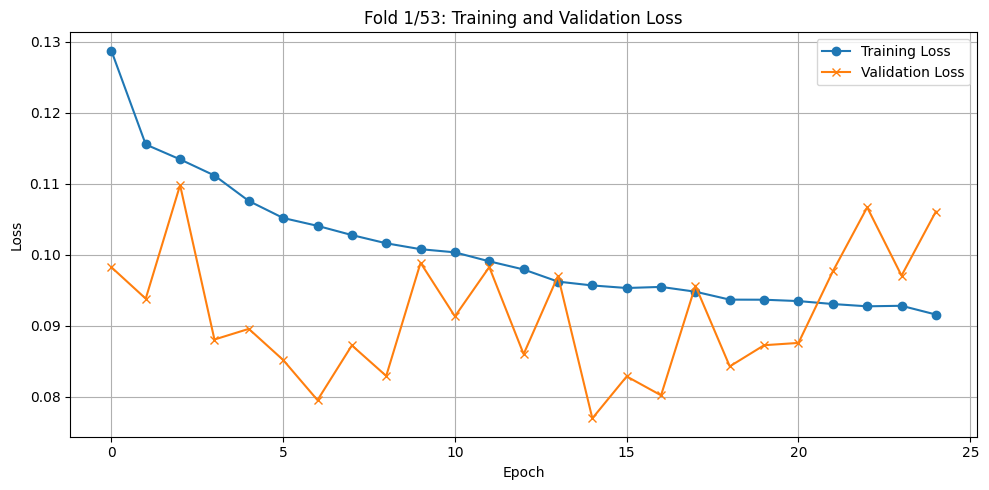


🔁 LOSO Fold 2/53: Đang huấn luyện trên 53 người, kiểm tra trên người thứ 2
Epoch 1/80 - Train Loss: 0.0893, Test Loss: 0.1463
EarlyStopping counter: 1 out of 10
Epoch 2/80 - Train Loss: 0.0902, Test Loss: 0.1511
EarlyStopping counter: 2 out of 10
Epoch 3/80 - Train Loss: 0.0907, Test Loss: 0.1471
EarlyStopping counter: 3 out of 10
Epoch 4/80 - Train Loss: 0.0894, Test Loss: 0.1557
EarlyStopping counter: 4 out of 10
Epoch 5/80 - Train Loss: 0.0893, Test Loss: 0.1472
EarlyStopping counter: 5 out of 10
Epoch 6/80 - Train Loss: 0.0889, Test Loss: 0.1625
EarlyStopping counter: 6 out of 10
Epoch 7/80 - Train Loss: 0.0884, Test Loss: 0.1523
EarlyStopping counter: 7 out of 10
Epoch 8/80 - Train Loss: 0.0888, Test Loss: 0.1470
EarlyStopping counter: 8 out of 10
Epoch 9/80 - Train Loss: 0.0882, Test Loss: 0.1520
EarlyStopping counter: 9 out of 10
Epoch 10/80 - Train Loss: 0.0893, Test Loss: 0.1546
EarlyStopping counter: 10 out of 10
Early stopping at epoch 11


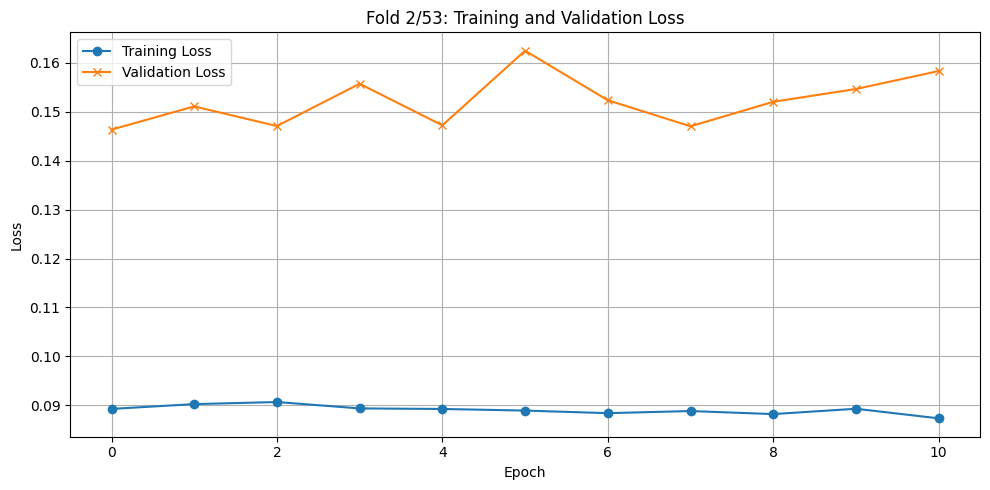


🔁 LOSO Fold 3/53: Đang huấn luyện trên 53 người, kiểm tra trên người thứ 3
Epoch 1/80 - Train Loss: 0.0894, Test Loss: 0.0742
EarlyStopping counter: 1 out of 10
Epoch 2/80 - Train Loss: 0.0890, Test Loss: 0.0834
EarlyStopping counter: 2 out of 10
Epoch 3/80 - Train Loss: 0.0886, Test Loss: 0.0835
EarlyStopping counter: 3 out of 10
Epoch 4/80 - Train Loss: 0.0895, Test Loss: 0.0744
EarlyStopping counter: 4 out of 10
Epoch 5/80 - Train Loss: 0.0892, Test Loss: 0.0863
EarlyStopping counter: 5 out of 10
Epoch 6/80 - Train Loss: 0.0893, Test Loss: 0.0775
EarlyStopping counter: 6 out of 10
Epoch 7/80 - Train Loss: 0.0880, Test Loss: 0.0790
EarlyStopping counter: 7 out of 10
Epoch 8/80 - Train Loss: 0.0878, Test Loss: 0.0805
EarlyStopping counter: 8 out of 10
Epoch 9/80 - Train Loss: 0.0883, Test Loss: 0.0906
EarlyStopping counter: 9 out of 10
Epoch 10/80 - Train Loss: 0.0888, Test Loss: 0.0795
EarlyStopping counter: 10 out of 10
Early stopping at epoch 11


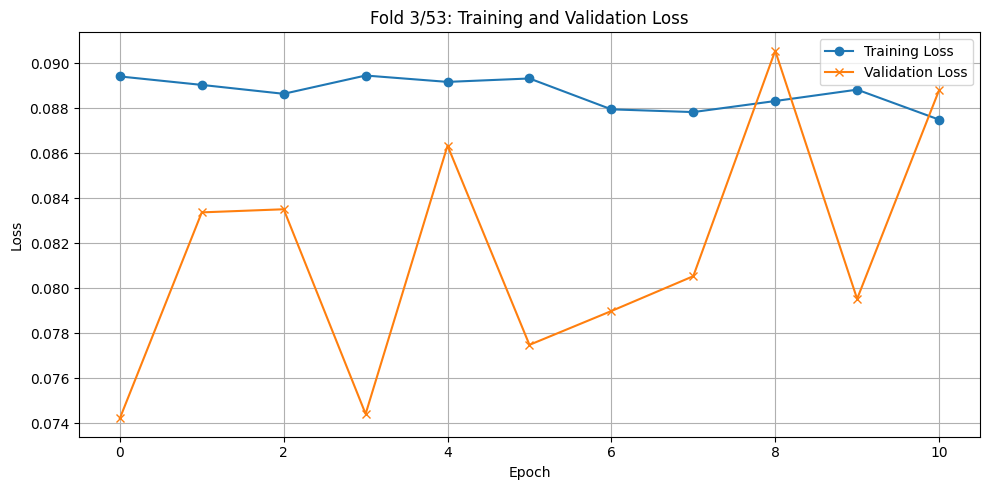


🔁 LOSO Fold 4/53: Đang huấn luyện trên 53 người, kiểm tra trên người thứ 4
Epoch 1/80 - Train Loss: 0.0875, Test Loss: 0.0653
Epoch 2/80 - Train Loss: 0.0879, Test Loss: 0.0630
EarlyStopping counter: 1 out of 10
Epoch 3/80 - Train Loss: 0.0876, Test Loss: 0.0783
EarlyStopping counter: 2 out of 10
Epoch 4/80 - Train Loss: 0.0879, Test Loss: 0.0973
EarlyStopping counter: 3 out of 10
Epoch 5/80 - Train Loss: 0.0873, Test Loss: 0.0781
EarlyStopping counter: 4 out of 10
Epoch 6/80 - Train Loss: 0.0877, Test Loss: 0.0702
EarlyStopping counter: 5 out of 10
Epoch 7/80 - Train Loss: 0.0865, Test Loss: 0.0810
EarlyStopping counter: 6 out of 10
Epoch 8/80 - Train Loss: 0.0867, Test Loss: 0.0678
EarlyStopping counter: 7 out of 10
Epoch 9/80 - Train Loss: 0.0865, Test Loss: 0.0955
EarlyStopping counter: 8 out of 10
Epoch 10/80 - Train Loss: 0.0868, Test Loss: 0.1043
EarlyStopping counter: 9 out of 10
Epoch 11/80 - Train Loss: 0.0862, Test Loss: 0.0793
EarlyStopping counter: 10 out of 10
Early stop

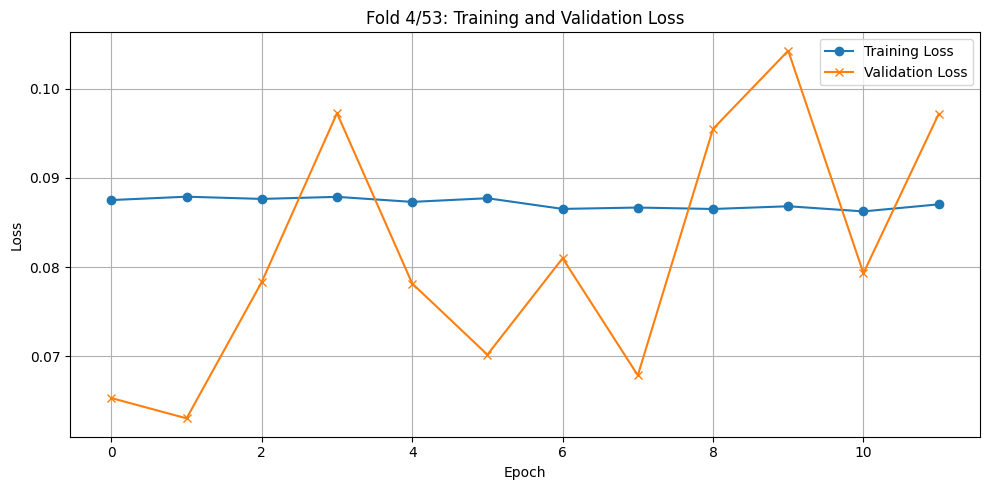


🔁 LOSO Fold 5/53: Đang huấn luyện trên 53 người, kiểm tra trên người thứ 5
Epoch 1/80 - Train Loss: 0.0868, Test Loss: 0.0785
Epoch 2/80 - Train Loss: 0.0865, Test Loss: 0.0744
EarlyStopping counter: 1 out of 10
Epoch 3/80 - Train Loss: 0.0859, Test Loss: 0.0780
EarlyStopping counter: 2 out of 10
Epoch 4/80 - Train Loss: 0.0852, Test Loss: 0.0792
EarlyStopping counter: 3 out of 10
Epoch 5/80 - Train Loss: 0.0860, Test Loss: 0.0877
EarlyStopping counter: 4 out of 10
Epoch 6/80 - Train Loss: 0.0856, Test Loss: 0.0823
EarlyStopping counter: 5 out of 10
Epoch 7/80 - Train Loss: 0.0858, Test Loss: 0.0774
EarlyStopping counter: 6 out of 10
Epoch 8/80 - Train Loss: 0.0848, Test Loss: 0.0869
EarlyStopping counter: 7 out of 10
Epoch 9/80 - Train Loss: 0.0856, Test Loss: 0.0895
EarlyStopping counter: 8 out of 10
Epoch 10/80 - Train Loss: 0.0858, Test Loss: 0.0812
EarlyStopping counter: 9 out of 10
Epoch 11/80 - Train Loss: 0.0850, Test Loss: 0.0796
EarlyStopping counter: 10 out of 10
Early stop

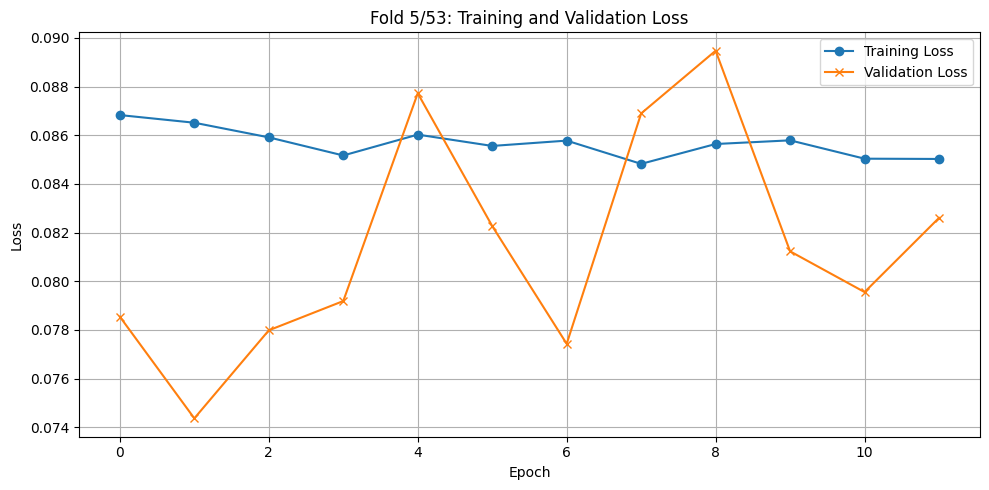


🔁 LOSO Fold 6/53: Đang huấn luyện trên 53 người, kiểm tra trên người thứ 6
Epoch 1/80 - Train Loss: 0.0847, Test Loss: 0.1653
Epoch 2/80 - Train Loss: 0.0827, Test Loss: 0.1641
Epoch 3/80 - Train Loss: 0.0832, Test Loss: 0.1619
EarlyStopping counter: 1 out of 10
Epoch 4/80 - Train Loss: 0.0836, Test Loss: 0.1660
EarlyStopping counter: 2 out of 10
Epoch 5/80 - Train Loss: 0.0824, Test Loss: 0.1722
Epoch 6/80 - Train Loss: 0.0825, Test Loss: 0.1614
EarlyStopping counter: 1 out of 10
Epoch 7/80 - Train Loss: 0.0837, Test Loss: 0.1719
EarlyStopping counter: 2 out of 10
Epoch 8/80 - Train Loss: 0.0829, Test Loss: 0.1746
EarlyStopping counter: 3 out of 10
Epoch 9/80 - Train Loss: 0.0829, Test Loss: 0.1632
EarlyStopping counter: 4 out of 10
Epoch 10/80 - Train Loss: 0.0827, Test Loss: 0.1715
EarlyStopping counter: 5 out of 10
Epoch 11/80 - Train Loss: 0.0829, Test Loss: 0.1643
EarlyStopping counter: 6 out of 10
Epoch 12/80 - Train Loss: 0.0819, Test Loss: 0.1706
EarlyStopping counter: 7 out 

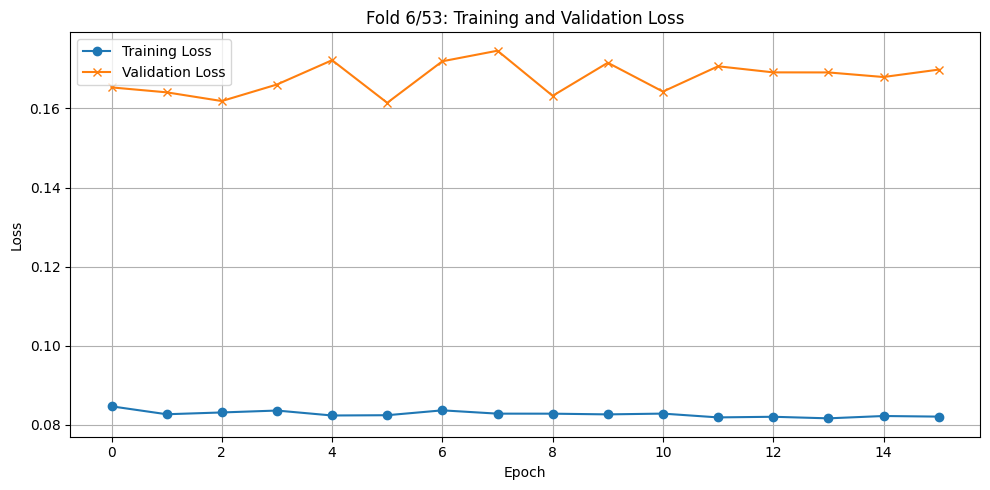


🔁 LOSO Fold 7/53: Đang huấn luyện trên 53 người, kiểm tra trên người thứ 7
Epoch 1/80 - Train Loss: 0.0830, Test Loss: 0.1303
Epoch 2/80 - Train Loss: 0.0829, Test Loss: 0.1271
EarlyStopping counter: 1 out of 10
Epoch 3/80 - Train Loss: 0.0834, Test Loss: 0.1524
EarlyStopping counter: 2 out of 10
Epoch 4/80 - Train Loss: 0.0830, Test Loss: 0.1334
EarlyStopping counter: 3 out of 10
Epoch 5/80 - Train Loss: 0.0830, Test Loss: 0.1414
EarlyStopping counter: 4 out of 10
Epoch 6/80 - Train Loss: 0.0830, Test Loss: 0.1353
EarlyStopping counter: 5 out of 10
Epoch 7/80 - Train Loss: 0.0826, Test Loss: 0.1562
EarlyStopping counter: 6 out of 10
Epoch 8/80 - Train Loss: 0.0833, Test Loss: 0.1330
EarlyStopping counter: 7 out of 10
Epoch 9/80 - Train Loss: 0.0824, Test Loss: 0.1397
EarlyStopping counter: 8 out of 10
Epoch 10/80 - Train Loss: 0.0822, Test Loss: 0.1425
EarlyStopping counter: 9 out of 10
Epoch 11/80 - Train Loss: 0.0826, Test Loss: 0.1660
EarlyStopping counter: 10 out of 10
Early stop

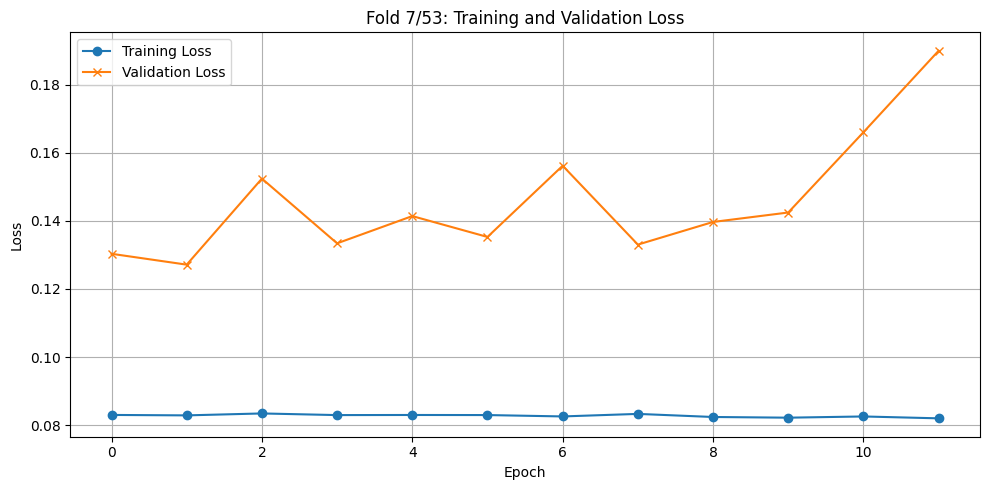


🔁 LOSO Fold 8/53: Đang huấn luyện trên 53 người, kiểm tra trên người thứ 8
Epoch 1/80 - Train Loss: 0.0828, Test Loss: 0.0938
EarlyStopping counter: 1 out of 10
Epoch 2/80 - Train Loss: 0.0826, Test Loss: 0.0984
Epoch 3/80 - Train Loss: 0.0832, Test Loss: 0.0907
EarlyStopping counter: 1 out of 10
Epoch 4/80 - Train Loss: 0.0836, Test Loss: 0.0946
EarlyStopping counter: 2 out of 10
Epoch 5/80 - Train Loss: 0.0833, Test Loss: 0.1051
EarlyStopping counter: 3 out of 10
Epoch 6/80 - Train Loss: 0.0818, Test Loss: 0.0978
EarlyStopping counter: 4 out of 10
Epoch 7/80 - Train Loss: 0.0824, Test Loss: 0.0998
EarlyStopping counter: 5 out of 10
Epoch 8/80 - Train Loss: 0.0819, Test Loss: 0.1004
EarlyStopping counter: 6 out of 10
Epoch 9/80 - Train Loss: 0.0822, Test Loss: 0.0963
EarlyStopping counter: 7 out of 10
Epoch 10/80 - Train Loss: 0.0825, Test Loss: 0.1034
EarlyStopping counter: 8 out of 10
Epoch 11/80 - Train Loss: 0.0818, Test Loss: 0.0998
EarlyStopping counter: 9 out of 10
Epoch 12/80

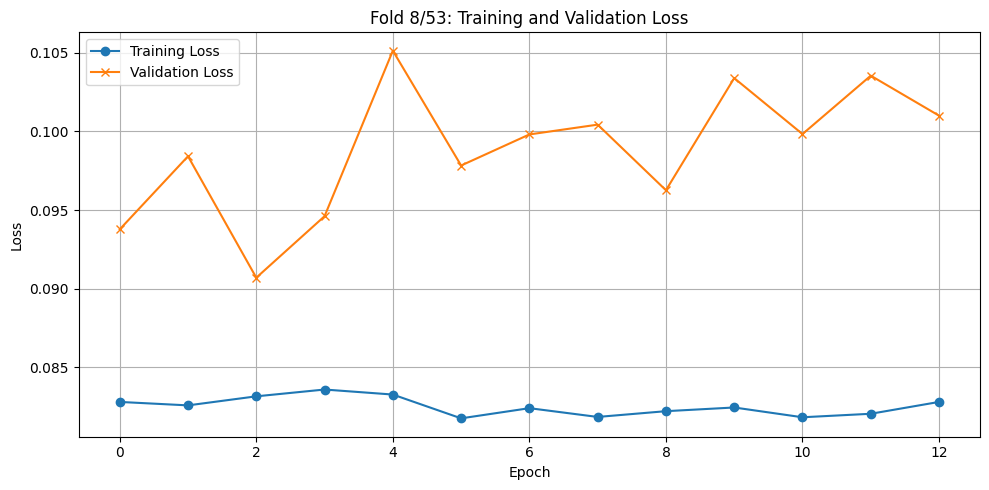


🔁 LOSO Fold 9/53: Đang huấn luyện trên 53 người, kiểm tra trên người thứ 9
Epoch 1/80 - Train Loss: 0.0832, Test Loss: 0.0401
EarlyStopping counter: 1 out of 10
Epoch 2/80 - Train Loss: 0.0830, Test Loss: 0.0768
EarlyStopping counter: 2 out of 10
Epoch 3/80 - Train Loss: 0.0828, Test Loss: 0.0585
EarlyStopping counter: 3 out of 10
Epoch 4/80 - Train Loss: 0.0831, Test Loss: 0.0547
EarlyStopping counter: 4 out of 10
Epoch 5/80 - Train Loss: 0.0830, Test Loss: 0.0566
EarlyStopping counter: 5 out of 10
Epoch 6/80 - Train Loss: 0.0824, Test Loss: 0.0502
EarlyStopping counter: 6 out of 10
Epoch 7/80 - Train Loss: 0.0837, Test Loss: 0.0619
EarlyStopping counter: 7 out of 10
Epoch 8/80 - Train Loss: 0.0825, Test Loss: 0.0542
EarlyStopping counter: 8 out of 10
Epoch 9/80 - Train Loss: 0.0826, Test Loss: 0.0581
EarlyStopping counter: 9 out of 10
Epoch 10/80 - Train Loss: 0.0823, Test Loss: 0.0544
EarlyStopping counter: 10 out of 10
Early stopping at epoch 11


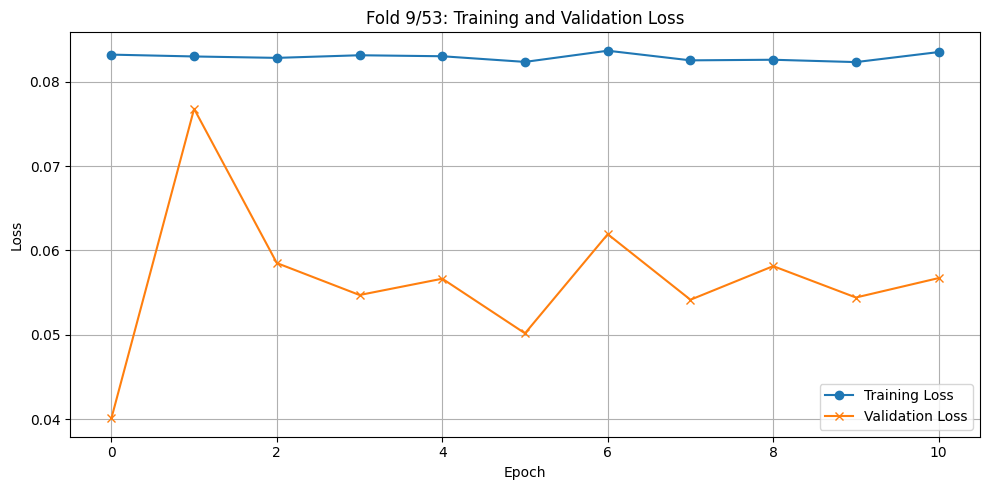


🔁 LOSO Fold 10/53: Đang huấn luyện trên 53 người, kiểm tra trên người thứ 10
Epoch 1/80 - Train Loss: 0.0827, Test Loss: 0.0516
EarlyStopping counter: 1 out of 10
Epoch 2/80 - Train Loss: 0.0825, Test Loss: 0.0558
EarlyStopping counter: 2 out of 10
Epoch 3/80 - Train Loss: 0.0823, Test Loss: 0.0583
EarlyStopping counter: 3 out of 10
Epoch 4/80 - Train Loss: 0.0821, Test Loss: 0.0590
EarlyStopping counter: 4 out of 10
Epoch 5/80 - Train Loss: 0.0815, Test Loss: 0.0584
EarlyStopping counter: 5 out of 10
Epoch 6/80 - Train Loss: 0.0814, Test Loss: 0.0645
EarlyStopping counter: 6 out of 10
Epoch 7/80 - Train Loss: 0.0827, Test Loss: 0.0583
Epoch 8/80 - Train Loss: 0.0816, Test Loss: 0.0496
EarlyStopping counter: 1 out of 10
Epoch 9/80 - Train Loss: 0.0814, Test Loss: 0.0579
EarlyStopping counter: 2 out of 10
Epoch 10/80 - Train Loss: 0.0813, Test Loss: 0.0595
EarlyStopping counter: 3 out of 10
Epoch 11/80 - Train Loss: 0.0823, Test Loss: 0.0542
EarlyStopping counter: 4 out of 10
Epoch 12/

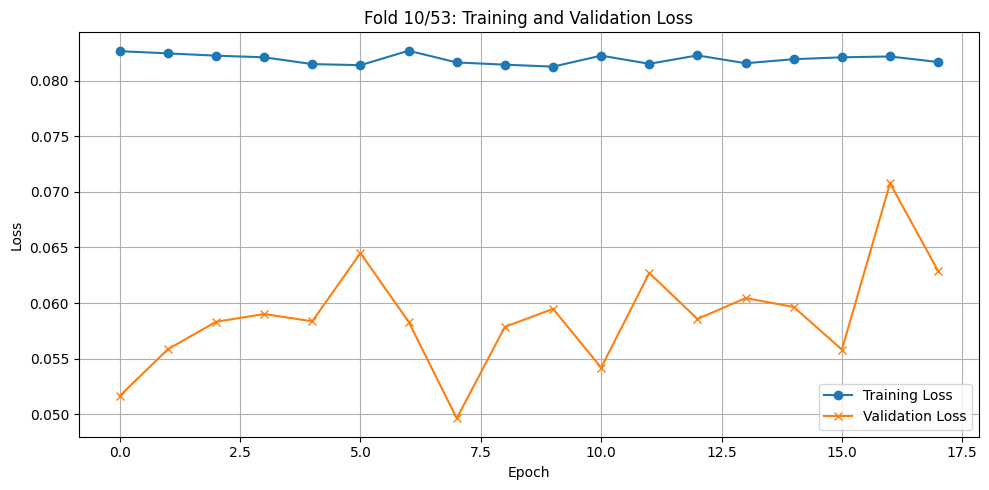


🔁 LOSO Fold 11/53: Đang huấn luyện trên 53 người, kiểm tra trên người thứ 11
Epoch 1/80 - Train Loss: 0.0819, Test Loss: 0.0496
EarlyStopping counter: 1 out of 10
Epoch 2/80 - Train Loss: 0.0812, Test Loss: 0.0553
Epoch 3/80 - Train Loss: 0.0819, Test Loss: 0.0492
EarlyStopping counter: 1 out of 10
Epoch 4/80 - Train Loss: 0.0811, Test Loss: 0.0527
EarlyStopping counter: 2 out of 10
Epoch 5/80 - Train Loss: 0.0817, Test Loss: 0.0562
EarlyStopping counter: 3 out of 10
Epoch 6/80 - Train Loss: 0.0812, Test Loss: 0.0509
EarlyStopping counter: 4 out of 10
Epoch 7/80 - Train Loss: 0.0822, Test Loss: 0.0526
EarlyStopping counter: 5 out of 10
Epoch 8/80 - Train Loss: 0.0814, Test Loss: 0.0524
EarlyStopping counter: 6 out of 10
Epoch 9/80 - Train Loss: 0.0818, Test Loss: 0.0508
EarlyStopping counter: 7 out of 10
Epoch 10/80 - Train Loss: 0.0814, Test Loss: 0.0529
EarlyStopping counter: 8 out of 10
Epoch 11/80 - Train Loss: 0.0813, Test Loss: 0.0501
Epoch 12/80 - Train Loss: 0.0817, Test Loss:

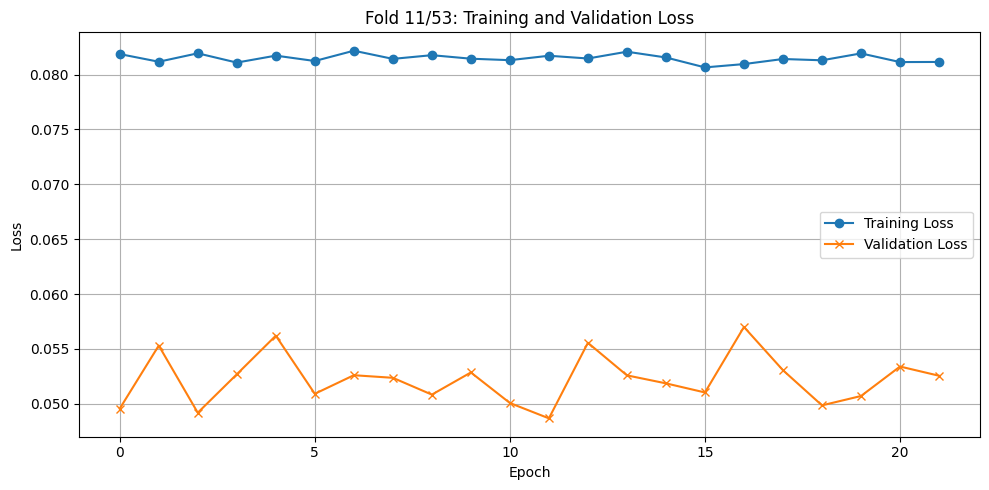


🔁 LOSO Fold 12/53: Đang huấn luyện trên 53 người, kiểm tra trên người thứ 12
Epoch 1/80 - Train Loss: 0.0810, Test Loss: 0.0455
Epoch 2/80 - Train Loss: 0.0810, Test Loss: 0.0434
EarlyStopping counter: 1 out of 10
Epoch 3/80 - Train Loss: 0.0806, Test Loss: 0.0485
EarlyStopping counter: 2 out of 10
Epoch 4/80 - Train Loss: 0.0811, Test Loss: 0.0456
EarlyStopping counter: 3 out of 10
Epoch 5/80 - Train Loss: 0.0805, Test Loss: 0.0459
EarlyStopping counter: 4 out of 10
Epoch 6/80 - Train Loss: 0.0807, Test Loss: 0.0468
EarlyStopping counter: 5 out of 10
Epoch 7/80 - Train Loss: 0.0812, Test Loss: 0.0447
EarlyStopping counter: 6 out of 10
Epoch 8/80 - Train Loss: 0.0815, Test Loss: 0.0472
EarlyStopping counter: 7 out of 10
Epoch 9/80 - Train Loss: 0.0804, Test Loss: 0.0476
EarlyStopping counter: 8 out of 10
Epoch 10/80 - Train Loss: 0.0815, Test Loss: 0.0482
EarlyStopping counter: 9 out of 10
Epoch 11/80 - Train Loss: 0.0810, Test Loss: 0.0492
EarlyStopping counter: 10 out of 10
Early st

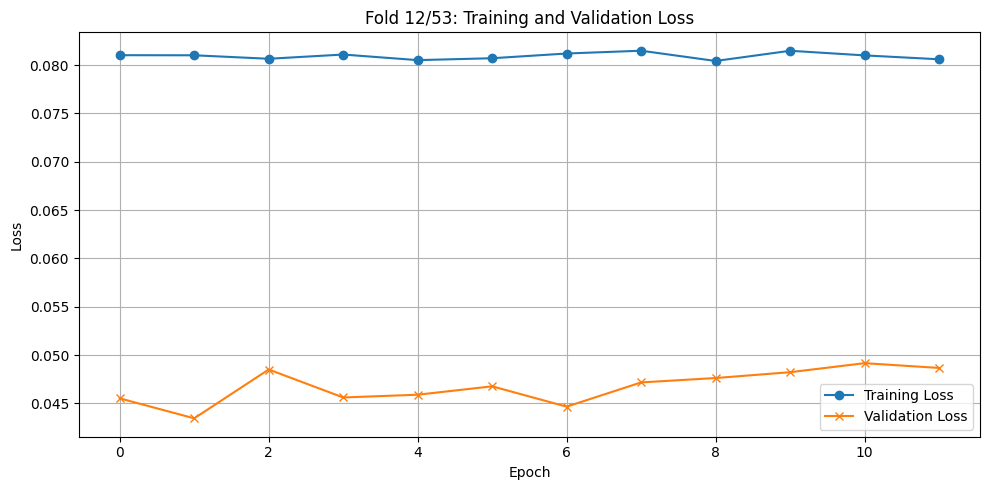


🔁 LOSO Fold 13/53: Đang huấn luyện trên 53 người, kiểm tra trên người thứ 13
Epoch 1/80 - Train Loss: 0.0797, Test Loss: 0.1095
EarlyStopping counter: 1 out of 10
Epoch 2/80 - Train Loss: 0.0789, Test Loss: 0.1190
EarlyStopping counter: 2 out of 10
Epoch 3/80 - Train Loss: 0.0783, Test Loss: 0.1194
EarlyStopping counter: 3 out of 10
Epoch 4/80 - Train Loss: 0.0787, Test Loss: 0.1193
EarlyStopping counter: 4 out of 10
Epoch 5/80 - Train Loss: 0.0797, Test Loss: 0.1298
EarlyStopping counter: 5 out of 10
Epoch 6/80 - Train Loss: 0.0792, Test Loss: 0.1193
EarlyStopping counter: 6 out of 10
Epoch 7/80 - Train Loss: 0.0790, Test Loss: 0.1220
EarlyStopping counter: 7 out of 10
Epoch 8/80 - Train Loss: 0.0786, Test Loss: 0.1149
EarlyStopping counter: 8 out of 10
Epoch 9/80 - Train Loss: 0.0789, Test Loss: 0.1284
EarlyStopping counter: 9 out of 10
Epoch 10/80 - Train Loss: 0.0788, Test Loss: 0.1161
EarlyStopping counter: 10 out of 10
Early stopping at epoch 11


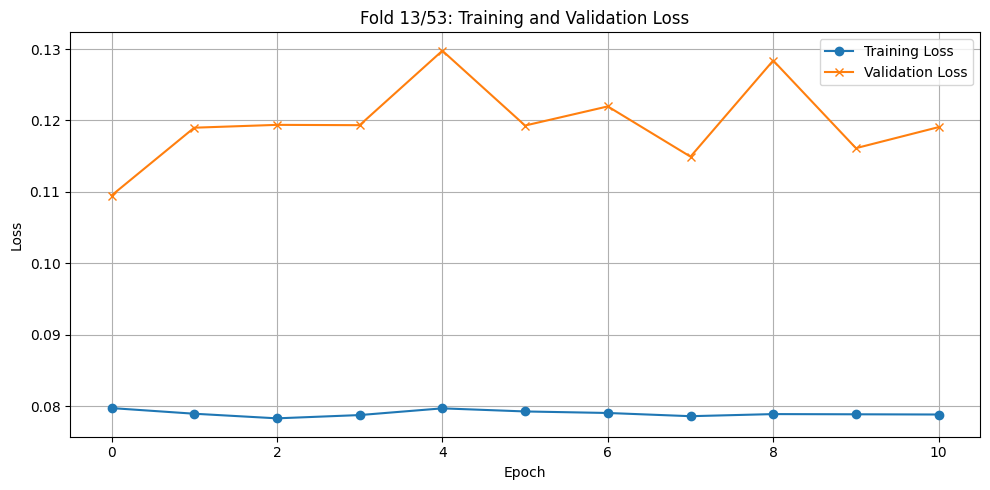


🔁 LOSO Fold 14/53: Đang huấn luyện trên 53 người, kiểm tra trên người thứ 14
Epoch 1/80 - Train Loss: 0.0810, Test Loss: 0.0376
EarlyStopping counter: 1 out of 10
Epoch 2/80 - Train Loss: 0.0811, Test Loss: 0.0392
EarlyStopping counter: 2 out of 10
Epoch 3/80 - Train Loss: 0.0806, Test Loss: 0.0428
Epoch 4/80 - Train Loss: 0.0798, Test Loss: 0.0358
EarlyStopping counter: 1 out of 10
Epoch 5/80 - Train Loss: 0.0794, Test Loss: 0.0376
EarlyStopping counter: 2 out of 10
Epoch 6/80 - Train Loss: 0.0802, Test Loss: 0.0385
EarlyStopping counter: 3 out of 10
Epoch 7/80 - Train Loss: 0.0798, Test Loss: 0.0407
EarlyStopping counter: 4 out of 10
Epoch 8/80 - Train Loss: 0.0800, Test Loss: 0.0419
EarlyStopping counter: 5 out of 10
Epoch 9/80 - Train Loss: 0.0808, Test Loss: 0.0422
EarlyStopping counter: 6 out of 10
Epoch 10/80 - Train Loss: 0.0801, Test Loss: 0.0389
EarlyStopping counter: 7 out of 10
Epoch 11/80 - Train Loss: 0.0793, Test Loss: 0.0404
EarlyStopping counter: 8 out of 10
Epoch 12/

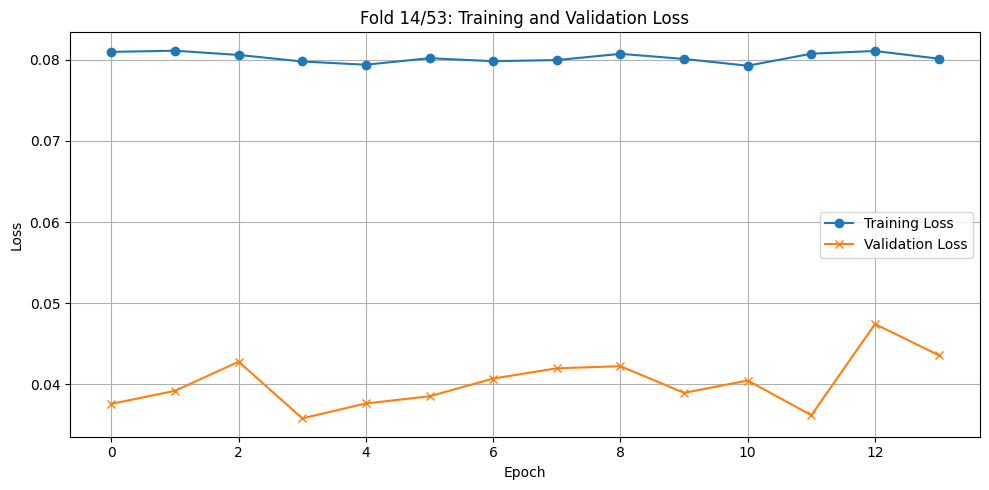


🔁 LOSO Fold 15/53: Đang huấn luyện trên 53 người, kiểm tra trên người thứ 15
Epoch 1/80 - Train Loss: 0.0797, Test Loss: 0.0498
Epoch 2/80 - Train Loss: 0.0800, Test Loss: 0.0473
EarlyStopping counter: 1 out of 10
Epoch 3/80 - Train Loss: 0.0802, Test Loss: 0.0502
Epoch 4/80 - Train Loss: 0.0804, Test Loss: 0.0471
EarlyStopping counter: 1 out of 10
Epoch 5/80 - Train Loss: 0.0795, Test Loss: 0.0514
EarlyStopping counter: 2 out of 10
Epoch 6/80 - Train Loss: 0.0796, Test Loss: 0.0541
EarlyStopping counter: 3 out of 10
Epoch 7/80 - Train Loss: 0.0798, Test Loss: 0.0509
EarlyStopping counter: 4 out of 10
Epoch 8/80 - Train Loss: 0.0797, Test Loss: 0.0531
EarlyStopping counter: 5 out of 10
Epoch 9/80 - Train Loss: 0.0797, Test Loss: 0.0501
EarlyStopping counter: 6 out of 10
Epoch 10/80 - Train Loss: 0.0797, Test Loss: 0.0517
EarlyStopping counter: 7 out of 10
Epoch 11/80 - Train Loss: 0.0796, Test Loss: 0.0518
EarlyStopping counter: 8 out of 10
Epoch 12/80 - Train Loss: 0.0805, Test Loss:

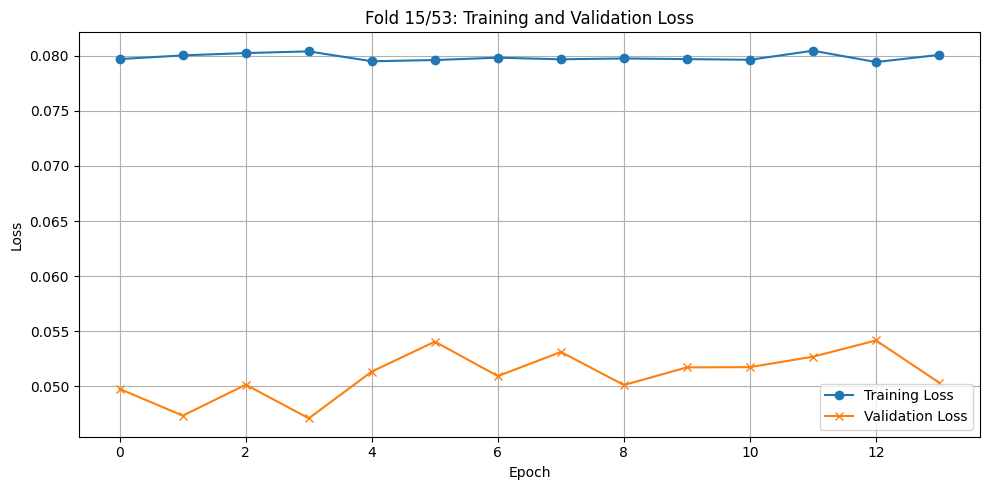


🔁 LOSO Fold 16/53: Đang huấn luyện trên 53 người, kiểm tra trên người thứ 16
Epoch 1/80 - Train Loss: 0.0794, Test Loss: 0.1190
EarlyStopping counter: 1 out of 10
Epoch 2/80 - Train Loss: 0.0782, Test Loss: 0.1215
EarlyStopping counter: 2 out of 10
Epoch 3/80 - Train Loss: 0.0790, Test Loss: 0.1213
EarlyStopping counter: 3 out of 10
Epoch 4/80 - Train Loss: 0.0783, Test Loss: 0.1219
EarlyStopping counter: 4 out of 10
Epoch 5/80 - Train Loss: 0.0779, Test Loss: 0.1222
EarlyStopping counter: 5 out of 10
Epoch 6/80 - Train Loss: 0.0788, Test Loss: 0.1211
EarlyStopping counter: 6 out of 10
Epoch 7/80 - Train Loss: 0.0784, Test Loss: 0.1206
EarlyStopping counter: 7 out of 10
Epoch 8/80 - Train Loss: 0.0785, Test Loss: 0.1252
EarlyStopping counter: 8 out of 10
Epoch 9/80 - Train Loss: 0.0781, Test Loss: 0.1274
EarlyStopping counter: 9 out of 10
Epoch 10/80 - Train Loss: 0.0774, Test Loss: 0.1199
EarlyStopping counter: 10 out of 10
Early stopping at epoch 11


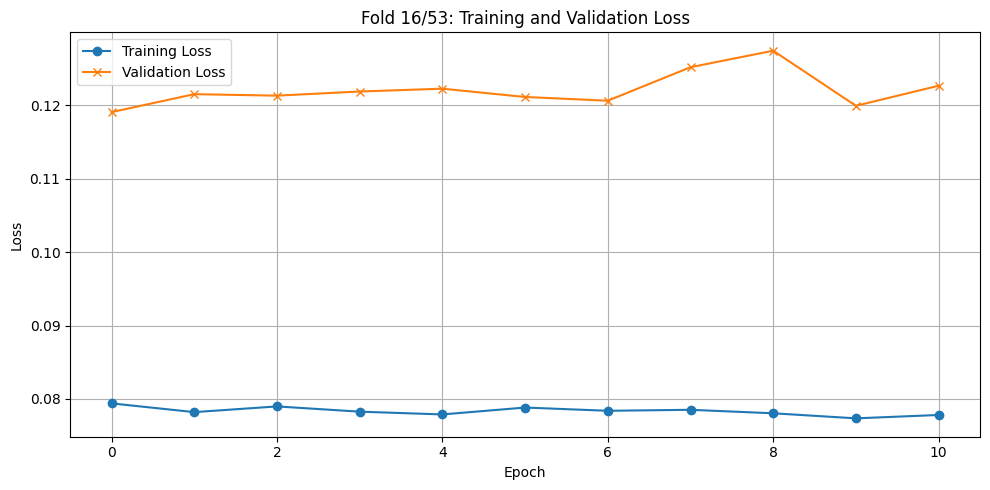


🔁 LOSO Fold 17/53: Đang huấn luyện trên 53 người, kiểm tra trên người thứ 17
Epoch 1/80 - Train Loss: 0.0784, Test Loss: 0.1086
EarlyStopping counter: 1 out of 10
Epoch 2/80 - Train Loss: 0.0782, Test Loss: 0.1132
Epoch 3/80 - Train Loss: 0.0778, Test Loss: 0.1072
EarlyStopping counter: 1 out of 10
Epoch 4/80 - Train Loss: 0.0787, Test Loss: 0.1122
Epoch 5/80 - Train Loss: 0.0782, Test Loss: 0.1014
EarlyStopping counter: 1 out of 10
Epoch 6/80 - Train Loss: 0.0779, Test Loss: 0.1087
EarlyStopping counter: 2 out of 10
Epoch 7/80 - Train Loss: 0.0777, Test Loss: 0.1117
EarlyStopping counter: 3 out of 10
Epoch 8/80 - Train Loss: 0.0784, Test Loss: 0.1105
EarlyStopping counter: 4 out of 10
Epoch 9/80 - Train Loss: 0.0785, Test Loss: 0.1095
EarlyStopping counter: 5 out of 10
Epoch 10/80 - Train Loss: 0.0784, Test Loss: 0.1109
EarlyStopping counter: 6 out of 10
Epoch 11/80 - Train Loss: 0.0780, Test Loss: 0.1189
EarlyStopping counter: 7 out of 10
Epoch 12/80 - Train Loss: 0.0782, Test Loss:

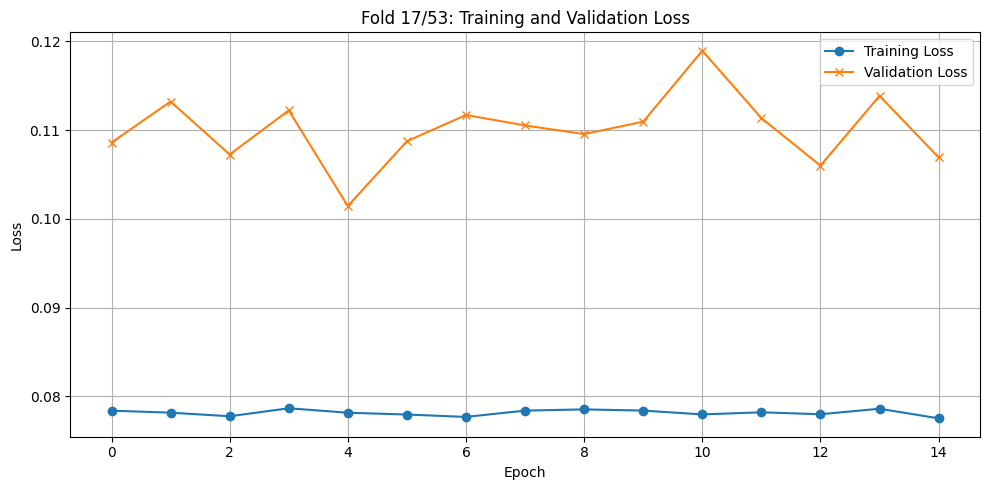


🔁 LOSO Fold 18/53: Đang huấn luyện trên 53 người, kiểm tra trên người thứ 18
Epoch 1/80 - Train Loss: 0.0792, Test Loss: 0.0831
Epoch 2/80 - Train Loss: 0.0783, Test Loss: 0.0806
Epoch 3/80 - Train Loss: 0.0783, Test Loss: 0.0766
Epoch 4/80 - Train Loss: 0.0786, Test Loss: 0.0758
Epoch 5/80 - Train Loss: 0.0791, Test Loss: 0.0753
EarlyStopping counter: 1 out of 10
Epoch 6/80 - Train Loss: 0.0787, Test Loss: 0.0913
EarlyStopping counter: 2 out of 10
Epoch 7/80 - Train Loss: 0.0792, Test Loss: 0.0899
EarlyStopping counter: 3 out of 10
Epoch 8/80 - Train Loss: 0.0777, Test Loss: 0.0798
EarlyStopping counter: 4 out of 10
Epoch 9/80 - Train Loss: 0.0784, Test Loss: 0.0809
Epoch 10/80 - Train Loss: 0.0780, Test Loss: 0.0745
EarlyStopping counter: 1 out of 10
Epoch 11/80 - Train Loss: 0.0782, Test Loss: 0.0822
EarlyStopping counter: 2 out of 10
Epoch 12/80 - Train Loss: 0.0773, Test Loss: 0.0810
EarlyStopping counter: 3 out of 10
Epoch 13/80 - Train Loss: 0.0777, Test Loss: 0.0867
EarlyStopp

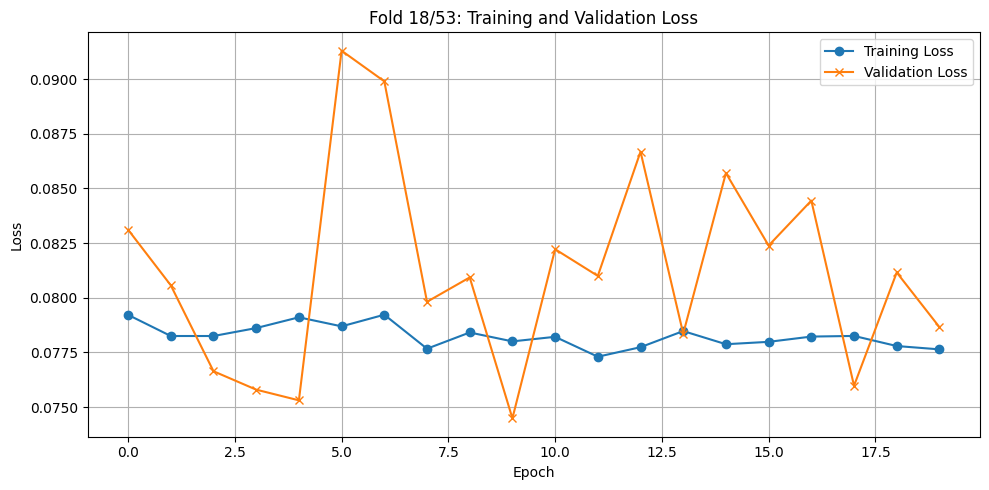


🔁 LOSO Fold 19/53: Đang huấn luyện trên 53 người, kiểm tra trên người thứ 19
Epoch 1/80 - Train Loss: 0.0775, Test Loss: 0.0587
EarlyStopping counter: 1 out of 10
Epoch 2/80 - Train Loss: 0.0792, Test Loss: 0.0628
EarlyStopping counter: 2 out of 10
Epoch 3/80 - Train Loss: 0.0782, Test Loss: 0.0602
EarlyStopping counter: 3 out of 10
Epoch 4/80 - Train Loss: 0.0792, Test Loss: 0.0629
EarlyStopping counter: 4 out of 10
Epoch 5/80 - Train Loss: 0.0777, Test Loss: 0.0713
EarlyStopping counter: 5 out of 10
Epoch 6/80 - Train Loss: 0.0784, Test Loss: 0.0657
EarlyStopping counter: 6 out of 10
Epoch 7/80 - Train Loss: 0.0789, Test Loss: 0.0650
EarlyStopping counter: 7 out of 10
Epoch 8/80 - Train Loss: 0.0783, Test Loss: 0.0646
EarlyStopping counter: 8 out of 10
Epoch 9/80 - Train Loss: 0.0784, Test Loss: 0.0633
EarlyStopping counter: 9 out of 10
Epoch 10/80 - Train Loss: 0.0778, Test Loss: 0.0694
EarlyStopping counter: 10 out of 10
Early stopping at epoch 11


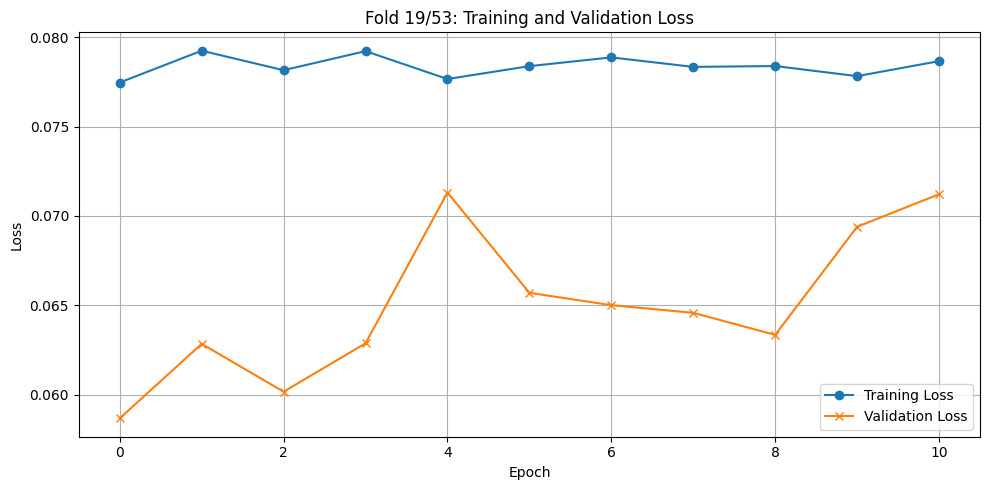


🔁 LOSO Fold 20/53: Đang huấn luyện trên 53 người, kiểm tra trên người thứ 20
Epoch 1/80 - Train Loss: 0.0795, Test Loss: 0.0413
EarlyStopping counter: 1 out of 10
Epoch 2/80 - Train Loss: 0.0790, Test Loss: 0.0442
EarlyStopping counter: 2 out of 10
Epoch 3/80 - Train Loss: 0.0790, Test Loss: 0.0435
EarlyStopping counter: 3 out of 10
Epoch 4/80 - Train Loss: 0.0791, Test Loss: 0.0445
EarlyStopping counter: 4 out of 10
Epoch 5/80 - Train Loss: 0.0792, Test Loss: 0.0443
EarlyStopping counter: 5 out of 10
Epoch 6/80 - Train Loss: 0.0793, Test Loss: 0.0458
EarlyStopping counter: 6 out of 10
Epoch 7/80 - Train Loss: 0.0784, Test Loss: 0.0517
EarlyStopping counter: 7 out of 10
Epoch 8/80 - Train Loss: 0.0788, Test Loss: 0.0479
EarlyStopping counter: 8 out of 10
Epoch 9/80 - Train Loss: 0.0792, Test Loss: 0.0439
EarlyStopping counter: 9 out of 10
Epoch 10/80 - Train Loss: 0.0782, Test Loss: 0.0456
EarlyStopping counter: 10 out of 10
Early stopping at epoch 11


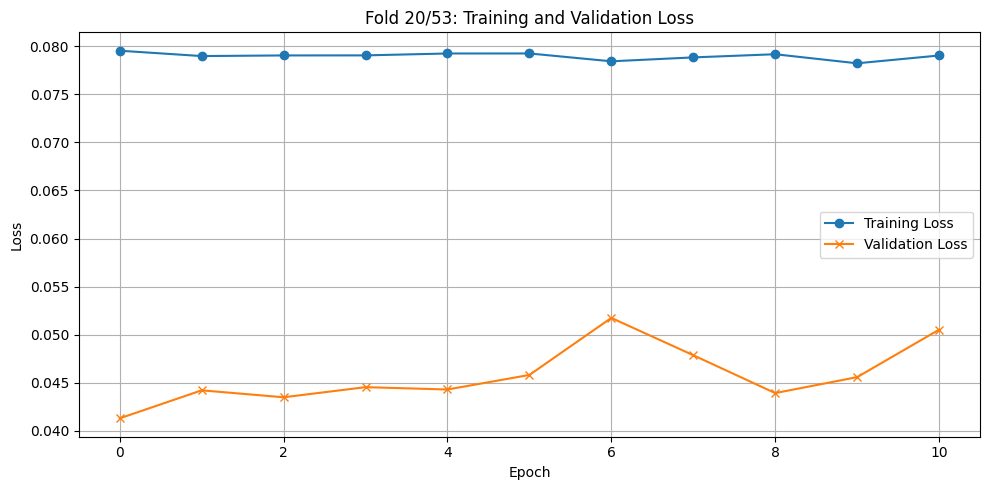


🔁 LOSO Fold 21/53: Đang huấn luyện trên 53 người, kiểm tra trên người thứ 21
Epoch 1/80 - Train Loss: 0.0785, Test Loss: 0.0317
EarlyStopping counter: 1 out of 10
Epoch 2/80 - Train Loss: 0.0793, Test Loss: 0.0368
EarlyStopping counter: 2 out of 10
Epoch 3/80 - Train Loss: 0.0788, Test Loss: 0.0322
EarlyStopping counter: 3 out of 10
Epoch 4/80 - Train Loss: 0.0785, Test Loss: 0.0344
EarlyStopping counter: 4 out of 10
Epoch 5/80 - Train Loss: 0.0787, Test Loss: 0.0371
EarlyStopping counter: 5 out of 10
Epoch 6/80 - Train Loss: 0.0792, Test Loss: 0.0448
EarlyStopping counter: 6 out of 10
Epoch 7/80 - Train Loss: 0.0791, Test Loss: 0.0425
EarlyStopping counter: 7 out of 10
Epoch 8/80 - Train Loss: 0.0782, Test Loss: 0.0357
EarlyStopping counter: 8 out of 10
Epoch 9/80 - Train Loss: 0.0798, Test Loss: 0.0356
EarlyStopping counter: 9 out of 10
Epoch 10/80 - Train Loss: 0.0784, Test Loss: 0.0507
EarlyStopping counter: 10 out of 10
Early stopping at epoch 11


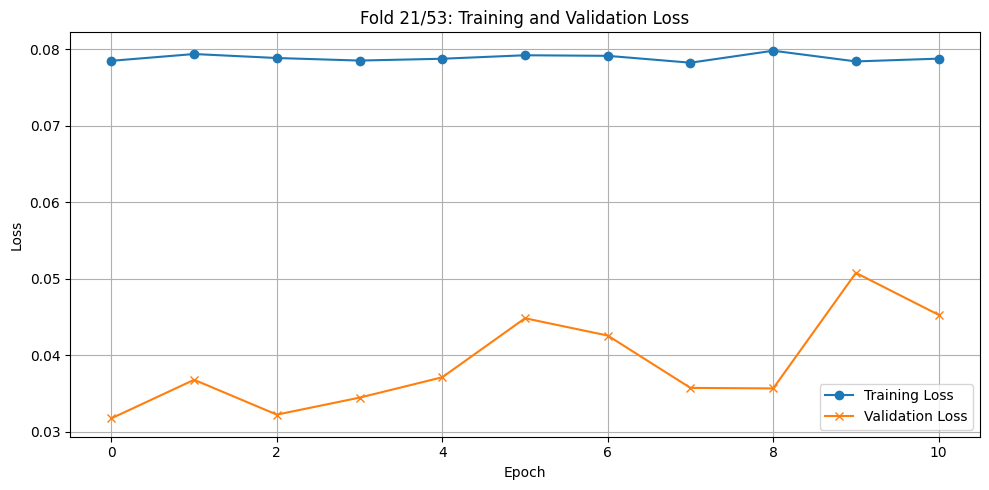


🔁 LOSO Fold 22/53: Đang huấn luyện trên 53 người, kiểm tra trên người thứ 22
Epoch 1/80 - Train Loss: 0.0773, Test Loss: 0.1037
EarlyStopping counter: 1 out of 10
Epoch 2/80 - Train Loss: 0.0772, Test Loss: 0.1060
EarlyStopping counter: 2 out of 10
Epoch 3/80 - Train Loss: 0.0769, Test Loss: 0.1063
EarlyStopping counter: 3 out of 10
Epoch 4/80 - Train Loss: 0.0773, Test Loss: 0.1052
EarlyStopping counter: 4 out of 10
Epoch 5/80 - Train Loss: 0.0764, Test Loss: 0.1080
EarlyStopping counter: 5 out of 10
Epoch 6/80 - Train Loss: 0.0772, Test Loss: 0.1113
EarlyStopping counter: 6 out of 10
Epoch 7/80 - Train Loss: 0.0763, Test Loss: 0.1115
EarlyStopping counter: 7 out of 10
Epoch 8/80 - Train Loss: 0.0769, Test Loss: 0.1097
EarlyStopping counter: 8 out of 10
Epoch 9/80 - Train Loss: 0.0772, Test Loss: 0.1111
EarlyStopping counter: 9 out of 10
Epoch 10/80 - Train Loss: 0.0764, Test Loss: 0.1143
EarlyStopping counter: 10 out of 10
Early stopping at epoch 11


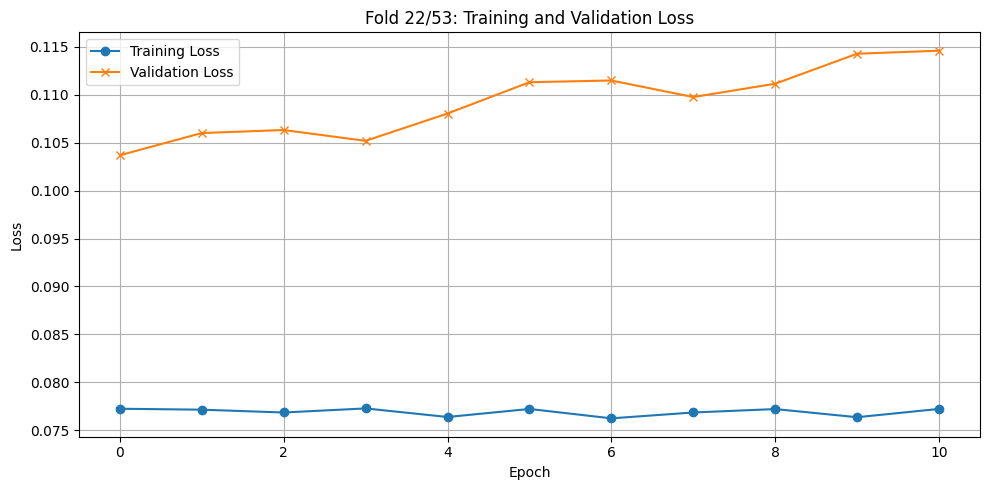


🔁 LOSO Fold 23/53: Đang huấn luyện trên 53 người, kiểm tra trên người thứ 23
Epoch 1/80 - Train Loss: 0.0760, Test Loss: 0.1318
EarlyStopping counter: 1 out of 10
Epoch 2/80 - Train Loss: 0.0766, Test Loss: 0.1359
EarlyStopping counter: 2 out of 10
Epoch 3/80 - Train Loss: 0.0764, Test Loss: 0.1421
EarlyStopping counter: 3 out of 10
Epoch 4/80 - Train Loss: 0.0752, Test Loss: 0.1417
EarlyStopping counter: 4 out of 10
Epoch 5/80 - Train Loss: 0.0758, Test Loss: 0.1438
EarlyStopping counter: 5 out of 10
Epoch 6/80 - Train Loss: 0.0766, Test Loss: 0.1431
EarlyStopping counter: 6 out of 10
Epoch 7/80 - Train Loss: 0.0763, Test Loss: 0.1483
EarlyStopping counter: 7 out of 10
Epoch 8/80 - Train Loss: 0.0768, Test Loss: 0.1454
EarlyStopping counter: 8 out of 10
Epoch 9/80 - Train Loss: 0.0767, Test Loss: 0.1366
EarlyStopping counter: 9 out of 10
Epoch 10/80 - Train Loss: 0.0766, Test Loss: 0.1479
EarlyStopping counter: 10 out of 10
Early stopping at epoch 11


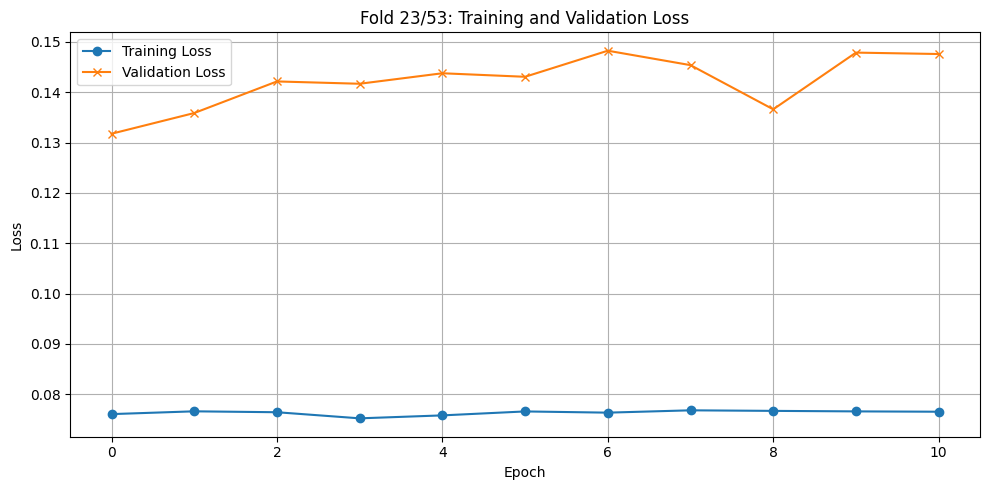


🔁 LOSO Fold 24/53: Đang huấn luyện trên 53 người, kiểm tra trên người thứ 24
Epoch 1/80 - Train Loss: 0.0777, Test Loss: 0.0428
EarlyStopping counter: 1 out of 10
Epoch 2/80 - Train Loss: 0.0784, Test Loss: 0.0476
EarlyStopping counter: 2 out of 10
Epoch 3/80 - Train Loss: 0.0786, Test Loss: 0.0465
EarlyStopping counter: 3 out of 10
Epoch 4/80 - Train Loss: 0.0784, Test Loss: 0.0540
EarlyStopping counter: 4 out of 10
Epoch 5/80 - Train Loss: 0.0785, Test Loss: 0.0468
Epoch 6/80 - Train Loss: 0.0789, Test Loss: 0.0425
EarlyStopping counter: 1 out of 10
Epoch 7/80 - Train Loss: 0.0785, Test Loss: 0.0504
EarlyStopping counter: 2 out of 10
Epoch 8/80 - Train Loss: 0.0774, Test Loss: 0.0441
EarlyStopping counter: 3 out of 10
Epoch 9/80 - Train Loss: 0.0778, Test Loss: 0.0519
EarlyStopping counter: 4 out of 10
Epoch 10/80 - Train Loss: 0.0778, Test Loss: 0.0435
EarlyStopping counter: 5 out of 10
Epoch 11/80 - Train Loss: 0.0783, Test Loss: 0.0565
EarlyStopping counter: 6 out of 10
Epoch 12/

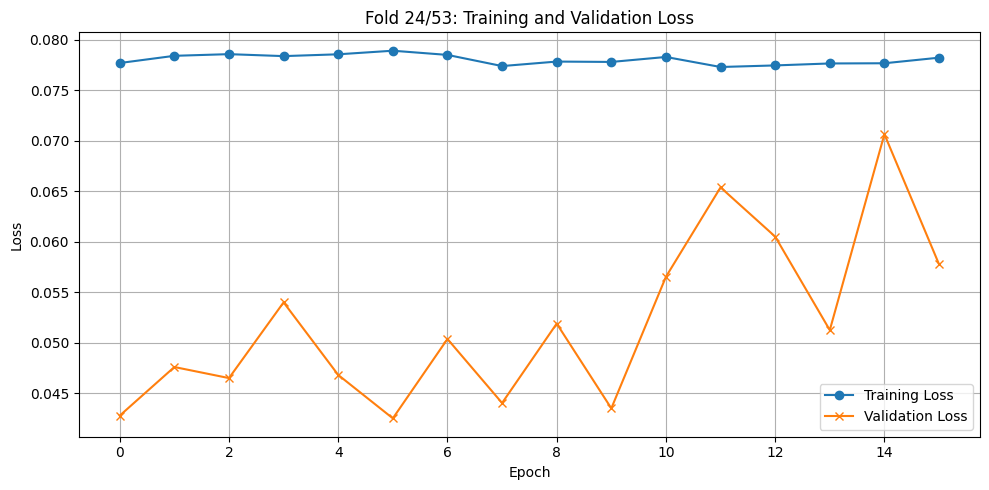


🔁 LOSO Fold 25/53: Đang huấn luyện trên 53 người, kiểm tra trên người thứ 25
Epoch 1/80 - Train Loss: 0.0780, Test Loss: 0.0897
EarlyStopping counter: 1 out of 10
Epoch 2/80 - Train Loss: 0.0770, Test Loss: 0.0922
EarlyStopping counter: 2 out of 10
Epoch 3/80 - Train Loss: 0.0772, Test Loss: 0.0902
EarlyStopping counter: 3 out of 10
Epoch 4/80 - Train Loss: 0.0766, Test Loss: 0.0930
Epoch 5/80 - Train Loss: 0.0760, Test Loss: 0.0880
EarlyStopping counter: 1 out of 10
Epoch 6/80 - Train Loss: 0.0771, Test Loss: 0.0918
EarlyStopping counter: 2 out of 10
Epoch 7/80 - Train Loss: 0.0766, Test Loss: 0.0923
EarlyStopping counter: 3 out of 10
Epoch 8/80 - Train Loss: 0.0772, Test Loss: 0.0950
EarlyStopping counter: 4 out of 10
Epoch 9/80 - Train Loss: 0.0764, Test Loss: 0.0976
EarlyStopping counter: 5 out of 10
Epoch 10/80 - Train Loss: 0.0773, Test Loss: 0.1000
EarlyStopping counter: 6 out of 10
Epoch 11/80 - Train Loss: 0.0765, Test Loss: 0.0964
EarlyStopping counter: 7 out of 10
Epoch 12/

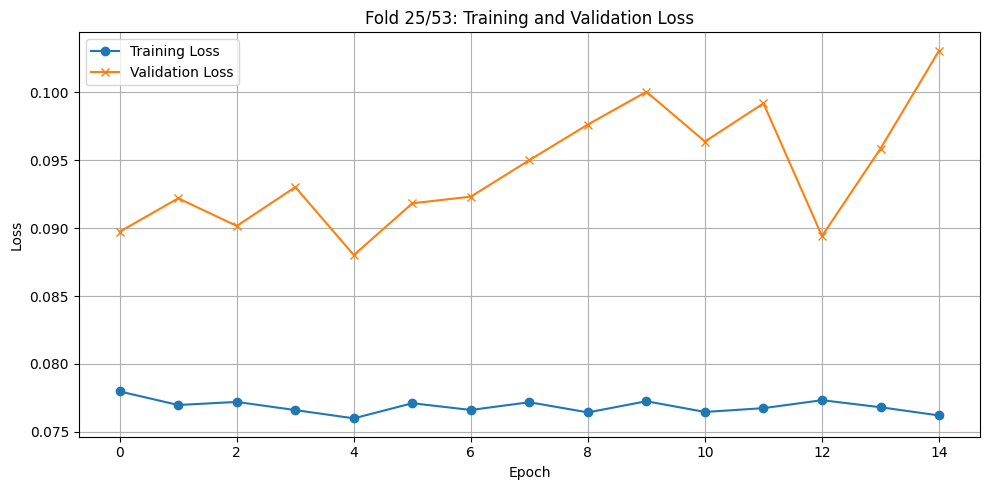


🔁 LOSO Fold 26/53: Đang huấn luyện trên 53 người, kiểm tra trên người thứ 26
Epoch 1/80 - Train Loss: 0.0772, Test Loss: 0.0861
EarlyStopping counter: 1 out of 10
Epoch 2/80 - Train Loss: 0.0768, Test Loss: 0.0875
EarlyStopping counter: 2 out of 10
Epoch 3/80 - Train Loss: 0.0769, Test Loss: 0.0900
EarlyStopping counter: 3 out of 10
Epoch 4/80 - Train Loss: 0.0774, Test Loss: 0.0915
EarlyStopping counter: 4 out of 10
Epoch 5/80 - Train Loss: 0.0761, Test Loss: 0.0936
EarlyStopping counter: 5 out of 10
Epoch 6/80 - Train Loss: 0.0762, Test Loss: 0.0967
EarlyStopping counter: 6 out of 10
Epoch 7/80 - Train Loss: 0.0763, Test Loss: 0.0967
EarlyStopping counter: 7 out of 10
Epoch 8/80 - Train Loss: 0.0763, Test Loss: 0.0997
EarlyStopping counter: 8 out of 10
Epoch 9/80 - Train Loss: 0.0763, Test Loss: 0.1055
EarlyStopping counter: 9 out of 10
Epoch 10/80 - Train Loss: 0.0761, Test Loss: 0.1024
EarlyStopping counter: 10 out of 10
Early stopping at epoch 11


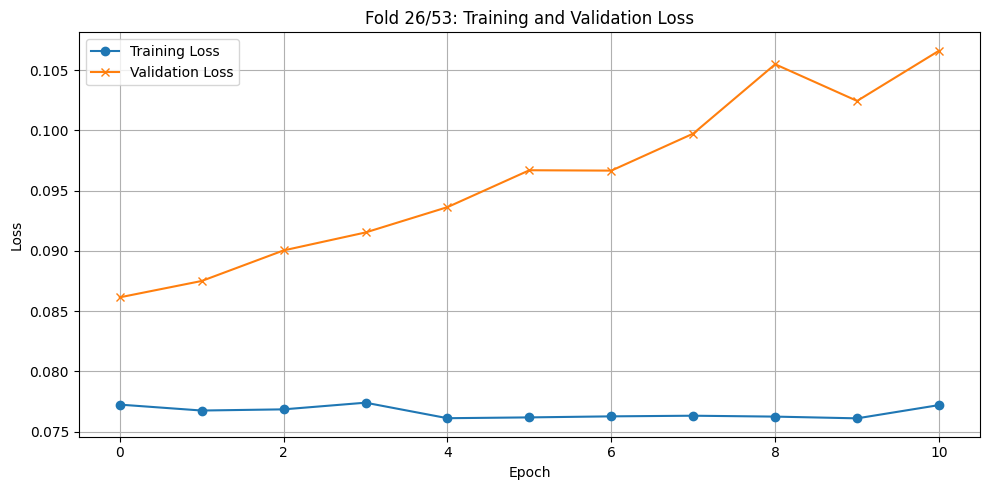


🔁 LOSO Fold 27/53: Đang huấn luyện trên 53 người, kiểm tra trên người thứ 27
Epoch 1/80 - Train Loss: 0.0789, Test Loss: 0.0254
EarlyStopping counter: 1 out of 10
Epoch 2/80 - Train Loss: 0.0776, Test Loss: 0.0360
Epoch 3/80 - Train Loss: 0.0785, Test Loss: 0.0225
EarlyStopping counter: 1 out of 10
Epoch 4/80 - Train Loss: 0.0779, Test Loss: 0.0272
Epoch 5/80 - Train Loss: 0.0777, Test Loss: 0.0220
EarlyStopping counter: 1 out of 10
Epoch 6/80 - Train Loss: 0.0777, Test Loss: 0.0240
EarlyStopping counter: 2 out of 10
Epoch 7/80 - Train Loss: 0.0783, Test Loss: 0.0221
EarlyStopping counter: 3 out of 10
Epoch 8/80 - Train Loss: 0.0778, Test Loss: 0.0276
EarlyStopping counter: 4 out of 10
Epoch 9/80 - Train Loss: 0.0784, Test Loss: 0.0250
EarlyStopping counter: 5 out of 10
Epoch 10/80 - Train Loss: 0.0791, Test Loss: 0.0284
EarlyStopping counter: 6 out of 10
Epoch 11/80 - Train Loss: 0.0781, Test Loss: 0.0255
EarlyStopping counter: 7 out of 10
Epoch 12/80 - Train Loss: 0.0779, Test Loss:

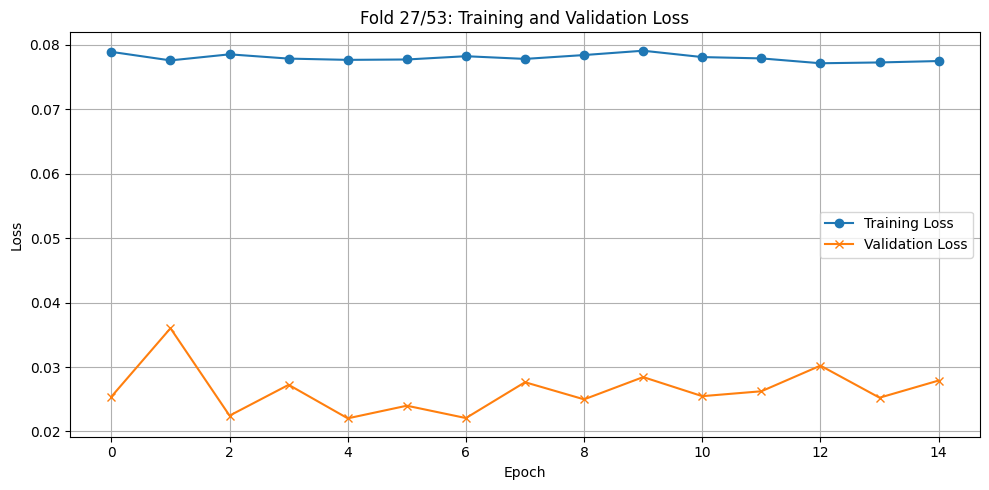


🔁 LOSO Fold 28/53: Đang huấn luyện trên 53 người, kiểm tra trên người thứ 28
Epoch 1/80 - Train Loss: 0.0776, Test Loss: 0.0379
Epoch 2/80 - Train Loss: 0.0782, Test Loss: 0.0355
EarlyStopping counter: 1 out of 10
Epoch 3/80 - Train Loss: 0.0778, Test Loss: 0.0375
EarlyStopping counter: 2 out of 10
Epoch 4/80 - Train Loss: 0.0778, Test Loss: 0.0389
EarlyStopping counter: 3 out of 10
Epoch 5/80 - Train Loss: 0.0772, Test Loss: 0.0379
EarlyStopping counter: 4 out of 10
Epoch 6/80 - Train Loss: 0.0778, Test Loss: 0.0425
EarlyStopping counter: 5 out of 10
Epoch 7/80 - Train Loss: 0.0780, Test Loss: 0.0379
EarlyStopping counter: 6 out of 10
Epoch 8/80 - Train Loss: 0.0772, Test Loss: 0.0364
EarlyStopping counter: 7 out of 10
Epoch 9/80 - Train Loss: 0.0776, Test Loss: 0.0410
EarlyStopping counter: 8 out of 10
Epoch 10/80 - Train Loss: 0.0772, Test Loss: 0.0402
EarlyStopping counter: 9 out of 10
Epoch 11/80 - Train Loss: 0.0776, Test Loss: 0.0372
EarlyStopping counter: 10 out of 10
Early st

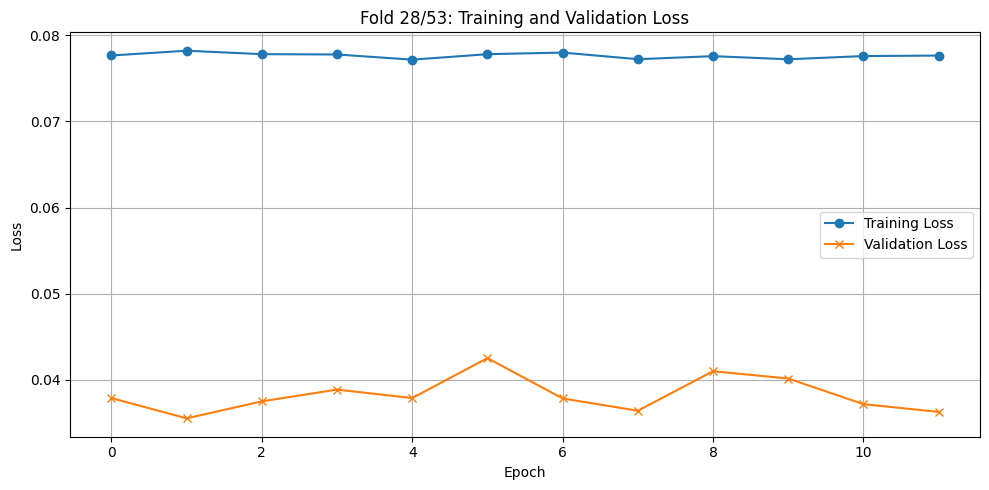


🔁 LOSO Fold 29/53: Đang huấn luyện trên 53 người, kiểm tra trên người thứ 29
Epoch 1/80 - Train Loss: 0.0763, Test Loss: 0.0586
EarlyStopping counter: 1 out of 10
Epoch 2/80 - Train Loss: 0.0769, Test Loss: 0.0609
EarlyStopping counter: 2 out of 10
Epoch 3/80 - Train Loss: 0.0778, Test Loss: 0.0609
EarlyStopping counter: 3 out of 10
Epoch 4/80 - Train Loss: 0.0772, Test Loss: 0.0597
EarlyStopping counter: 4 out of 10
Epoch 5/80 - Train Loss: 0.0775, Test Loss: 0.0597
Epoch 6/80 - Train Loss: 0.0773, Test Loss: 0.0577
EarlyStopping counter: 1 out of 10
Epoch 7/80 - Train Loss: 0.0765, Test Loss: 0.0589
EarlyStopping counter: 2 out of 10
Epoch 8/80 - Train Loss: 0.0771, Test Loss: 0.0580
EarlyStopping counter: 3 out of 10
Epoch 9/80 - Train Loss: 0.0770, Test Loss: 0.0599
EarlyStopping counter: 4 out of 10
Epoch 10/80 - Train Loss: 0.0766, Test Loss: 0.0656
EarlyStopping counter: 5 out of 10
Epoch 11/80 - Train Loss: 0.0772, Test Loss: 0.0648
EarlyStopping counter: 6 out of 10
Epoch 12/

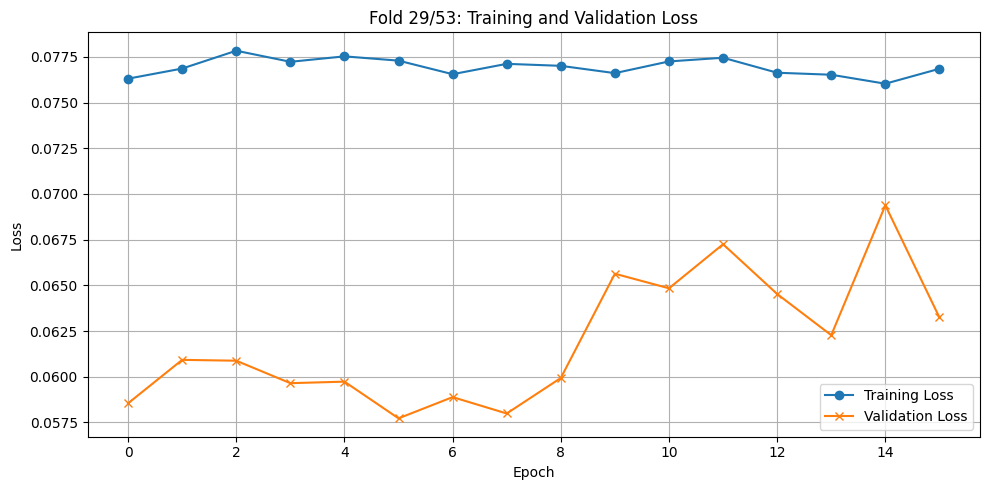


🔁 LOSO Fold 30/53: Đang huấn luyện trên 53 người, kiểm tra trên người thứ 30
Epoch 1/80 - Train Loss: 0.0757, Test Loss: 0.1312
EarlyStopping counter: 1 out of 10
Epoch 2/80 - Train Loss: 0.0757, Test Loss: 0.1379
Epoch 3/80 - Train Loss: 0.0745, Test Loss: 0.1310
EarlyStopping counter: 1 out of 10
Epoch 4/80 - Train Loss: 0.0758, Test Loss: 0.1414
EarlyStopping counter: 2 out of 10
Epoch 5/80 - Train Loss: 0.0749, Test Loss: 0.1392
EarlyStopping counter: 3 out of 10
Epoch 6/80 - Train Loss: 0.0754, Test Loss: 0.1424
EarlyStopping counter: 4 out of 10
Epoch 7/80 - Train Loss: 0.0746, Test Loss: 0.1425
EarlyStopping counter: 5 out of 10
Epoch 8/80 - Train Loss: 0.0747, Test Loss: 0.1386
EarlyStopping counter: 6 out of 10
Epoch 9/80 - Train Loss: 0.0745, Test Loss: 0.1409
EarlyStopping counter: 7 out of 10
Epoch 10/80 - Train Loss: 0.0757, Test Loss: 0.1450
EarlyStopping counter: 8 out of 10
Epoch 11/80 - Train Loss: 0.0749, Test Loss: 0.1503
EarlyStopping counter: 9 out of 10
Epoch 12/

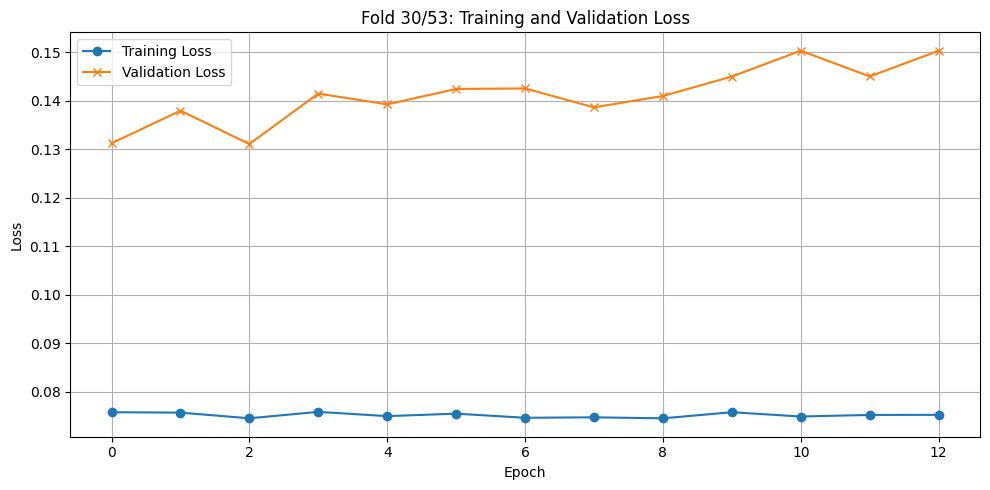


🔁 LOSO Fold 31/53: Đang huấn luyện trên 53 người, kiểm tra trên người thứ 31
Epoch 1/80 - Train Loss: 0.0767, Test Loss: 0.0684
EarlyStopping counter: 1 out of 10
Epoch 2/80 - Train Loss: 0.0766, Test Loss: 0.0730
EarlyStopping counter: 2 out of 10
Epoch 3/80 - Train Loss: 0.0760, Test Loss: 0.0689
EarlyStopping counter: 3 out of 10
Epoch 4/80 - Train Loss: 0.0769, Test Loss: 0.0740
EarlyStopping counter: 4 out of 10
Epoch 5/80 - Train Loss: 0.0768, Test Loss: 0.0740
EarlyStopping counter: 5 out of 10
Epoch 6/80 - Train Loss: 0.0766, Test Loss: 0.0720
EarlyStopping counter: 6 out of 10
Epoch 7/80 - Train Loss: 0.0761, Test Loss: 0.0732
EarlyStopping counter: 7 out of 10
Epoch 8/80 - Train Loss: 0.0758, Test Loss: 0.0736
EarlyStopping counter: 8 out of 10
Epoch 9/80 - Train Loss: 0.0765, Test Loss: 0.0872
EarlyStopping counter: 9 out of 10
Epoch 10/80 - Train Loss: 0.0779, Test Loss: 0.0743
EarlyStopping counter: 10 out of 10
Early stopping at epoch 11


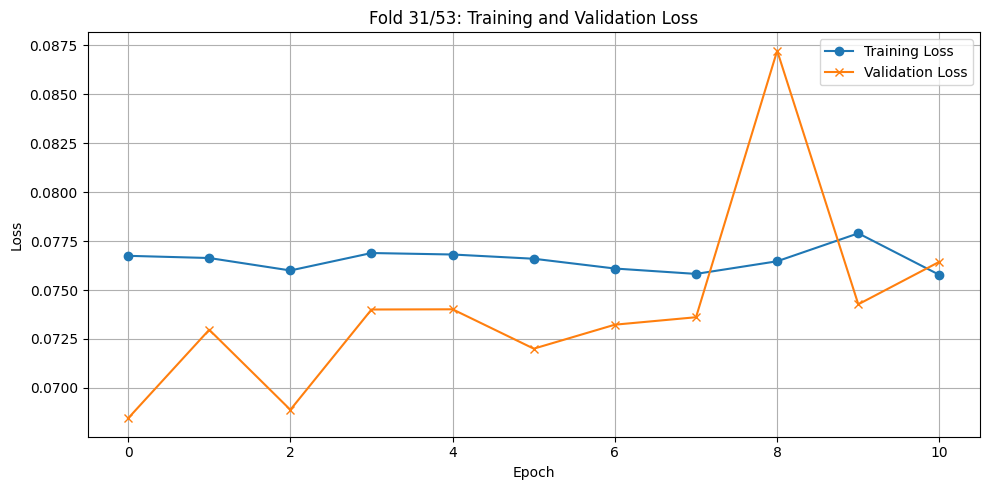


🔁 LOSO Fold 32/53: Đang huấn luyện trên 53 người, kiểm tra trên người thứ 32
Epoch 1/80 - Train Loss: 0.0771, Test Loss: 0.0398
EarlyStopping counter: 1 out of 10
Epoch 2/80 - Train Loss: 0.0764, Test Loss: 0.0425
EarlyStopping counter: 2 out of 10
Epoch 3/80 - Train Loss: 0.0766, Test Loss: 0.0478
EarlyStopping counter: 3 out of 10
Epoch 4/80 - Train Loss: 0.0759, Test Loss: 0.0421
EarlyStopping counter: 4 out of 10
Epoch 5/80 - Train Loss: 0.0770, Test Loss: 0.0594
EarlyStopping counter: 5 out of 10
Epoch 6/80 - Train Loss: 0.0773, Test Loss: 0.0512
EarlyStopping counter: 6 out of 10
Epoch 7/80 - Train Loss: 0.0766, Test Loss: 0.0604
EarlyStopping counter: 7 out of 10
Epoch 8/80 - Train Loss: 0.0773, Test Loss: 0.0678
EarlyStopping counter: 8 out of 10
Epoch 9/80 - Train Loss: 0.0770, Test Loss: 0.0681
EarlyStopping counter: 9 out of 10
Epoch 10/80 - Train Loss: 0.0763, Test Loss: 0.0608
EarlyStopping counter: 10 out of 10
Early stopping at epoch 11


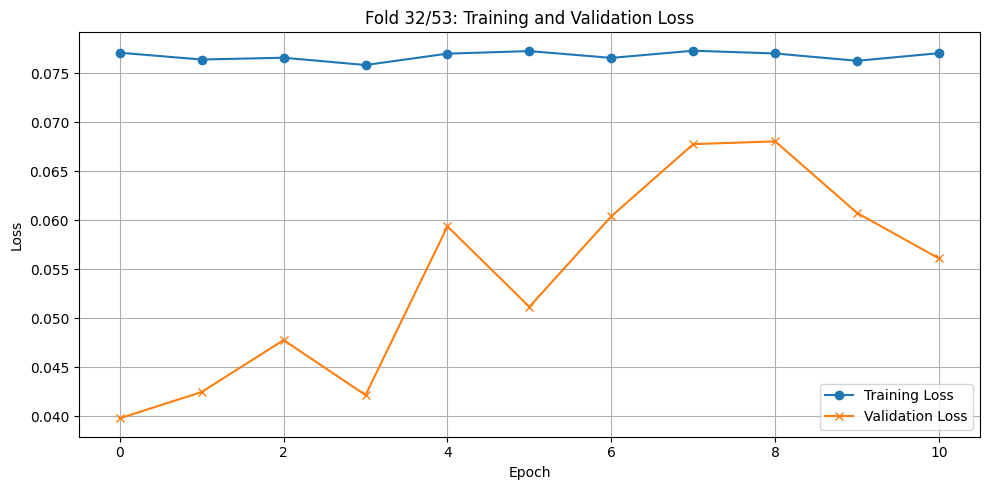


🔁 LOSO Fold 33/53: Đang huấn luyện trên 53 người, kiểm tra trên người thứ 33
Epoch 1/80 - Train Loss: 0.0764, Test Loss: 0.0585
EarlyStopping counter: 1 out of 10
Epoch 2/80 - Train Loss: 0.0766, Test Loss: 0.0623
EarlyStopping counter: 2 out of 10
Epoch 3/80 - Train Loss: 0.0775, Test Loss: 0.0665
EarlyStopping counter: 3 out of 10
Epoch 4/80 - Train Loss: 0.0764, Test Loss: 0.0637
EarlyStopping counter: 4 out of 10
Epoch 5/80 - Train Loss: 0.0763, Test Loss: 0.0685
EarlyStopping counter: 5 out of 10
Epoch 6/80 - Train Loss: 0.0764, Test Loss: 0.0702
EarlyStopping counter: 6 out of 10
Epoch 7/80 - Train Loss: 0.0774, Test Loss: 0.0643
EarlyStopping counter: 7 out of 10
Epoch 8/80 - Train Loss: 0.0760, Test Loss: 0.0623
EarlyStopping counter: 8 out of 10
Epoch 9/80 - Train Loss: 0.0765, Test Loss: 0.0651
EarlyStopping counter: 9 out of 10
Epoch 10/80 - Train Loss: 0.0768, Test Loss: 0.0626
EarlyStopping counter: 10 out of 10
Early stopping at epoch 11


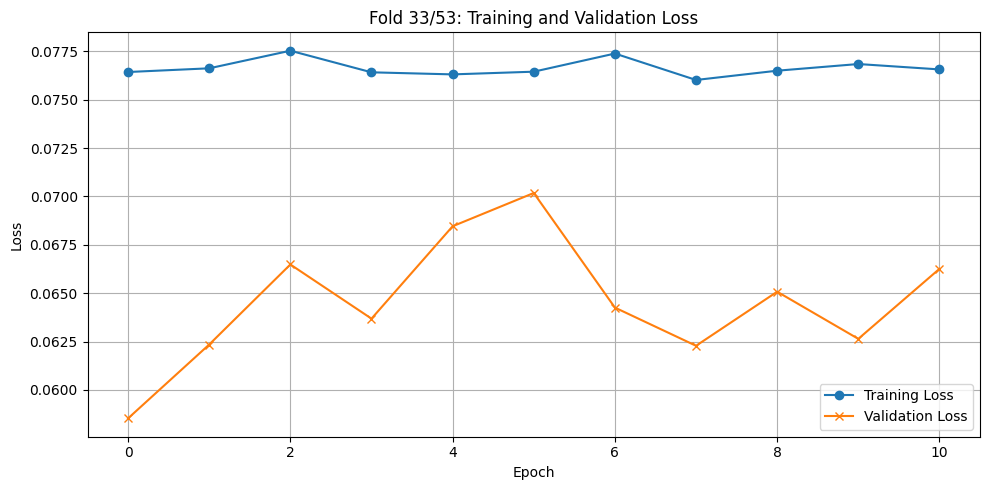


🔁 LOSO Fold 34/53: Đang huấn luyện trên 53 người, kiểm tra trên người thứ 34
Epoch 1/80 - Train Loss: 0.0759, Test Loss: 0.1180
Epoch 2/80 - Train Loss: 0.0759, Test Loss: 0.1162
EarlyStopping counter: 1 out of 10
Epoch 3/80 - Train Loss: 0.0752, Test Loss: 0.1220
EarlyStopping counter: 2 out of 10
Epoch 4/80 - Train Loss: 0.0751, Test Loss: 0.1227
EarlyStopping counter: 3 out of 10
Epoch 5/80 - Train Loss: 0.0766, Test Loss: 0.1244
EarlyStopping counter: 4 out of 10
Epoch 6/80 - Train Loss: 0.0751, Test Loss: 0.1223
EarlyStopping counter: 5 out of 10
Epoch 7/80 - Train Loss: 0.0746, Test Loss: 0.1258
EarlyStopping counter: 6 out of 10
Epoch 8/80 - Train Loss: 0.0737, Test Loss: 0.1266
EarlyStopping counter: 7 out of 10
Epoch 9/80 - Train Loss: 0.0745, Test Loss: 0.1260
EarlyStopping counter: 8 out of 10
Epoch 10/80 - Train Loss: 0.0749, Test Loss: 0.1255
EarlyStopping counter: 9 out of 10
Epoch 11/80 - Train Loss: 0.0760, Test Loss: 0.1254
EarlyStopping counter: 10 out of 10
Early st

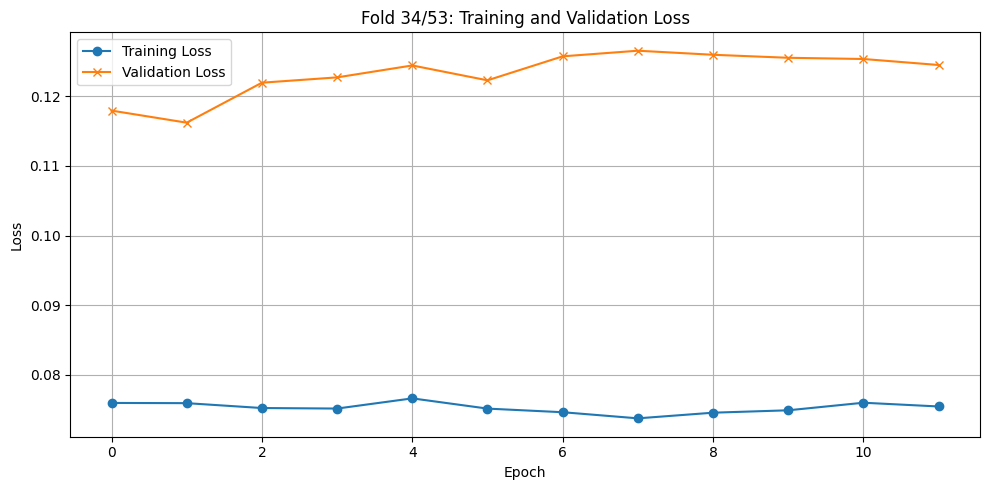


🔁 LOSO Fold 35/53: Đang huấn luyện trên 53 người, kiểm tra trên người thứ 35
Epoch 1/80 - Train Loss: 0.0779, Test Loss: 0.0444
EarlyStopping counter: 1 out of 10
Epoch 2/80 - Train Loss: 0.0765, Test Loss: 0.0477
EarlyStopping counter: 2 out of 10
Epoch 3/80 - Train Loss: 0.0769, Test Loss: 0.0518
EarlyStopping counter: 3 out of 10
Epoch 4/80 - Train Loss: 0.0760, Test Loss: 0.0512
EarlyStopping counter: 4 out of 10
Epoch 5/80 - Train Loss: 0.0773, Test Loss: 0.0618
EarlyStopping counter: 5 out of 10
Epoch 6/80 - Train Loss: 0.0768, Test Loss: 0.0566
EarlyStopping counter: 6 out of 10
Epoch 7/80 - Train Loss: 0.0763, Test Loss: 0.0548
EarlyStopping counter: 7 out of 10
Epoch 8/80 - Train Loss: 0.0770, Test Loss: 0.0593
EarlyStopping counter: 8 out of 10
Epoch 9/80 - Train Loss: 0.0768, Test Loss: 0.0615
EarlyStopping counter: 9 out of 10
Epoch 10/80 - Train Loss: 0.0773, Test Loss: 0.0606
EarlyStopping counter: 10 out of 10
Early stopping at epoch 11


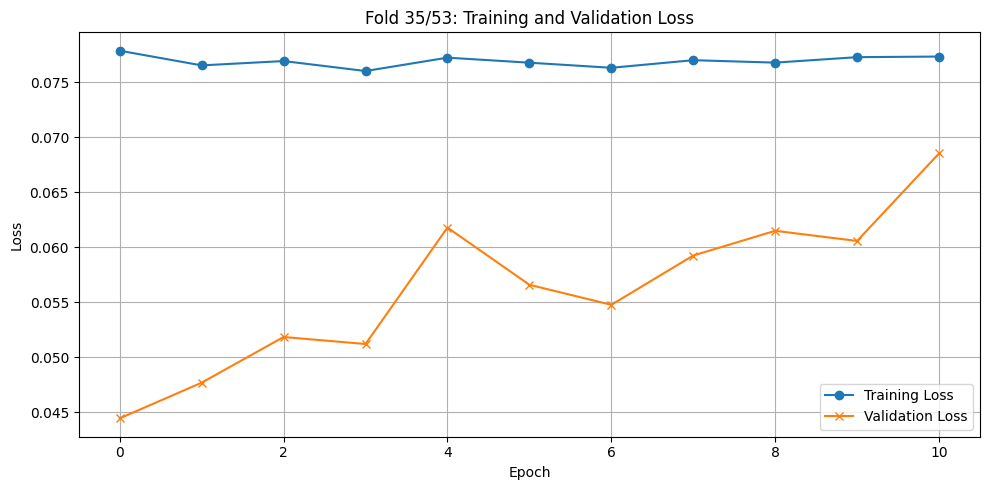


🔁 LOSO Fold 36/53: Đang huấn luyện trên 53 người, kiểm tra trên người thứ 36
Epoch 1/80 - Train Loss: 0.0765, Test Loss: 0.0619
EarlyStopping counter: 1 out of 10
Epoch 2/80 - Train Loss: 0.0763, Test Loss: 0.0659
EarlyStopping counter: 2 out of 10
Epoch 3/80 - Train Loss: 0.0765, Test Loss: 0.0666
EarlyStopping counter: 3 out of 10
Epoch 4/80 - Train Loss: 0.0759, Test Loss: 0.0634
EarlyStopping counter: 4 out of 10
Epoch 5/80 - Train Loss: 0.0758, Test Loss: 0.0666
EarlyStopping counter: 5 out of 10
Epoch 6/80 - Train Loss: 0.0758, Test Loss: 0.0724
EarlyStopping counter: 6 out of 10
Epoch 7/80 - Train Loss: 0.0765, Test Loss: 0.0720
EarlyStopping counter: 7 out of 10
Epoch 8/80 - Train Loss: 0.0759, Test Loss: 0.0692
EarlyStopping counter: 8 out of 10
Epoch 9/80 - Train Loss: 0.0768, Test Loss: 0.0694
EarlyStopping counter: 9 out of 10
Epoch 10/80 - Train Loss: 0.0757, Test Loss: 0.0666
EarlyStopping counter: 10 out of 10
Early stopping at epoch 11


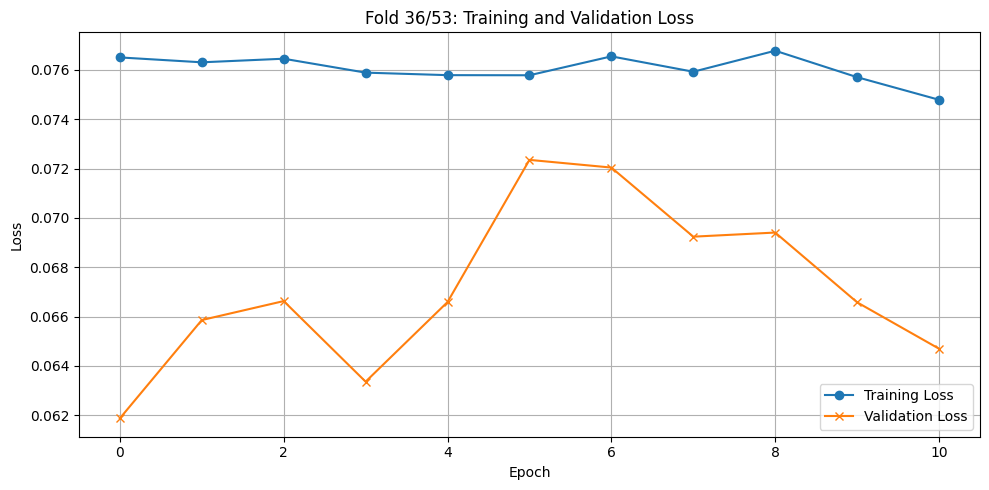


🔁 LOSO Fold 37/53: Đang huấn luyện trên 53 người, kiểm tra trên người thứ 37
Epoch 1/80 - Train Loss: 0.0753, Test Loss: 0.0730
EarlyStopping counter: 1 out of 10
Epoch 2/80 - Train Loss: 0.0763, Test Loss: 0.0736
EarlyStopping counter: 2 out of 10
Epoch 3/80 - Train Loss: 0.0760, Test Loss: 0.0822
EarlyStopping counter: 3 out of 10
Epoch 4/80 - Train Loss: 0.0756, Test Loss: 0.0796
EarlyStopping counter: 4 out of 10
Epoch 5/80 - Train Loss: 0.0760, Test Loss: 0.0831
EarlyStopping counter: 5 out of 10
Epoch 6/80 - Train Loss: 0.0757, Test Loss: 0.0843
EarlyStopping counter: 6 out of 10
Epoch 7/80 - Train Loss: 0.0754, Test Loss: 0.0730
Epoch 8/80 - Train Loss: 0.0764, Test Loss: 0.0727
EarlyStopping counter: 1 out of 10
Epoch 9/80 - Train Loss: 0.0759, Test Loss: 0.0874
EarlyStopping counter: 2 out of 10
Epoch 10/80 - Train Loss: 0.0756, Test Loss: 0.0866
EarlyStopping counter: 3 out of 10
Epoch 11/80 - Train Loss: 0.0752, Test Loss: 0.0796
EarlyStopping counter: 4 out of 10
Epoch 12/

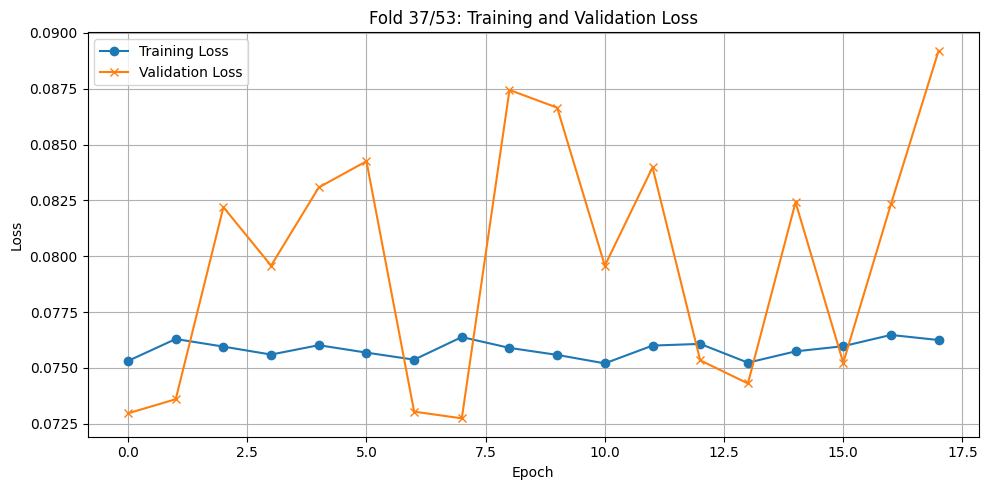


🔁 LOSO Fold 38/53: Đang huấn luyện trên 53 người, kiểm tra trên người thứ 38
Epoch 1/80 - Train Loss: 0.0751, Test Loss: 0.1040
EarlyStopping counter: 1 out of 10
Epoch 2/80 - Train Loss: 0.0756, Test Loss: 0.1059
EarlyStopping counter: 2 out of 10
Epoch 3/80 - Train Loss: 0.0748, Test Loss: 0.1043
EarlyStopping counter: 3 out of 10
Epoch 4/80 - Train Loss: 0.0755, Test Loss: 0.1117
EarlyStopping counter: 4 out of 10
Epoch 5/80 - Train Loss: 0.0753, Test Loss: 0.1176
EarlyStopping counter: 5 out of 10
Epoch 6/80 - Train Loss: 0.0749, Test Loss: 0.1090
EarlyStopping counter: 6 out of 10
Epoch 7/80 - Train Loss: 0.0747, Test Loss: 0.1137
EarlyStopping counter: 7 out of 10
Epoch 8/80 - Train Loss: 0.0746, Test Loss: 0.1071
EarlyStopping counter: 8 out of 10
Epoch 9/80 - Train Loss: 0.0749, Test Loss: 0.1117
EarlyStopping counter: 9 out of 10
Epoch 10/80 - Train Loss: 0.0748, Test Loss: 0.1067
EarlyStopping counter: 10 out of 10
Early stopping at epoch 11


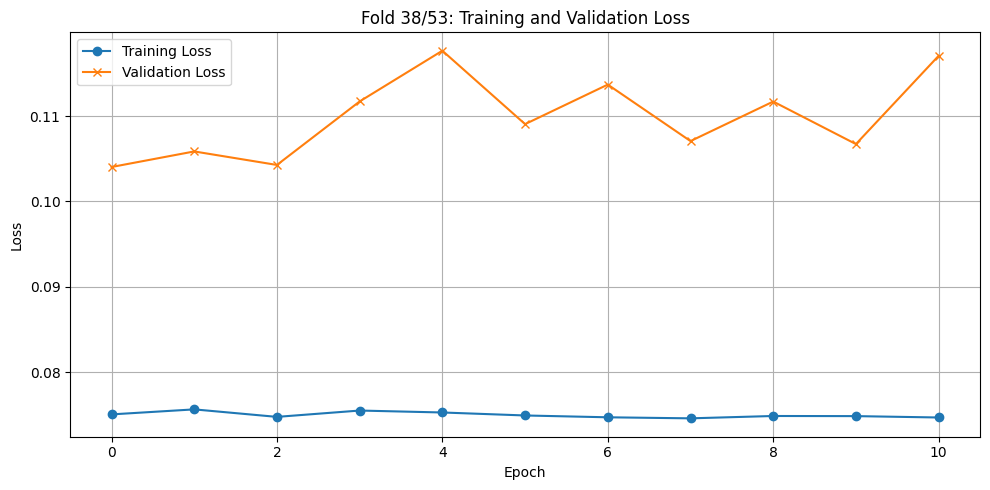


🔁 LOSO Fold 39/53: Đang huấn luyện trên 53 người, kiểm tra trên người thứ 39
Epoch 1/80 - Train Loss: 0.0754, Test Loss: 0.0900
EarlyStopping counter: 1 out of 10
Epoch 2/80 - Train Loss: 0.0758, Test Loss: 0.1020
EarlyStopping counter: 2 out of 10
Epoch 3/80 - Train Loss: 0.0752, Test Loss: 0.0997
EarlyStopping counter: 3 out of 10
Epoch 4/80 - Train Loss: 0.0750, Test Loss: 0.1165
EarlyStopping counter: 4 out of 10
Epoch 5/80 - Train Loss: 0.0750, Test Loss: 0.1126
EarlyStopping counter: 5 out of 10
Epoch 6/80 - Train Loss: 0.0754, Test Loss: 0.1032
EarlyStopping counter: 6 out of 10
Epoch 7/80 - Train Loss: 0.0756, Test Loss: 0.1056
EarlyStopping counter: 7 out of 10
Epoch 8/80 - Train Loss: 0.0746, Test Loss: 0.1101
EarlyStopping counter: 8 out of 10
Epoch 9/80 - Train Loss: 0.0749, Test Loss: 0.1066
EarlyStopping counter: 9 out of 10
Epoch 10/80 - Train Loss: 0.0745, Test Loss: 0.1077
EarlyStopping counter: 10 out of 10
Early stopping at epoch 11


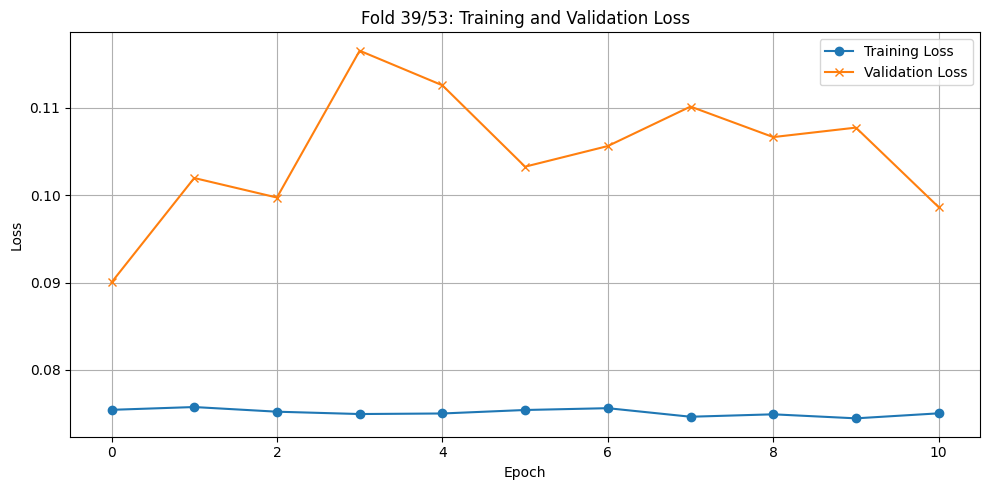


🔁 LOSO Fold 40/53: Đang huấn luyện trên 53 người, kiểm tra trên người thứ 40
Epoch 1/80 - Train Loss: 0.0750, Test Loss: 0.0950
EarlyStopping counter: 1 out of 10
Epoch 2/80 - Train Loss: 0.0747, Test Loss: 0.0954
EarlyStopping counter: 2 out of 10
Epoch 3/80 - Train Loss: 0.0754, Test Loss: 0.0972
EarlyStopping counter: 3 out of 10
Epoch 4/80 - Train Loss: 0.0748, Test Loss: 0.0984
Epoch 5/80 - Train Loss: 0.0752, Test Loss: 0.0930
EarlyStopping counter: 1 out of 10
Epoch 6/80 - Train Loss: 0.0754, Test Loss: 0.0942
EarlyStopping counter: 2 out of 10
Epoch 7/80 - Train Loss: 0.0750, Test Loss: 0.0967
EarlyStopping counter: 3 out of 10
Epoch 8/80 - Train Loss: 0.0752, Test Loss: 0.1007
EarlyStopping counter: 4 out of 10
Epoch 9/80 - Train Loss: 0.0755, Test Loss: 0.1020
EarlyStopping counter: 5 out of 10
Epoch 10/80 - Train Loss: 0.0749, Test Loss: 0.1004
EarlyStopping counter: 6 out of 10
Epoch 11/80 - Train Loss: 0.0745, Test Loss: 0.1008
EarlyStopping counter: 7 out of 10
Epoch 12/

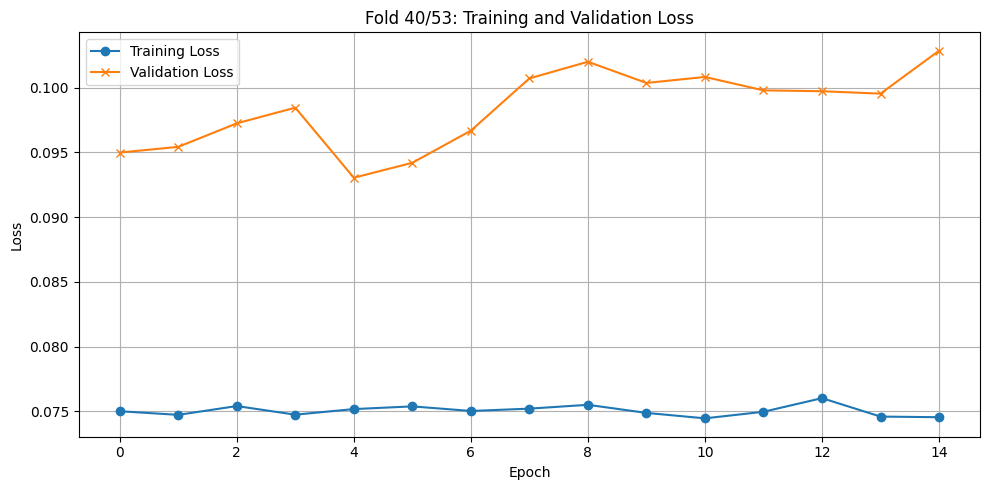


🔁 LOSO Fold 41/53: Đang huấn luyện trên 53 người, kiểm tra trên người thứ 41
Epoch 1/80 - Train Loss: 0.0759, Test Loss: 0.0399
EarlyStopping counter: 1 out of 10
Epoch 2/80 - Train Loss: 0.0760, Test Loss: 0.0418
EarlyStopping counter: 2 out of 10
Epoch 3/80 - Train Loss: 0.0757, Test Loss: 0.0423
EarlyStopping counter: 3 out of 10
Epoch 4/80 - Train Loss: 0.0759, Test Loss: 0.0407
EarlyStopping counter: 4 out of 10
Epoch 5/80 - Train Loss: 0.0769, Test Loss: 0.0416
EarlyStopping counter: 5 out of 10
Epoch 6/80 - Train Loss: 0.0768, Test Loss: 0.0420
EarlyStopping counter: 6 out of 10
Epoch 7/80 - Train Loss: 0.0761, Test Loss: 0.0431
EarlyStopping counter: 7 out of 10
Epoch 8/80 - Train Loss: 0.0753, Test Loss: 0.0411
EarlyStopping counter: 8 out of 10
Epoch 9/80 - Train Loss: 0.0763, Test Loss: 0.0462
EarlyStopping counter: 9 out of 10
Epoch 10/80 - Train Loss: 0.0761, Test Loss: 0.0447
EarlyStopping counter: 10 out of 10
Early stopping at epoch 11


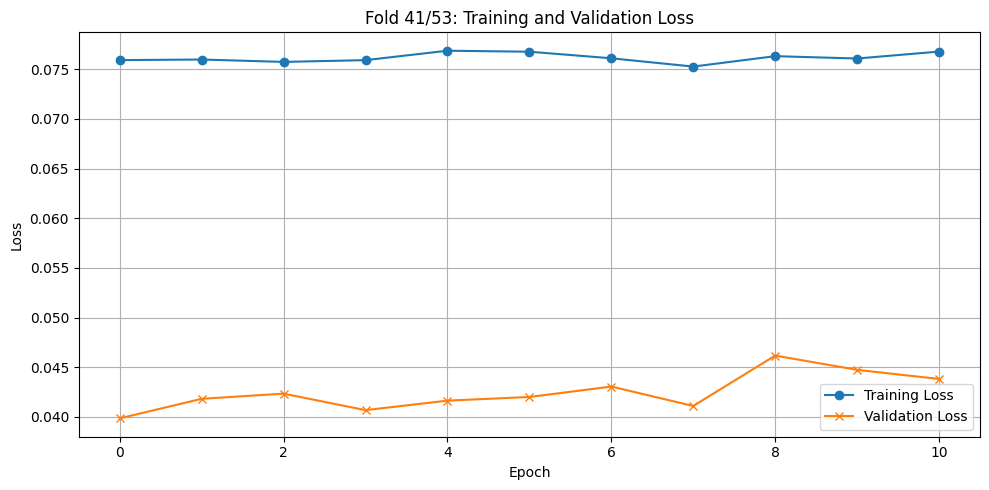


🔁 LOSO Fold 42/53: Đang huấn luyện trên 53 người, kiểm tra trên người thứ 42
Epoch 1/80 - Train Loss: 0.0765, Test Loss: 0.0620
EarlyStopping counter: 1 out of 10
Epoch 2/80 - Train Loss: 0.0749, Test Loss: 0.0677
EarlyStopping counter: 2 out of 10
Epoch 3/80 - Train Loss: 0.0754, Test Loss: 0.0652
EarlyStopping counter: 3 out of 10
Epoch 4/80 - Train Loss: 0.0758, Test Loss: 0.0699
EarlyStopping counter: 4 out of 10
Epoch 5/80 - Train Loss: 0.0758, Test Loss: 0.0640
EarlyStopping counter: 5 out of 10
Epoch 6/80 - Train Loss: 0.0760, Test Loss: 0.0698
EarlyStopping counter: 6 out of 10
Epoch 7/80 - Train Loss: 0.0747, Test Loss: 0.0643
EarlyStopping counter: 7 out of 10
Epoch 8/80 - Train Loss: 0.0751, Test Loss: 0.0711
EarlyStopping counter: 8 out of 10
Epoch 9/80 - Train Loss: 0.0760, Test Loss: 0.0736
EarlyStopping counter: 9 out of 10
Epoch 10/80 - Train Loss: 0.0748, Test Loss: 0.0687
EarlyStopping counter: 10 out of 10
Early stopping at epoch 11


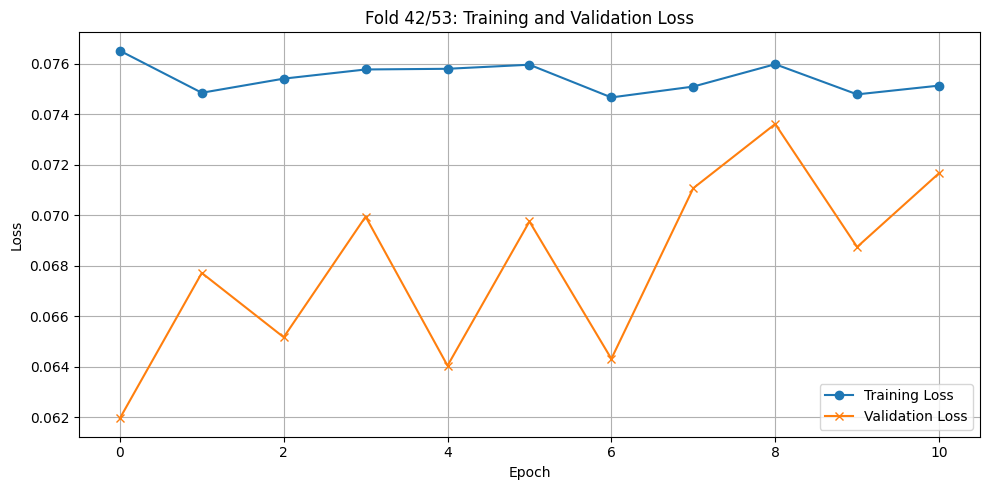


🔁 LOSO Fold 43/53: Đang huấn luyện trên 53 người, kiểm tra trên người thứ 43
Epoch 1/80 - Train Loss: 0.0753, Test Loss: 0.0718
Epoch 2/80 - Train Loss: 0.0755, Test Loss: 0.0510
EarlyStopping counter: 1 out of 10
Epoch 3/80 - Train Loss: 0.0753, Test Loss: 0.0587
EarlyStopping counter: 2 out of 10
Epoch 4/80 - Train Loss: 0.0755, Test Loss: 0.0607
EarlyStopping counter: 3 out of 10
Epoch 5/80 - Train Loss: 0.0761, Test Loss: 0.0609
EarlyStopping counter: 4 out of 10
Epoch 6/80 - Train Loss: 0.0766, Test Loss: 0.0580
EarlyStopping counter: 5 out of 10
Epoch 7/80 - Train Loss: 0.0757, Test Loss: 0.0617
EarlyStopping counter: 6 out of 10
Epoch 8/80 - Train Loss: 0.0752, Test Loss: 0.0646
EarlyStopping counter: 7 out of 10
Epoch 9/80 - Train Loss: 0.0760, Test Loss: 0.0762
EarlyStopping counter: 8 out of 10
Epoch 10/80 - Train Loss: 0.0755, Test Loss: 0.0719
EarlyStopping counter: 9 out of 10
Epoch 11/80 - Train Loss: 0.0759, Test Loss: 0.0669
EarlyStopping counter: 10 out of 10
Early st

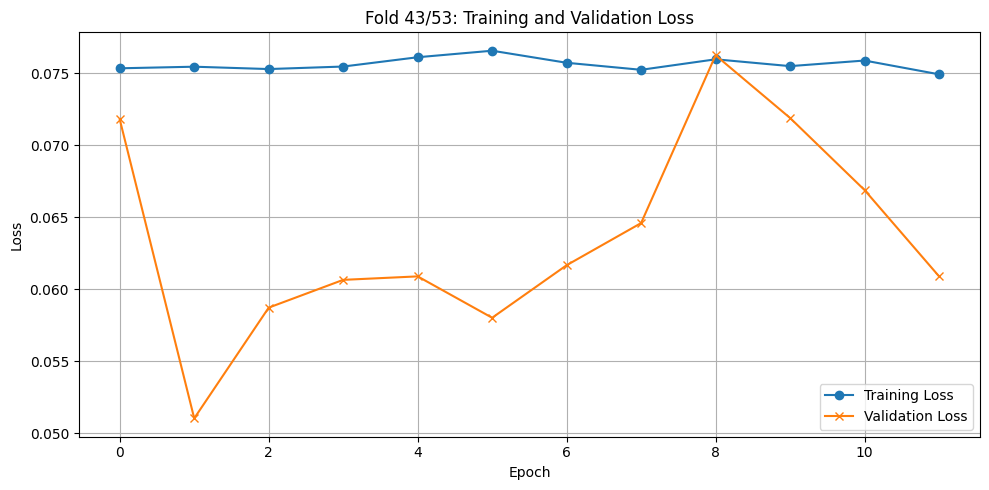


🔁 LOSO Fold 44/53: Đang huấn luyện trên 53 người, kiểm tra trên người thứ 44
Epoch 1/80 - Train Loss: 0.0764, Test Loss: 0.0479
Epoch 2/80 - Train Loss: 0.0770, Test Loss: 0.0342
EarlyStopping counter: 1 out of 10
Epoch 3/80 - Train Loss: 0.0755, Test Loss: 0.0368
EarlyStopping counter: 2 out of 10
Epoch 4/80 - Train Loss: 0.0769, Test Loss: 0.0421
EarlyStopping counter: 3 out of 10
Epoch 5/80 - Train Loss: 0.0755, Test Loss: 0.0365
Epoch 6/80 - Train Loss: 0.0753, Test Loss: 0.0340
EarlyStopping counter: 1 out of 10
Epoch 7/80 - Train Loss: 0.0758, Test Loss: 0.0429
EarlyStopping counter: 2 out of 10
Epoch 8/80 - Train Loss: 0.0766, Test Loss: 0.0352
EarlyStopping counter: 3 out of 10
Epoch 9/80 - Train Loss: 0.0758, Test Loss: 0.0498
EarlyStopping counter: 4 out of 10
Epoch 10/80 - Train Loss: 0.0768, Test Loss: 0.0380
EarlyStopping counter: 5 out of 10
Epoch 11/80 - Train Loss: 0.0769, Test Loss: 0.0435
EarlyStopping counter: 6 out of 10
Epoch 12/80 - Train Loss: 0.0768, Test Loss:

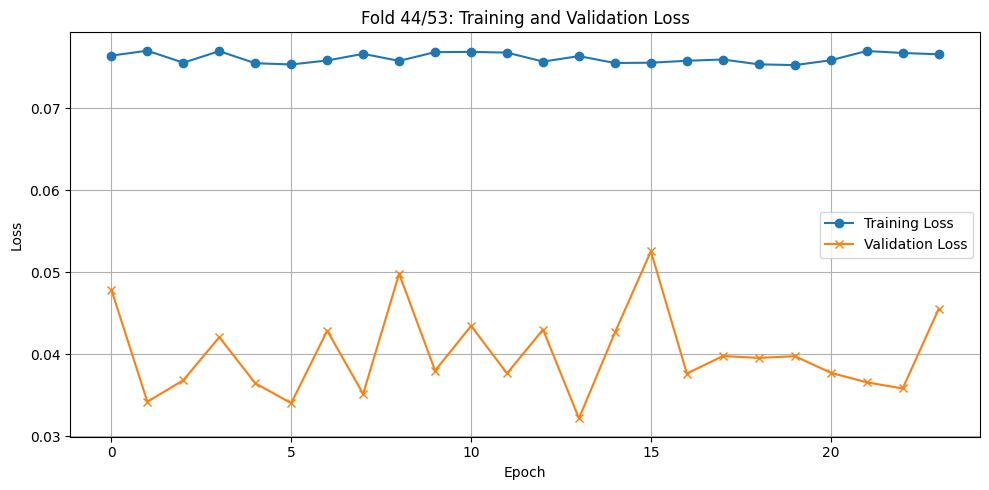


🔁 LOSO Fold 45/53: Đang huấn luyện trên 53 người, kiểm tra trên người thứ 45
Epoch 1/80 - Train Loss: 0.0768, Test Loss: 0.0590
EarlyStopping counter: 1 out of 10
Epoch 2/80 - Train Loss: 0.0757, Test Loss: 0.0602
EarlyStopping counter: 2 out of 10
Epoch 3/80 - Train Loss: 0.0753, Test Loss: 0.0640
EarlyStopping counter: 3 out of 10
Epoch 4/80 - Train Loss: 0.0762, Test Loss: 0.0619
EarlyStopping counter: 4 out of 10
Epoch 5/80 - Train Loss: 0.0761, Test Loss: 0.0624
EarlyStopping counter: 5 out of 10
Epoch 6/80 - Train Loss: 0.0759, Test Loss: 0.0631
EarlyStopping counter: 6 out of 10
Epoch 7/80 - Train Loss: 0.0757, Test Loss: 0.0627
EarlyStopping counter: 7 out of 10
Epoch 8/80 - Train Loss: 0.0758, Test Loss: 0.0594
EarlyStopping counter: 8 out of 10
Epoch 9/80 - Train Loss: 0.0748, Test Loss: 0.0617
EarlyStopping counter: 9 out of 10
Epoch 10/80 - Train Loss: 0.0759, Test Loss: 0.0610
EarlyStopping counter: 10 out of 10
Early stopping at epoch 11


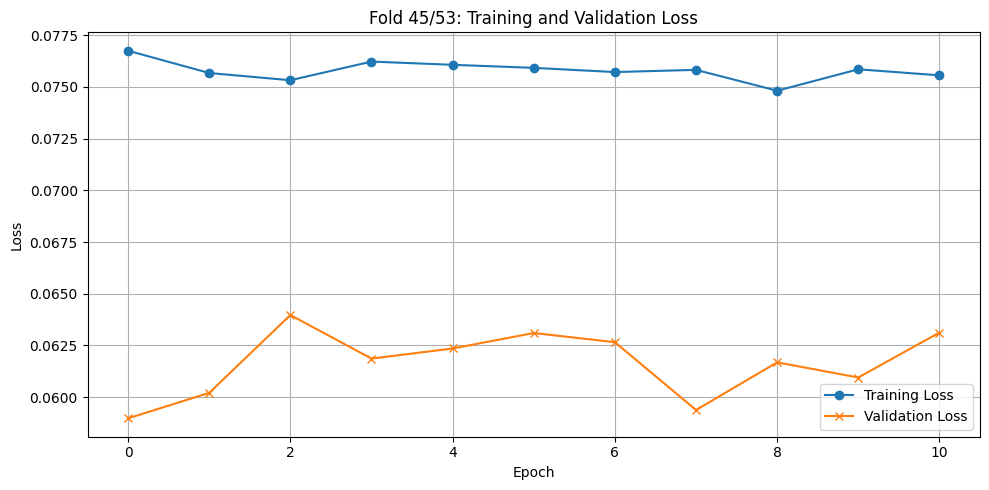


🔁 LOSO Fold 46/53: Đang huấn luyện trên 53 người, kiểm tra trên người thứ 46
Epoch 1/80 - Train Loss: 0.0748, Test Loss: 0.0647
Epoch 2/80 - Train Loss: 0.0755, Test Loss: 0.0643
Epoch 3/80 - Train Loss: 0.0754, Test Loss: 0.0613
EarlyStopping counter: 1 out of 10
Epoch 4/80 - Train Loss: 0.0751, Test Loss: 0.0658
Epoch 5/80 - Train Loss: 0.0752, Test Loss: 0.0612
EarlyStopping counter: 1 out of 10
Epoch 6/80 - Train Loss: 0.0748, Test Loss: 0.0653
EarlyStopping counter: 2 out of 10
Epoch 7/80 - Train Loss: 0.0751, Test Loss: 0.0681
EarlyStopping counter: 3 out of 10
Epoch 8/80 - Train Loss: 0.0746, Test Loss: 0.0672
EarlyStopping counter: 4 out of 10
Epoch 9/80 - Train Loss: 0.0759, Test Loss: 0.0704
EarlyStopping counter: 5 out of 10
Epoch 10/80 - Train Loss: 0.0753, Test Loss: 0.0674
EarlyStopping counter: 6 out of 10
Epoch 11/80 - Train Loss: 0.0747, Test Loss: 0.0707
EarlyStopping counter: 7 out of 10
Epoch 12/80 - Train Loss: 0.0750, Test Loss: 0.0719
EarlyStopping counter: 8 ou

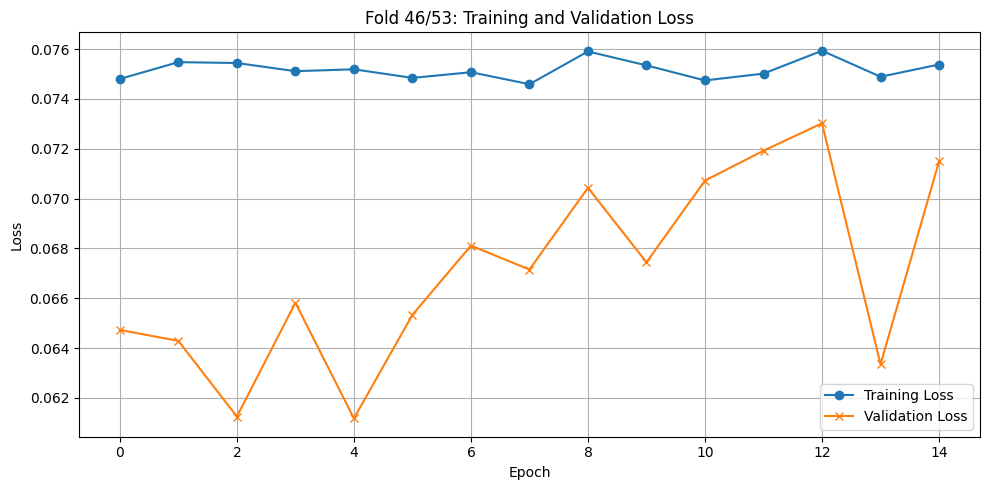


🔁 LOSO Fold 47/53: Đang huấn luyện trên 53 người, kiểm tra trên người thứ 47
Epoch 1/80 - Train Loss: 0.0756, Test Loss: 0.0394
Epoch 2/80 - Train Loss: 0.0753, Test Loss: 0.0382
EarlyStopping counter: 1 out of 10
Epoch 3/80 - Train Loss: 0.0755, Test Loss: 0.0417
EarlyStopping counter: 2 out of 10
Epoch 4/80 - Train Loss: 0.0756, Test Loss: 0.0418
EarlyStopping counter: 3 out of 10
Epoch 5/80 - Train Loss: 0.0756, Test Loss: 0.0431
EarlyStopping counter: 4 out of 10
Epoch 6/80 - Train Loss: 0.0746, Test Loss: 0.0400
EarlyStopping counter: 5 out of 10
Epoch 7/80 - Train Loss: 0.0759, Test Loss: 0.0430
EarlyStopping counter: 6 out of 10
Epoch 8/80 - Train Loss: 0.0763, Test Loss: 0.0414
EarlyStopping counter: 7 out of 10
Epoch 9/80 - Train Loss: 0.0755, Test Loss: 0.0440
EarlyStopping counter: 8 out of 10
Epoch 10/80 - Train Loss: 0.0756, Test Loss: 0.0423
EarlyStopping counter: 9 out of 10
Epoch 11/80 - Train Loss: 0.0750, Test Loss: 0.0456
EarlyStopping counter: 10 out of 10
Early st

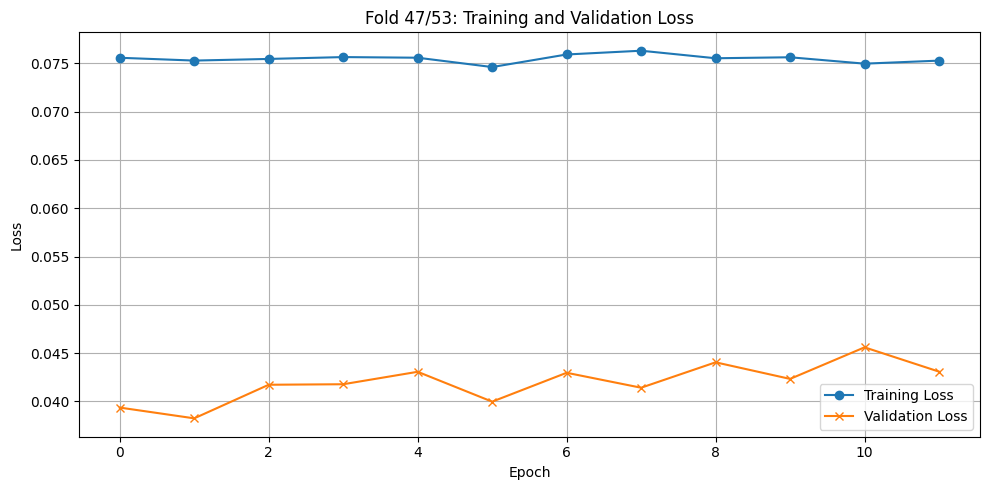


🔁 LOSO Fold 48/53: Đang huấn luyện trên 53 người, kiểm tra trên người thứ 48
Epoch 1/80 - Train Loss: 0.0753, Test Loss: 0.0522
Epoch 2/80 - Train Loss: 0.0758, Test Loss: 0.0483
EarlyStopping counter: 1 out of 10
Epoch 3/80 - Train Loss: 0.0749, Test Loss: 0.0495
EarlyStopping counter: 2 out of 10
Epoch 4/80 - Train Loss: 0.0757, Test Loss: 0.0513
EarlyStopping counter: 3 out of 10
Epoch 5/80 - Train Loss: 0.0755, Test Loss: 0.0508
EarlyStopping counter: 4 out of 10
Epoch 6/80 - Train Loss: 0.0755, Test Loss: 0.0505
EarlyStopping counter: 5 out of 10
Epoch 7/80 - Train Loss: 0.0757, Test Loss: 0.0504
EarlyStopping counter: 6 out of 10
Epoch 8/80 - Train Loss: 0.0753, Test Loss: 0.0582
EarlyStopping counter: 7 out of 10
Epoch 9/80 - Train Loss: 0.0750, Test Loss: 0.0518
EarlyStopping counter: 8 out of 10
Epoch 10/80 - Train Loss: 0.0750, Test Loss: 0.0525
EarlyStopping counter: 9 out of 10
Epoch 11/80 - Train Loss: 0.0755, Test Loss: 0.0524
EarlyStopping counter: 10 out of 10
Early st

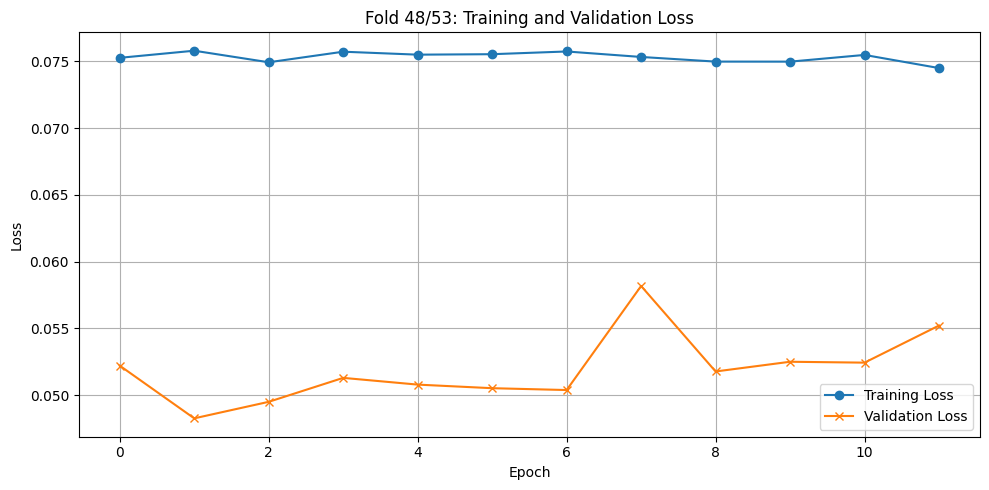


🔁 LOSO Fold 49/53: Đang huấn luyện trên 53 người, kiểm tra trên người thứ 49
Epoch 1/80 - Train Loss: 0.0753, Test Loss: 0.0752
EarlyStopping counter: 1 out of 10
Epoch 2/80 - Train Loss: 0.0750, Test Loss: 0.0767
EarlyStopping counter: 2 out of 10
Epoch 3/80 - Train Loss: 0.0752, Test Loss: 0.0775
EarlyStopping counter: 3 out of 10
Epoch 4/80 - Train Loss: 0.0750, Test Loss: 0.0846
EarlyStopping counter: 4 out of 10
Epoch 5/80 - Train Loss: 0.0750, Test Loss: 0.0861
EarlyStopping counter: 5 out of 10
Epoch 6/80 - Train Loss: 0.0740, Test Loss: 0.0840
EarlyStopping counter: 6 out of 10
Epoch 7/80 - Train Loss: 0.0746, Test Loss: 0.0837
EarlyStopping counter: 7 out of 10
Epoch 8/80 - Train Loss: 0.0749, Test Loss: 0.0830
EarlyStopping counter: 8 out of 10
Epoch 9/80 - Train Loss: 0.0752, Test Loss: 0.0855
EarlyStopping counter: 9 out of 10
Epoch 10/80 - Train Loss: 0.0741, Test Loss: 0.0851
EarlyStopping counter: 10 out of 10
Early stopping at epoch 11


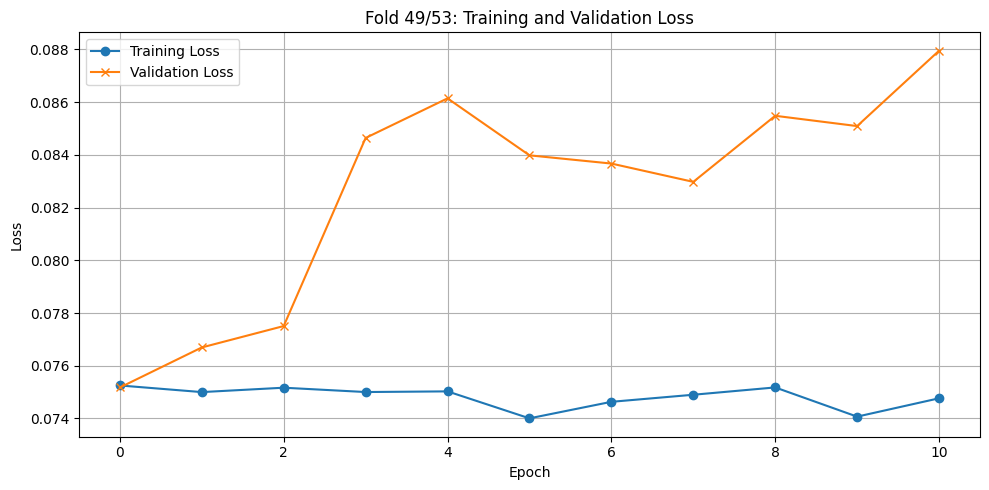


🔁 LOSO Fold 50/53: Đang huấn luyện trên 53 người, kiểm tra trên người thứ 50
Epoch 1/80 - Train Loss: 0.0758, Test Loss: 0.0294
EarlyStopping counter: 1 out of 10
Epoch 2/80 - Train Loss: 0.0757, Test Loss: 0.0295
Epoch 3/80 - Train Loss: 0.0767, Test Loss: 0.0291
Epoch 4/80 - Train Loss: 0.0758, Test Loss: 0.0286
EarlyStopping counter: 1 out of 10
Epoch 5/80 - Train Loss: 0.0758, Test Loss: 0.0292
EarlyStopping counter: 2 out of 10
Epoch 6/80 - Train Loss: 0.0761, Test Loss: 0.0319
EarlyStopping counter: 3 out of 10
Epoch 7/80 - Train Loss: 0.0756, Test Loss: 0.0343
EarlyStopping counter: 4 out of 10
Epoch 8/80 - Train Loss: 0.0756, Test Loss: 0.0325
EarlyStopping counter: 5 out of 10
Epoch 9/80 - Train Loss: 0.0757, Test Loss: 0.0301
EarlyStopping counter: 6 out of 10
Epoch 10/80 - Train Loss: 0.0754, Test Loss: 0.0318
EarlyStopping counter: 7 out of 10
Epoch 11/80 - Train Loss: 0.0759, Test Loss: 0.0318
EarlyStopping counter: 8 out of 10
Epoch 12/80 - Train Loss: 0.0752, Test Loss:

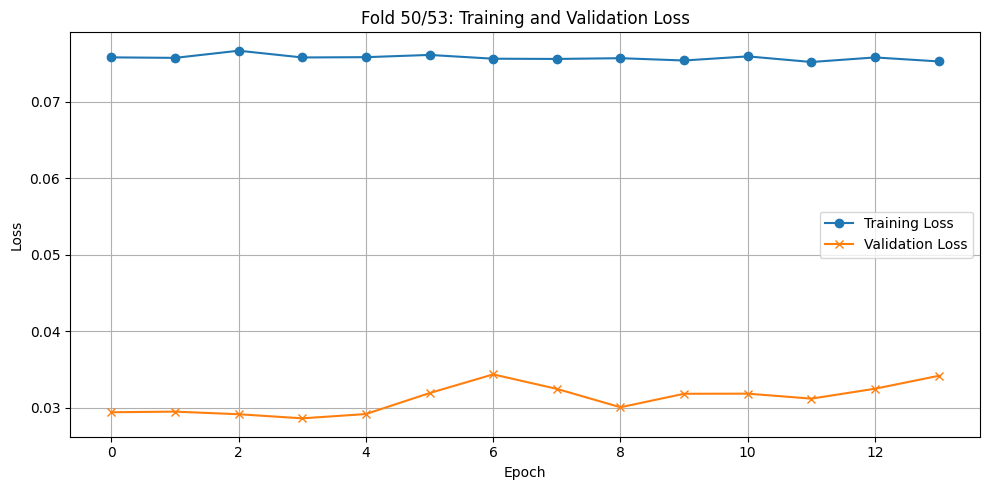


🔁 LOSO Fold 51/53: Đang huấn luyện trên 53 người, kiểm tra trên người thứ 51
Epoch 1/80 - Train Loss: 0.0744, Test Loss: 0.0859
EarlyStopping counter: 1 out of 10
Epoch 2/80 - Train Loss: 0.0746, Test Loss: 0.0876
EarlyStopping counter: 2 out of 10
Epoch 3/80 - Train Loss: 0.0740, Test Loss: 0.0866
EarlyStopping counter: 3 out of 10
Epoch 4/80 - Train Loss: 0.0744, Test Loss: 0.0882
EarlyStopping counter: 4 out of 10
Epoch 5/80 - Train Loss: 0.0745, Test Loss: 0.0934
EarlyStopping counter: 5 out of 10
Epoch 6/80 - Train Loss: 0.0751, Test Loss: 0.0897
Epoch 7/80 - Train Loss: 0.0752, Test Loss: 0.0851
EarlyStopping counter: 1 out of 10
Epoch 8/80 - Train Loss: 0.0750, Test Loss: 0.0934
EarlyStopping counter: 2 out of 10
Epoch 9/80 - Train Loss: 0.0745, Test Loss: 0.0885
EarlyStopping counter: 3 out of 10
Epoch 10/80 - Train Loss: 0.0748, Test Loss: 0.1033
EarlyStopping counter: 4 out of 10
Epoch 11/80 - Train Loss: 0.0739, Test Loss: 0.0925
EarlyStopping counter: 5 out of 10
Epoch 12/

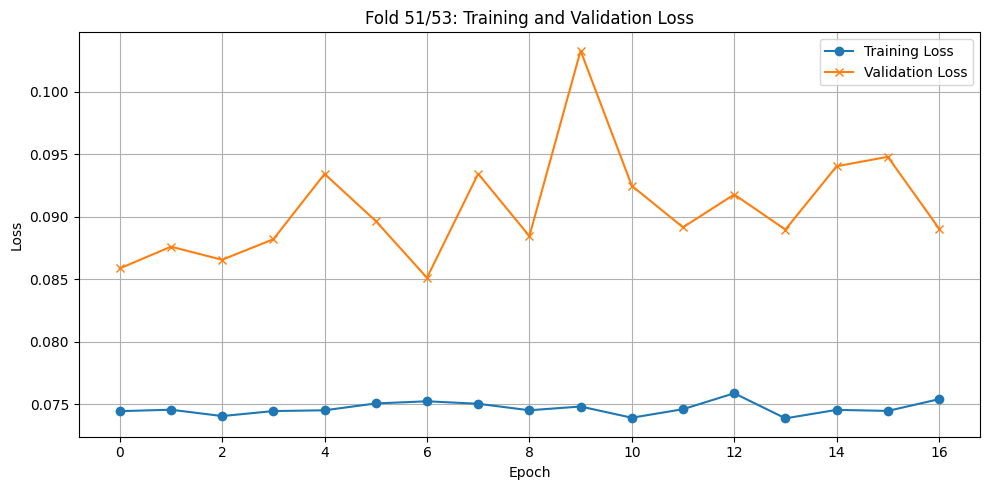


🔁 LOSO Fold 52/53: Đang huấn luyện trên 53 người, kiểm tra trên người thứ 52
Epoch 1/80 - Train Loss: 0.0747, Test Loss: 0.1005
EarlyStopping counter: 1 out of 10
Epoch 2/80 - Train Loss: 0.0744, Test Loss: 0.1009
Epoch 3/80 - Train Loss: 0.0738, Test Loss: 0.1002
Epoch 4/80 - Train Loss: 0.0741, Test Loss: 0.0998
EarlyStopping counter: 1 out of 10
Epoch 5/80 - Train Loss: 0.0741, Test Loss: 0.1025
EarlyStopping counter: 2 out of 10
Epoch 6/80 - Train Loss: 0.0749, Test Loss: 0.1006
EarlyStopping counter: 3 out of 10
Epoch 7/80 - Train Loss: 0.0740, Test Loss: 0.1001
EarlyStopping counter: 4 out of 10
Epoch 8/80 - Train Loss: 0.0742, Test Loss: 0.1043
EarlyStopping counter: 5 out of 10
Epoch 9/80 - Train Loss: 0.0740, Test Loss: 0.1017
EarlyStopping counter: 6 out of 10
Epoch 10/80 - Train Loss: 0.0745, Test Loss: 0.1033
EarlyStopping counter: 7 out of 10
Epoch 11/80 - Train Loss: 0.0740, Test Loss: 0.1052
EarlyStopping counter: 8 out of 10
Epoch 12/80 - Train Loss: 0.0736, Test Loss:

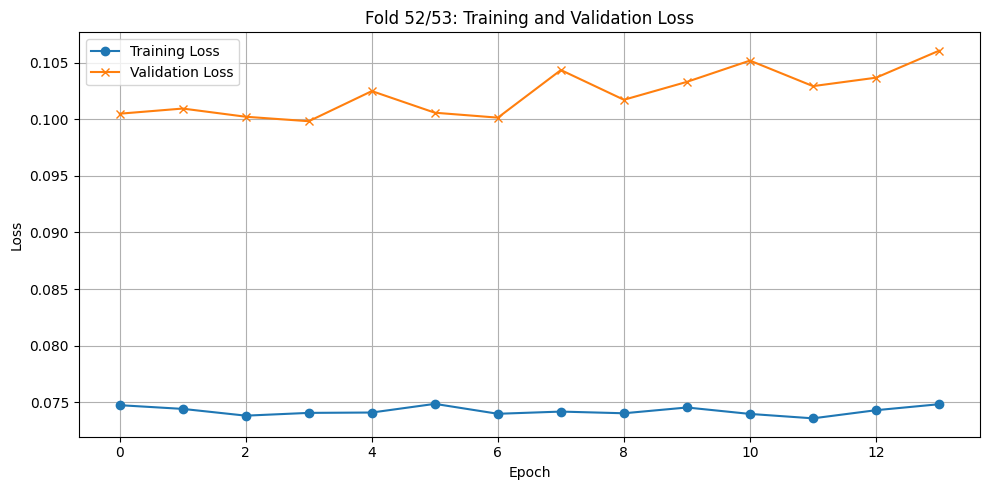


🔁 LOSO Fold 53/53: Đang huấn luyện trên 53 người, kiểm tra trên người thứ 53
Epoch 1/80 - Train Loss: 0.0750, Test Loss: 0.0724
EarlyStopping counter: 1 out of 10
Epoch 2/80 - Train Loss: 0.0751, Test Loss: 0.0791
Epoch 3/80 - Train Loss: 0.0750, Test Loss: 0.0681
EarlyStopping counter: 1 out of 10
Epoch 4/80 - Train Loss: 0.0752, Test Loss: 0.0849
EarlyStopping counter: 2 out of 10
Epoch 5/80 - Train Loss: 0.0747, Test Loss: 0.0775
EarlyStopping counter: 3 out of 10
Epoch 6/80 - Train Loss: 0.0751, Test Loss: 0.0722
EarlyStopping counter: 4 out of 10
Epoch 7/80 - Train Loss: 0.0746, Test Loss: 0.0687
EarlyStopping counter: 5 out of 10
Epoch 8/80 - Train Loss: 0.0743, Test Loss: 0.0779
EarlyStopping counter: 6 out of 10
Epoch 9/80 - Train Loss: 0.0751, Test Loss: 0.0898
EarlyStopping counter: 7 out of 10
Epoch 10/80 - Train Loss: 0.0747, Test Loss: 0.0759
EarlyStopping counter: 8 out of 10
Epoch 11/80 - Train Loss: 0.0748, Test Loss: 0.0755
EarlyStopping counter: 9 out of 10
Epoch 12/

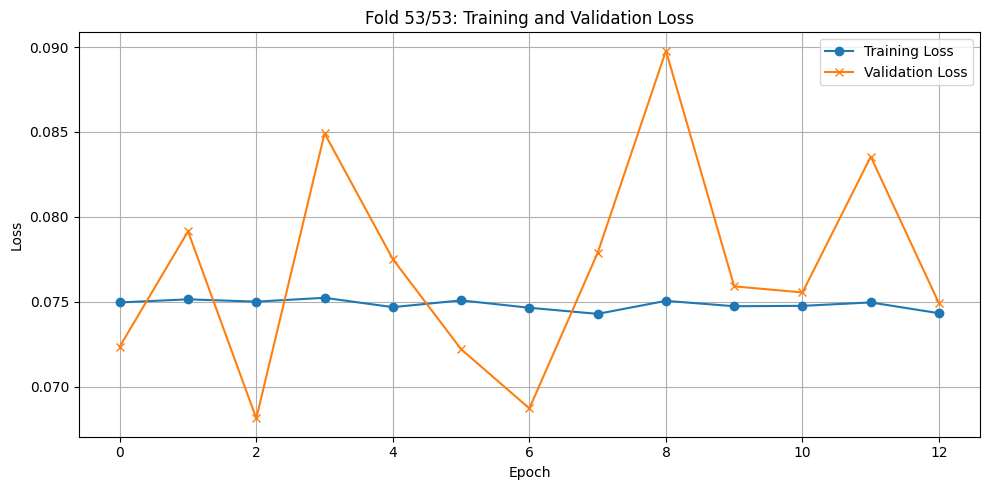

In [ ]:
models = train_loso(
    subjects_data=precoss,
    model=model,
    criterion=criterion,
    optimizer=optimizer)

In [ ]:
# Sử dụng cho lần thực hiện đầu tiên (kiểm tra trên đối tượng 0)
train_ppg, train_capno, test_ppg, test_capno = leave_one_subject_out(precoss, 0)
train_loader,test_loader = create_dataloader(train_ppg,test_ppg,train_capno,test_capno)

In [ ]:
import torch

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

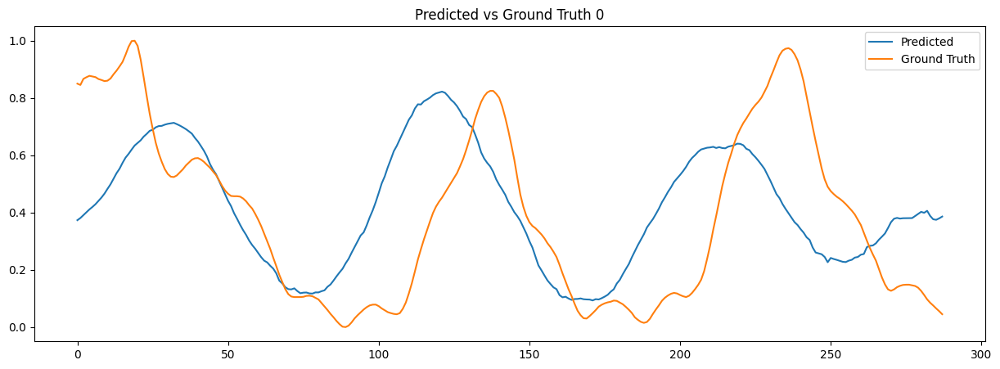

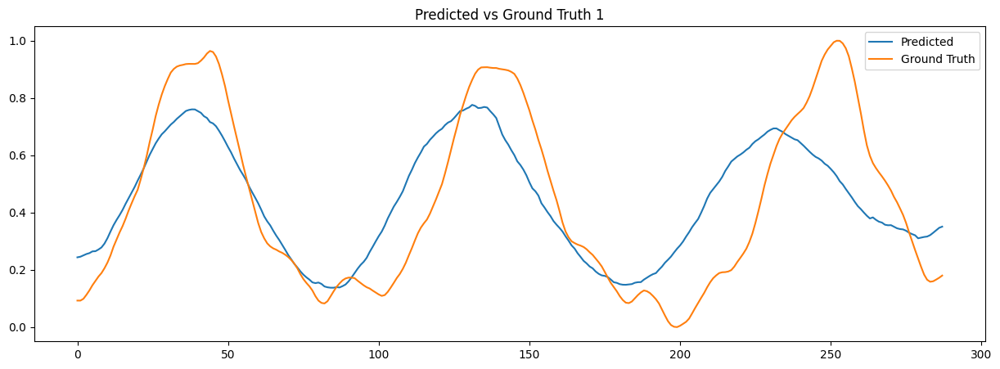

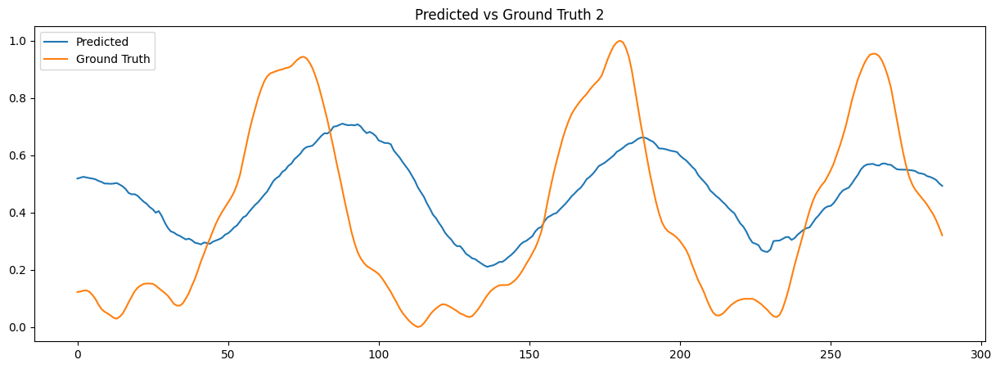

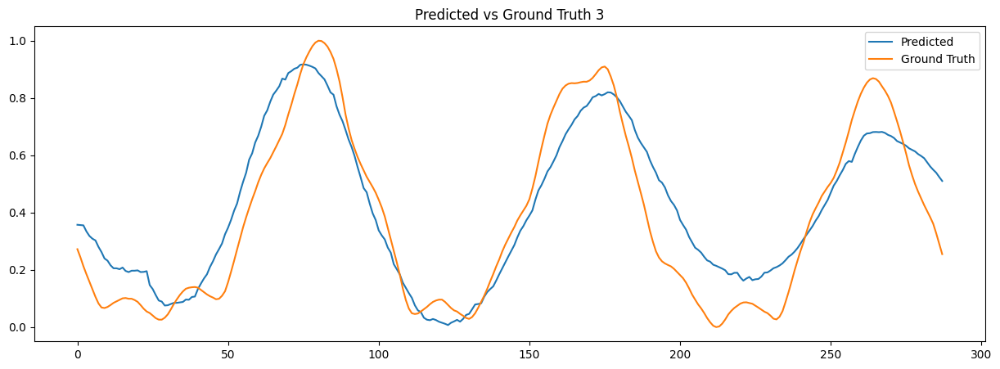

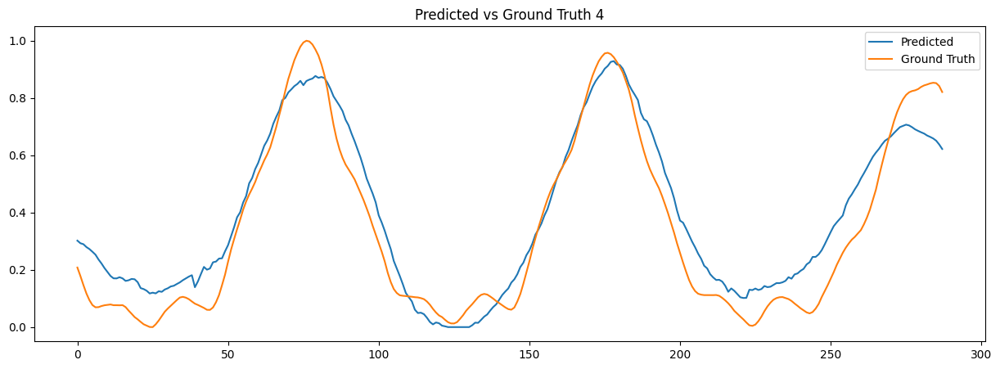

...

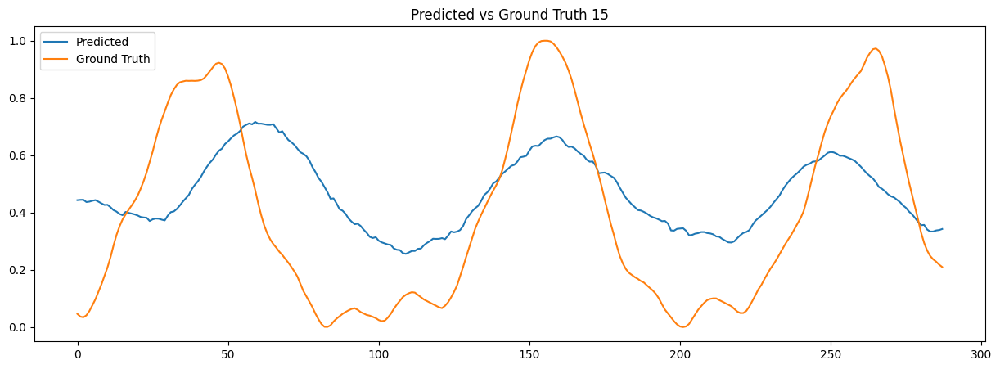

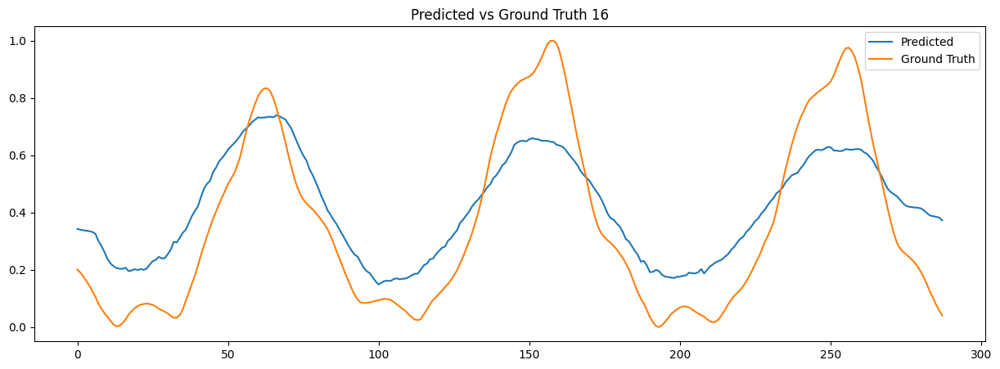

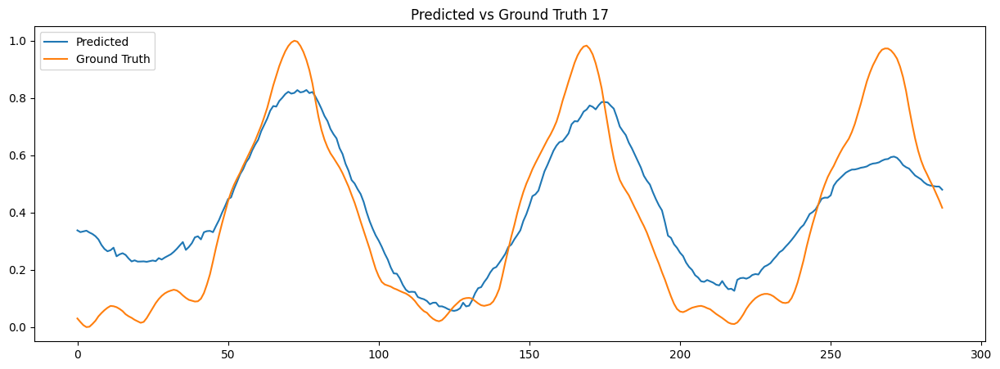

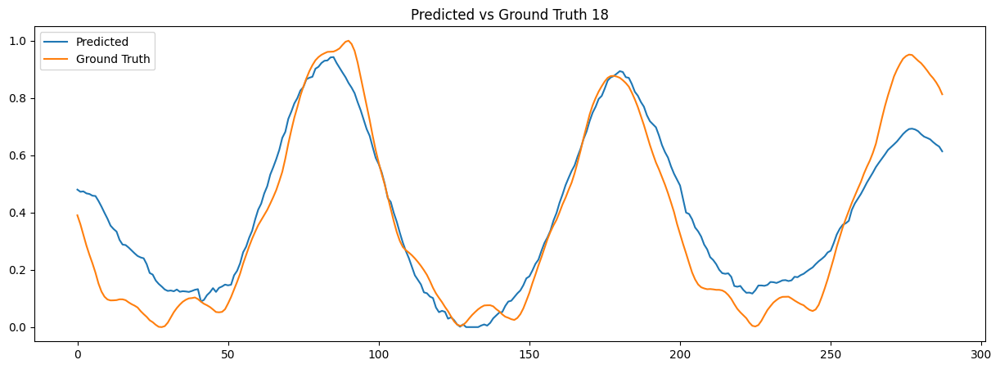

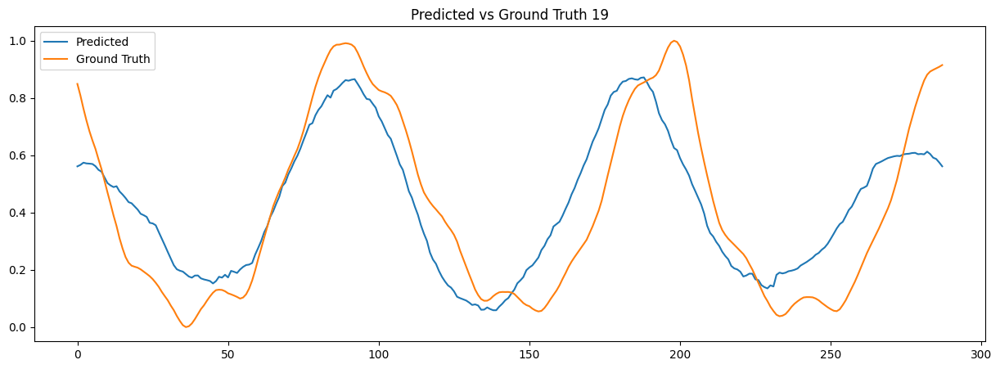

In [ ]:
models.eval()
ppg_batch, capno_batch = next(iter(test_loader))
with torch.no_grad():
  outputs = models(ppg_batch.to(device))
  for i in range(20):
    plt.figure(figsize=(15,5))
    plt.plot(outputs[i].cpu().numpy(), label='Predicted')
    plt.plot(capno_batch[i].numpy(), label='Ground Truth')
    plt.title(f"Predicted vs Ground Truth {i}")
    plt.legend()
  plt.show()

In [ ]:
model_path_bidmc = os.path.join(model_path, 'preprocessing')
# Tạo thư mục nếu chưa tồn tại
os.makedirs(model_path_bidmc, exist_ok=True)

In [ ]:
torch.save(models.state_dict(), f"{model_path_bidmc}/corr_encoder_model_bidmc.pth")

- Đánh giá

In [ ]:
model_Retrained = CorrEncoder()
model_Retrained = model_Retrained.to(device)
model_Retrained.load_state_dict(torch.load(f"{model_path_bidmc}/corr_encoder_model_bidmc.pth", map_location=torch.device('cpu')))
model_Retrained.eval()

CorrEncoder(
  (encoder): Sequential(
    (0): Conv1d(1, 8, kernel_size=(150,), stride=(1,), padding=(20,))
    (1): ReLU()
    (2): Dropout(p=0.5, inplace=False)
    (3): Conv1d(8, 8, kernel_size=(75,), stride=(1,), padding=(10,))
    (4): ReLU()
    (5): Dropout(p=0.5, inplace=False)
    (6): Conv1d(8, 8, kernel_size=(50,), stride=(1,))
    (7): Sigmoid()
    (8): Dropout(p=0.5, inplace=False)
  )
  (decoder): Sequential(
    (0): ConvTranspose1d(8, 8, kernel_size=(50,), stride=(1,))
    (1): Sigmoid()
    (2): ConvTranspose1d(8, 8, kernel_size=(75,), stride=(1,), padding=(10,))
    (3): ReLU()
    (4): ConvTranspose1d(8, 1, kernel_size=(150,), stride=(1,), padding=(20,))
    (5): ReLU()
  )
)

In [ ]:
train_ppg, train_capno, test_ppg, test_capno = leave_one_subject_out(precoss, 0)
train_loader, test_loader0 = create_dataloader(train_ppg, test_ppg, train_capno, test_capno)

In [ ]:
from torch.utils.data import ConcatDataset, DataLoader

# Bước 1: Trích dataset từ mỗi test_loader
dataset0 = test_loader0.dataset
dataset1 = train_loader.dataset

# Bước 2: Kết hợp lại bằng ConcatDataset
combined_dataset = ConcatDataset([dataset0, dataset1])

# Bước 3: Tạo lại DataLoader
combined_test_loader = DataLoader(combined_dataset, batch_size=32, shuffle=False)

In [ ]:
model_Retrained.eval()
predicted_rrs = []
reference_rrs = []

In [ ]:
with torch.no_grad():
    for ppg_batch, capno_batch in combined_test_loader:
        ppg_batch, capno_batch = ppg_batch.to(device), capno_batch.to(device)

        # Forward pass
        outputs = model_Retrained(ppg_batch)

        # Chuyển về numpy
        outputs_np = outputs.cpu().numpy()
        capno_np = capno_batch.cpu().numpy()

        # Tính tần số hô hấp cho từng mẫu
        for i in range(outputs_np.shape[0]):
            # Tần số hô hấp từ dạng sóng dự đoán
            pred_rr = estimate_respiratory_rate(outputs_np[i])
            predicted_rrs.append(pred_rr)

            # Tần số hô hấp từ capnography tham chiếu
            ref_rr = estimate_respiratory_rate(capno_np[i])
            reference_rrs.append(ref_rr)

In [ ]:
# Tính sai số tuyệt đối cho tần số hô hấp
rr_errors = np.abs(np.array(predicted_rrs) - np.array(reference_rrs))

# Tính mAE (median Absolute Error) - sai số tuyệt đối trung vị trên tất cả các cửa sổ
mae_rr_bidmc = np.median(rr_errors)

In [ ]:
subject_mae = {}
for i in range(len(precoss)):
  subject_id = precoss[i]["id"]
  with torch.no_grad():
    ppg_tensor = torch.tensor(precoss[i]["ppg_segments"], dtype=torch.float32).to(device)
    outputs = model_Retrained(ppg_tensor)
    outputs_np = outputs.cpu().numpy()
    capno_np = precoss[i]["capno_segments"]
    reference_rrs1 = []
    predicted_rrs1 = []
    # Tính tần số hô hấp cho từng mẫu
    for j in range(outputs_np.shape[0]):
        pred_rr = estimate_respiratory_rate(outputs_np[j])  # Dùng j thay vì i
        predicted_rrs1.append(pred_rr)
        ref_rr = estimate_respiratory_rate(capno_np[j])
        reference_rrs1.append(ref_rr)
    # Tính sai số tuyệt đối
    rr_errors = np.abs(np.array(predicted_rrs1) - np.array(reference_rrs1))
    # Kiểm tra và khởi tạo subject_id trong subject_mae nếu chưa có
    if subject_id not in subject_mae:
        subject_mae[subject_id] = []
    # Thêm sai số cho từng mẫu
    subject_mae[subject_id].append(rr_errors)


In [ ]:
# Tính MAE trung bình cho mỗi đối tượng
subject_mean_mae = [np.mean(errors) for errors in subject_mae.values()]
# Tính trung vị của các MAE trung bình
mmae_rr_bidmc = np.median(subject_mean_mae)

In [ ]:
print(f"Subject mean mae:")
for index,item in enumerate(subject_mean_mae):
  print(f"Subject {index} : {item}")

Subject mean mae:
Subject 0 : 1.072265625
Subject 1 : 0.94921875
Subject 2 : 1.3359375
Subject 3 : 1.142578125
Subject 4 : 1.96875
Subject 5 : 2.513671875
Subject 6 : 1.775390625
Subject 7 : 2.109375
Subject 8 : 1.1953125
Subject 9 : 2.109375
Subject 10 : 2.0390625
Subject 11 : 2.49609375
Subject 12 : 1.6171875
Subject 13 : 0.826171875
Subject 14 : 2.63671875
Subject 15 : 3.7265625
Subject 16 : 4.78125
Subject 17 : 2.00390625
Subject 18 : 1.388671875
Subject 19 : 1.353515625
Subject 20 : 1.423828125
Subject 21 : 5.23828125
Subject 22 : 2.390625
Subject 23 : 0.52734375
Subject 24 : 4.833984375
Subject 25 : 3.251953125
Subject 26 : 0.826171875
Subject 27 : 1.248046875
Subject 28 : 1.93359375
Subject 29 : 1.828125
Subject 30 : 3.181640625
Subject 31 : 2.267578125
Subject 32 : 2.91796875
Subject 33 : 2.109375
Subject 34 : 5.09765625
Subject 35 : 3.515625
Subject 36 : 1.634765625
Subject 37 : 2.724609375
Subject 38 : 1.353515625
Subject 39 : 3.673828125
Subject 40 : 1.283203125
Subject 41 :

In [ ]:
print(f"Respiratory Rate Estimation Results:")
print(f"Median Absolute Error (mAE): {mae_rr_bidmc:.2f} bpm")
print(f"Median Mean Absolute Error (mMAE): {mmae_rr_bidmc:.2f} bpm")

Respiratory Rate Estimation Results:
Median Absolute Error (mAE): 0.88 bpm
Median Mean Absolute Error (mMAE): 1.97 bpm


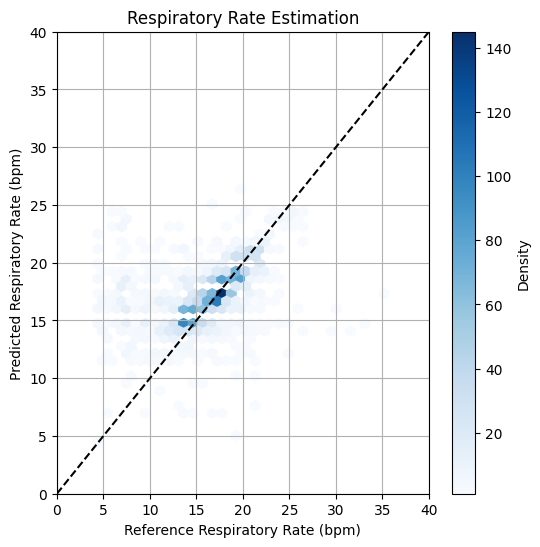

In [ ]:
plt.figure(figsize=(6, 6))

# Vẽ biểu đồ hexbin để thể hiện mật độ
plt.hexbin(reference_rrs, predicted_rrs, gridsize=30,  cmap='Blues', mincnt=1)

# Đường y = x
plt.plot([0, 40], [0, 40], 'k--')

plt.xlabel('Reference Respiratory Rate (bpm)')
plt.ylabel('Predicted Respiratory Rate (bpm)')
plt.grid(True)
plt.title('Respiratory Rate Estimation')
plt.colorbar(label='Density')
plt.xlim(0, 40)
plt.ylim(0, 40)
plt.show()


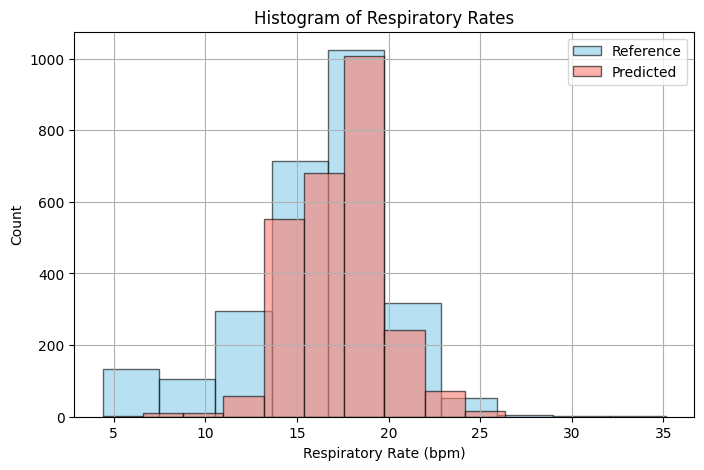

In [ ]:
plt.figure(figsize=(8, 5))

# Histogram của Reference và Predicted
plt.hist(reference_rrs, bins=10, alpha=0.6, label='Reference', color='skyblue', edgecolor='black')
plt.hist(predicted_rrs, bins=10, alpha=0.6, label='Predicted', color='salmon', edgecolor='black')

plt.xlabel('Respiratory Rate (bpm)')
plt.ylabel('Count')
plt.title('Histogram of Respiratory Rates')
plt.legend()
plt.grid(True)
plt.show()


- So sánh

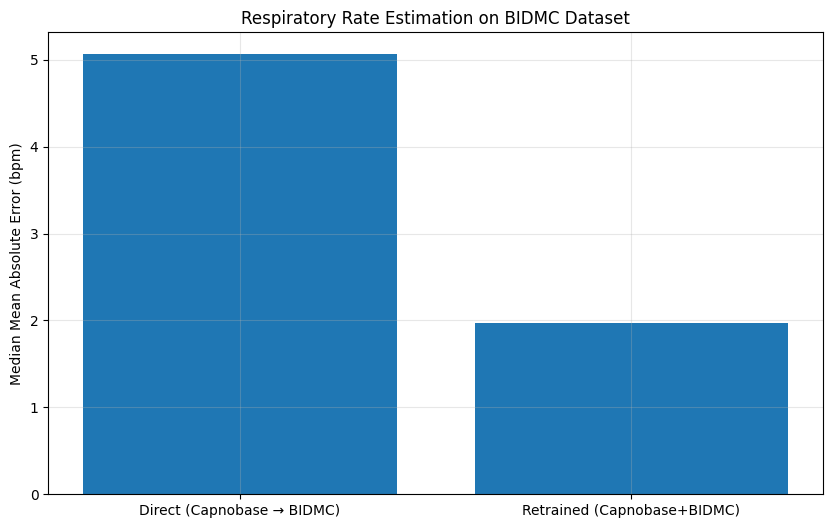

In [ ]:
methods = ['Direct (Capnobase → BIDMC)', 'Retrained (Capnobase+BIDMC)']
mae_values = [mmae_rr, mmae_rr_bidmc]
plt.figure(figsize=(10, 6))
plt.bar(methods, mae_values)
plt.ylabel('Median Mean Absolute Error (bpm)')
plt.title('Respiratory Rate Estimation on BIDMC Dataset')
plt.grid(True, alpha=0.3)
plt.show()

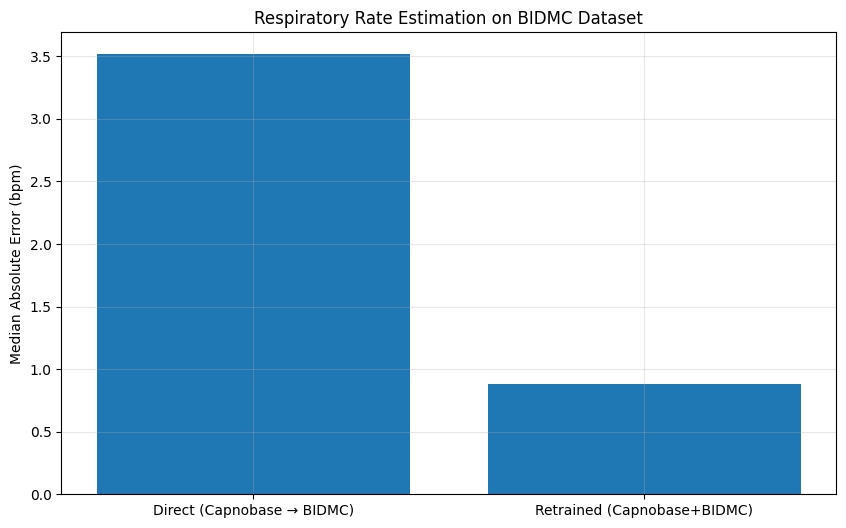

In [ ]:
methods = ['Direct (Capnobase → BIDMC)', 'Retrained (Capnobase+BIDMC)']
mae_values = [mae_rr, mae_rr_bidmc]
plt.figure(figsize=(10, 6))
plt.bar(methods, mae_values)
plt.ylabel('Median Absolute Error (bpm)')
plt.title('Respiratory Rate Estimation on BIDMC Dataset')
plt.grid(True, alpha=0.3)
plt.show()

### Phần 5: Phân tích khả năng giải thích của mô hình

#### 5.1 Trích xuất và phân tích trọng số nhân (kernel weights)

In [ ]:
model = CorrEncoder().to(device)
model.load_state_dict(torch.load(f"{model_path_9_6}/corr_encoder_model.pth", map_location=torch.device('cpu')))
model.eval()

CorrEncoder(
  (encoder): Sequential(
    (0): Conv1d(1, 8, kernel_size=(150,), stride=(1,), padding=(20,))
    (1): ReLU()
    (2): Dropout(p=0.5, inplace=False)
    (3): Conv1d(8, 8, kernel_size=(75,), stride=(1,), padding=(10,))
    (4): ReLU()
    (5): Dropout(p=0.5, inplace=False)
    (6): Conv1d(8, 8, kernel_size=(50,), stride=(1,))
    (7): Sigmoid()
    (8): Dropout(p=0.5, inplace=False)
  )
  (decoder): Sequential(
    (0): ConvTranspose1d(8, 8, kernel_size=(50,), stride=(1,))
    (1): Sigmoid()
    (2): ConvTranspose1d(8, 8, kernel_size=(75,), stride=(1,), padding=(10,))
    (3): ReLU()
    (4): ConvTranspose1d(8, 1, kernel_size=(150,), stride=(1,), padding=(20,))
    (5): ReLU()
  )
)

In [ ]:
#load data
import pickle

with open(f'{preprocess}/precoss_9_6.pkl', 'rb') as f:
    precoss = pickle.load(f)
    print('Load success!')

Load success!


In [ ]:
train_ppg, train_capno, test_ppg, test_capno = leave_one_subject_out(precoss, 0)

In [ ]:
ppg = np.concatenate((train_ppg, test_ppg), axis=0)
capno = np.concatenate((train_capno, test_capno), axis=0)

In [ ]:
model.eval()
encoder_weights = model.encoder[0].weight.data.cpu().numpy()

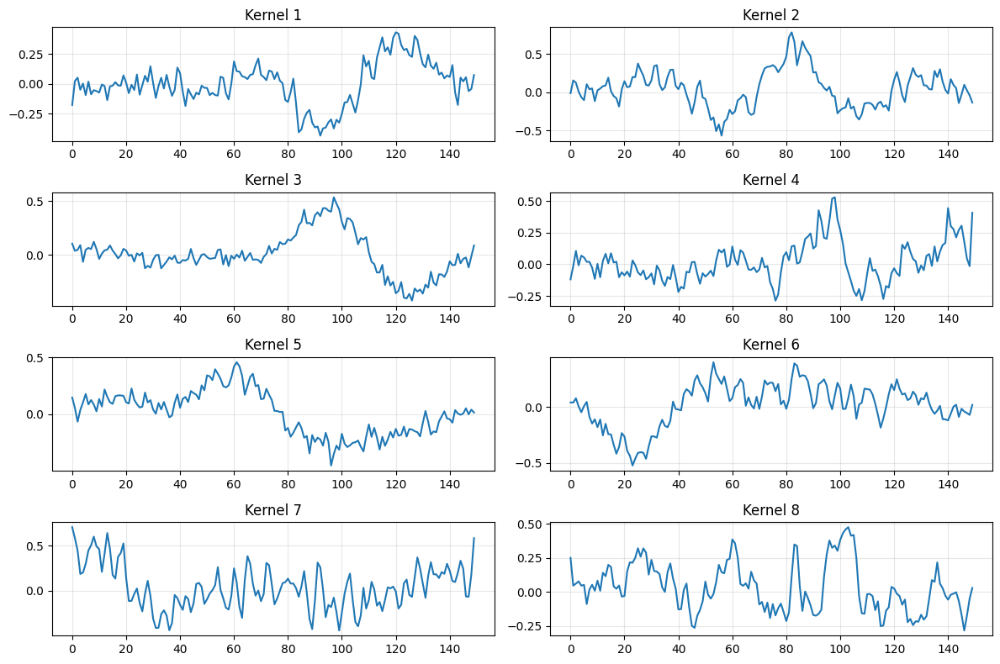

In [ ]:
# Trực quan hóa trọng số của các nhân
plt.figure(figsize=(12, 8))
for i in range(8):  # 8 nhân
    plt.subplot(4, 2, i+1)
    plt.plot(encoder_weights[i, 0, :])
    plt.title(f'Kernel {i+1}')
    plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

In [ ]:
# Phân tích mối quan hệ với tần số hô hấp
# Hàm thực hiện tích chập và trích xuất giá trị tối đa
def extract_max_activation(kernel, input_signal):
    """Tính giá trị kích hoạt tối đa của nhân đối với tín hiệu đầu vào"""
    # Reshape kernel để phù hợp với tích chập 1D
    kernel = kernel.reshape(1, 1, -1)

    # Chuyển đổi sang tensor
    kernel_tensor = torch.from_numpy(kernel).float()
    input_tensor = torch.from_numpy(input_signal).float().view(1, 1, -1)

    # Thực hiện tích chập
    conv = nn.Conv1d(1, 1, kernel_size=kernel.shape[2], padding=20)
    with torch.no_grad():
        conv.weight.data = kernel_tensor
        conv.bias.data.zero_()
        activation = conv(input_tensor)

    # Trích xuất giá trị kích hoạt tối đa
    max_activation = torch.max(activation).item()

    return max_activation

In [ ]:
# Dictionary lưu RR tương ứng với mỗi kernel ở layer 1
kernel_rr_mapping = {i: [] for i in range(8)}

for i, (ppg, capno) in enumerate(zip(ppg, capno)):
    # Ước tính tần số hô hấp
    rr = estimate_respiratory_rate(capno)

    # Chuẩn bị input tensor
    input_tensor = torch.tensor(ppg, dtype=torch.float32).view(1, 1, -1).to(device)

    # Forward qua toàn bộ encoder
    with torch.no_grad():
        x = input_tensor
        activations = []  # lưu output từng layer nếu muốn
        for layer in model.encoder:
            x = layer(x)
            activations.append(x)

    # Lấy latent space cuối cùng (output encoder cuối)
    latent = activations[-1]  # shape: [1, C, T]
    max_val = torch.max(latent)
    max_idx = torch.argmax(latent)

    # max_idx là chỉ số theo [C, T], cần lấy chỉ số kênh C (kernel)
    max_idx = max_idx.item()
    C = latent.shape[1]
    best_kernel = max_idx // latent.shape[2]  # Lấy index theo kênh đầu ra (tức là kernel layer 1)

    # Lưu RR vào kernel đó
    kernel_rr_mapping[best_kernel].append(rr)


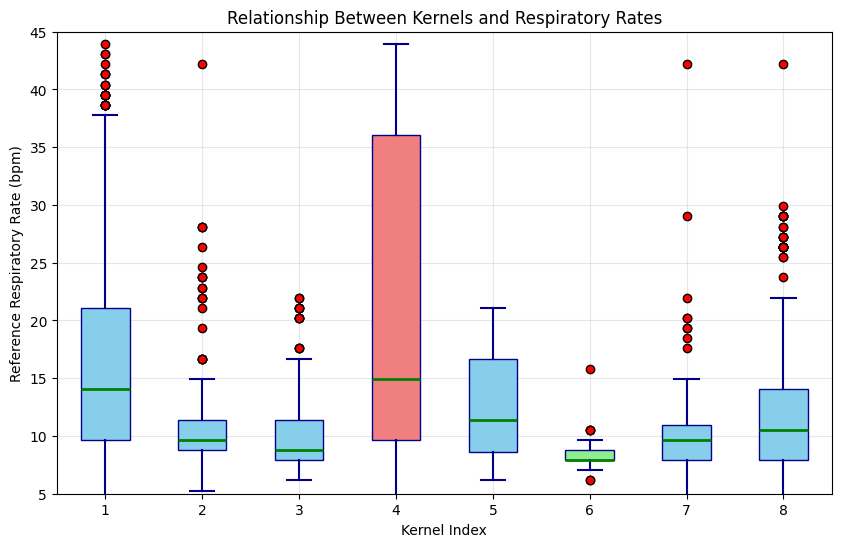

In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))

# Create the boxplot with specific colors
boxplot_data = [kernel_rr_mapping[i] for i in range(8)]
box = plt.boxplot(boxplot_data, patch_artist=True,
                  boxprops=dict(facecolor='skyblue', color='darkblue'),
                  whiskerprops=dict(color='darkblue', linewidth=1.5),
                  capprops=dict(color='darkblue', linewidth=1.5),
                  flierprops=dict(markerfacecolor='red', marker='o', markersize=6, linestyle='none'),
                  medianprops=dict(color='green', linewidth=2))

for i in range(8):
    if i == 5:  # Kernel 6 is colored green
        box['boxes'][i].set_facecolor('lightgreen')
    elif i == 3:  # Kernel 4 is colored red
        box['boxes'][i].set_facecolor('lightcoral')
# Set the labels and title
plt.xlabel('Kernel Index')
plt.ylabel('Reference Respiratory Rate (bpm)')
plt.title('Relationship Between Kernels and Respiratory Rates')

# Set y-scale and range
plt.yscale('linear')  # or 'log' if there are significant differences
plt.ylim(5, 45)       # Adjust range based on your data

# Add grid
plt.grid(True, alpha=0.3)

# Show plot
plt.show()


#### 5.2 Tìm hiểu cơ chế phân biệt tần số của mô hình

In [ ]:
# Tạo các tín hiệu PPG tổng hợp với tần số hô hấp khác nhau
def generate_synthetic_ppg(respiratory_rate, duration=9.6, fs=30):
    """
    Tạo tín hiệu PPG tổng hợp với biến đổi hô hấp ở tần số cụ thể

    Tham số:
    - respiratory_rate: Tần số hô hấp (nhịp thở/phút)
    - duration: Thời gian (giây)
    - fs: Tần số lấy mẫu (Hz)

    Trả về:
    - ppg_signal: Tín hiệu PPG tổng hợp
    """
    # Chuyển đổi từ nhịp thở/phút sang Hz
    freq_hz = respiratory_rate / 60.0

    # Tạo thời gian
    t = np.arange(0, duration, 1/fs)

    # Tạo xung nhịp tim (1 Hz ~ 60 bpm)
    cardiac_component = 0.5 * np.sin(2 * np.pi * 1.0 * t)

    # Tạo thành phần hô hấp
    respiratory_component = 0.2 * np.sin(2 * np.pi * freq_hz * t)

    # Kết hợp thành tín hiệu PPG
    ppg_signal = cardiac_component * (1 + respiratory_component)

    # Chuẩn hóa
    ppg_signal = (ppg_signal - np.min(ppg_signal)) / (np.max(ppg_signal) - np.min(ppg_signal)) * 2 - 1

    return ppg_signal

In [ ]:
# Tạo các tín hiệu với tần số hô hấp khác nhau
test_rates = [10, 15, 20, 25, 30, 35, 40]
synthetic_ppgs = []

for rate in test_rates:
    synthetic_ppg = generate_synthetic_ppg(rate)
    synthetic_ppgs.append(synthetic_ppg)

In [ ]:
# Chuyển sang tensor
synthetic_ppgs_tensor = torch.tensor(synthetic_ppgs).float().to(device)

<ipython-input-47-038e6d5b748f>:2: UserWarning: Creating a tensor from a list of numpy.ndarrays is extremely slow. Please consider converting the list to a single numpy.ndarray with numpy.array() before converting to a tensor. (Triggered internally at /pytorch/torch/csrc/utils/tensor_new.cpp:254.)
  synthetic_ppgs_tensor = torch.tensor(synthetic_ppgs).float().to(device)


In [ ]:
# Đánh giá kích hoạt của từng nhân
model.eval()
encoder = model.encoder[0]  # Lấy lớp tích chập đầu tiên

In [ ]:
# Hàm tính kích hoạt từng nhân
def get_kernel_activations(encoder, inputs):
    # Thực hiện tích chập
    with torch.no_grad():
        # Reshape đầu vào
        inputs = inputs.view(inputs.size(0), 1, -1)
        # Tính kích hoạt
        activations = encoder(inputs)

    # Chuyển về numpy
    activations_np = activations.cpu().numpy()

    # Tính giá trị kích hoạt tối đa cho mỗi nhân
    max_activations = np.max(activations_np, axis=2)

    return max_activations

In [ ]:
# Tính kích hoạt
activations = get_kernel_activations(encoder, synthetic_ppgs_tensor)

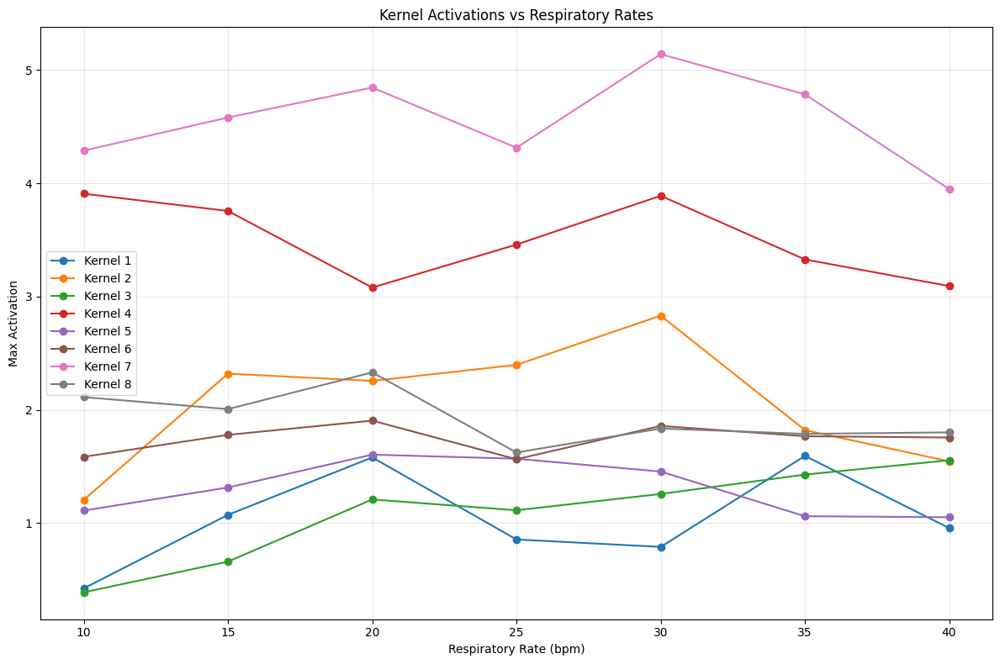

In [ ]:
# Vẽ biểu đồ kích hoạt theo tần số hô hấp
plt.figure(figsize=(12, 8))

for k in range(8):  # 8 nhân
    plt.plot(test_rates, activations[:, k], marker='o', label=f'Kernel {k+1}')

plt.xlabel('Respiratory Rate (bpm)')
plt.ylabel('Max Activation')
plt.title('Kernel Activations vs Respiratory Rates')
plt.grid(True, alpha=0.3)
plt.legend()
plt.tight_layout()
plt.show()

In [ ]:
# Phân tích chi tiết hai nhân quan trọng nhân 3 với nhân 8
kernel6 = encoder_weights[5, 0, :]
kernel4 = encoder_weights[3, 0, :]

In [ ]:
# Làm mịn trọng số nhân bằng bộ lọc trung bình di động
def smooth_kernel(kernel, window_size=30):
    """Làm mịn trọng số nhân bằng bộ lọc trung bình di động"""
    return np.convolve(kernel, np.ones(window_size)/window_size, mode='same')

In [ ]:
kernel6_smooth = smooth_kernel(kernel6)
kernel4_smooth = smooth_kernel(kernel4)

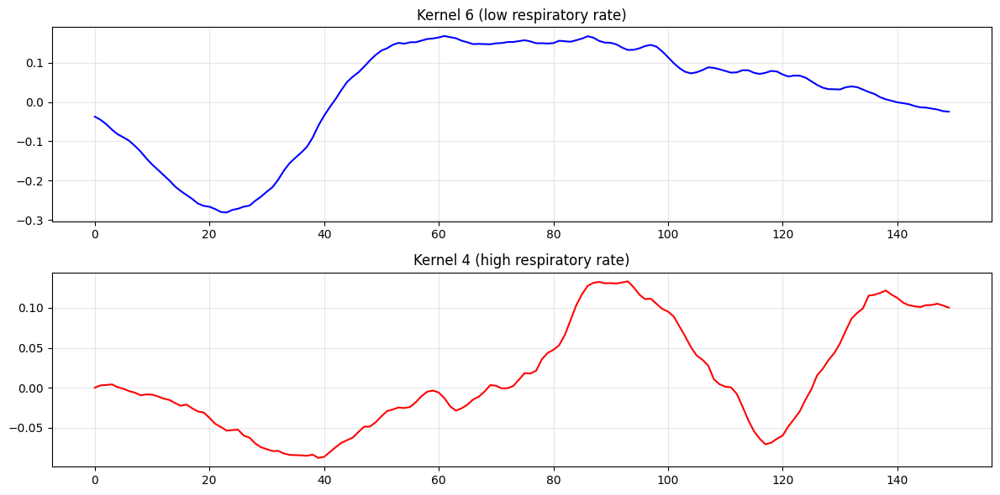

In [ ]:
# Vẽ biểu đồ so sánh hai nhân
plt.figure(figsize=(12, 6))

plt.subplot(2, 1, 1)
plt.plot(kernel6_smooth, 'b-')
plt.title('Kernel 6 (low respiratory rate)')
plt.grid(True, alpha=0.3)

plt.subplot(2, 1, 2)
plt.plot(kernel4_smooth, 'r-')
plt.title('Kernel 4 (high respiratory rate)')
plt.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

#6 Kiểm tra chất lượng tín hiệu

##6.1 Thiết lập các hàm kiểm tra

### 6.1.1 Entropy Methods Implementation

In [ ]:
# Import libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy import signal as scipy_signal
from scipy.fft import fft, fftfreq
import math
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, classification_report, accuracy_score, f1_score
import seaborn as sns
import os
import warnings

In [ ]:
def shannon_entropy(signal_window, bins=50):
    """
    Calculate Shannon Entropy for a PPG signal window.

    Parameters:
    -----------
    signal_window : array-like
        Window of PPG signal
    bins : int, optional
        Number of bins for histogram, by default 50

    Returns:
    --------
    float
        Shannon Entropy value
    """
    # Calculate histogram
    hist, _ = np.histogram(signal_window, bins=bins, density=True)

    # Remove zeros to avoid log(0)
    hist = hist[hist > 0]

    # Calculate Shannon entropy
    entropy = -np.sum(hist * np.log2(hist))

    return entropy

In [ ]:
def sample_entropy(signal_window, m=2, r=None):
    """
    Calculate Sample Entropy for a PPG signal window.

    Parameters:
    -----------
    signal_window : array-like
        Window of PPG signal
    m : int, optional
        Embedding dimension, by default 2
    r : float, optional
        Tolerance, by default 0.2 * std(signal_window)

    Returns:
    --------
    float
        Sample Entropy value
    """
    # Normalize signal
    signal_window = (signal_window - np.mean(signal_window)) / np.std(signal_window)

    # Set default tolerance if not provided
    if r is None:
        r = 0.2 * np.std(signal_window)

    N = len(signal_window)

    # Initialize counters
    A = 0  # number of template matches of length m+1
    B = 0  # number of template matches of length m

    # Create templates of length m and m+1
    xm = np.zeros((N-m, m))
    xm1 = np.zeros((N-m-1, m+1))

    for i in range(N-m):
        xm[i] = signal_window[i:i+m]
        if i < N-m-1:
            xm1[i] = signal_window[i:i+m+1]

    # Count template matches
    for i in range(N-m):
        # Count matches of length m
        for j in range(i+1, N-m):
            if max(abs(xm[i] - xm[j])) <= r:
                B += 1

        # Count matches of length m+1
        if i < N-m-1:
            for j in range(i+1, N-m-1):
                if max(abs(xm1[i] - xm1[j])) <= r:
                    A += 1

    # Calculate sample entropy
    if B == 0 or A == 0:
        return np.inf
    else:
        return -np.log(A / B)

In [ ]:
def approximate_entropy(signal_window, m=2, r=None):
    """
    Calculate Approximate Entropy for a PPG signal window.

    Parameters:
    -----------
    signal_window : array-like
        Window of PPG signal
    m : int, optional
        Embedding dimension, by default 2
    r : float, optional
        Tolerance, by default 0.2 * std(signal_window)

    Returns:
    --------
    float
        Approximate Entropy value
    """
    # Normalize signal
    signal_window = (signal_window - np.mean(signal_window)) / np.std(signal_window)

    # Set default tolerance if not provided
    if r is None:
        r = 0.2 * np.std(signal_window)

    N = len(signal_window)

    # Initialize phi values
    phi_m = 0
    phi_m1 = 0

    # Calculate phi(m)
    for i in range(N-m+1):
        # Extract template
        template = signal_window[i:i+m]

        # Count matches
        count = 0
        for j in range(N-m+1):
            if max(abs(template - signal_window[j:j+m])) <= r:
                count += 1

        # Update phi_m
        if count != 0:  # Tránh tính log(0)
            phi_m += np.log(count / (N-m+1))


    phi_m /= (N-m+1)

    # Calculate phi(m+1)
    for i in range(N-m):
        # Extract template
        template = signal_window[i:i+m+1]

        # Count matches
        count = 0
        for j in range(N-m):
            if max(abs(template - signal_window[j:j+m+1])) <= r:
                count += 1

        # Update phi_m1
        if count != 0:  # Tránh tính log(0)
            phi_m1 += np.log(count / (N-m))

    phi_m1 /= (N-m)

    # Calculate approximate entropy
    return phi_m - phi_m1

In [ ]:
def spectral_entropy(signal_window, fs=125, nperseg=None):
    """
    Calculate Spectral Entropy for a PPG signal window.

    Parameters:
    -----------
    signal_window : array-like
        Window of PPG signal
    fs : float, optional
        Sampling frequency, by default 125 Hz
    nperseg : int, optional
        Length of each segment, by default None (uses len(signal_window))

    Returns:
    --------
    float
        Spectral Entropy value
    """
    # Apply Hamming window
    if nperseg is None:
        nperseg = len(signal_window)

    # Calculate power spectral density
    f, Pxx = scipy_signal.welch(signal_window, fs=fs, nperseg=nperseg, scaling='spectrum')

    # Normalize PSD
    Pxx_norm = Pxx / np.sum(Pxx)

    # Remove zeros to avoid log(0)
    Pxx_norm = Pxx_norm[Pxx_norm > 0]

    # Calculate spectral entropy
    spectral_entropy = -np.sum(Pxx_norm * np.log2(Pxx_norm))

    return spectral_entropy

In [ ]:
def combined_entropy_score(signal_window, fs=125, weights=None):
    """
    Calculate combined entropy score for a PPG signal window.

    Parameters:
    -----------
    signal_window : array-like
        Window of PPG signal
    fs : float, optional
        Sampling frequency, by default 125 Hz
    weights : list, optional
        Weights for each entropy measure [SE, SampEn, ApEn, SpEn], by default [0.25, 0.25, 0.25, 0.25]

    Returns:
    --------
    float
        Combined entropy score
    dict
        Individual entropy values
    """
    # Set default weights if not provided
    if weights is None:
        weights = [0.25, 0.25, 0.25, 0.25]

    # Calculate individual entropy measures
    se = shannon_entropy(signal_window)
    sampen = sample_entropy(signal_window)
    apen = approximate_entropy(signal_window)
    spen = spectral_entropy(signal_window, fs)

    # Handle infinite values
    if np.isinf(sampen):
        sampen = 2.0  # Set a high value for infinite SampEn
    if np.isinf(apen):
        apen = 2.0  # Set a high value for infinite ApEn

    # Normalize entropy values (example normalization, may need adjustment)
    se_norm = se / 5.0  # Assuming max SE is around 5
    sampen_norm = sampen / 2.0  # Assuming max SampEn is around 2
    apen_norm = apen / 2.0  # Assuming max ApEn is around 2
    spen_norm = spen / 5.0  # Assuming max SpEn is around 5

    # Calculate combined score
    combined_score = (weights[0] * se_norm +
                      weights[1] * sampen_norm +
                      weights[2] * apen_norm +
                      weights[3] * spen_norm)

    # Return combined score and individual values
    entropy_values = {
        'shannon_entropy': se,
        'sample_entropy': sampen,
        'approximate_entropy': apen,
        'spectral_entropy': spen
    }

    return combined_score, entropy_values

### 6.1.2 Signal Quality Assessment

In [ ]:
def preprocess_ppg(signal_data, fs=125, lowcut=0.5, highcut=8.0):
    """
    Preprocess PPG signal with bandpass filtering.

    Parameters:
    -----------
    signal_data : array-like
        Raw PPG signal
    fs : float, optional
        Sampling frequency, by default 125 Hz
    lowcut : float, optional
        Low cutoff frequency, by default 0.5 Hz
    highcut : float, optional
        High cutoff frequency, by default 8.0 Hz

    Returns:
    --------
    array-like
        Filtered PPG signal
    """
    # Design bandpass filter
    nyquist = 0.5 * fs
    low = lowcut / nyquist
    high = highcut / nyquist
    b, a = scipy_signal.butter(4, [low, high], btype='band')

    # Apply filter
    filtered_signal = scipy_signal.filtfilt(b, a, signal_data)

    return filtered_signal

In [ ]:
def assess_signal_quality(signal_data, fs=125, window_size=5, overlap=0.5, weights=None):
    """
    Assess PPG signal quality using entropy-based methods.

    Parameters:
    -----------
    signal_data : array-like
        PPG signal
    fs : float, optional
        Sampling frequency, by default 125 Hz
    window_size : float, optional
        Window size in seconds, by default 5
    overlap : float, optional
        Overlap between windows (0-1), by default 0.5
    weights : list, optional
        Weights for each entropy measure [SE, SampEn, ApEn, SpEn], by default [0.25, 0.25, 0.25, 0.25]

    Returns:
    --------
    pandas.DataFrame
        DataFrame with quality assessment results for each window
    """
    # Calculate window parameters
    window_samples = int(window_size * fs)
    step_samples = int(window_samples * (1 - overlap))

    # Initialize results
    results = []

    # Process signal in windows
    for i in range(0, len(signal_data) - window_samples + 1, step_samples):
        # Extract window
        window = signal_data[i:i+window_samples]

        # Calculate combined entropy score
        combined_score, entropy_values = combined_entropy_score(window, fs, weights)

        # Determine quality class
        if combined_score < 0.3:
            quality_class = 'Excellent'
        elif combined_score < 0.6:
            quality_class = 'Acceptable'
        else:
            quality_class = 'Unfit'

        # Store results
        results.append({
            'start_time': i / fs,
            'end_time': (i + window_samples) / fs,
            'shannon_entropy': entropy_values['shannon_entropy'],
            'sample_entropy': entropy_values['sample_entropy'],
            'approximate_entropy': entropy_values['approximate_entropy'],
            'spectral_entropy': entropy_values['spectral_entropy'],
            'combined_score': combined_score,
            'quality_class': quality_class
        })

    # Convert to DataFrame
    results_df = pd.DataFrame(results)

    return results_df

In [ ]:
def plot_signal_quality(signal_data, quality_results, fs=125, title='PPG Signal Quality Assessment'):
    """
    Plot PPG signal with quality assessment results.

    Parameters:
    -----------
    signal_data : array-like
        PPG signal
    quality_results : pandas.DataFrame
        Quality assessment results from assess_signal_quality
    fs : float, optional
        Sampling frequency, by default 125 Hz
    title : str, optional
        Plot title, by default 'PPG Signal Quality Assessment'

    Returns:
    --------
    matplotlib.figure.Figure
        Figure object
    """
    # Create time array
    time = np.arange(len(signal_data)) / fs

    # Create figure
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 8), sharex=True)

    # Plot signal
    ax1.plot(time, signal_data)
    ax1.set_ylabel('Amplitude')
    ax1.set_title(title)

    # Plot quality classes
    quality_colors = {'Excellent': 'green', 'Acceptable': 'orange', 'Unfit': 'red'}

    for i, row in quality_results.iterrows():
        ax1.axvspan(row['start_time'], row['end_time'],
                   alpha=0.2, color=quality_colors[row['quality_class']])

    # Plot entropy scores
    ax2.plot(quality_results['start_time'], quality_results['shannon_entropy'], 'b-', label='Shannon Entropy')
    ax2.plot(quality_results['start_time'], quality_results['sample_entropy'], 'g-', label='Sample Entropy')
    ax2.plot(quality_results['start_time'], quality_results['approximate_entropy'], 'r-', label='Approximate Entropy')
    ax2.plot(quality_results['start_time'], quality_results['spectral_entropy'], 'c-', label='Spectral Entropy')
    ax2.plot(quality_results['start_time'], quality_results['combined_score'], 'k-', linewidth=2, label='Combined Score')

    ax2.set_xlabel('Time (s)')
    ax2.set_ylabel('Entropy Value')
    ax2.legend()

    # Add quality class legend
    import matplotlib.patches as mpatches
    patches = [mpatches.Patch(color=color, alpha=0.2, label=label)
               for label, color in quality_colors.items()]
    ax1.legend(handles=patches, loc='upper right')

    plt.tight_layout()

    return fig

## 6.2 Analysis of Capnobase Dataset

In [ ]:
# Load model train capnobase
model = CorrEncoder()
model.load_state_dict(torch.load(f"{model_path_9_6}/corr_encoder_model.pth", map_location=torch.device('cpu')))
model.eval()

CorrEncoder(
  (encoder): Sequential(
    (0): Conv1d(1, 8, kernel_size=(150,), stride=(1,), padding=(20,))
    (1): ReLU()
    (2): Dropout(p=0.5, inplace=False)
    (3): Conv1d(8, 8, kernel_size=(75,), stride=(1,), padding=(10,))
    (4): ReLU()
    (5): Dropout(p=0.5, inplace=False)
    (6): Conv1d(8, 8, kernel_size=(50,), stride=(1,))
    (7): Sigmoid()
    (8): Dropout(p=0.5, inplace=False)
  )
  (decoder): Sequential(
    (0): ConvTranspose1d(8, 8, kernel_size=(50,), stride=(1,))
    (1): Sigmoid()
    (2): ConvTranspose1d(8, 8, kernel_size=(75,), stride=(1,), padding=(10,))
    (3): ReLU()
    (4): ConvTranspose1d(8, 1, kernel_size=(150,), stride=(1,), padding=(20,))
    (5): ReLU()
  )
)

In [ ]:
#load data capnobase
import pickle

with open(f'{preprocess}/precoss_9_6.pkl', 'rb') as f:
    precoss = pickle.load(f)
    print('Load success!')

Load success!


In [ ]:
folder_path = "/content/drive/MyDrive/dataIOT/CapnoBase IEEE TBME Respiratory Rate Benchmark/dataverse_files/data/csv"
csv_files = glob.glob(os.path.join(folder_path, "*_8min_signal.csv"))
df_list = []

for file in csv_files:
    df = pd.read_csv(file)
    df['file_name'] = os.path.basename(file)
    df_list.append(df)

In [ ]:
ppg_record = np.array([item['pleth_y'].values for item in df_list])
capno_record = np.array([item['co2_y'].values for item in df_list])

In [ ]:
ppg_record_resample = np.array([resample_signal(item) for item in ppg_record])
capno_record_resample = np.array([resample_signal(item) for item in capno_record])

In [ ]:
fs = 30
cutoff = 0.1
ppg_filtered = np.array([highpass_filter(item,cutoff,fs) for item in ppg_record_resample])

In [ ]:
def taoObject(window_size):
  precoss = []
  for i in range(len(ppg_record_resample)):
    ppg_segments = []
    capno_segments = []
    for j in range(0, len(ppg_filtered[i]) - window_size + 1, window_size):
      ppg_segments.append(normalize_signal(ppg_filtered[i][j:j+window_size],-1,1))
      capno_segments.append(normalize_signal(capno_record_resample[i][j:j+window_size],0,1))
    subject_data = {
          'id': i,
          'ppg_segments': np.array(ppg_segments),     # ✅ chuyển thành np.ndarray
          'capno_segments': np.array(capno_segments)  # ✅
      }
    precoss.append(subject_data)
  return precoss

In [ ]:
obj = taoObject(10*30)

In [ ]:
train_ppg, train_capno, test_ppg, test_capno = leave_one_subject_out(obj, 0)
train_loader, test_loader0 = create_dataloader(train_ppg, test_ppg, train_capno, test_capno)

In [ ]:
train_ppg

array([[ 0.33439968,  0.54434621,  0.47135724, ...,  0.21417107,
         0.11035453, -0.02232095],
       [-0.15412697, -0.26950073, -0.38088922, ...,  0.46874454,
         0.3993595 ,  0.28055059],
       [ 0.15782867,  0.00796604, -0.11389964, ..., -0.09528869,
        -0.20690548, -0.30687239],
       ...,
       [-0.7681579 , -0.36132589,  0.38053898, ..., -0.90290806,
        -0.88981756, -0.84460067],
       [-0.46416934,  0.24568891,  0.67798985, ..., -0.64258583,
        -0.04003026,  0.65479271],
       [ 0.81726346,  0.78715662,  0.70196032, ..., -0.50780666,
        -0.19844675, -0.0765371 ]])

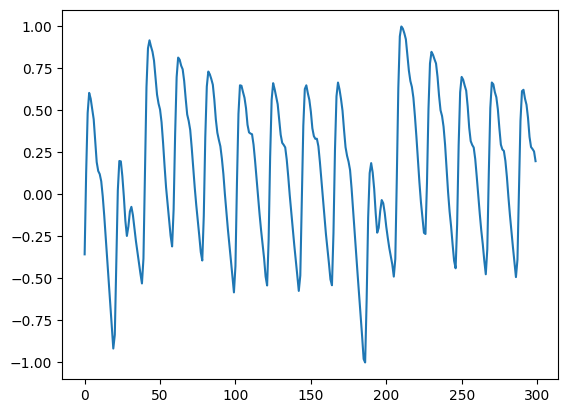

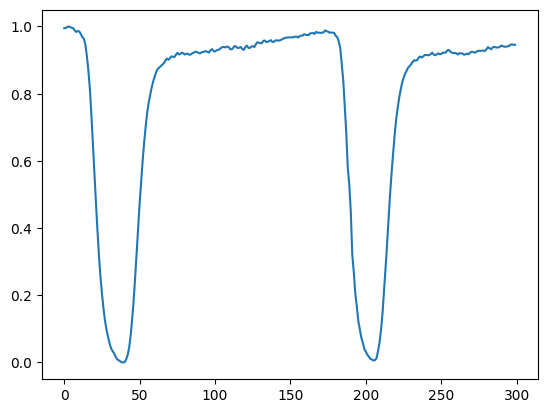

In [ ]:
plt.figure()
plt.plot(train_ppg[5])

plt.show()
plt.figure()
plt.plot(train_capno[5])
plt.show()

In [ ]:
def extract_all_data(loader):
    all_x, all_y = [], []
    for x, y in loader:
        all_x.append(x)
        all_y.append(y)
    return torch.cat(all_x), torch.cat(all_y)

In [ ]:
from torch.utils.data import ConcatDataset, DataLoader

# Bước 1: Trích dataset từ mỗi test_loader
dataset0 = test_loader0.dataset
dataset1 = train_loader.dataset

# Bước 2: Kết hợp lại bằng ConcatDataset
combined_dataset = ConcatDataset([dataset0, dataset1])

# Bước 3: Tạo lại DataLoader
combined_test_loader = DataLoader(combined_dataset, batch_size=32, shuffle=False)

In [ ]:
from sklearn.model_selection import train_test_split

x0, y0 = extract_all_data(test_loader0)
x1, y1 = extract_all_data(train_loader)

x_all = torch.cat([x0, x1])
y_all = torch.cat([y0, y1])


In [ ]:
y_predict = model(x_all).detach().numpy()

In [ ]:
print(len(y_predict))

2016


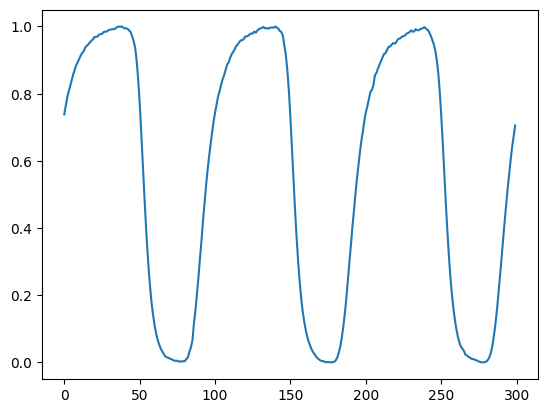

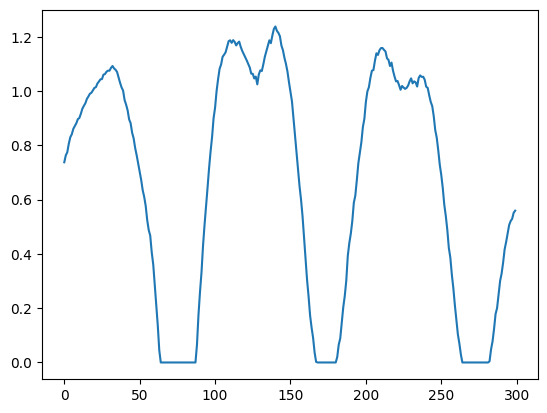

In [ ]:
plt.figure()
plt.plot(y_all[0])

plt.show()
plt.figure()
plt.plot(y_predict[0])
plt.show()

Đang đánh giá:   0%|          | 0/2016 [00:00<?, ?it/s]

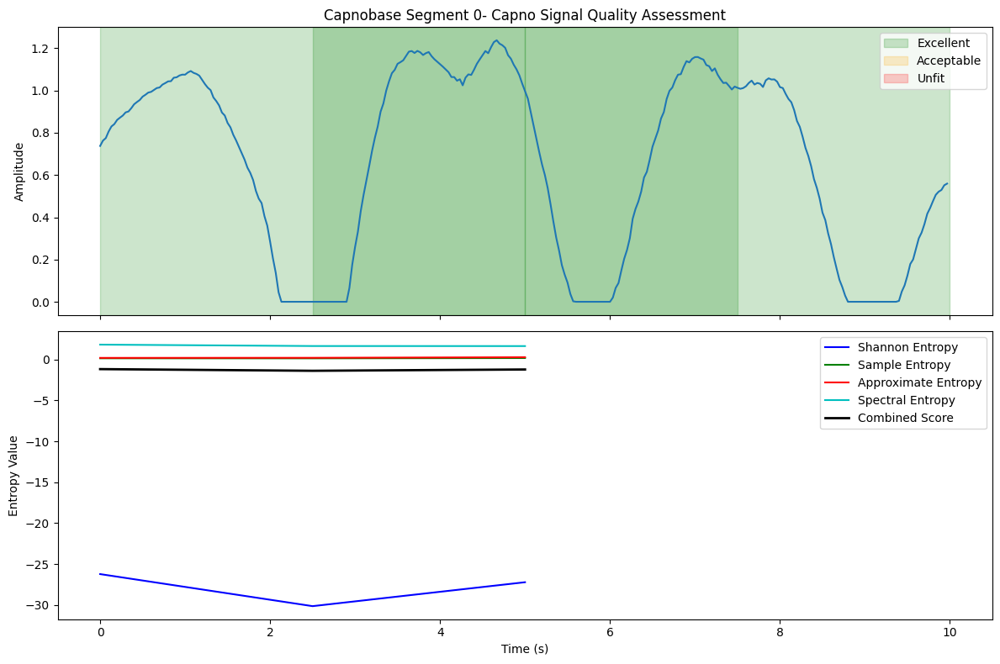

Đang đánh giá:   0%|          | 1/2016 [00:02<1:38:40,  2.94s/it]

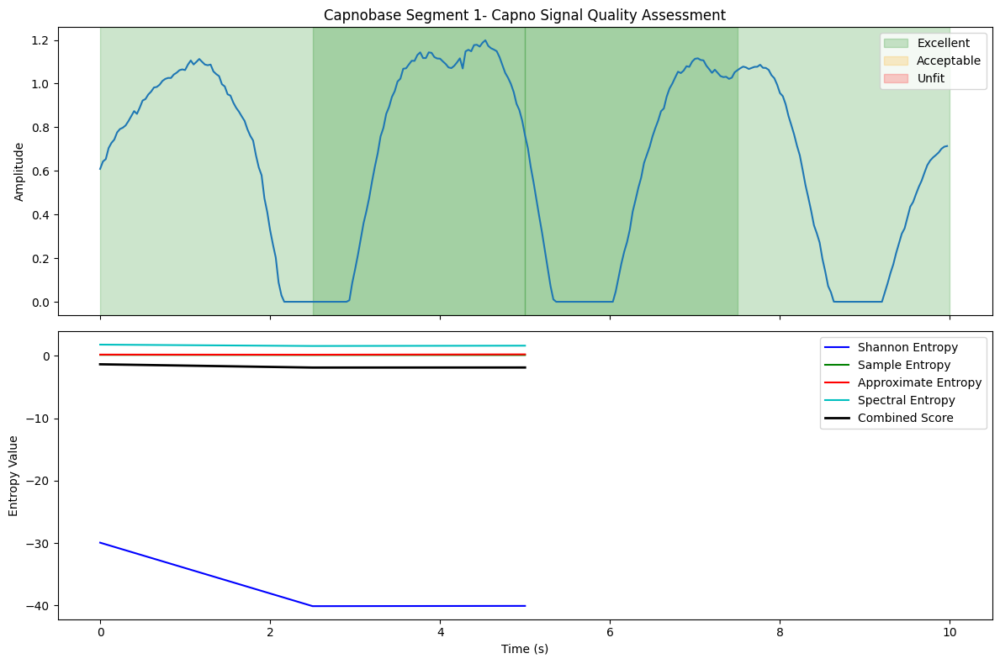

Đang đánh giá:   0%|          | 2/2016 [00:03<59:23,  1.77s/it]  

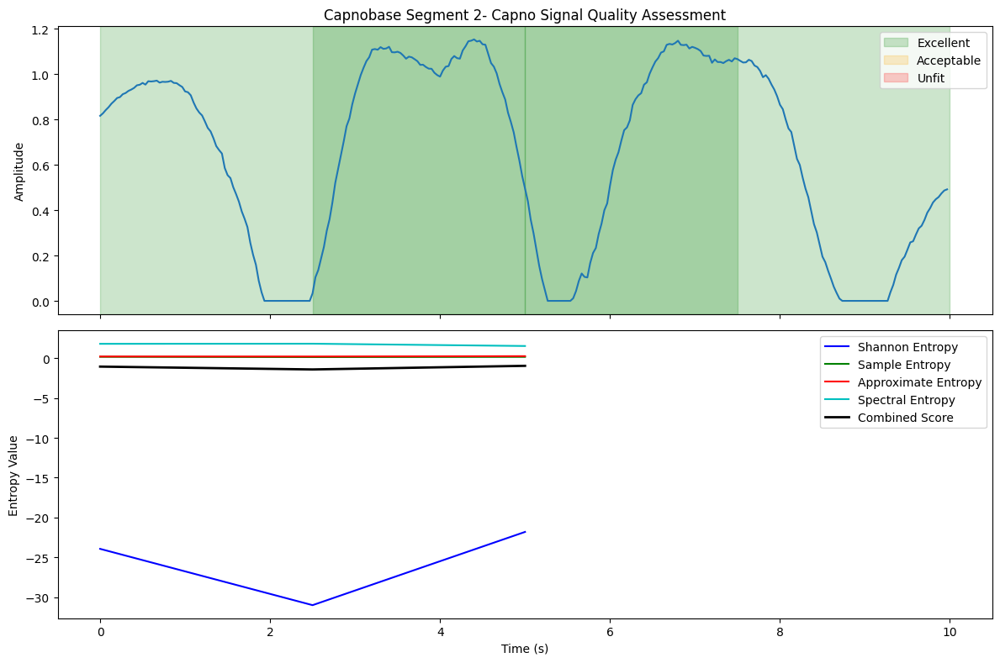

Đang đánh giá:   0%|          | 3/2016 [00:04<46:48,  1.40s/it]

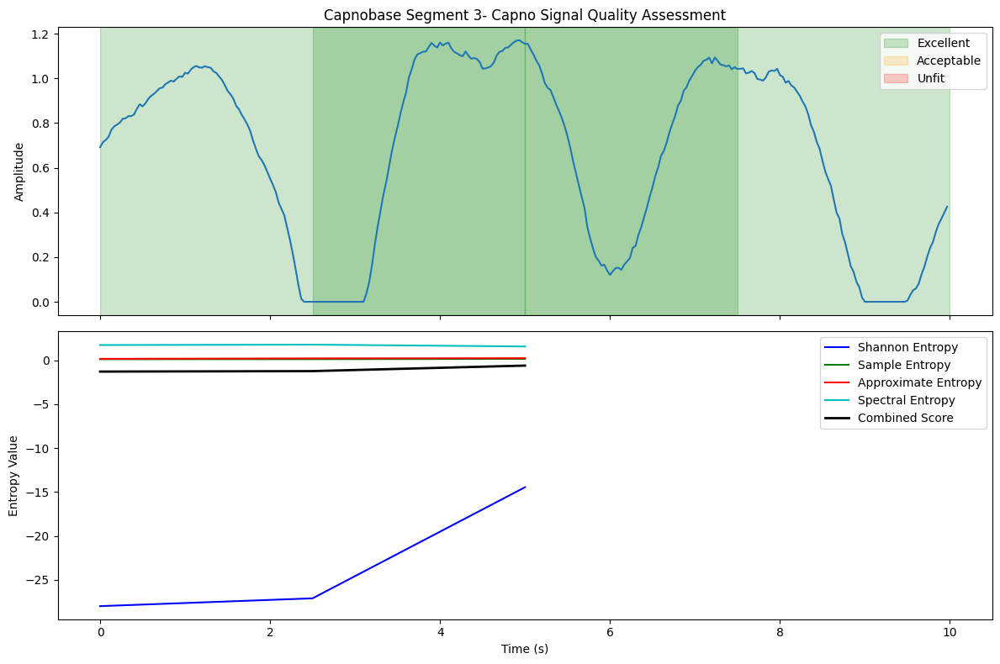

Đang đánh giá:   0%|          | 4/2016 [00:05<40:55,  1.22s/it]

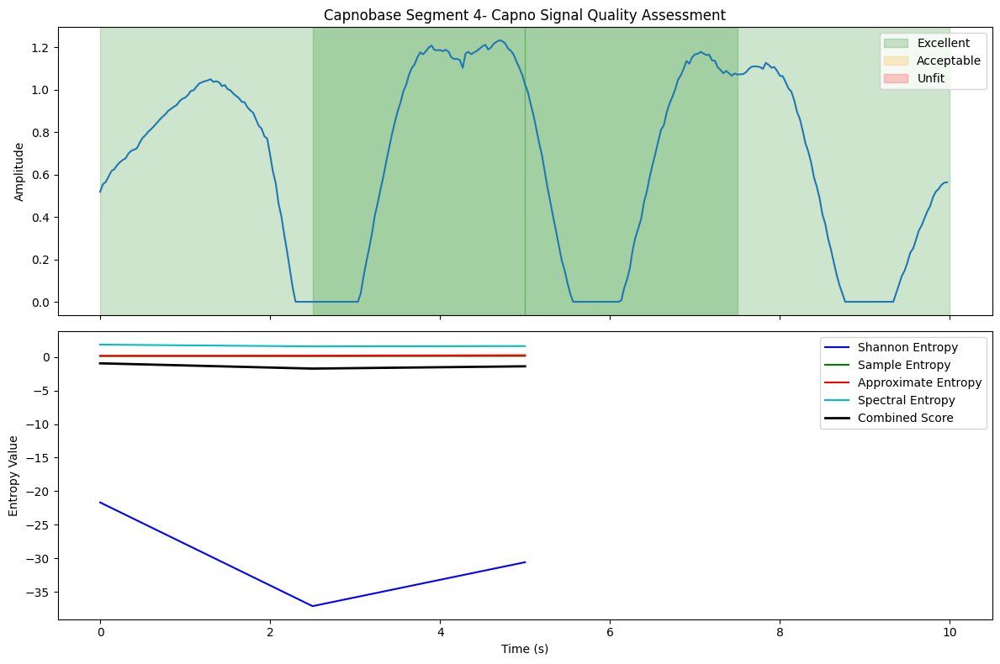

Đang đánh giá:   0%|          | 5/2016 [00:06<37:38,  1.12s/it]

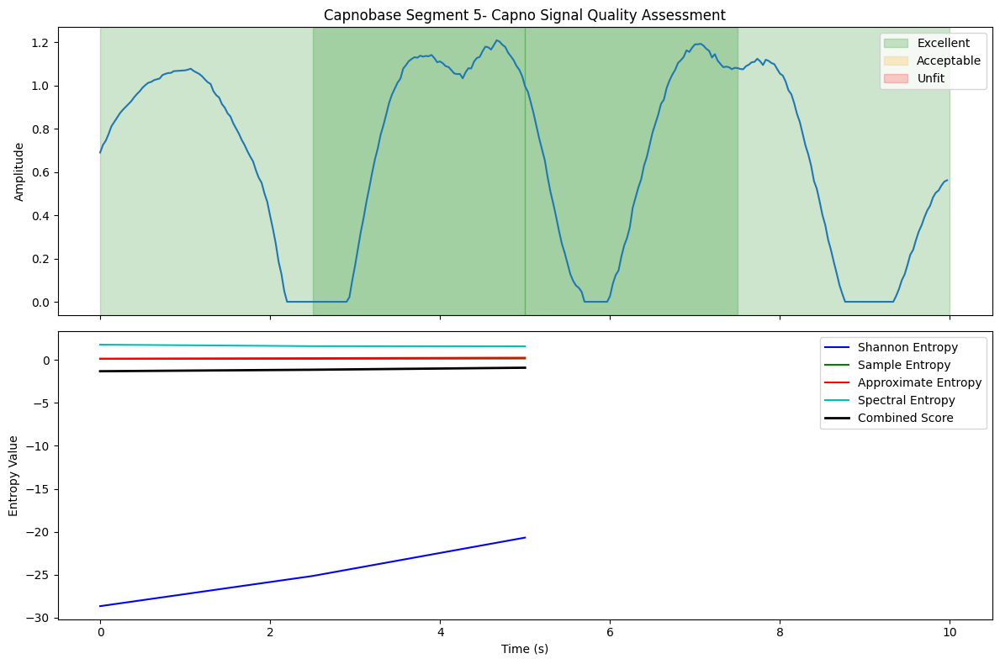

Đang đánh giá:   0%|          | 6/2016 [00:07<35:37,  1.06s/it]

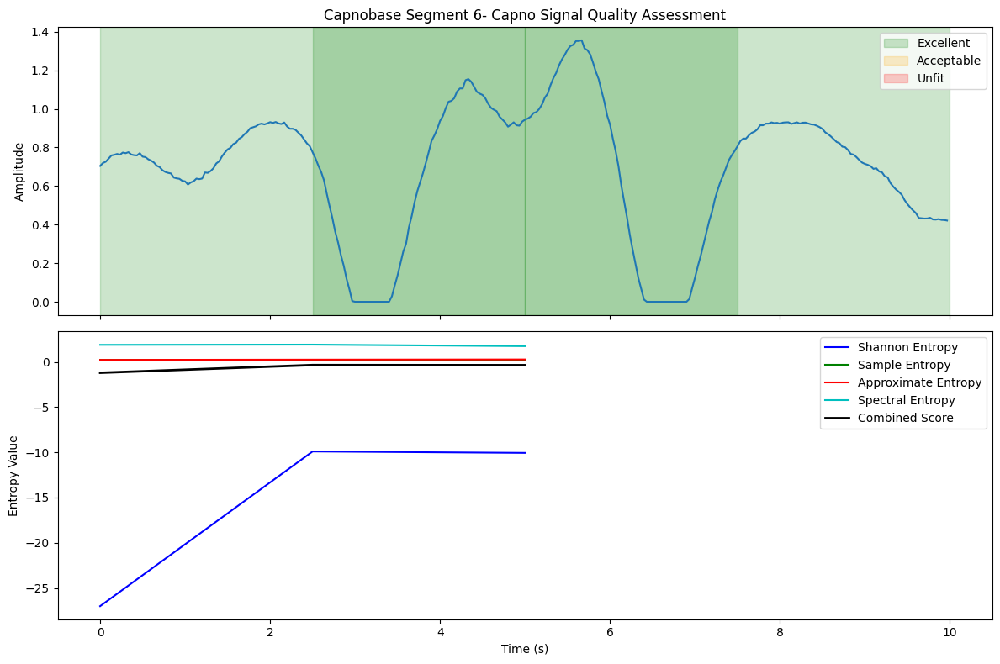

Đang đánh giá:   0%|          | 7/2016 [00:08<34:26,  1.03s/it]

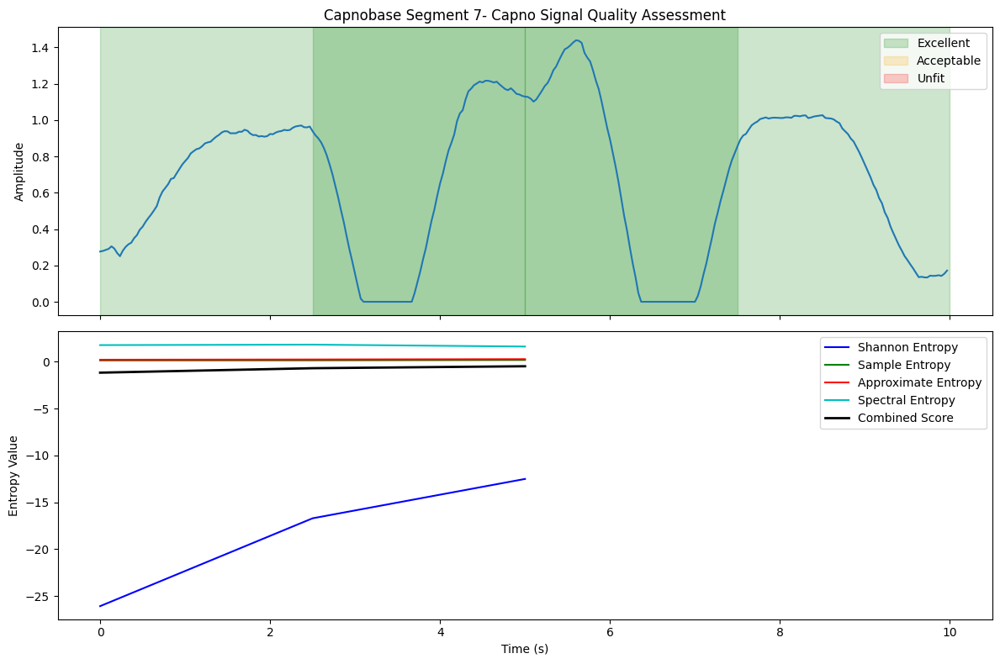

Đang đánh giá:   0%|          | 8/2016 [00:09<33:35,  1.00s/it]

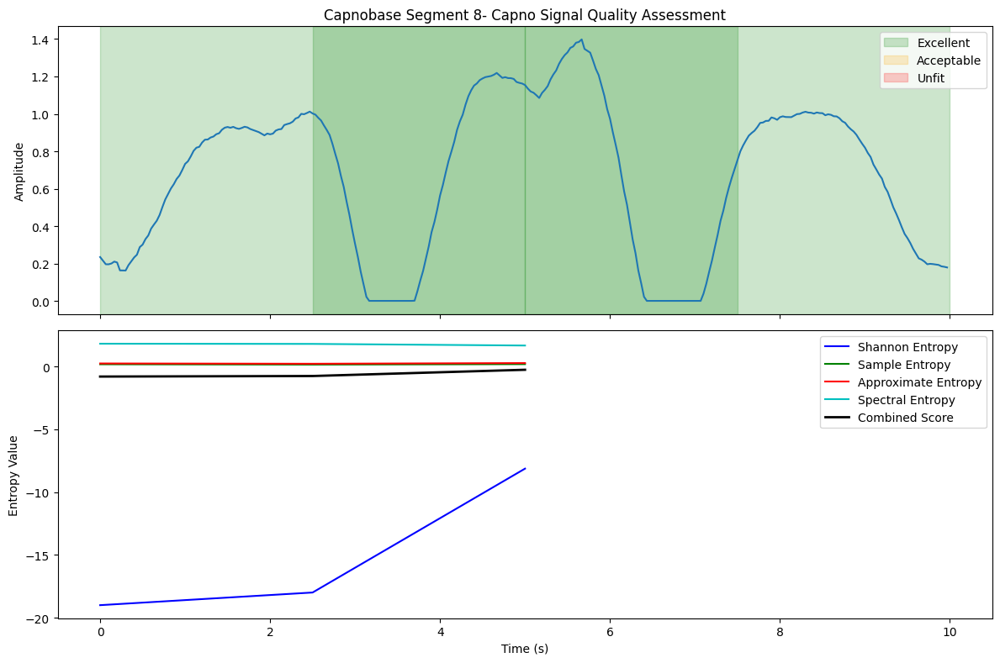

Đang đánh giá:   0%|          | 9/2016 [00:10<33:01,  1.01it/s]

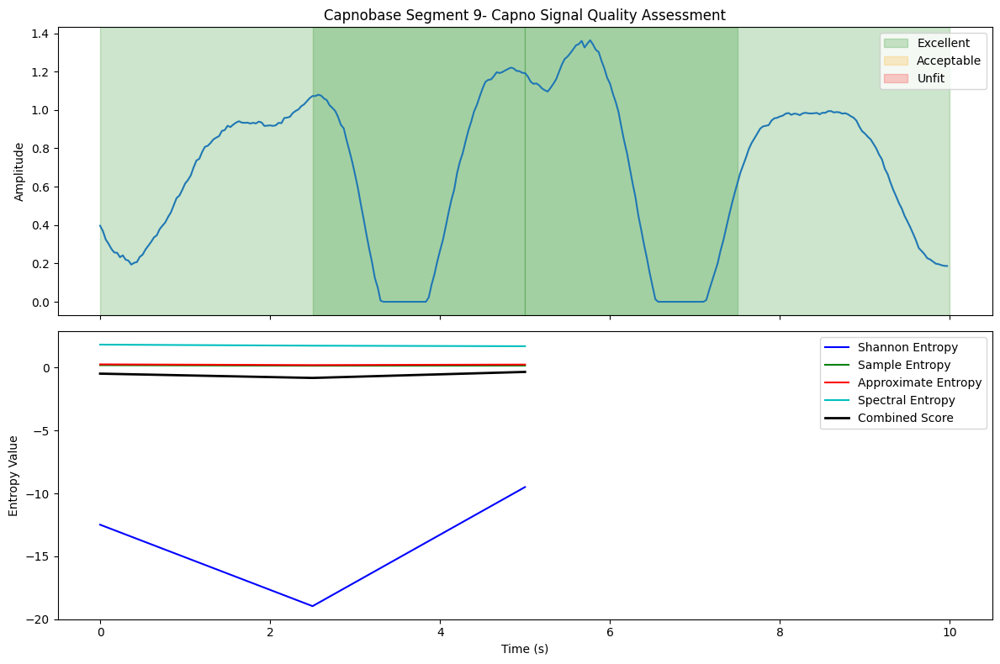

Đang đánh giá:   0%|          | 10/2016 [00:11<32:40,  1.02it/s]

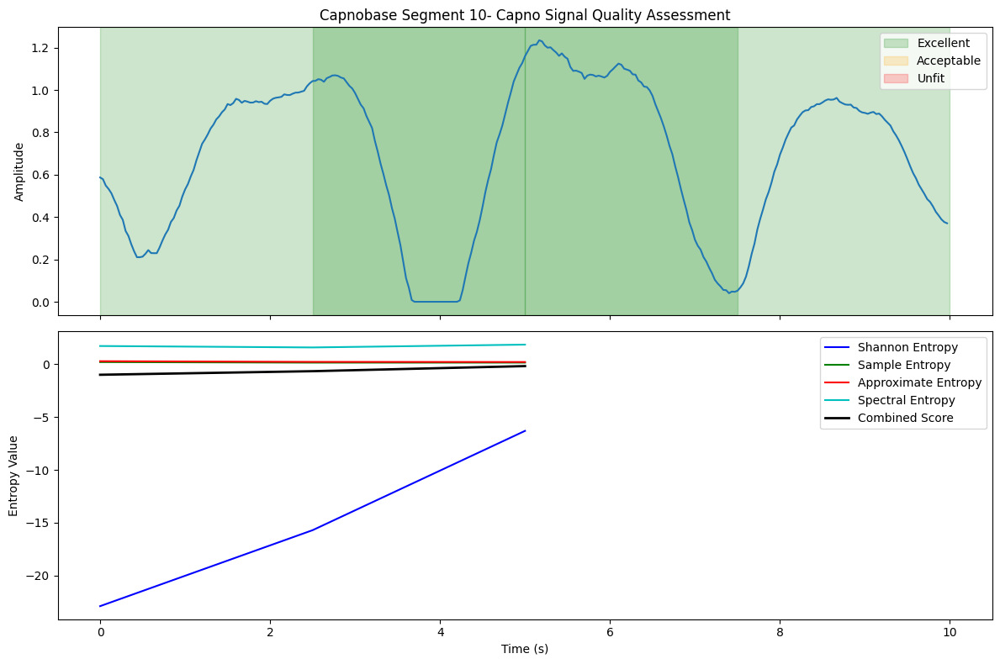

Đang đánh giá:   1%|          | 11/2016 [00:12<35:29,  1.06s/it]

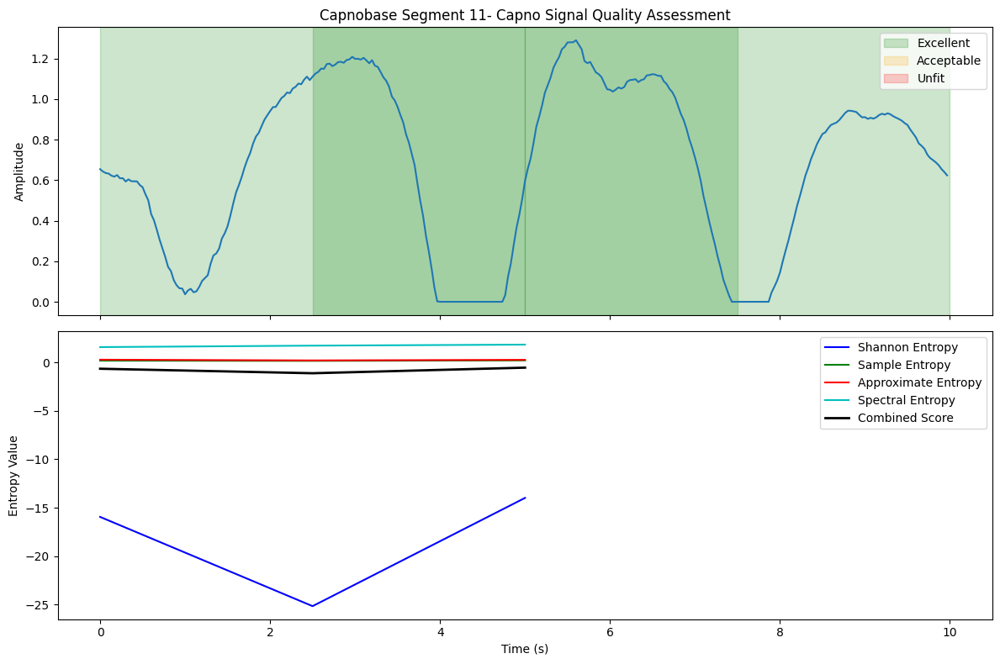

Đang đánh giá:   1%|          | 12/2016 [00:14<40:56,  1.23s/it]

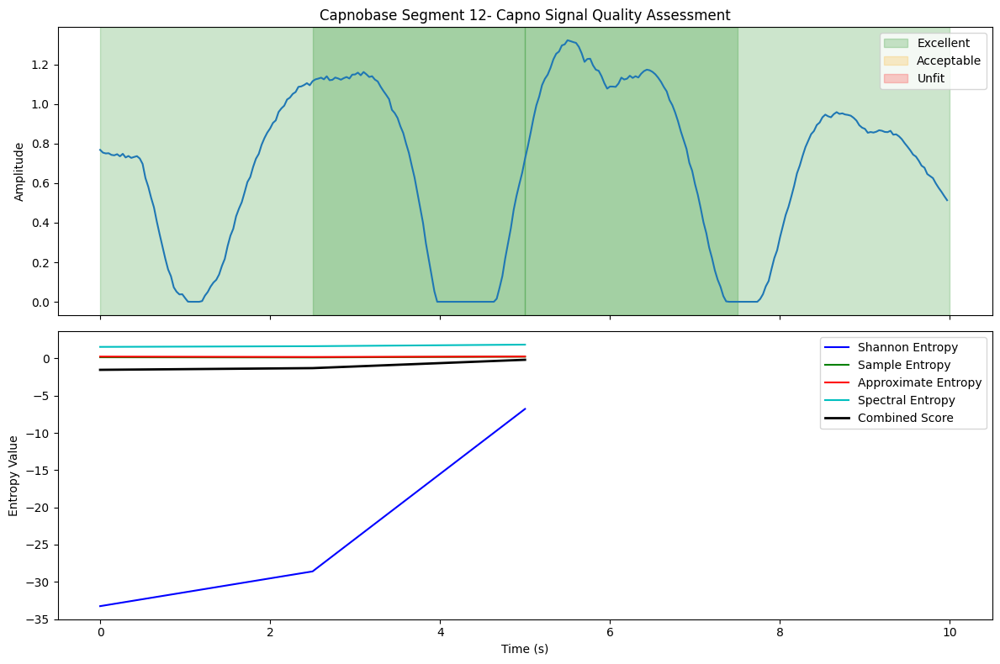

Đang đánh giá:   1%|          | 13/2016 [00:15<44:42,  1.34s/it]

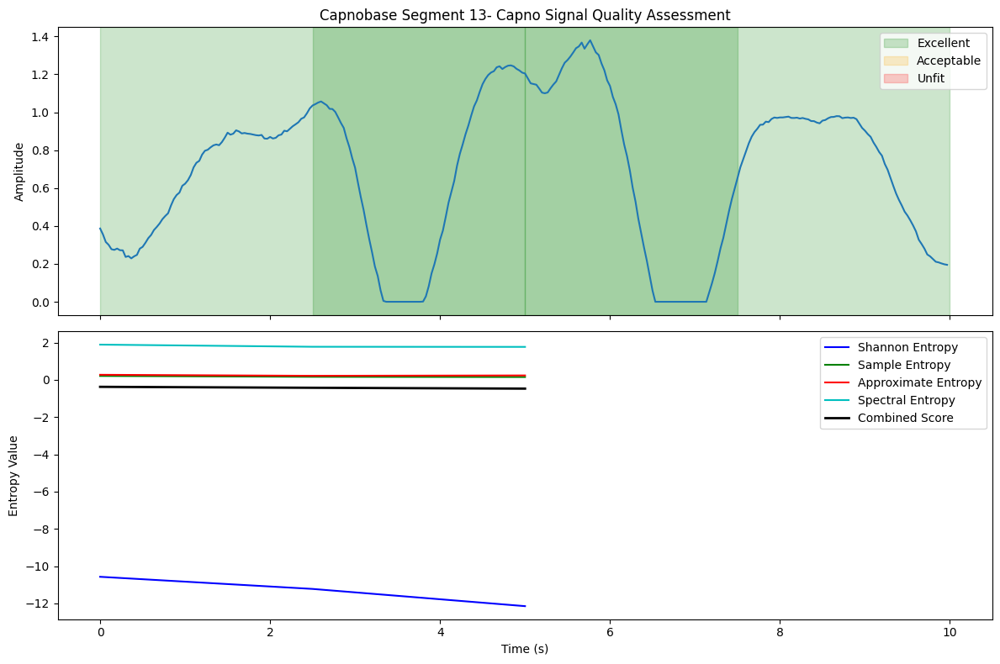

Đang đánh giá:   1%|          | 14/2016 [00:17<45:01,  1.35s/it]

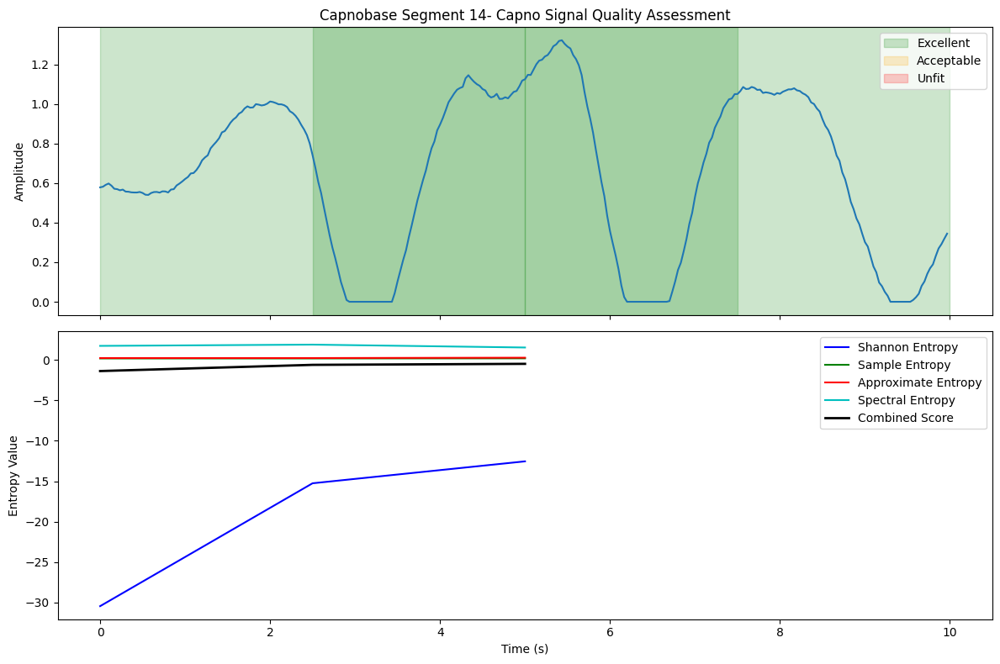

Đang đánh giá:   1%|          | 15/2016 [00:18<41:18,  1.24s/it]

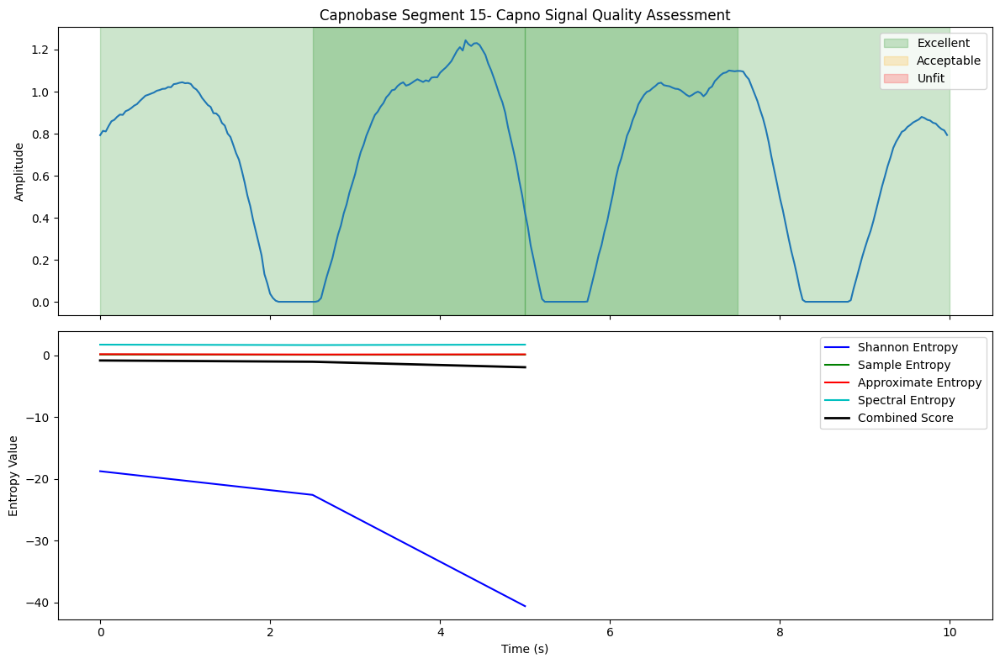

Đang đánh giá:   1%|          | 16/2016 [00:19<38:28,  1.15s/it]

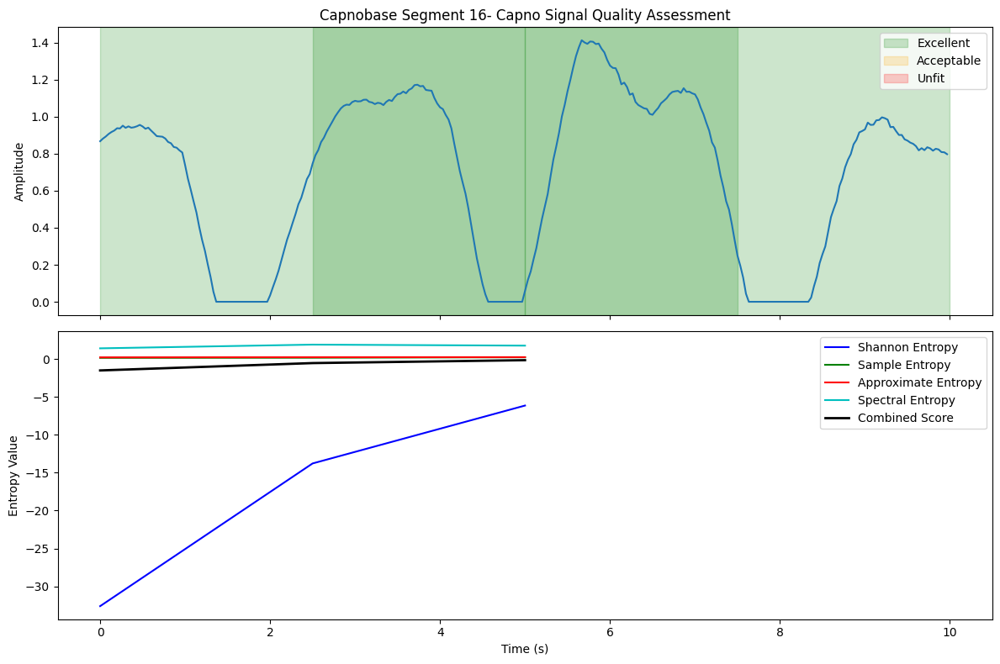

Đang đánh giá:   1%|          | 17/2016 [00:20<36:44,  1.10s/it]

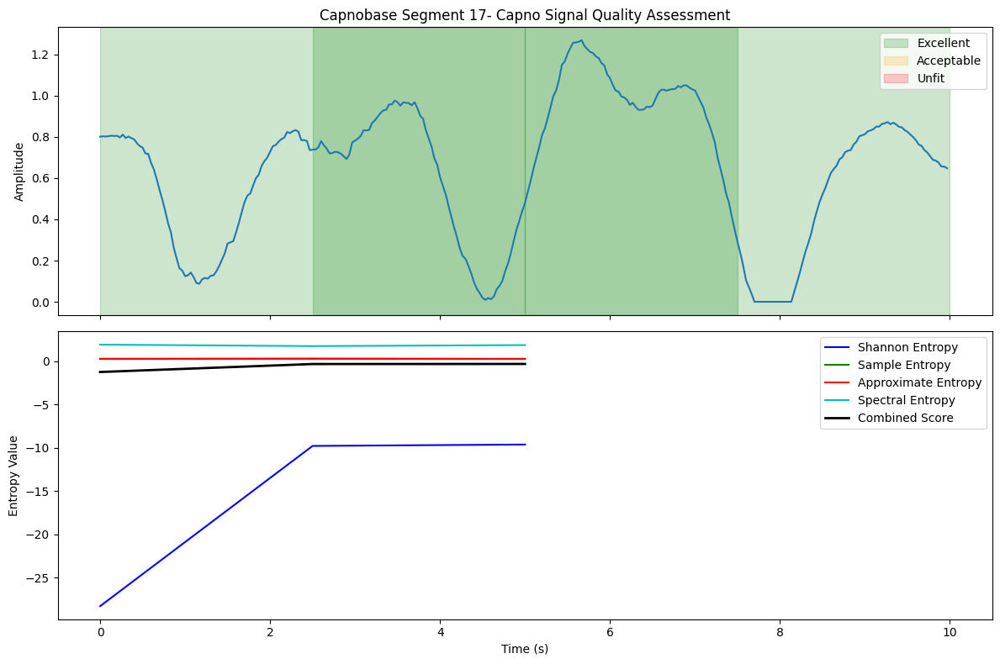

Đang đánh giá:   1%|          | 18/2016 [00:21<35:19,  1.06s/it]

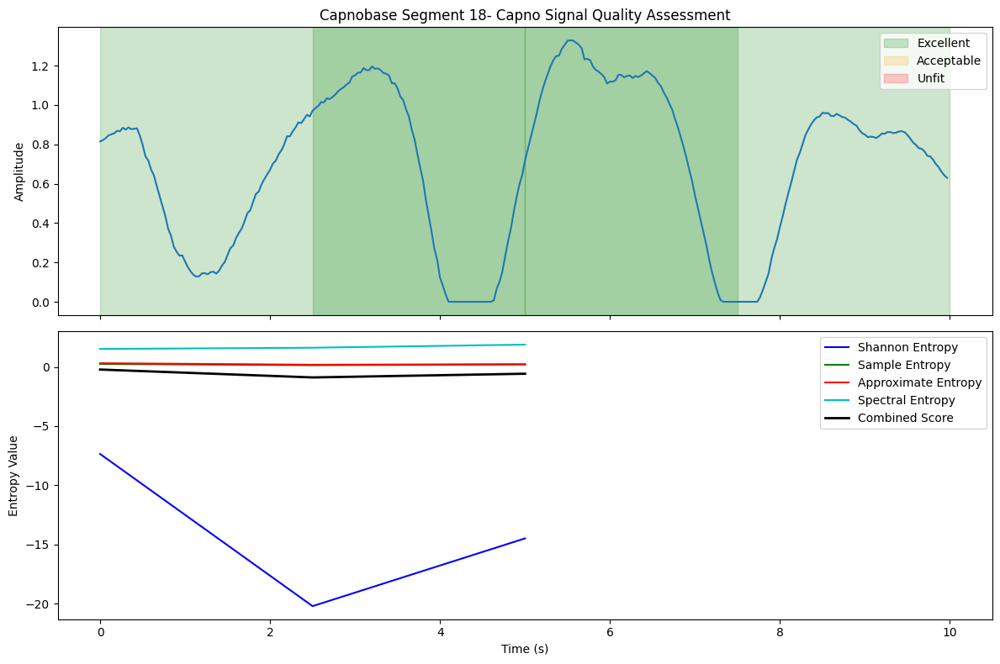

Đang đánh giá:   1%|          | 19/2016 [00:22<34:23,  1.03s/it]

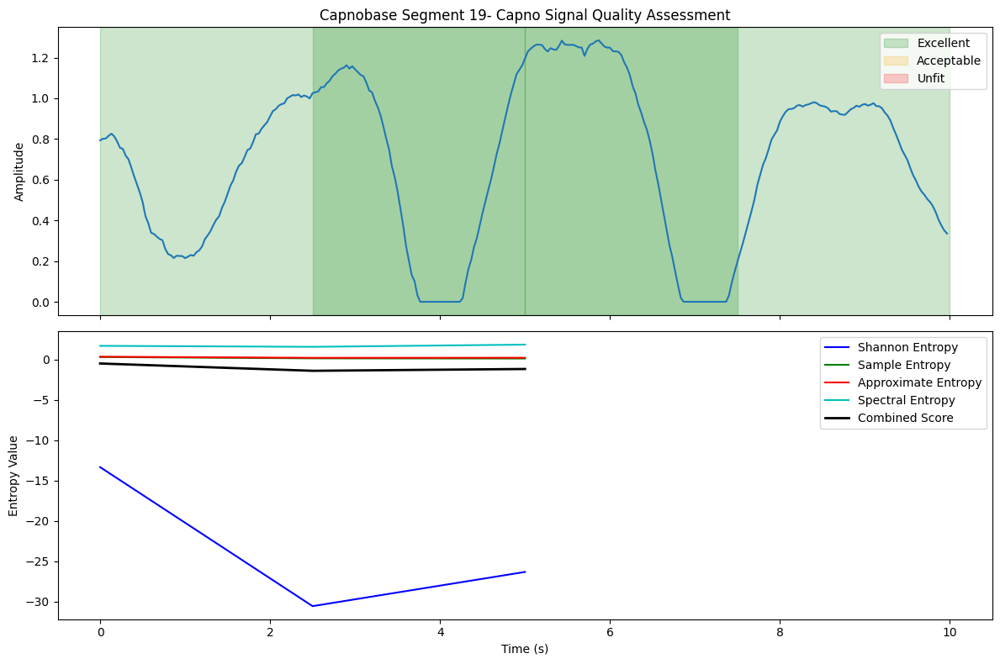

Đang đánh giá:   1%|          | 20/2016 [00:23<34:23,  1.03s/it]

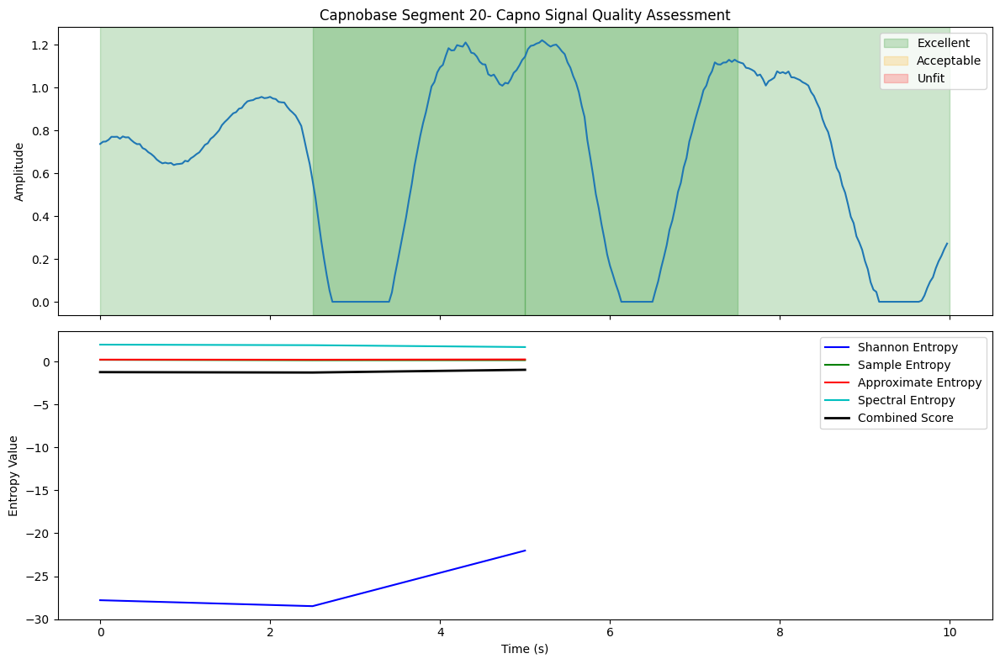

Đang đánh giá:   1%|          | 21/2016 [00:24<33:58,  1.02s/it]

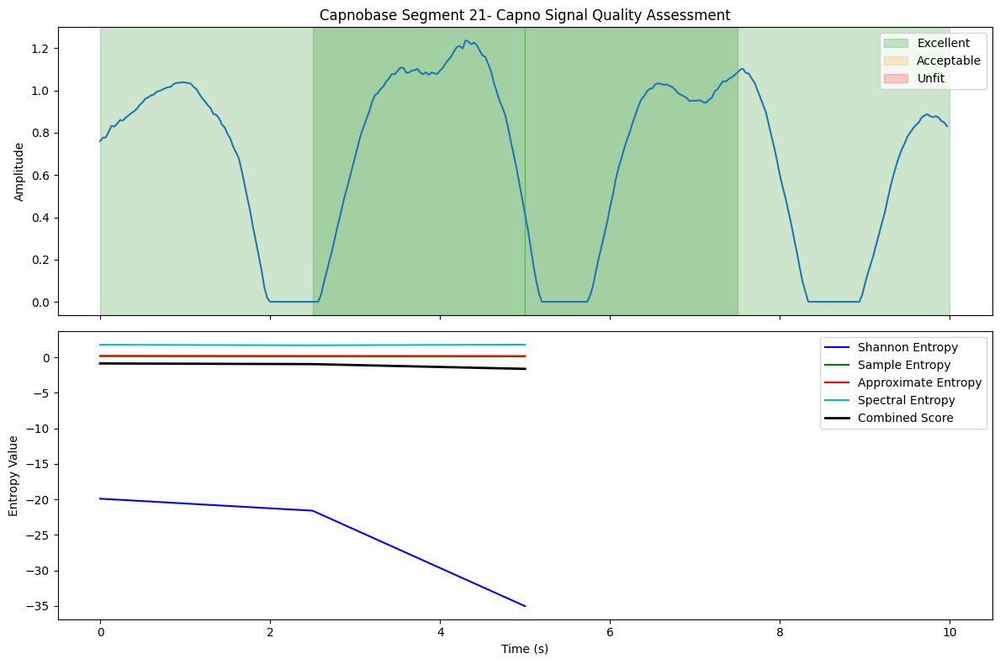

Đang đánh giá:   1%|          | 22/2016 [00:25<33:32,  1.01s/it]

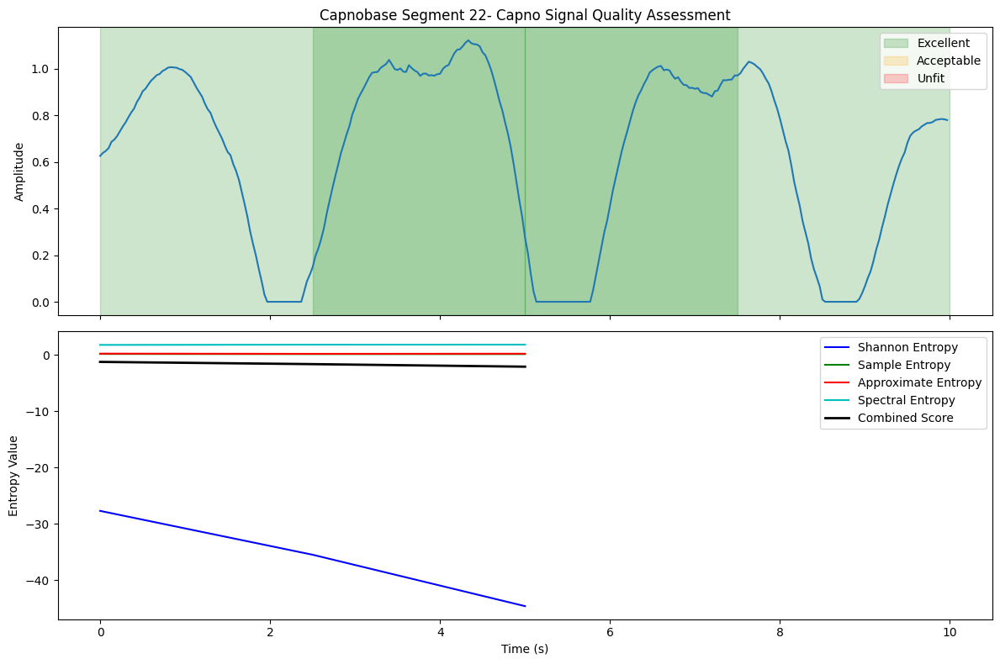

Đang đánh giá:   1%|          | 23/2016 [00:26<35:55,  1.08s/it]

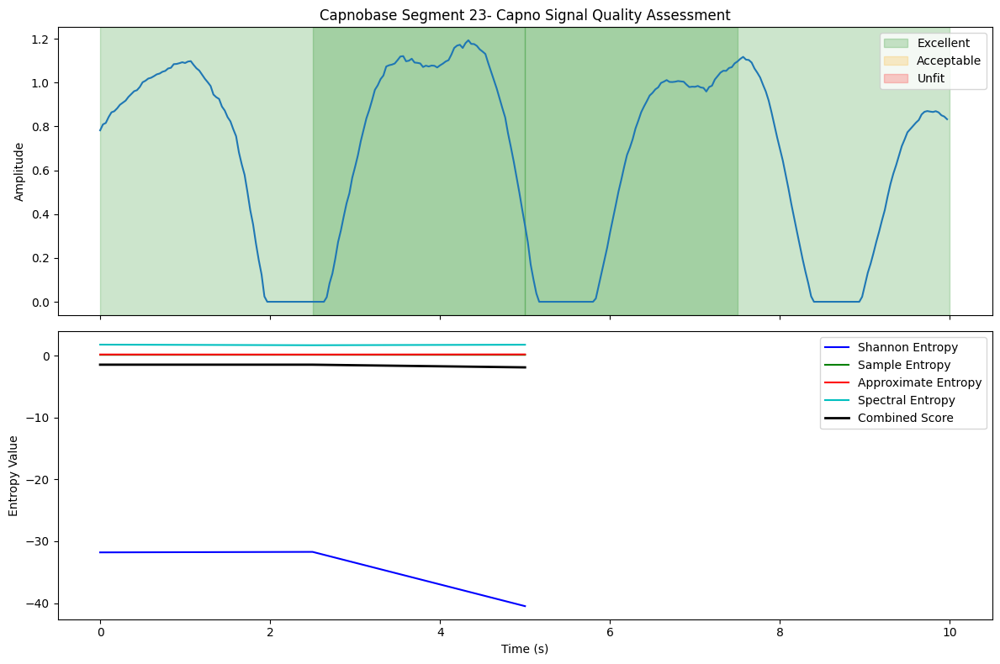

Đang đánh giá:   1%|          | 24/2016 [00:27<37:57,  1.14s/it]

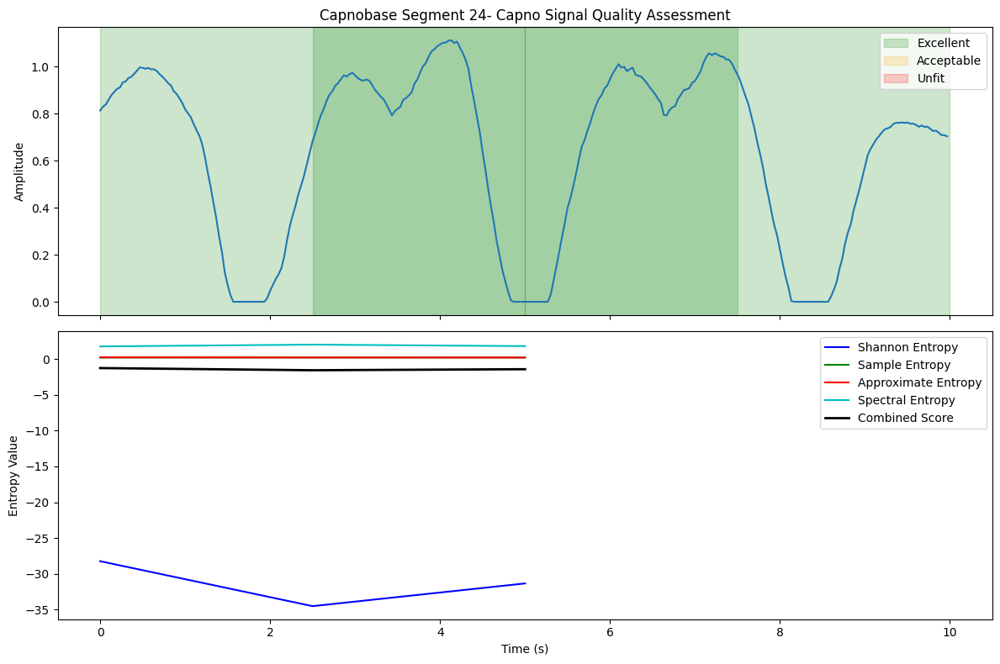

Đang đánh giá:   1%|          | 25/2016 [00:29<42:08,  1.27s/it]

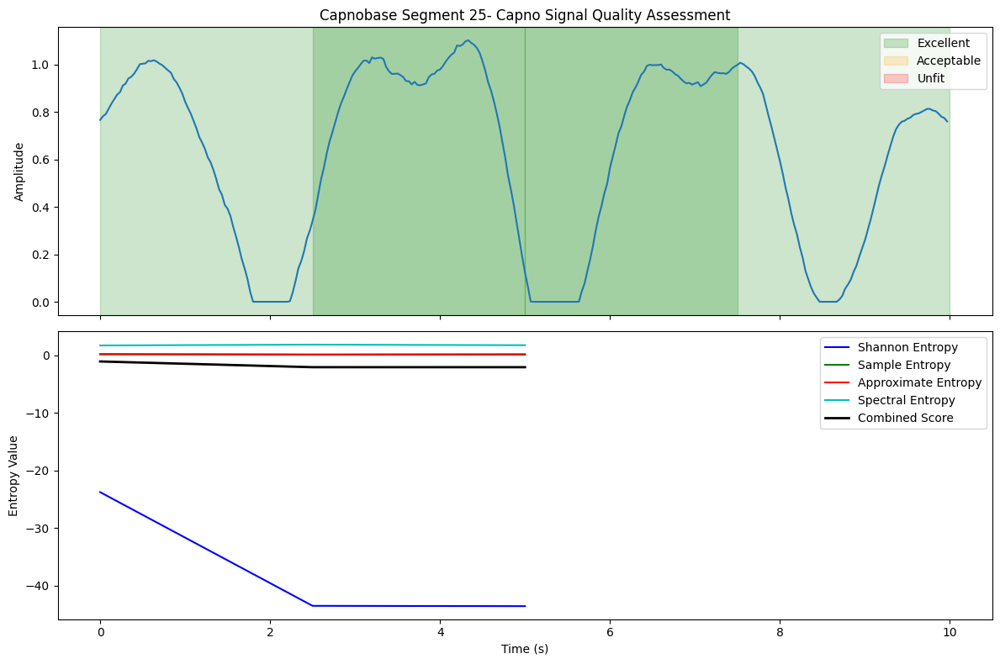

Đang đánh giá:   1%|▏         | 26/2016 [00:30<45:30,  1.37s/it]

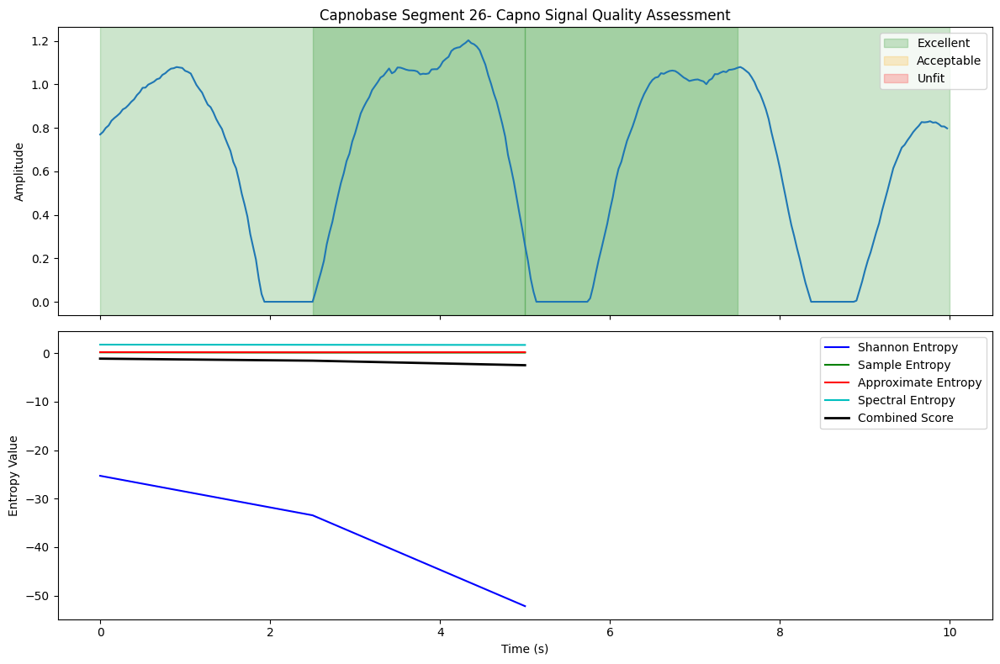

Đang đánh giá:   1%|▏         | 27/2016 [00:31<42:00,  1.27s/it]

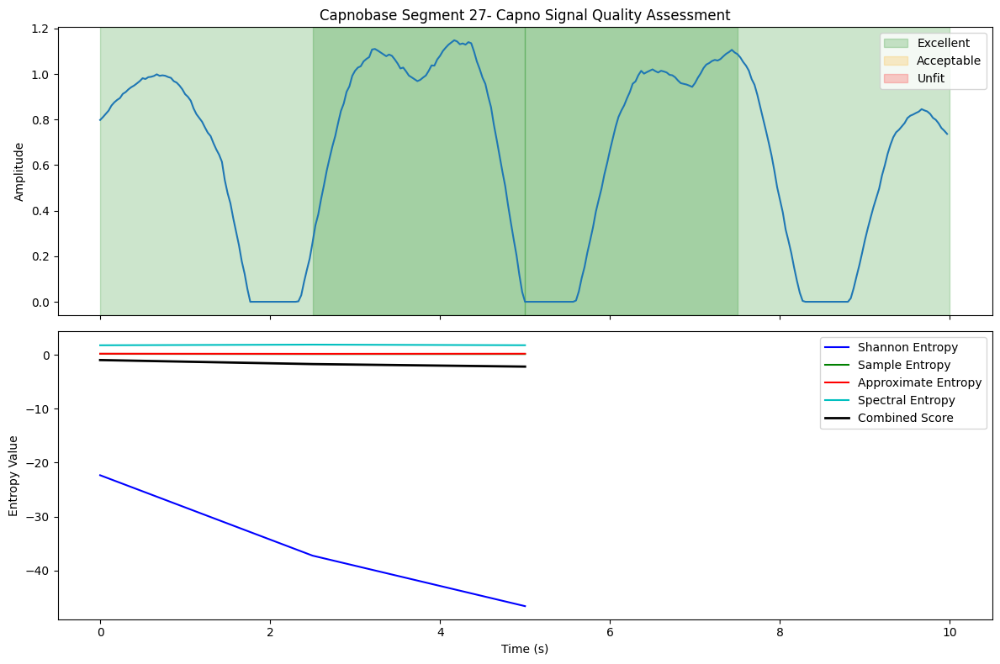

Đang đánh giá:   1%|▏         | 28/2016 [00:32<39:07,  1.18s/it]

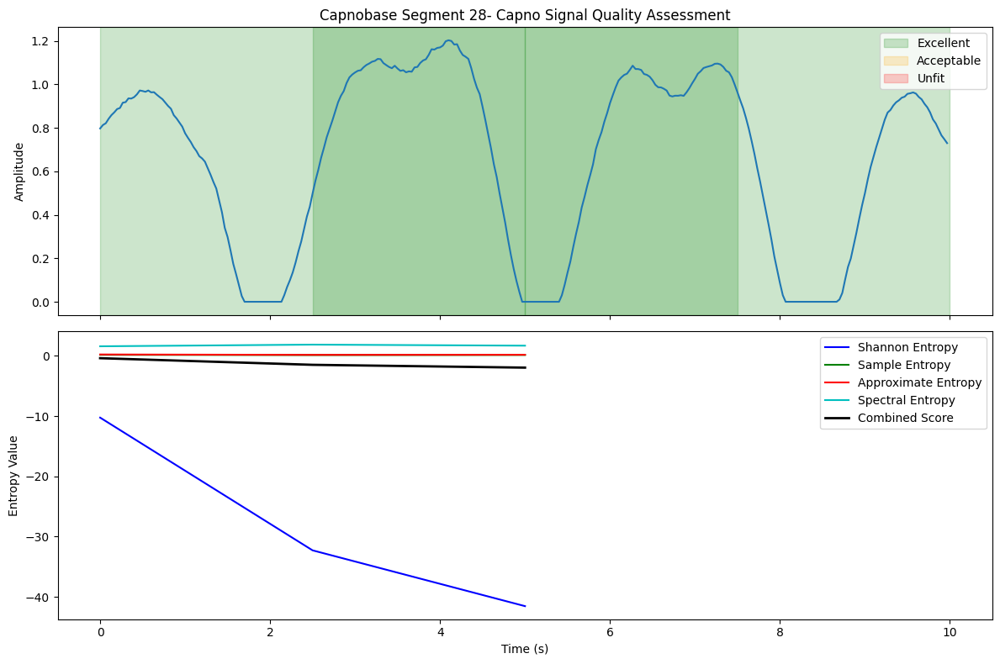

Đang đánh giá:   1%|▏         | 29/2016 [00:33<37:05,  1.12s/it]

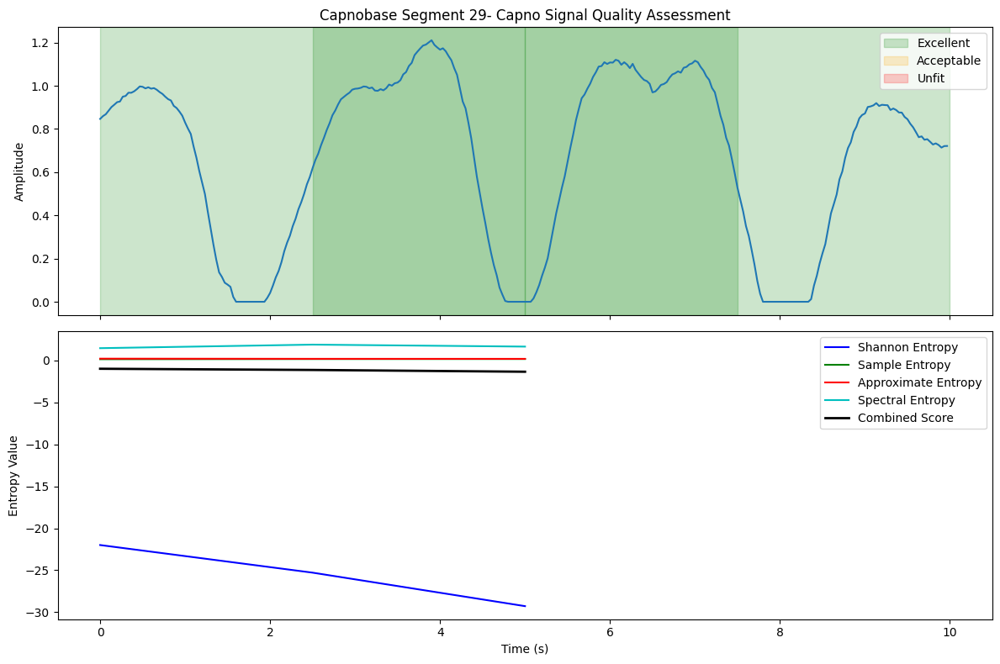

Đang đánh giá:   1%|▏         | 30/2016 [00:34<35:52,  1.08s/it]

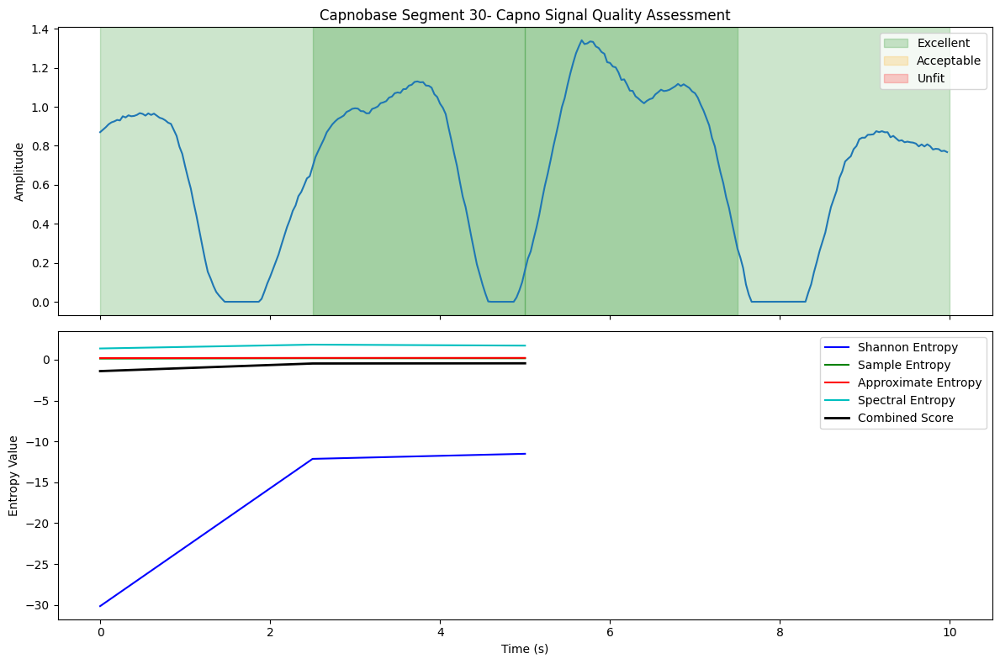

Đang đánh giá: 100%|██████████| 2016/2016 [23:12<00:00,  1.45it/s]


In [ ]:
from tqdm import tqdm

capno_results = []

for i, item in enumerate(tqdm(y_predict, desc="Đang đánh giá")):
    quality_results = assess_signal_quality(item, 30,5,0.5)
    quality_results['segment_id'] = i
    capno_results.append(quality_results)
    if (i<=30):
      fig = plot_signal_quality(item, quality_results, 30,
                         title=f"Capnobase Segment {i}- Capno Signal Quality Assessment")
      plt.show()

In [ ]:
capno_combined = pd.concat(capno_results, ignore_index=True)

In [ ]:
capno_combined

,start_time,end_time,shannon_entropy,sample_entropy,approximate_entropy,spectral_entropy,combined_score,quality_class,segment_id
0,0.0,5.0,-26.235203,0.145198,0.191895,1.815435,-1.178852,Excellent,0
1,2.5,7.5,-30.153161,0.139943,0.202304,1.643566,-1.382699,Excellent,0
2,5.0,10.0,-27.228924,0.175191,0.271108,1.636725,-1.223823,Excellent,0
3,0.0,5.0,-29.941328,0.148160,0.190474,1.785487,-1.365463,Excellent,1
4,2.5,7.5,-40.113428,0.121573,0.171892,1.566790,-1.890649,Excellent,1
...,...,...,...,...,...,...,...,...,...
6043,2.5,7.5,-43.227583,0.062431,0.117736,1.112711,-2.083223,Excellent,2014
6044,5.0,10.0,-72.247529,0.058654,0.125903,1.237288,-3.527442,Excellent,2014
6045,0.0,5.0,-13.715518,0.385789,0.406464,1.523561,-0.510566,Excellent,2015
6046,2.5,7.5,-7.601581,0.287116,0.307836,1.579759,-0.226722,Excellent,2015


In [ ]:
# Calculate overall quality distribution
quality_counts = capno_combined['quality_class'].value_counts()
quality_percentages = quality_counts / len(capno_combined) * 100

print("\nOverall Capnobase Quality Distribution:")
for quality, percentage in quality_percentages.items():
    print(f"{quality}: {percentage:.1f}%")


Overall Capnobase Quality Distribution:
Excellent: 98.9%
Acceptable: 1.1%
Unfit: 0.0%


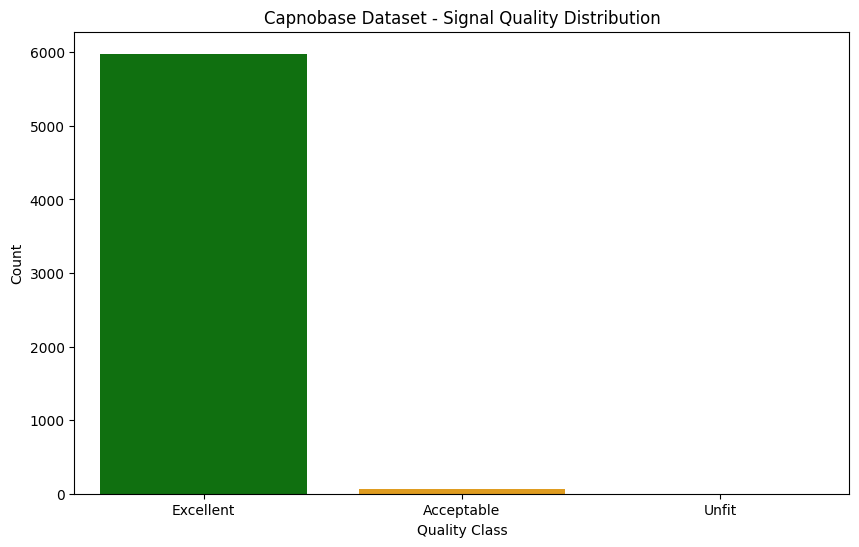

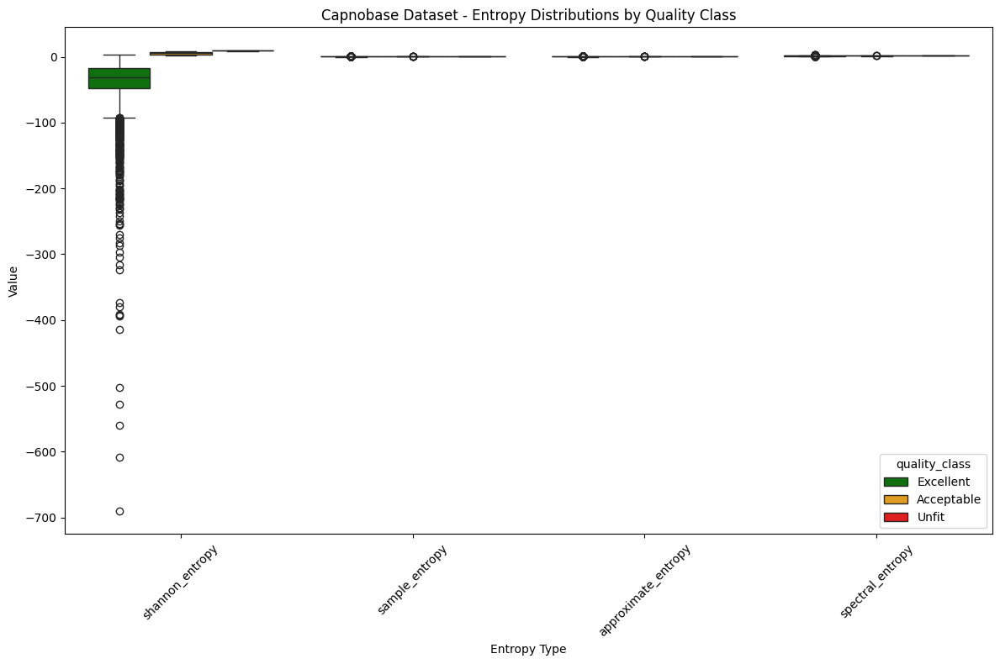

In [ ]:
# Plot quality distribution
plt.figure(figsize=(10, 6))
sns.countplot(x='quality_class', hue='quality_class', data=capno_combined, palette={'Excellent': 'green', 'Acceptable': 'orange', 'Unfit': 'red'}, legend=False)
plt.title('Capnobase Dataset - Signal Quality Distribution')
plt.xlabel('Quality Class')
plt.ylabel('Count')
plt.show()

# Plot entropy distributions
plt.figure(figsize=(12, 8))
entropy_cols = ['shannon_entropy', 'sample_entropy', 'approximate_entropy', 'spectral_entropy']
capno_melted = pd.melt(capno_combined, id_vars=['quality_class'], value_vars=entropy_cols, var_name='Entropy Type', value_name='Value')
sns.boxplot(x='Entropy Type', y='Value', hue='quality_class', data=capno_melted, palette={'Excellent': 'green', 'Acceptable': 'orange', 'Unfit': 'red'})
plt.title('Capnobase Dataset - Entropy Distributions by Quality Class')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

## 6.3 Analysis of BIDMC Dataset

In [ ]:
model = CorrEncoder()
model.load_state_dict(torch.load(f"{model_path_9_6}/corr_encoder_model_bidmc.pth", map_location=torch.device('cpu')))
model.eval()

CorrEncoder(
  (encoder): Sequential(
    (0): Conv1d(1, 8, kernel_size=(150,), stride=(1,), padding=(20,))
    (1): ReLU()
    (2): Dropout(p=0.5, inplace=False)
    (3): Conv1d(8, 8, kernel_size=(75,), stride=(1,), padding=(10,))
    (4): ReLU()
    (5): Dropout(p=0.5, inplace=False)
    (6): Conv1d(8, 8, kernel_size=(50,), stride=(1,))
    (7): Sigmoid()
    (8): Dropout(p=0.5, inplace=False)
  )
  (decoder): Sequential(
    (0): ConvTranspose1d(8, 8, kernel_size=(50,), stride=(1,))
    (1): Sigmoid()
    (2): ConvTranspose1d(8, 8, kernel_size=(75,), stride=(1,), padding=(10,))
    (3): ReLU()
    (4): ConvTranspose1d(8, 1, kernel_size=(150,), stride=(1,), padding=(20,))
    (5): ReLU()
  )
)

In [ ]:
#load data
import pickle

with open(f'{preprocess}/precoss_bidmc.pkl', 'rb') as f:
    precoss = pickle.load(f)
    print('Load success!')

Load success!


In [ ]:
folder_path = "drive/MyDrive/dataIOT/BIDMC_data/bidmc-ppg-and-respiration-dataset-1.0.0/bidmc_csv"
csv_files = glob.glob(os.path.join(folder_path, "*Signals.csv"))
df_list = []

for file in csv_files:
    df = pd.read_csv(file)
    df['file_name'] = os.path.basename(file)
    df_list.append(df)

In [ ]:
df_list[0].columns

Index(['Time [s]', ' RESP', ' II', ' V', ' AVR', ' PLETH', 'file_name'], dtype='object')

In [ ]:
ppg_record = np.array([item[' PLETH'].values for item in df_list])
capno_record = np.array([item[' RESP'].values for item in df_list])

In [ ]:
ppg_record_resample = np.array([resample_signal(item,125,30) for item in ppg_record])
capno_record_resample = np.array([resample_signal(item,125,30) for item in capno_record])

In [ ]:
ppg_record_resample.shape

(53, 14400)

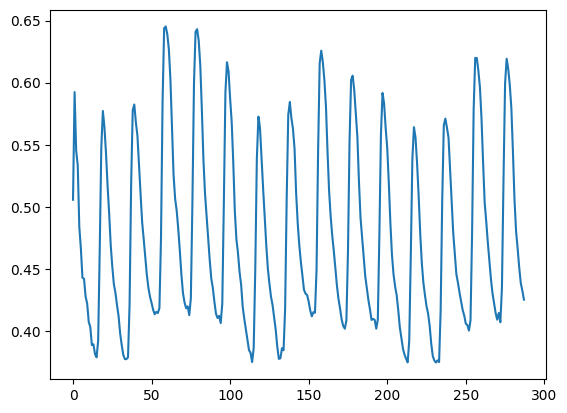

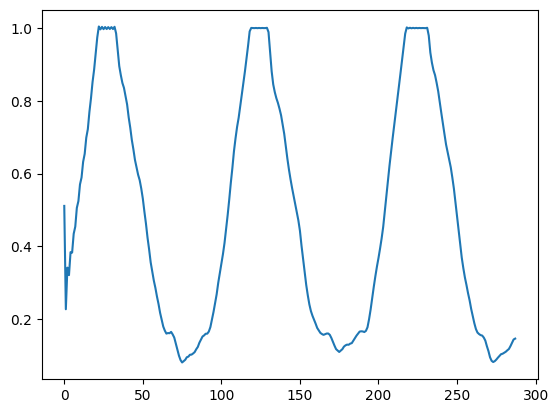

In [ ]:
plt.figure()
plt.plot(ppg_record_resample[2][:288])

plt.show()
plt.figure()
plt.plot(capno_record_resample[2][:288])
plt.show()

In [ ]:
fs = 30
cutoff = 0.1
ppg_filtered = np.array([highpass_filter(item,cutoff,fs) for item in ppg_record_resample])

In [ ]:
def taoObject(window_size):
  precoss = []
  for i in range(len(ppg_record_resample)):
    ppg_segments = []
    capno_segments = []
    for j in range(0, len(ppg_filtered[i]) - window_size + 1, window_size):
      ppg_segments.append(normalize_signal(ppg_filtered[i][j:j+window_size],-1,1))
      capno_segments.append(normalize_signal(capno_record_resample[i][j:j+window_size],0,1))
    subject_data = {
          'id': i,
          'ppg_segments': np.array(ppg_segments),     # ✅ chuyển thành np.ndarray
          'capno_segments': np.array(capno_segments)  # ✅
      }
    precoss.append(subject_data)
  return precoss

In [ ]:
obj = taoObject(30*10)

In [ ]:
train_ppg, train_capno, test_ppg, test_capno = leave_one_subject_out(obj, 0)
train_loader, test_loader0 = create_dataloader(train_ppg, test_ppg, train_capno, test_capno)

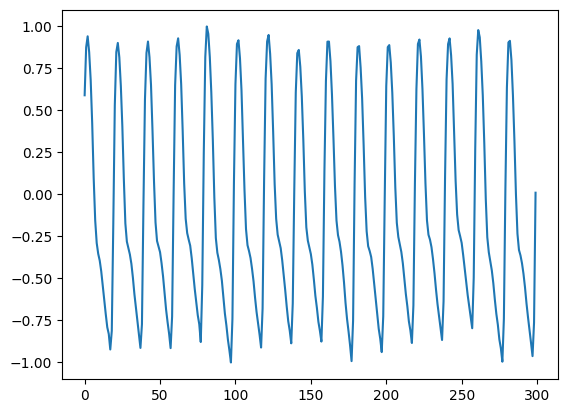

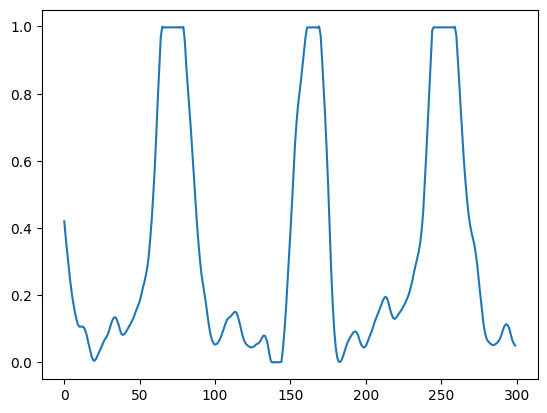

In [ ]:
plt.figure()
plt.plot(train_ppg[8])

plt.show()
plt.figure()
plt.plot(train_capno[8])
plt.show()

In [ ]:
from torch.utils.data import ConcatDataset, DataLoader

# Bước 1: Trích dataset từ mỗi test_loader
dataset0 = test_loader0.dataset
dataset1 = train_loader.dataset

# Bước 2: Kết hợp lại bằng ConcatDataset
combined_dataset = ConcatDataset([dataset0, dataset1])

# Bước 3: Tạo lại DataLoader
combined_test_loader = DataLoader(combined_dataset, batch_size=32, shuffle=False)

In [ ]:
from sklearn.model_selection import train_test_split

x0, y0 = extract_all_data(test_loader0)
x1, y1 = extract_all_data(train_loader)

x_all = torch.cat([x0, x1])
y_all = torch.cat([y0, y1])

x_train, x_test, y_train, y_test = train_test_split(
    x_all, y_all, test_size=0.2, random_state=42, shuffle=True
)

In [ ]:
y_predict = model(x_all).detach().numpy()

In [ ]:
print(len(y_predict))

2544


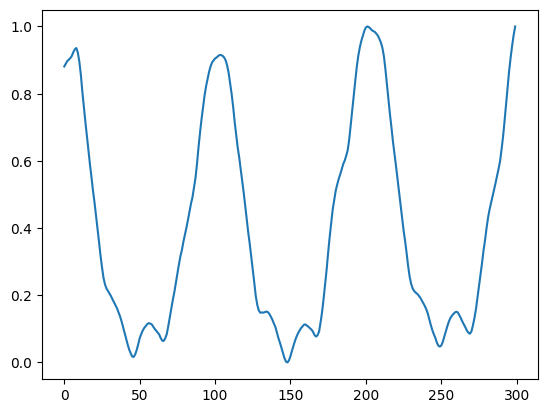

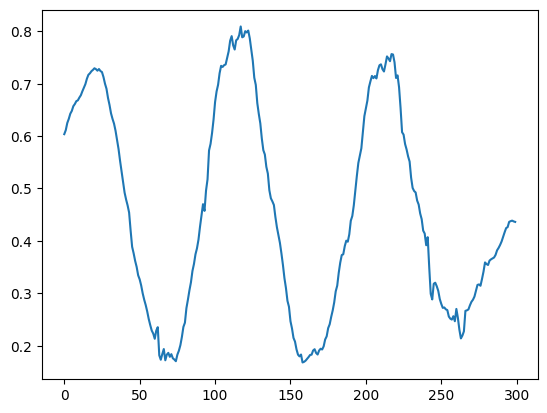

In [ ]:
plt.figure()
plt.plot(y_all[8])

plt.show()
plt.figure()
plt.plot(y_predict[8])
plt.show()

Đang đánh giá:   0%|          | 0/2544 [00:00<?, ?it/s]

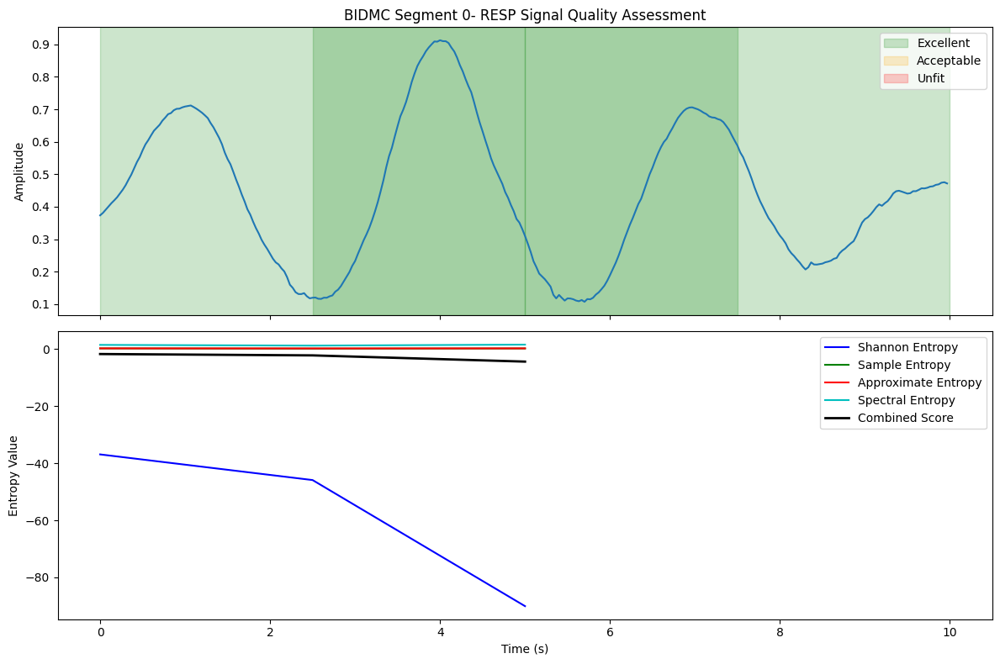

Đang đánh giá:   0%|          | 1/2544 [00:02<2:00:16,  2.84s/it]

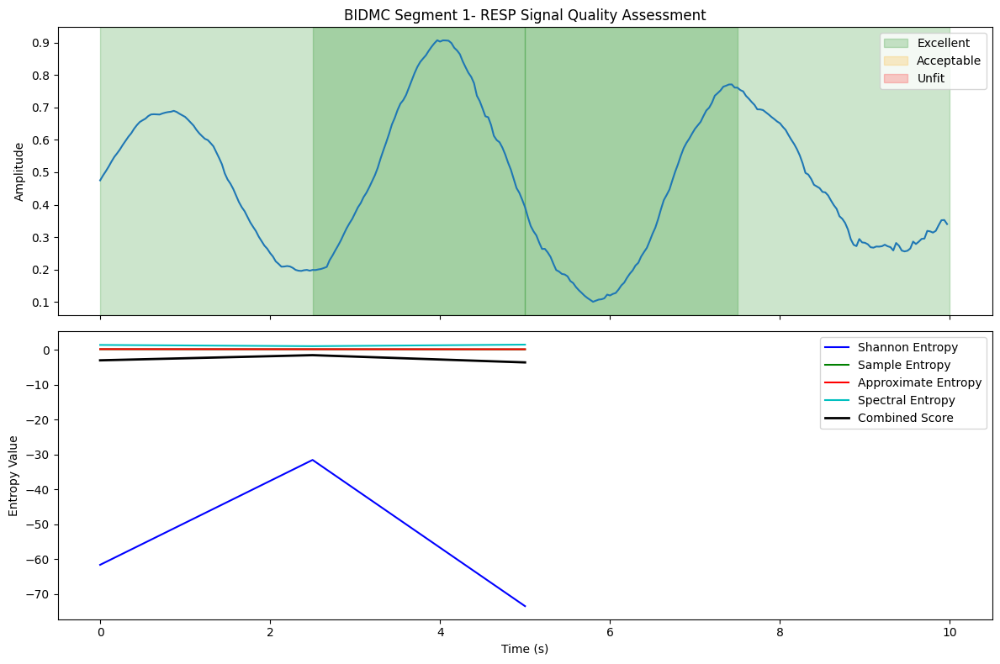

Đang đánh giá:   0%|          | 2/2544 [00:04<1:42:18,  2.41s/it]

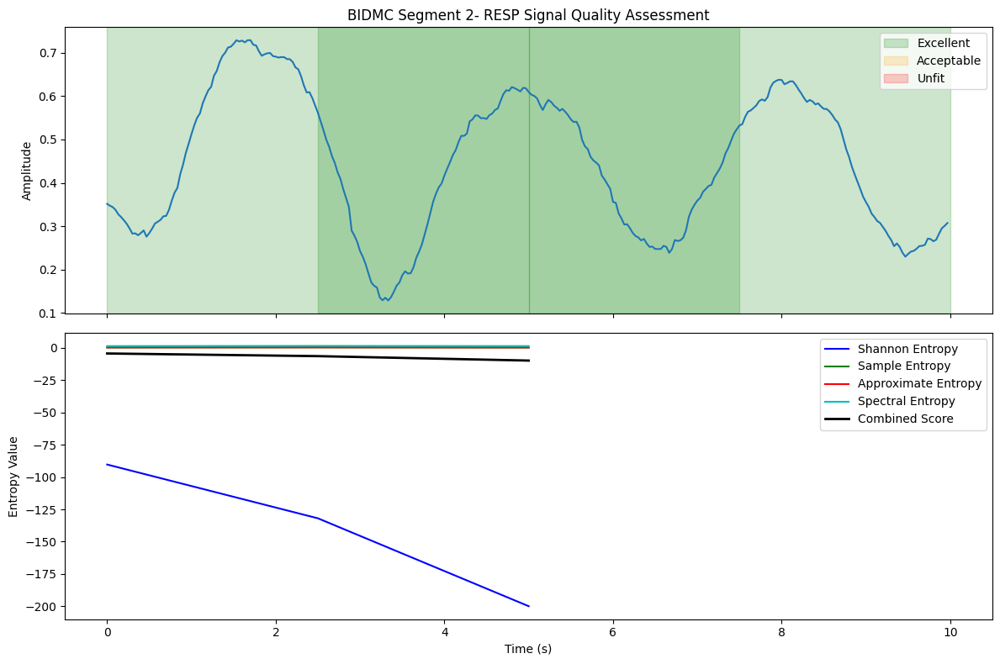

Đang đánh giá:   0%|          | 3/2544 [00:05<1:14:28,  1.76s/it]

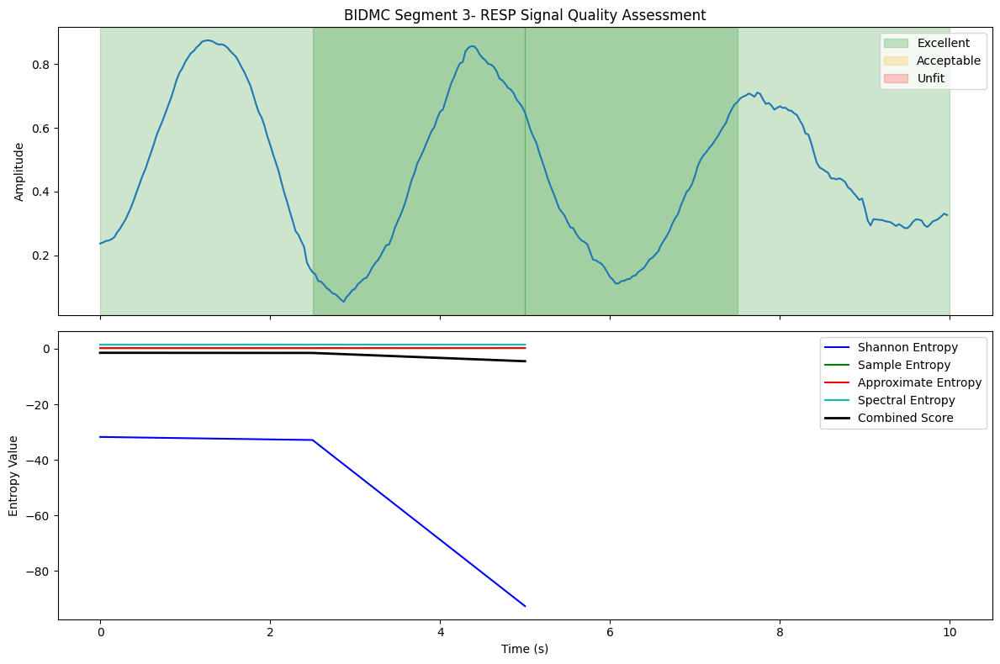

Đang đánh giá:   0%|          | 4/2544 [00:06<1:00:57,  1.44s/it]

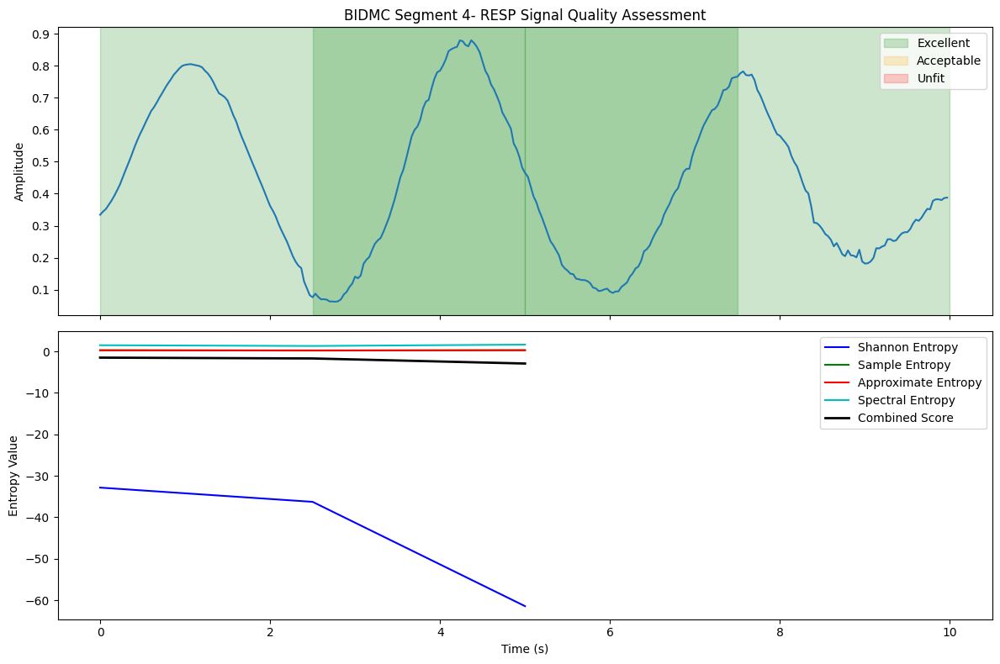

Đang đánh giá:   0%|          | 5/2544 [00:07<53:35,  1.27s/it]  

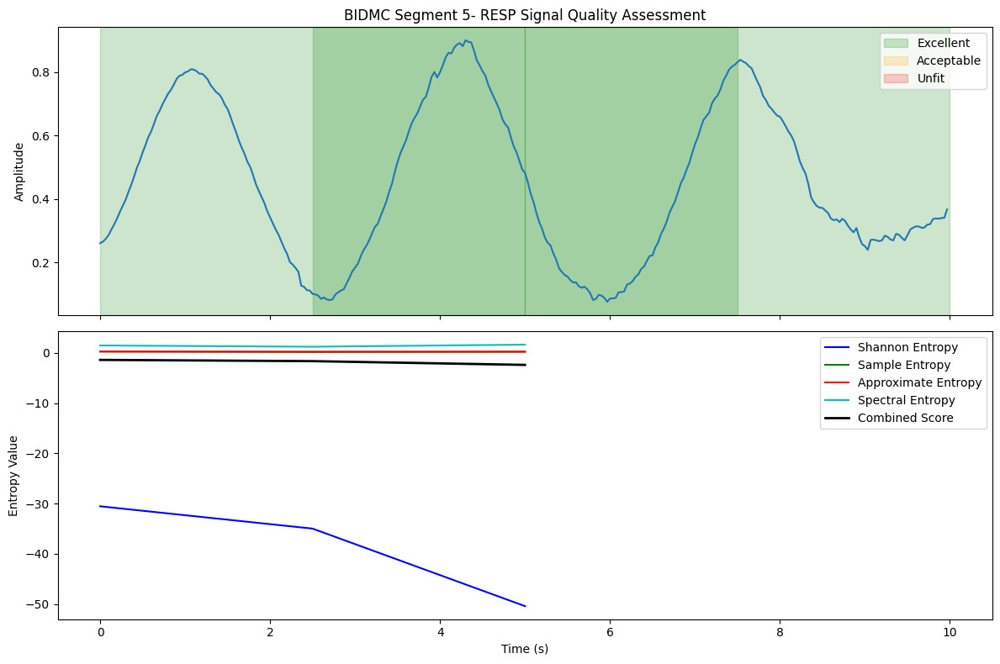

Đang đánh giá:   0%|          | 6/2544 [00:08<48:44,  1.15s/it]

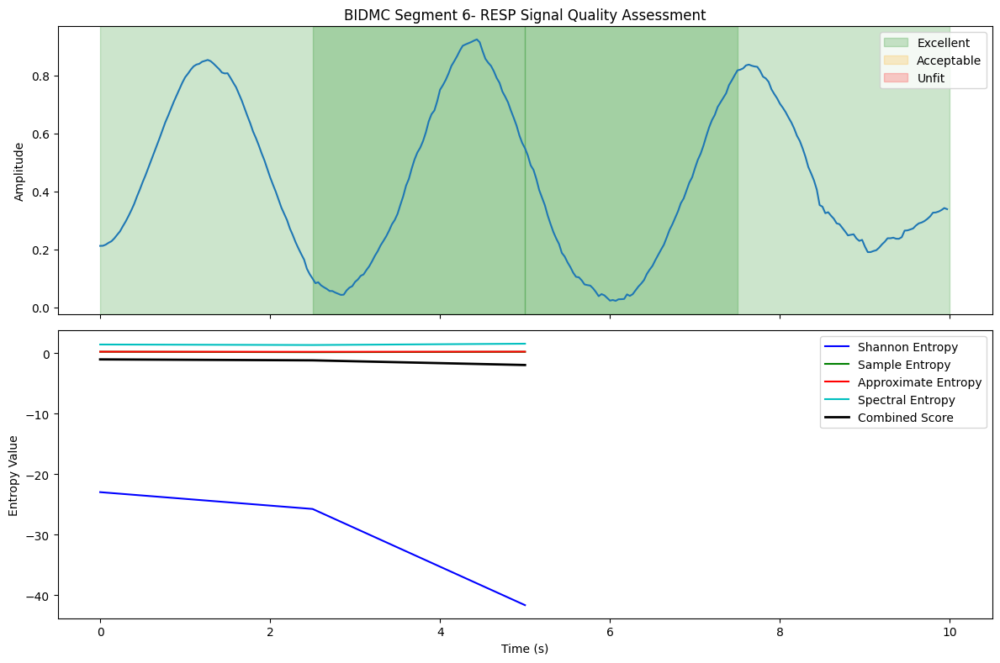

Đang đánh giá:   0%|          | 7/2544 [00:09<45:41,  1.08s/it]

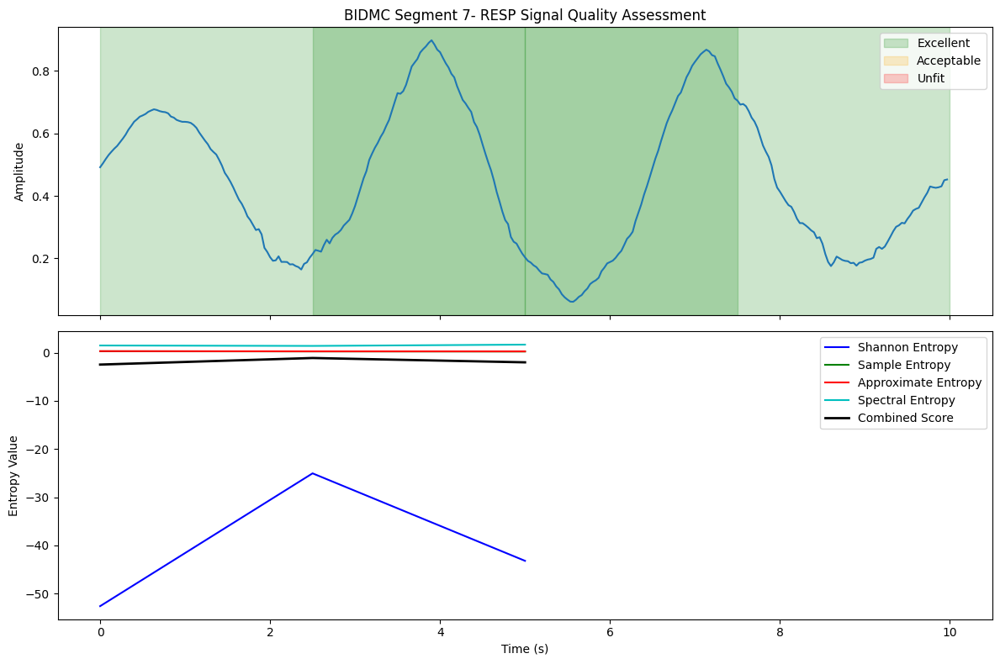

Đang đánh giá:   0%|          | 8/2544 [00:10<44:39,  1.06s/it]

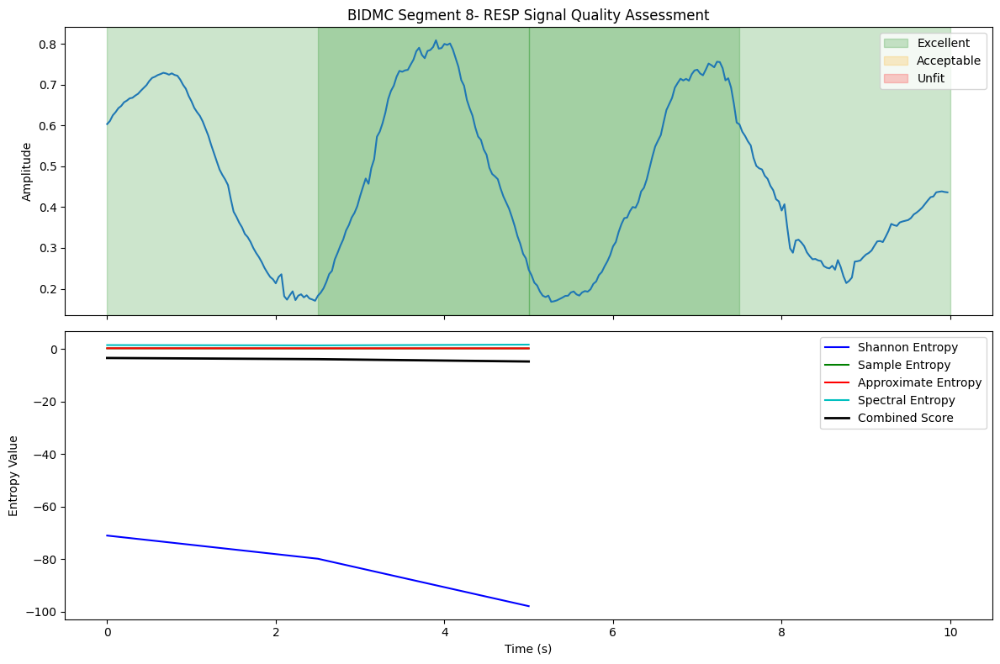

Đang đánh giá:   0%|          | 9/2544 [00:11<43:56,  1.04s/it]

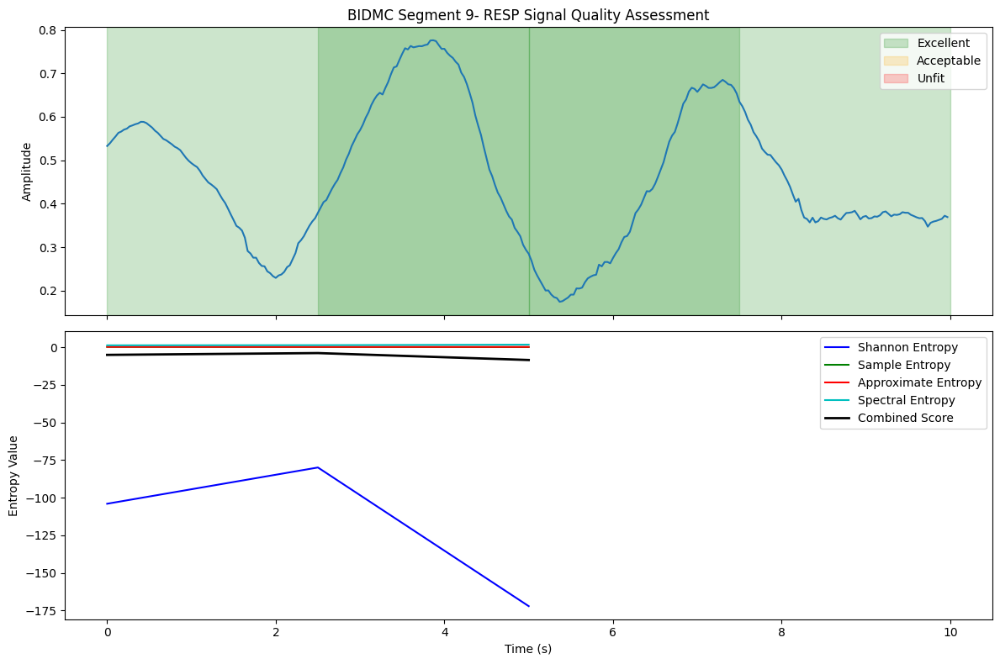

Đang đánh giá:   0%|          | 10/2544 [00:12<43:07,  1.02s/it]

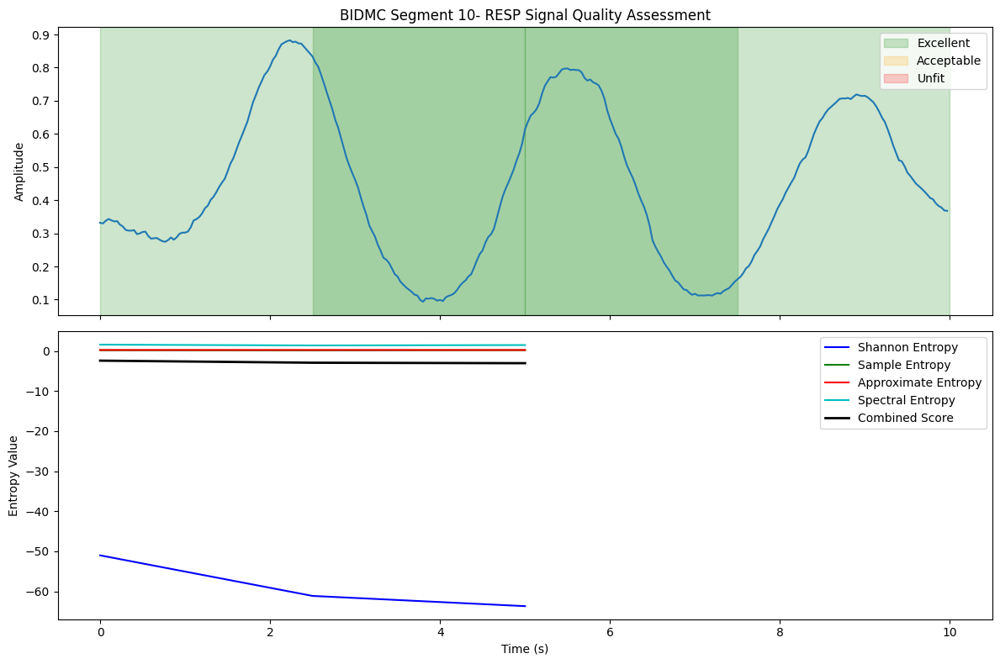

Đang đánh giá:   0%|          | 11/2544 [00:14<50:46,  1.20s/it]

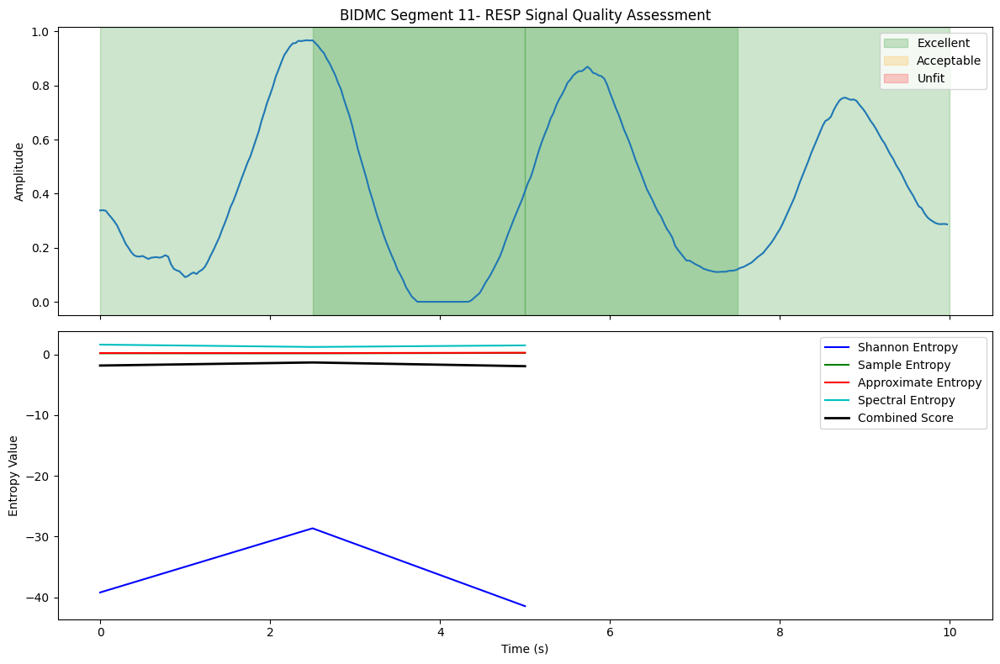

Đang đánh giá:   0%|          | 12/2544 [00:15<55:18,  1.31s/it]

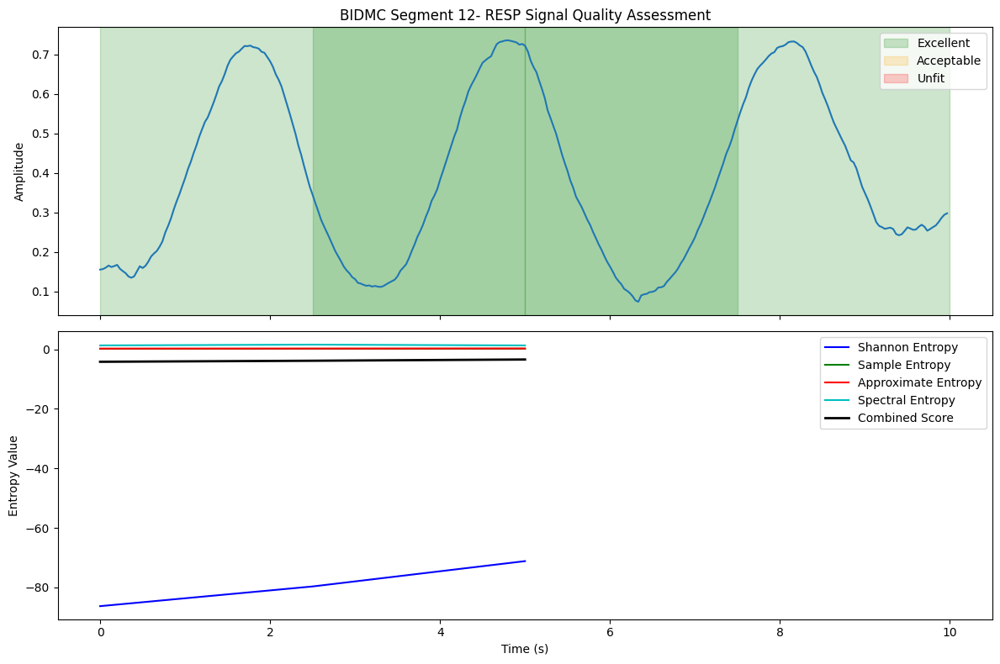

Đang đánh giá:   1%|          | 13/2544 [00:17<56:14,  1.33s/it]

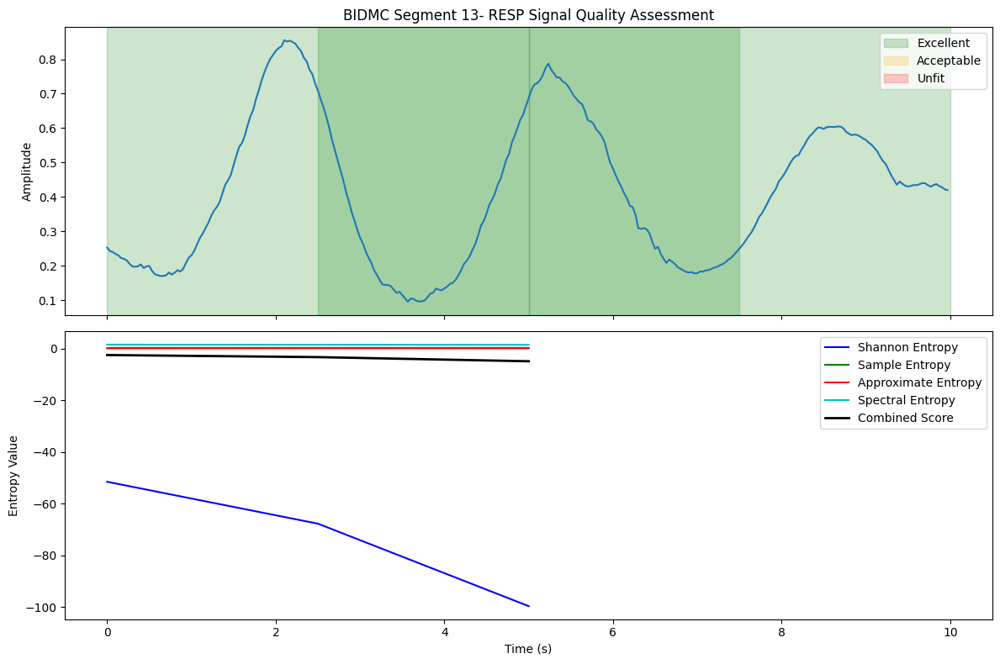

Đang đánh giá:   1%|          | 14/2544 [00:18<56:03,  1.33s/it]

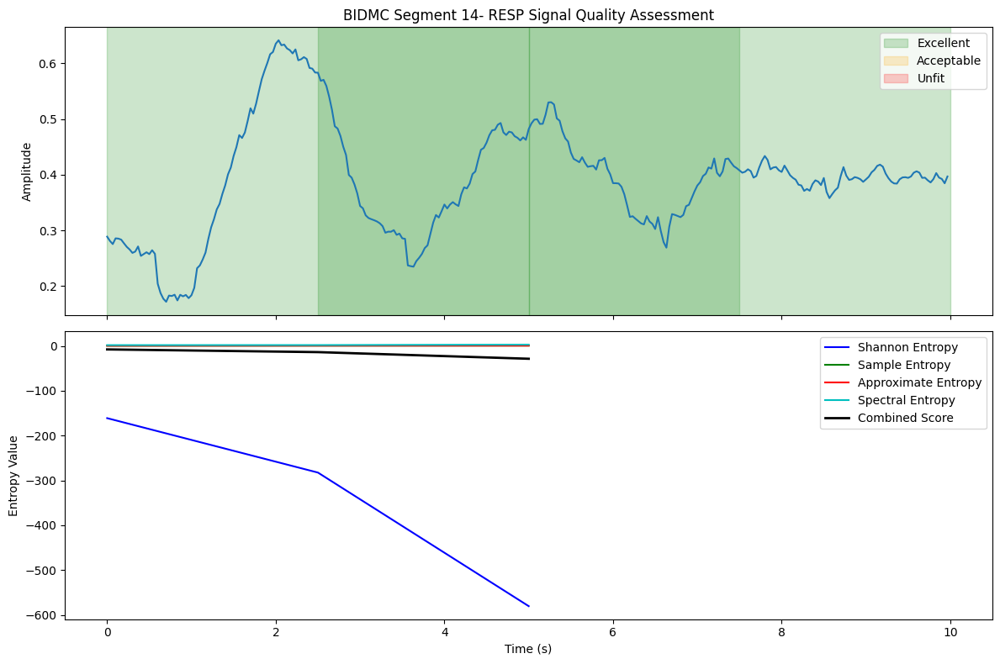

Đang đánh giá:   1%|          | 15/2544 [00:19<51:25,  1.22s/it]

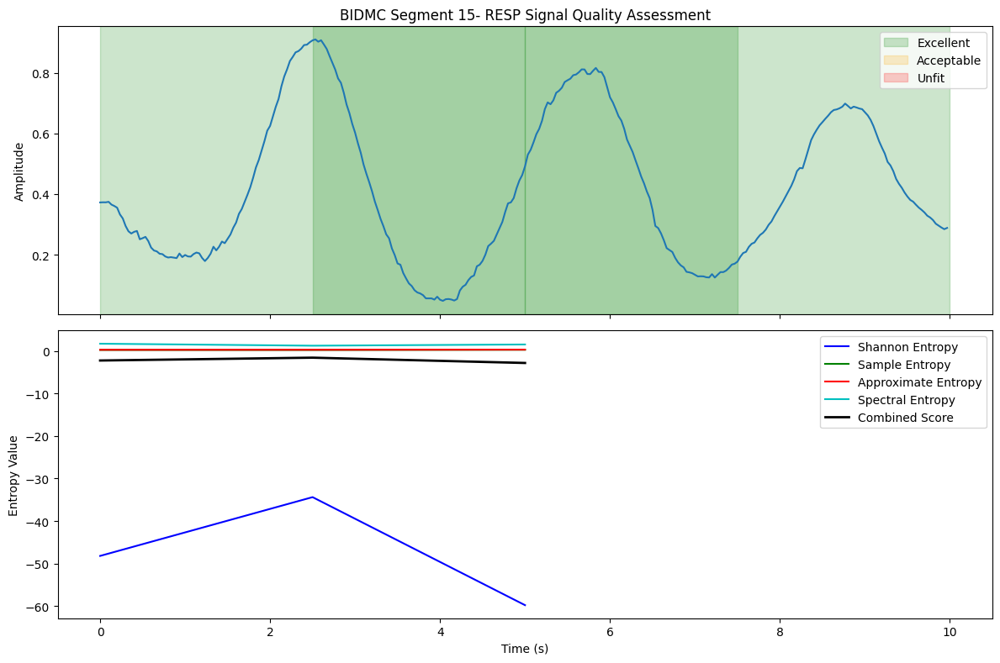

Đang đánh giá:   1%|          | 16/2544 [00:20<47:54,  1.14s/it]

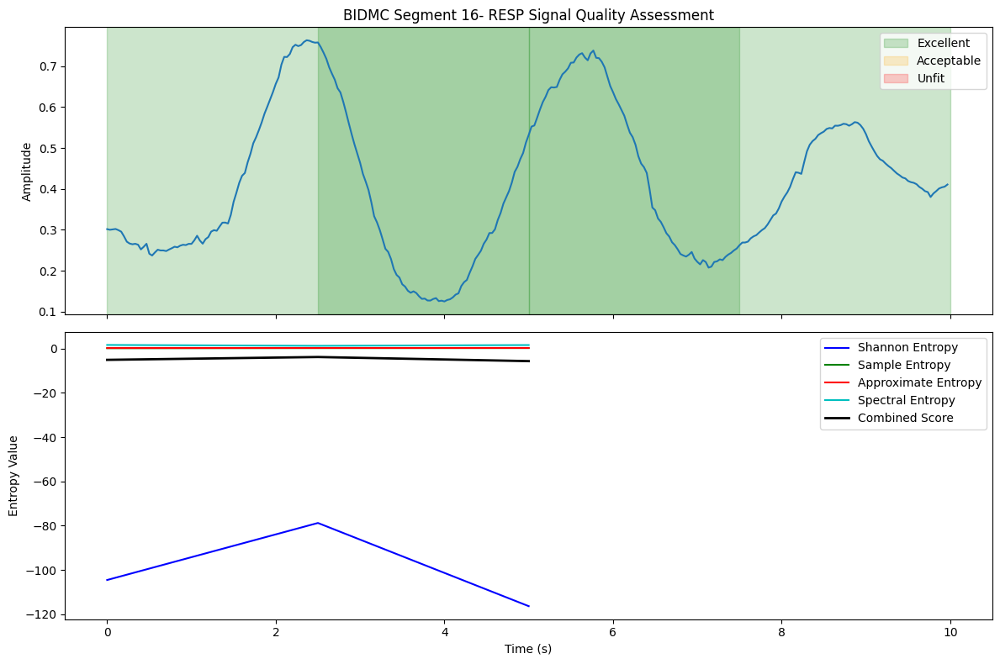

Đang đánh giá:   1%|          | 17/2544 [00:21<45:42,  1.09s/it]

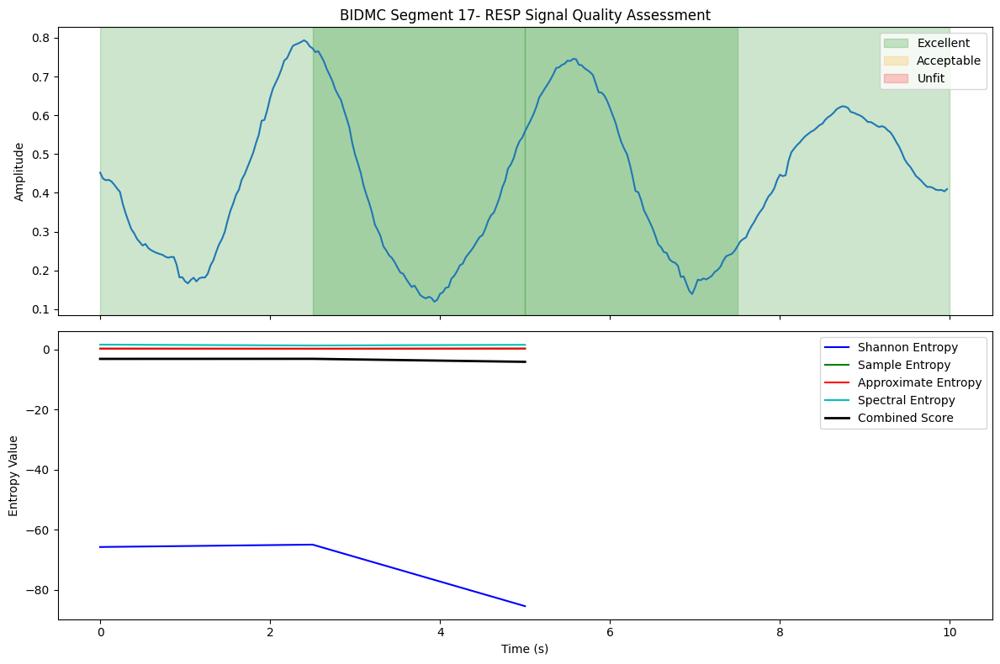

Đang đánh giá:   1%|          | 18/2544 [00:22<44:10,  1.05s/it]

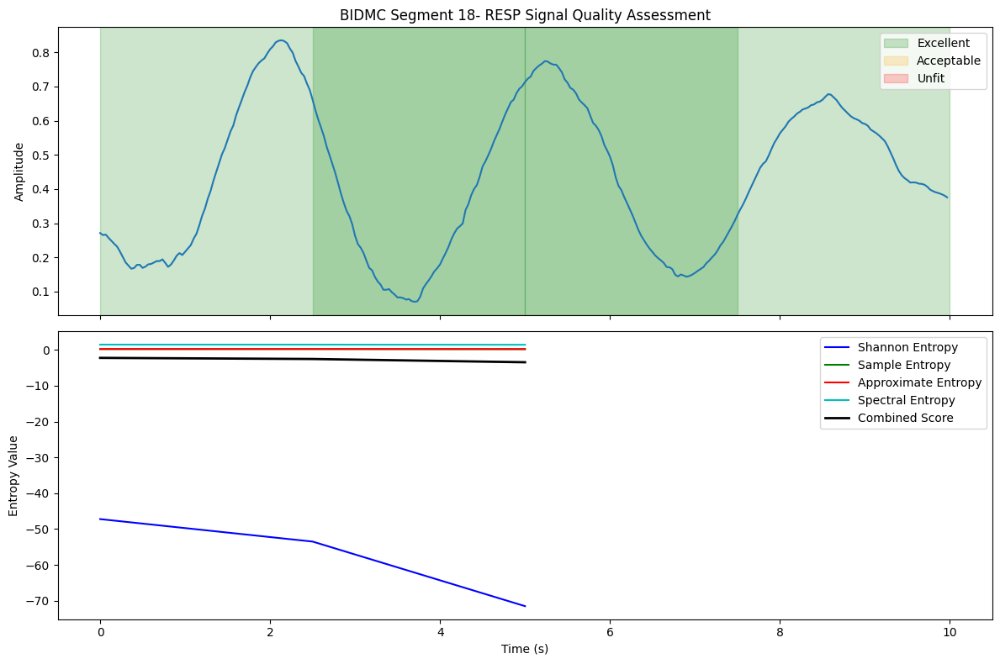

Đang đánh giá:   1%|          | 19/2544 [00:23<43:29,  1.03s/it]

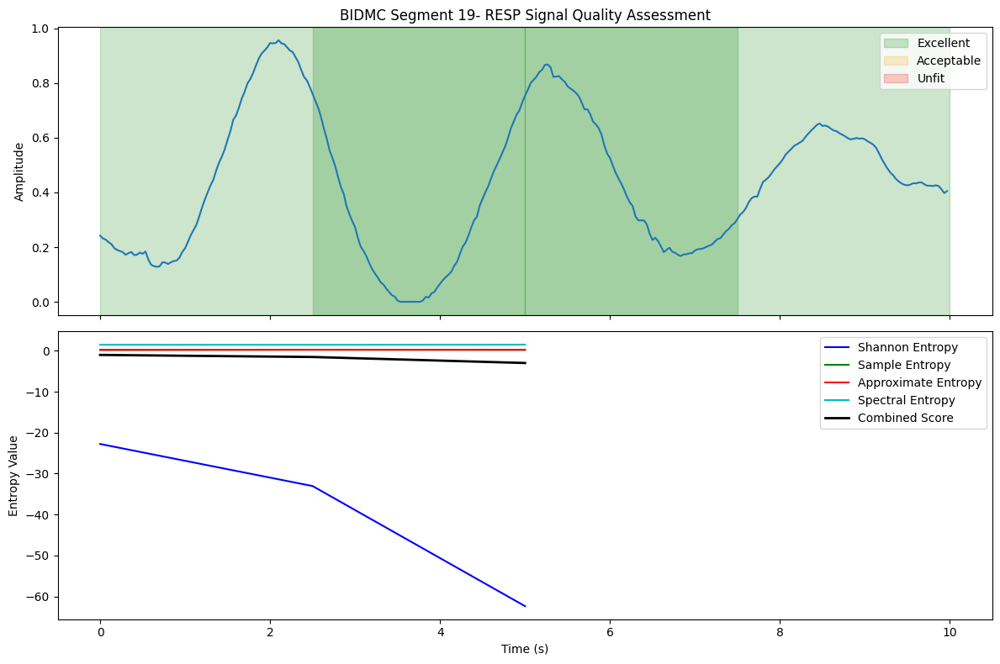

Đang đánh giá:   1%|          | 20/2544 [00:24<42:42,  1.02s/it]

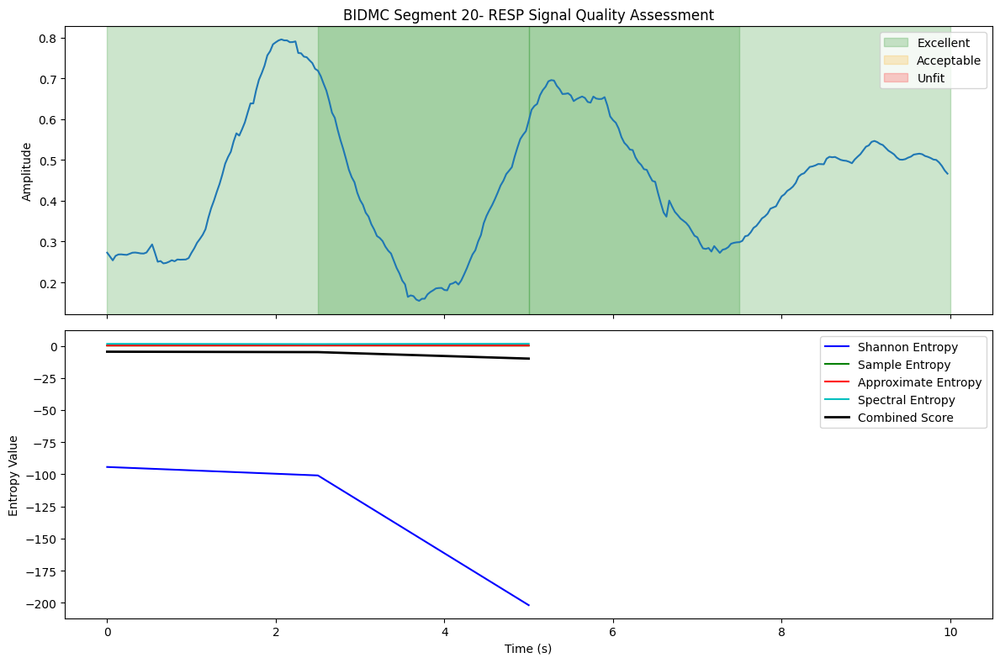

Đang đánh giá:   1%|          | 21/2544 [00:25<42:24,  1.01s/it]

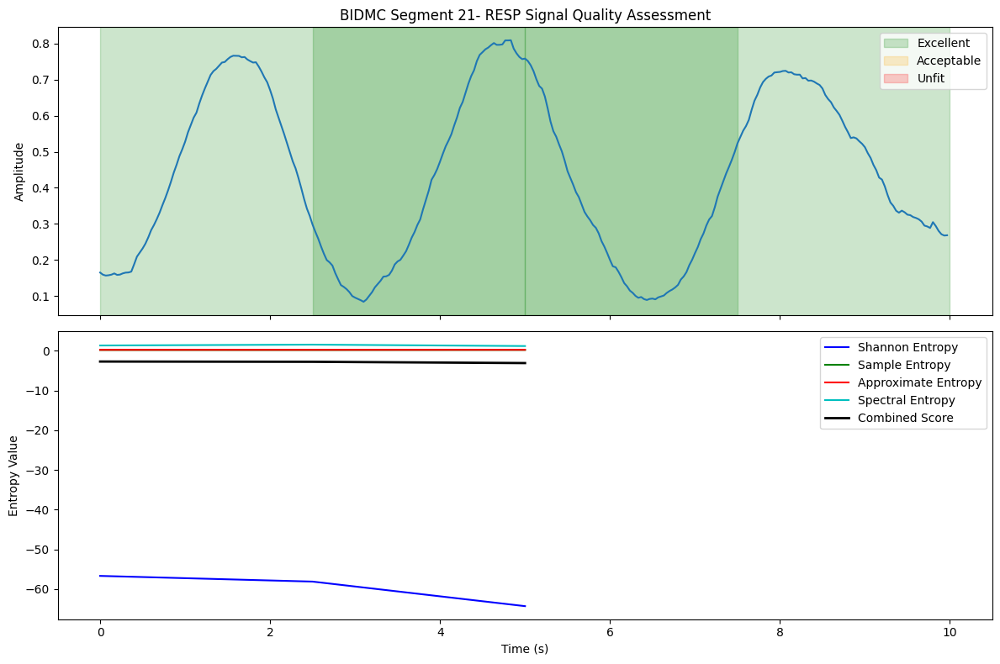

Đang đánh giá:   1%|          | 22/2544 [00:26<41:58,  1.00it/s]

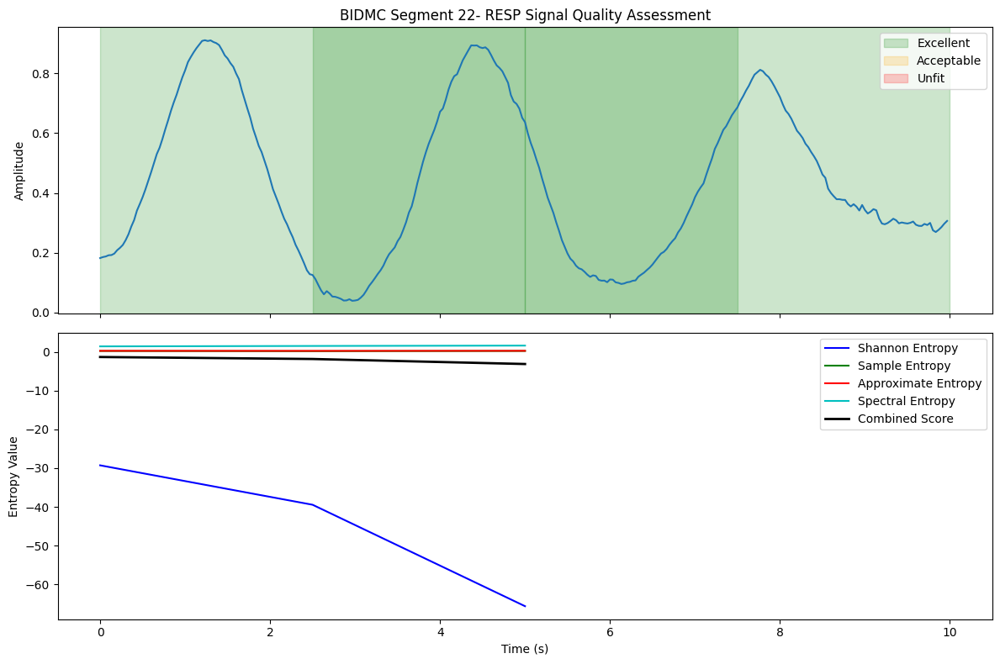

Đang đánh giá:   1%|          | 23/2544 [00:27<45:29,  1.08s/it]

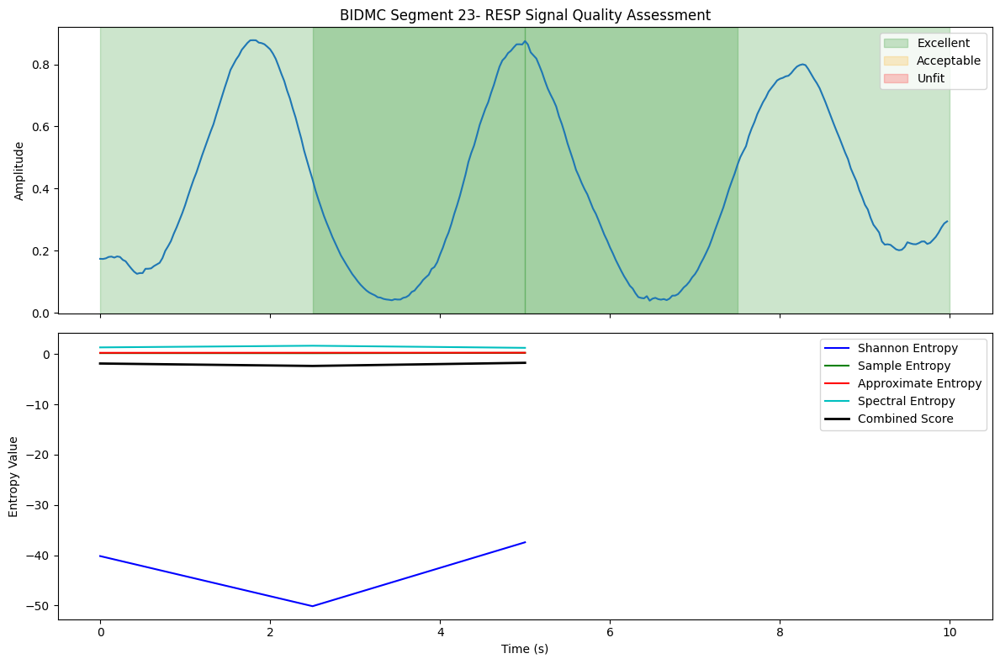

Đang đánh giá:   1%|          | 24/2544 [00:29<51:21,  1.22s/it]

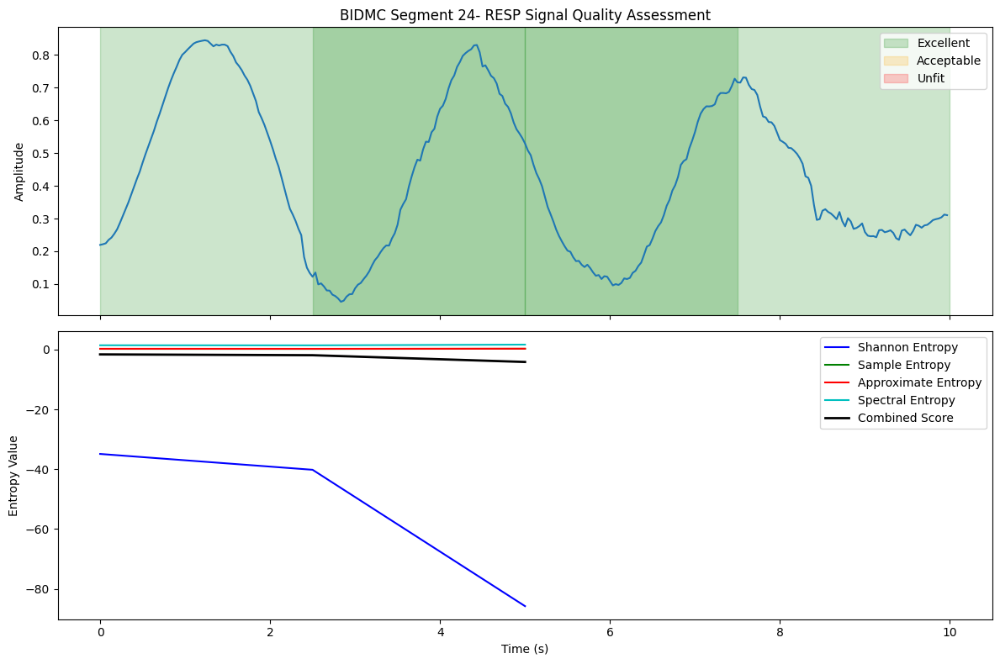

Đang đánh giá:   1%|          | 25/2544 [00:30<56:26,  1.34s/it]

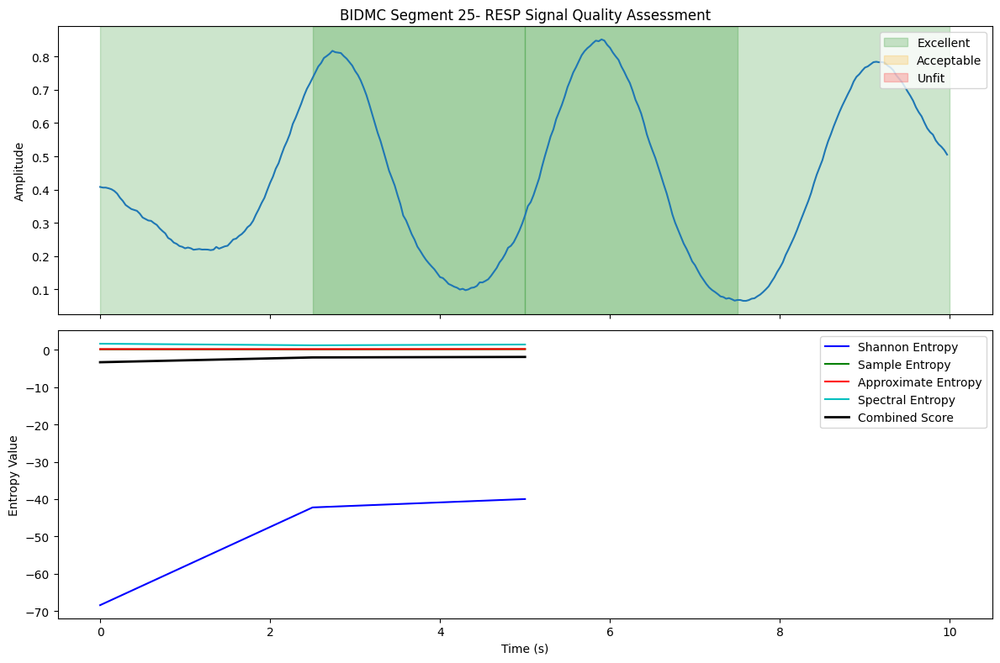

Đang đánh giá:   1%|          | 26/2544 [00:31<52:31,  1.25s/it]

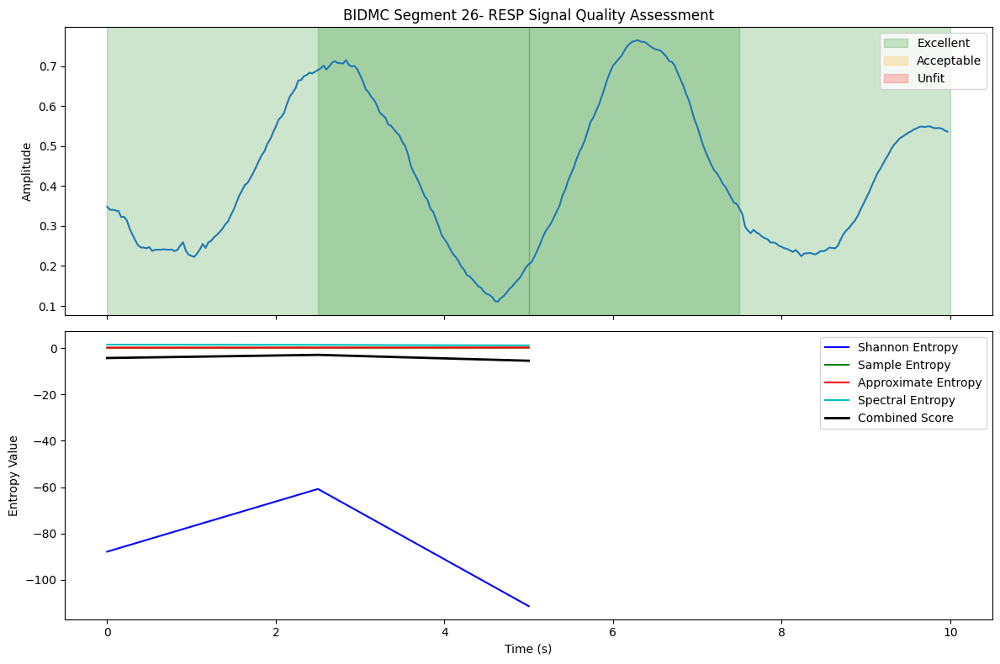

Đang đánh giá:   1%|          | 27/2544 [00:32<49:00,  1.17s/it]

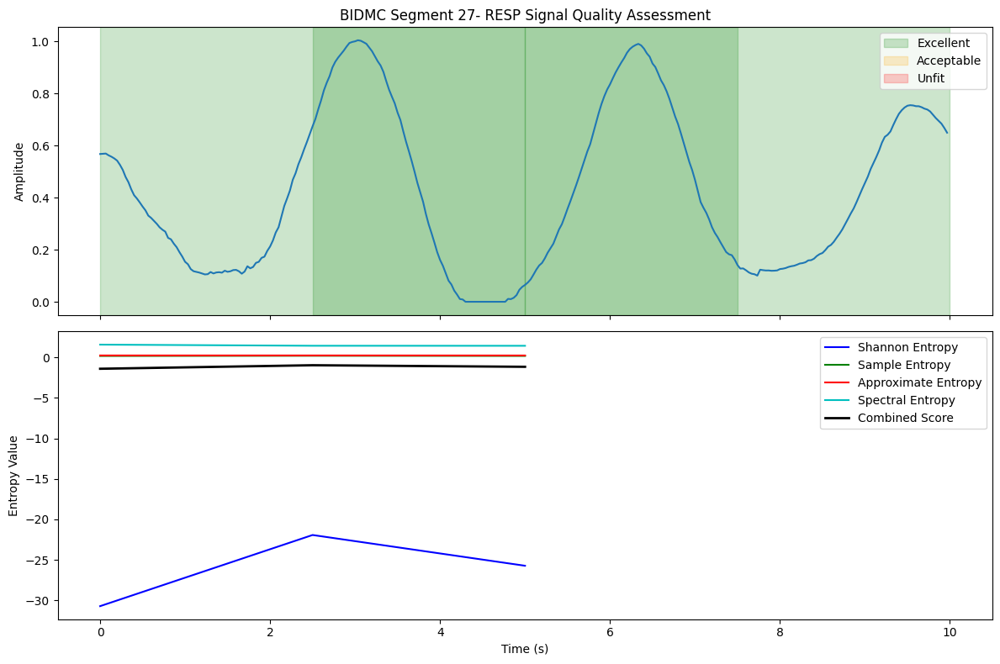

Đang đánh giá:   1%|          | 28/2544 [00:33<46:20,  1.11s/it]

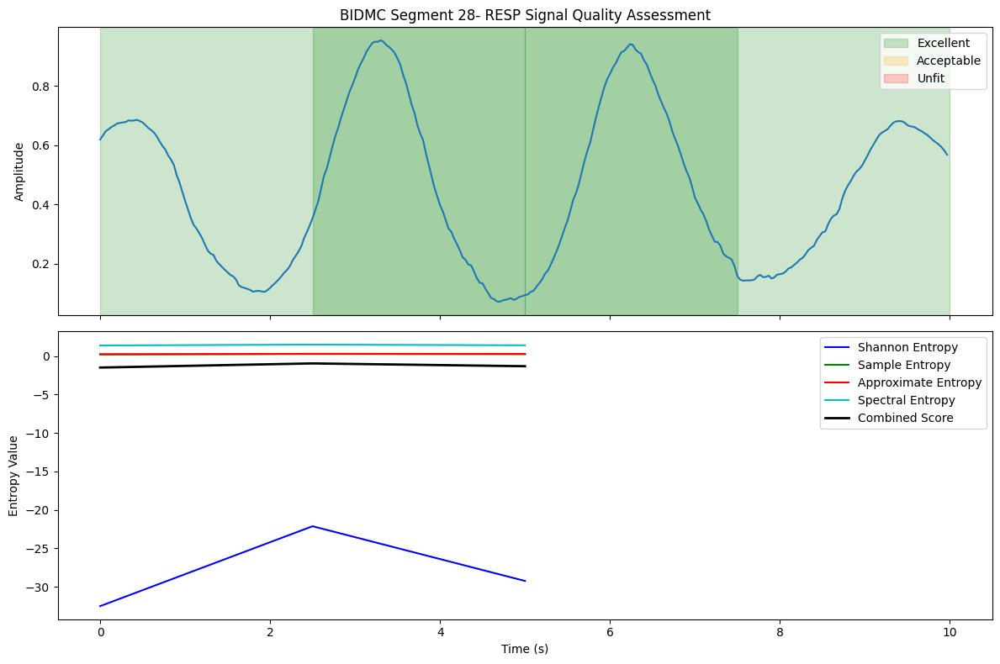

Đang đánh giá:   1%|          | 29/2544 [00:35<49:09,  1.17s/it]

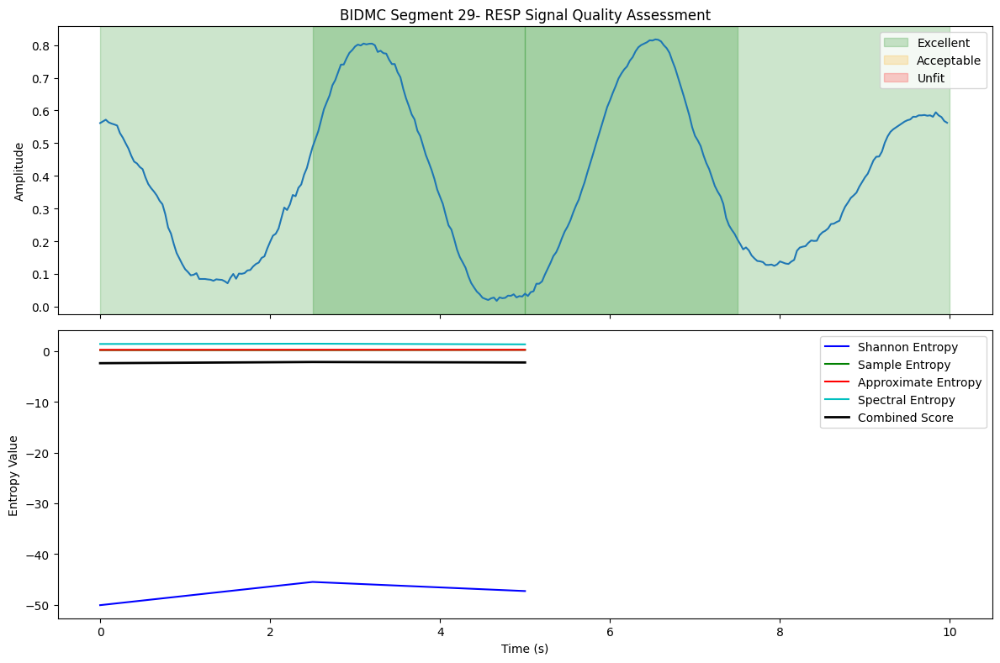

Đang đánh giá:   1%|          | 30/2544 [00:36<47:03,  1.12s/it]

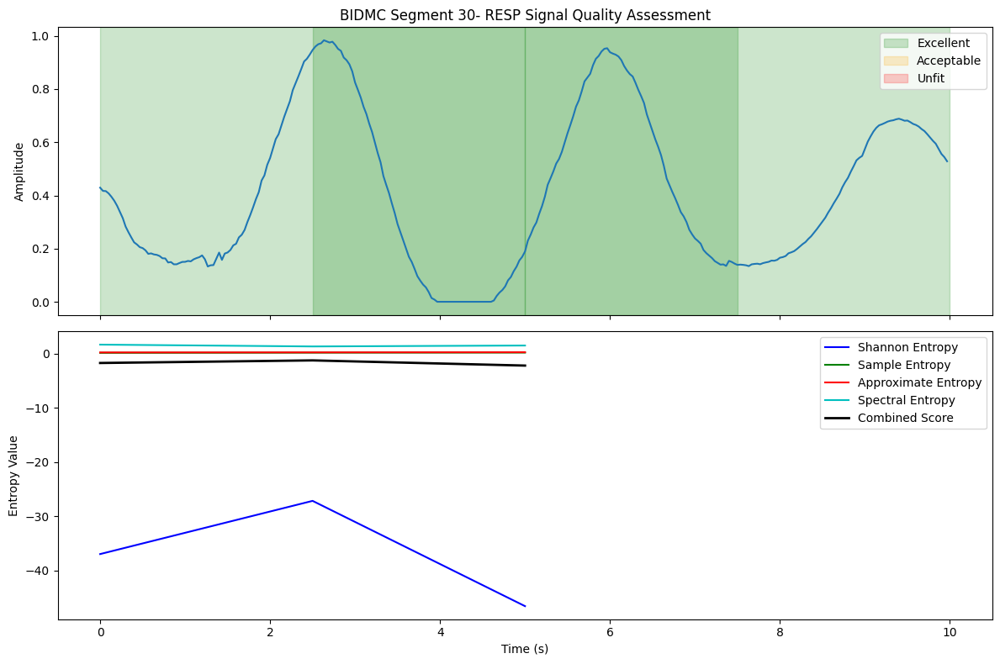

Đang đánh giá: 100%|██████████| 2544/2544 [29:11<00:00,  1.45it/s]


In [ ]:
from tqdm import tqdm
import warnings
warnings.filterwarnings("ignore", category=RuntimeWarning)
bidmc_results = []

for i, item in enumerate(tqdm(y_predict, desc="Đang đánh giá")):
    quality_results = assess_signal_quality(item, 30,5,0.5)
    quality_results['segment_id'] = i
    bidmc_results.append(quality_results)
    if (i<=30):
      fig = plot_signal_quality(item, quality_results, 30,
                         title=f"BIDMC Segment {i}- RESP Signal Quality Assessment")
      plt.show()

In [ ]:
bidmc_combined = pd.concat(bidmc_results, ignore_index=True)

In [ ]:
bidmc_combined

,start_time,end_time,shannon_entropy,sample_entropy,approximate_entropy,spectral_entropy,combined_score,quality_class,segment_id
0,0.0,5.0,-36.880442,0.280768,0.284239,1.503796,-1.698206,Excellent,0
1,2.5,7.5,-45.871766,0.212789,0.257468,1.251655,-2.172223,Excellent,0
2,5.0,10.0,-90.067881,0.257505,0.287191,1.599074,-4.355353,Excellent,0
3,0.0,5.0,-61.645235,0.249370,0.268743,1.471329,-2.943931,Excellent,1
4,2.5,7.5,-31.536592,0.237143,0.243637,1.113515,-1.461056,Excellent,1
...,...,...,...,...,...,...,...,...,...
7627,2.5,7.5,-25.046864,0.189745,0.208828,1.472321,-1.128906,Excellent,2542
7628,5.0,10.0,-36.254247,0.193121,0.194268,1.475543,-1.690512,Excellent,2542
7629,0.0,5.0,-416.592177,0.303896,0.346061,1.518601,-20.672434,Excellent,2543
7630,2.5,7.5,-328.486298,0.350361,0.390333,1.825915,-16.240432,Excellent,2543


In [ ]:
# Calculate overall quality distribution
quality_counts = bidmc_combined['quality_class'].value_counts()
quality_percentages = quality_counts / len(bidmc_combined) * 100

print("\nOverall BIDMC Resp Quality Distribution:")
for quality, percentage in quality_percentages.items():
    print(f"{quality}: {percentage:.1f}%")


Overall BIDMC Resp Quality Distribution:
Excellent: 100.0%


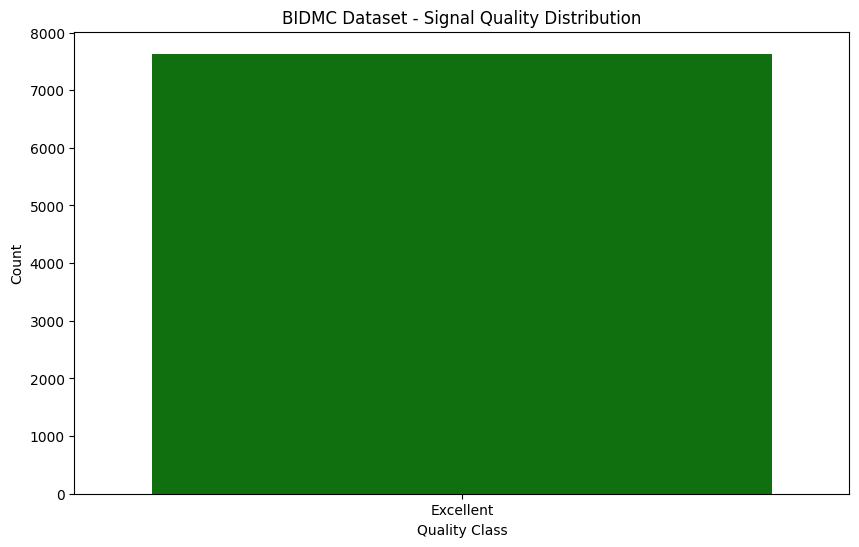

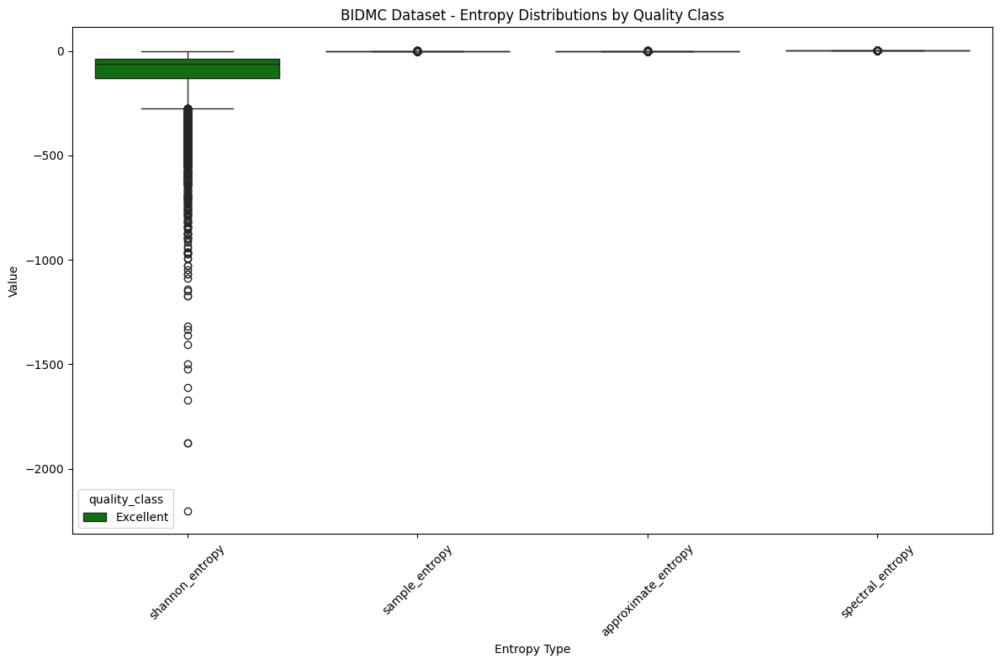

In [ ]:
# Plot quality distribution
plt.figure(figsize=(10, 6))
sns.countplot(x='quality_class', hue='quality_class', data=bidmc_combined, palette={'Excellent': 'green', 'Acceptable': 'orange', 'Unfit': 'red'}, legend=False)
plt.title('BIDMC Dataset - Signal Quality Distribution')
plt.xlabel('Quality Class')
plt.ylabel('Count')
plt.show()

# Plot entropy distributions
plt.figure(figsize=(12, 8))
entropy_cols = ['shannon_entropy', 'sample_entropy', 'approximate_entropy', 'spectral_entropy']
bidmc_melted = pd.melt(bidmc_combined, id_vars=['quality_class'], value_vars=entropy_cols, var_name='Entropy Type', value_name='Value')
sns.boxplot(x='Entropy Type', y='Value', hue='quality_class', data=bidmc_melted, palette={'Excellent': 'green', 'Acceptable': 'orange', 'Unfit': 'red'})
plt.title('BIDMC Dataset - Entropy Distributions by Quality Class')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()